# This file works with FILAMENT ERUPTION and 2012 Filament track information

In [1]:
from sunpy.net import hek
from sunpy.net import hek2vso
import matplotlib.pyplot as plt
%matplotlib inline
import shapely
from shapely.wkt import dumps, loads
import numpy as np
import pandas as pd
from shapely.geometry.polygon import LinearRing, Polygon
from datetime import timedelta
import datetime
from sunpy.time import *
from dateutil.parser import parse
import matplotlib.cm as cm
import matplotlib as mpl
from operator import itemgetter
from itertools import groupby
import itertools
import operator
from datetime import timedelta
from openpyxl import Workbook
import csv
import time 

In [2]:
#gets eruption data
client = hek.HEKClient()
h2v = hek2vso.H2VClient()
tstart = '2012/01/01 00:00:00'
tend = '2012/12/31 23:59:59'
event_type = 'FE'
eruptions = client.query(hek.attrs.Time(tstart,tend),hek.attrs.EventType(event_type))
vso_records = h2v.translate_and_query(eruptions[10])

In [4]:
def TotalSunPlot(eruptions_good, eruptions_okay, trackno, filament):
    plt.grid(True)
    plt.ylabel('ycoord (arcsec)',fontsize=18)
    plt.xlabel('xcoord (arcsec)',fontsize=18)
    plt.axis([-1500, 1500, -1500, 1500]) 
    longitude2 = [elem["hpc_x"] for elem in eruptions_okay]
    latitude2 = [elem["hpc_y"] for elem in eruptions_okay]
    fig=plt.scatter(longitude2,latitude2,color='red',s=40)
    longitude3 = [elem["hpc_x"] for elem in eruptions_good]
    latitude3 = [elem["hpc_y"] for elem in eruptions_good]
    fig=plt.scatter(longitude3,latitude3,color='blue',s=50)
    Circle1 = plt.Circle((0,0), radius=1000, linestyle='solid', linewidth=2, fill=False)
    fig1 = plt.gcf()
    fig1.gca().add_artist(Circle1)
    fig1.set_size_inches(10.5,10.5)
    ax = fig1.add_subplot(111)
    ax.set_aspect('equal')
    ax.tick_params(axis='both', which='major', labelsize=14)
    plt.title('Filament Eruptions Intersect and are Contained in Filaments, October 2013')
    norm = mpl.colors.Normalize(vmin=0, vmax=280)
    cmap = plt.get_cmap('CMRmap')
    m = cm.ScalarMappable(norm=norm, cmap=cmap)
    scale= m.to_rgba(trackno)
    if trackno in close:
        cmap = plt.get_cmap('Reds')
        norm = mpl.colors.Normalize(vmin=5, vmax=3000)
        m = cm.ScalarMappable(norm=norm, cmap=cmap)
        scale= m.to_rgba(trackno)
        plot_polygon=plt.Polygon(loads(filament).exterior,color=scale,linewidth=2,fill=None)
        fig1.gca().add_artist(plot_polygon)
    if trackno in contained: 
        norm = mpl.colors.Normalize(vmin=0, vmax=3000)
        cmap = plt.get_cmap('winter')
        m = cm.ScalarMappable(norm=norm, cmap=cmap)
        scale= m.to_rgba(trackno)
        plot_polygon=plt.Polygon(loads(filament).exterior,color=scale,linewidth=2,fill=None)
        fig1.gca().add_artist(plot_polygon)                          
    box = [elem["hpc_bbox"] for elem in eruptions_okay]    #plotting only those eruptions boxes that intersect with filaments
    for elem in box:
        plot_box=plt.Polygon(loads(elem).exterior,color='red',linewidth=1,fill=None)
        fig1.gca().add_artist(plot_box)
    
def SetupSunPlotColor(eruptions, trackno, filament):
    plt.grid(True)
    plt.ylabel('ycoord (arcsec)',fontsize=18)
    plt.xlabel('xcoord (arcsec)',fontsize=18)
    plt.axis([-1500, 1500, -1500, 1500])
    cmap = plt.get_cmap('nipy_spectral')
    norm = mpl.colors.Normalize(vmin=0, vmax=3000)
    m = cm.ScalarMappable(norm=norm, cmap=cmap)
    scale= m.to_rgba(trackno)
    longitude = [elem["hpc_x"] for elem in eruptions]  #plotting only those eruptions that are contained in filaments 
    latitude = [elem["hpc_y"] for elem in eruptions]   #plotting only those eruptions that are contained in filaments
    for x,y in zip(longitude, latitude):
        fig=plt.scatter(x, y, color=next(colors),s=50)
    Circle1 = plt.Circle((0,0), radius=1000, linestyle='solid', linewidth=2, fill=False)
    fig1 = plt.gcf()
    fig1.gca().add_artist(Circle1)
    fig1.set_size_inches(10.5,10.5)
    ax = fig1.add_subplot(111)
    ax.set_aspect('equal')
    ax.tick_params(axis='both', which='major', labelsize=14)
    plt.title('Track 94, January 2012')
    plot_polygon=plt.Polygon(loads(filament).exterior,color=scale,linewidth=1,fill=None)
    fig1.gca().add_artist(plot_polygon) 

       
def SetupSunPlotBox(eruptions, trackno, filament):
    plt.grid(True)
    plt.ylabel('ycoord (arcsec)',fontsize=18)
    plt.xlabel('xcoord (arcsec)',fontsize=18)
    plt.axis([-1500, 1500, -1500, 1500])
    longitude = [elem["hpc_x"] for elem in eruptions] #plotting only those eruptions that intersect with  filaments
    latitude = [elem["hpc_y"] for elem in eruptions]
    fig=plt.scatter(longitude,latitude,color='black',s=50) 
    Circle1 = plt.Circle((0,0), radius=1000, linestyle='solid', linewidth=2, fill=False)
    fig1 = plt.gcf()
    fig1.gca().add_artist(Circle1)
    fig1.set_size_inches(10.5,10.5)
    ax = fig1.add_subplot(111)
    ax.set_aspect('equal')
    ax.tick_params(axis='both', which='major', labelsize=14)
    plt.title('Filament Eruptions (Bounds) that Intersect Filaments, October 2013')
    box = [elem["hpc_bbox"] for elem in eruptions]    #plotting only those eruptions boxes that intersect with filaments
    for elem in box:
        plot_box=plt.Polygon(loads(elem).exterior,color='black',linewidth=1,fill=None)
        fig1.gca().add_artist(plot_box) 
    norm = mpl.colors.Normalize(vmin=0, vmax=3000)
    cmap = plt.get_cmap('nipy_spectral')
    m = cm.ScalarMappable(norm=norm, cmap=cmap)
    scale= m.to_rgba(trackno) 
    plot_polygon=plt.Polygon(loads(filament).exterior,color=scale,linewidth=1,fill=None)
    fig1.gca().add_artist(plot_polygon)

        

In [5]:
### the following loop will remove identical eruptions that have been recorded at different wavelengths by sorting with time
times=[elem["event_starttime"] for elem in eruptions] 
result=[]
indices=[]
for element in times:
    if element not in result:
        indices.append((times.index(element)))
        result.append(element)
filtered=[eruptions[i] for i in indices] #creates a filtered list of objects that are not indentical

# The following kernel reads in the tracking document, groups the data by track number, and adds  "null" data for all tracks that have less than three entries. 

In [3]:
fi_tracked = pd.read_csv('FIDustinTracked_2012.txt',delimiter='\t')
fi_tracked.head()
tracks=fi_tracked['Track No.']
good_tracks = fi_tracked.groupby('Track No.').filter(lambda x: len(x['Track No.']) >= 3, dropna=False) 

# The following kernel looks at both "good tracks" (tracks with 3 or more elements) and "filtered" eruption data (data that does not occur at multiple wavelengths). The code loops through the list of filtered eruptions and checks if any eruption is contained inside a good track (also iterated through with a loop). 

In [7]:
margin = datetime.timedelta(hours=12)             
FT_time = good_tracks['HEK_time']    #Finds the time stamps for all the filaments
FE_time = [elem["event_starttime"] for elem in filtered] #Finds the time stamps for all the eruptions
FT_poly = good_tracks['HPC_BB_Poly']    #Finds the polygon coordinates for the good_tracks
FE_coords = [elem["hpc_coord"] for elem in filtered] #Finds the point coordinates for the filtered eruptions 
contained=[]    ####This will be a helpful list for finding which tracks have eruptions contained inthem 
loopnumb=[]    #to keep track of the eruption number 
practice=[]
for j in range(0, len(FE_coords)):    #looks at all possible eruptions 
    FET=(parse_time(FE_time[j])) 
    FE_point_obj = loads(FE_coords[j]) #creates a shapely point object
    for i in range(0, len(FT_poly)):  #looks at all possible tracks 
        if pd.isnull(FT_poly[i]):   #skips over tracks of less than 3 elements 
            pass
        else:   
            FLT=parse(FT_time[i]) 
            FT_poly_obj = loads(FT_poly[i])   #creates polygon object from track
            if FT_poly_obj.contains(FE_point_obj) and FET-margin <= FLT <= FET + margin: #checks if point is contained in polygon 
                contained.append(good_tracks['Track No.'][i])   #finds the track number of these tracks 
                loopnumb.append(j)
                print FE_time[j]
                practice.append((FE_time[j], good_tracks['Track No.'][i]))
                print "This means that the eruption point is contained in the filament polygon"
                print j,i
                #print FT_poly_obj.area
erup=[indices[i] for i in loopnumb]   #getting the eruption index from a list of possible indices
filtered2=[eruptions[i] for i in erup]   #eruption data that correspond to being contained in a filament 
print erup

2012-06-08T13:40:04
This means that the eruption point is contained in the filament polygon
122 3429
2012-07-11T07:30:04
This means that the eruption point is contained in the filament polygon
144 4485
[334, 372]


# The following kernel looks at both "good tracks" (tracks with 3 or more elements) and "filtered" eruption data. The code loops through the list of filtered eruption and checks if any eruption occurs near the start time of a filament (also iterated through with a loop)

In [8]:
good_polygons=[] #Trying to find polygon data for the filaments that contained eruptions and at a good time 
for i in range(len(good_tracks)): #iterating through the whole list of tracks 
    if good_tracks['Track No.'][i] in contained:  #if the track number is in the lists created previously 
         good_polygons.append((good_tracks['Track No.'][i],good_tracks['HPC_BB_Poly'][i]))#append the polygon data to good polygons

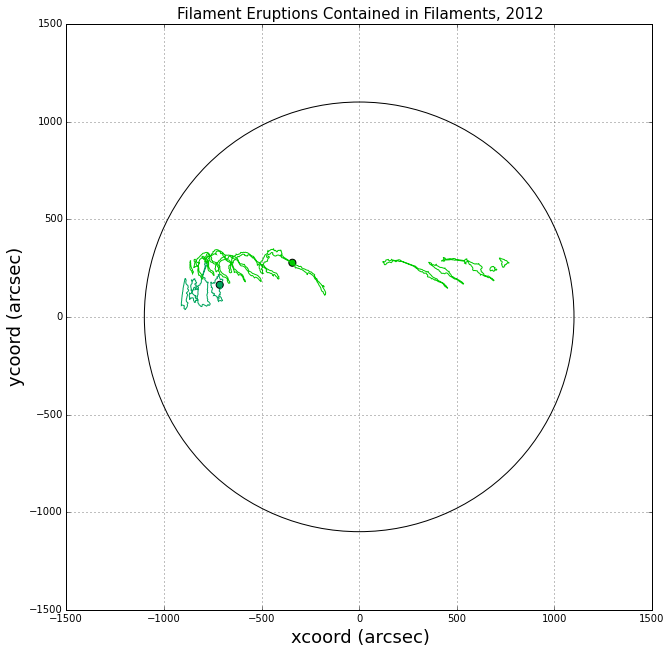

[1246.0, 1568.0]


In [26]:
####makes a colorscale for the eruptions
colorscale=[]
norm = mpl.colors.Normalize(vmin=0, vmax=3000)
cmap = plt.get_cmap('nipy_spectral')
m = cm.ScalarMappable(norm=norm, cmap=cmap)
for item in contained: #plotting those filaments that have eruptions contained within them
    scale1= m.to_rgba(item) 
    colorscale.append(scale1)

####plots eruptions/sun 
plt.grid(True)
plt.ylabel('ycoord (arcsec)',fontsize=18)
plt.xlabel('xcoord (arcsec)',fontsize=18)
plt.axis([-1500, 1500, -1500, 1500])
longitude = [elem["hpc_x"]for elem in filtered2]
latitude = [elem["hpc_y"] for elem in filtered2]
fig=plt.scatter(longitude,latitude,c= colorscale,s=50)
Sun=plt.Circle((0,0), radius=1100, color='black', fill=False)
plt.gcf().gca().add_artist(Sun)
plt.title('Filament Eruptions Contained in Filaments, 2012', fontsize = 15)
fig1 = plt.gcf()
fig1.set_size_inches(10.5,10.5)
ax = fig1.add_subplot(111)
ax.set_aspect('equal') 

####plots filament tracks 
for poly in good_polygons: 
    scale=m.to_rgba(poly[0])
    plot_polygon=plt.Polygon(loads(poly[1]).exterior,color=scale,linewidth=1,fill=None)
    fig1.gca().add_artist(plot_polygon)
plt.show()
print contained


# The following kernel looks at both "good tracks" (tracks with 3 or more elements) and "filtered" eruption data (data that does not occur at multiple wavelengths). The code loops through the list of filtered eruptions and checks if any eruption box intersects with a good track (also iterated through with a loop).

In [10]:
margin = datetime.timedelta(hours=12)             
FT_time = good_tracks['HEK_time']    #Finds the time stamps for all the filaments
FE_time = [elem["event_starttime"] for elem in filtered] #Finds the time stamps for all the eruptions
FT_poly = good_tracks['HPC_BB_Poly'] 
FE_box = [elem["hpc_bbox"] for elem in filtered] 
FE_coords = [elem["hpc_coord"] for elem in filtered]
intersected=[] #the tracks that intersect with eruption boxes
event=[]  #eruption point 
manypoly=[] #center point of filament
erupno=[]   #eruption's number 
time_erup=[]
########## to only plot certain eruptions
for j in range(0, len(FE_box)):    #looks at all possible eruptions 
    FET=(parse_time(FE_time[j]))
    FE_box_obj = loads(FE_box[j]) #creates a shapely box object object
    FE_point_obj=loads(FE_coords[j])
    for i in range(0, len(FT_poly)):  #looks at all possible tracks 
        if pd.isnull(FT_poly[i]):   #skips over tracks of less than 3 elements 
            pass
        else:    
            FLT=parse(FT_time[i])
            FT_poly_obj = loads(FT_poly[i])   #creates polygon object from track
            if FT_poly_obj.intersects(FE_box_obj) and FET-margin <= FLT <= FET + margin: #checks if box intersects with polygon
                intersected.append(good_tracks['Track No.'][i])   #finds the track number of these tracks 
                #print "This means that the eruption bounding box intersects with the filament polygon"
                manypoly.append(loads(good_tracks['HPC_Center'][i]))  #grabs the center point coords of the filament 
                event.append(FE_point_obj)      #grabs the eruption point 
                erupno.append(j)
                time_erup.append(FET)
multi=zip(intersected, event, manypoly, erupno, time_erup) #creates a list of tuples of [(track no, eruption polygon point, filament polygon point, iteration).

# the following filters the "intersected" list of tracks further by finding those tracks with center point CLOSEST to the coordinates of each eruption. thus, the number of tracks should equal the number of eruptions 

In [92]:
dist=[]  ###will be a list of distances between the eruptions and center of the filaments 
final_erup=[]   #eruption's number
practice=[]
for item in multi:
     dist.append(item[1].distance(item[2]))

multi3=zip(intersected, event, dist, erupno, time_erup) #This is what you did
test = pd.DataFrame(multi3) #Turn multi3 into a pandas dataframe
columns=['Track No.','Eruption Coord','Distance to filament','Eruption No.', 'Eruption Time'] #Name the columns so they are easier to deal with
test.columns=columns
idx = test.groupby(['Track No.'])['Distance to filament'].transform(min) == test['Distance to filament']#idx2 = test.groupby(['Eruption No.'])['Distance to filament'].transform(min) == test['Distance to filament']
idx2 = test.groupby(['Eruption No.'])['Distance to filament'].transform(min) == test['Distance to filament']
#idx3=idx.intersection(idx2)
#idx3 = pd.Series(set(idx) & set(idx2))
#print idx, idx2, idx3
only_min=test[idx & idx2]
print len(only_min)
only_min = only_min.sort('Track No.')
close=[]   #those tracks closest to the eruptions 
corresponding=[] ### just to know which tracks correspond to which eruption 
for index, item in only_min.iterrows():
    close.append(item[0])   #for the tracks 
    final_erup.append(item[3])   #for the eruptions 
    corresponding.append((item[0], item[3]))   # to see which tracks correspond to which eruptions
    practice.append((item[4], item[0]))
#print corresponding    
    
erupbox_with_track=[indices[i] for i in final_erup]
filtered3=[eruptions[i] for i in erupbox_with_track]

95


In [93]:
okay_polygons=[] #Trying to find polygon data for the filaments that intersect with eruption box
for i in range(len(good_tracks)): #iterating through the whole list of tracks 
    #if good_tracks['Track No.'][i] in intersected and good_tracks['Track No.'][i] in okay_filaments:   #if the track number is in the list created previously 
    if good_tracks['Track No.'][i] in close: 
            okay_polygons.append((good_tracks['Track No.'][i],good_tracks['HPC_BB_Poly'][i])) #append the polygon data to good polygons

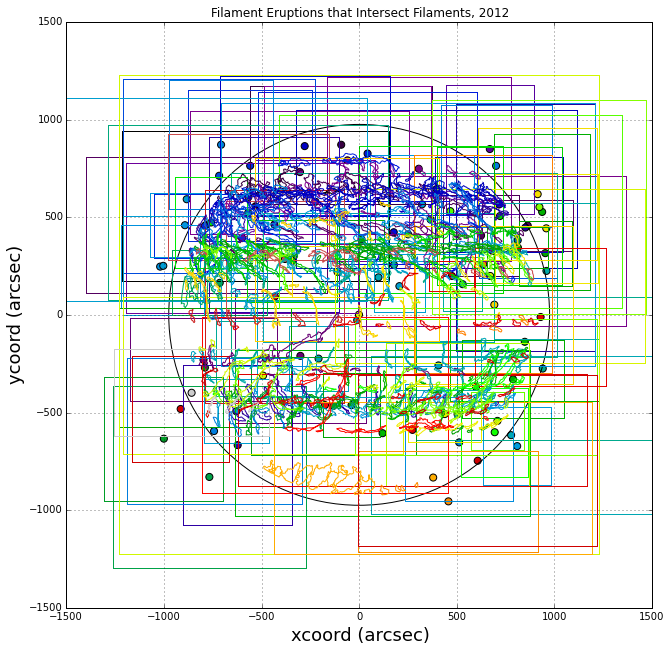

In [94]:
####makes a colorscale for eruptions 
colorscale2=[]
norm = mpl.colors.Normalize(vmin=0, vmax=3000)
cmap = plt.get_cmap('nipy_spectral')
m = cm.ScalarMappable(norm=norm, cmap=cmap)
for item in close: #plotting those filaments that have eruptions contained within them
    scaleR= m.to_rgba(item) 
    colorscale2.append(scaleR)
    
####plots eruptions/sun
plt.grid(True)
plt.ylabel('ycoord (arcsec)',fontsize=18)
plt.xlabel('xcoord (arcsec)',fontsize=18)
plt.axis([-1500, 1500, -1500, 1500])
longitude = [elem["hpc_x"]for elem in filtered3]
latitude = [elem["hpc_y"] for elem in filtered3]
fig=plt.scatter(longitude,latitude,c= colorscale2,s=50)
Sun=plt.Circle((0,0), radius=975, color='black', fill=False)
plt.gcf().gca().add_artist(Sun)
plt.title('Filament Eruptions that Intersect Filaments, 2012')
fig1 = plt.gcf()
fig1.set_size_inches(10.5,10.5)
ax = fig1.add_subplot(111)
ax.set_aspect('equal')

####plots eruption boxes 
box = [elem["hpc_bbox"] for elem in filtered3]    #plotting only those eruptions boxes that intersect with filaments
boxinfo=zip(box, close)
for item in boxinfo:
        scaleR= m.to_rgba(item[1])
        plot_box=plt.Polygon(loads(item[0]).exterior,color=scaleR,linewidth=1,fill=None)
        fig1.gca().add_artist(plot_box)
        
###plots filament tracks         
for poly in okay_polygons: #plotting those filaments that intersect the bounding box of eruptions
    scale2=m.to_rgba(poly[0])
    plot_polygon=plt.Polygon(loads(poly[1]).exterior,color=scale2,linewidth=1,fill=None)
    fig1.gca().add_artist(plot_polygon)
plt.show()

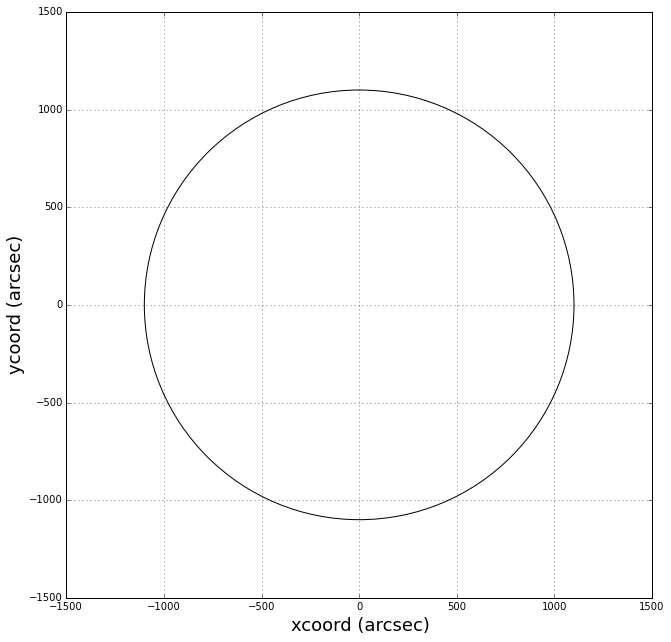

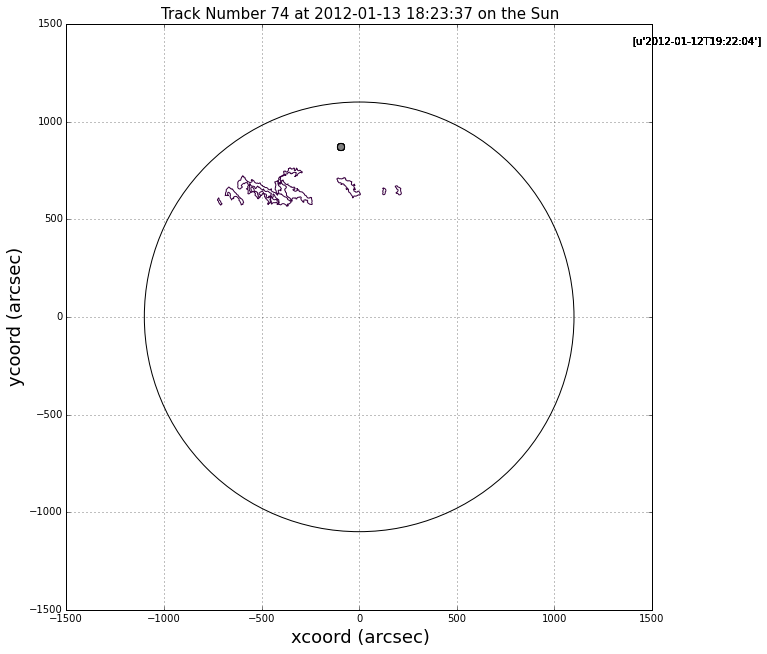

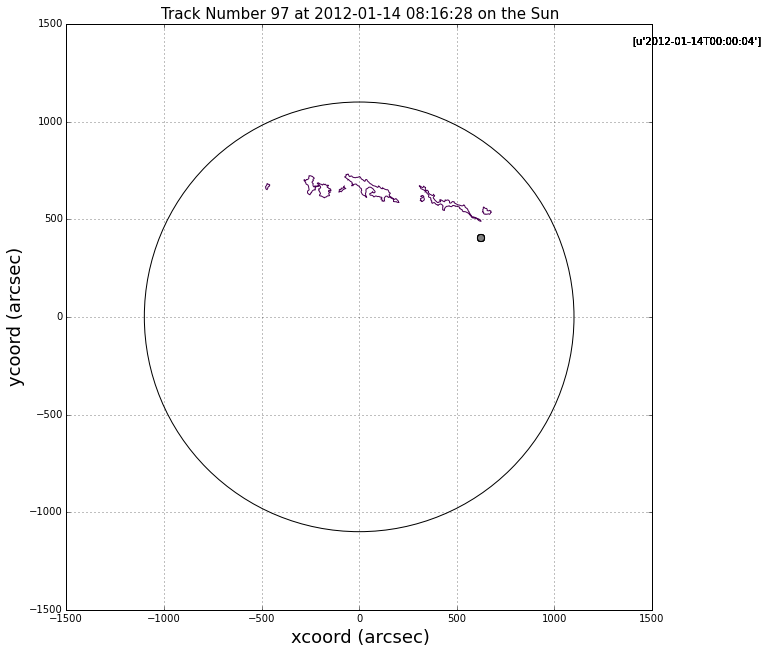

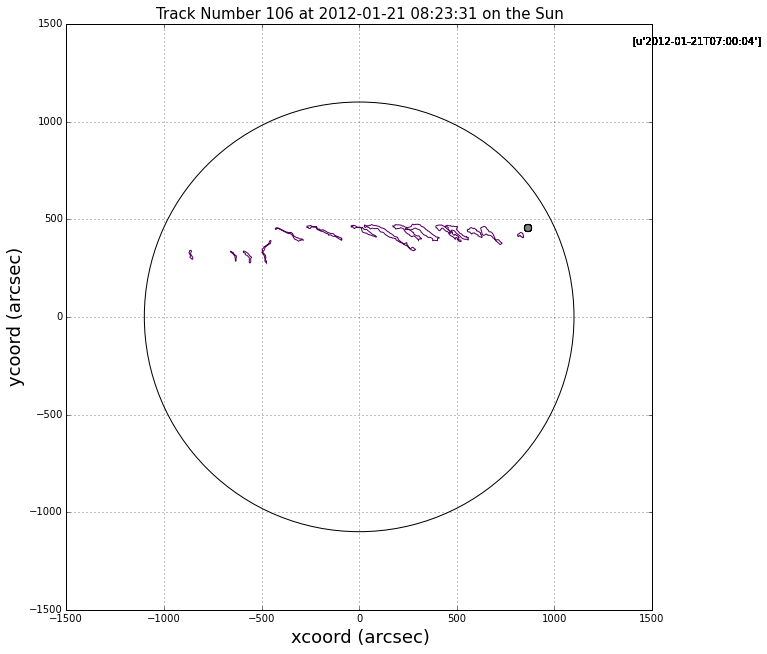

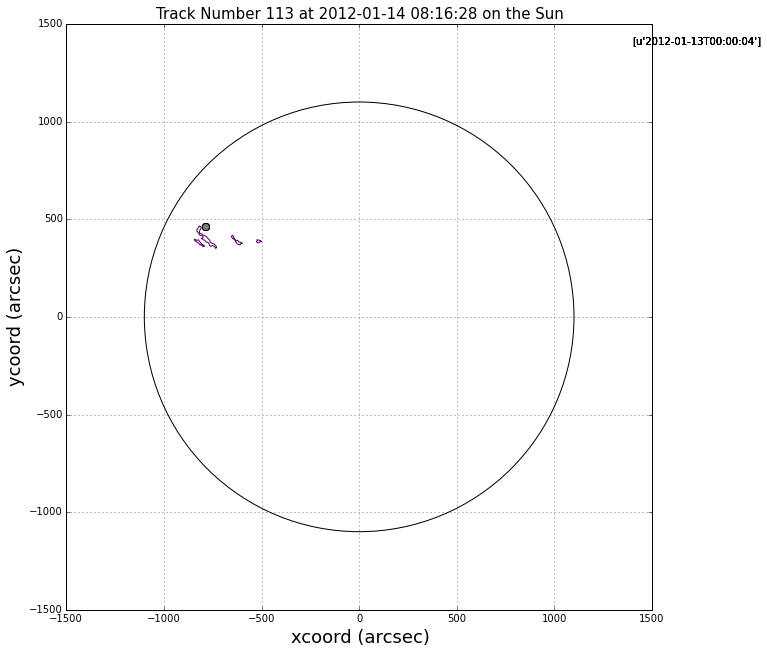

...

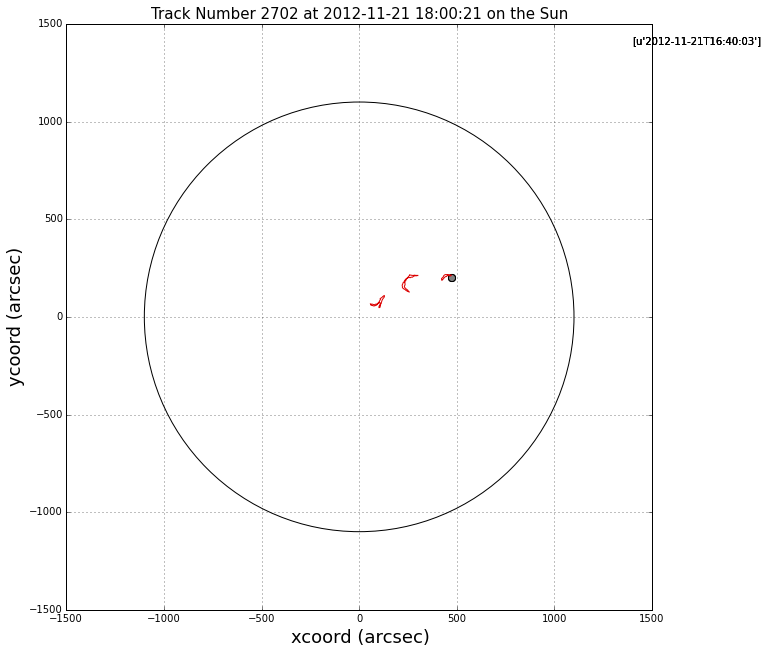

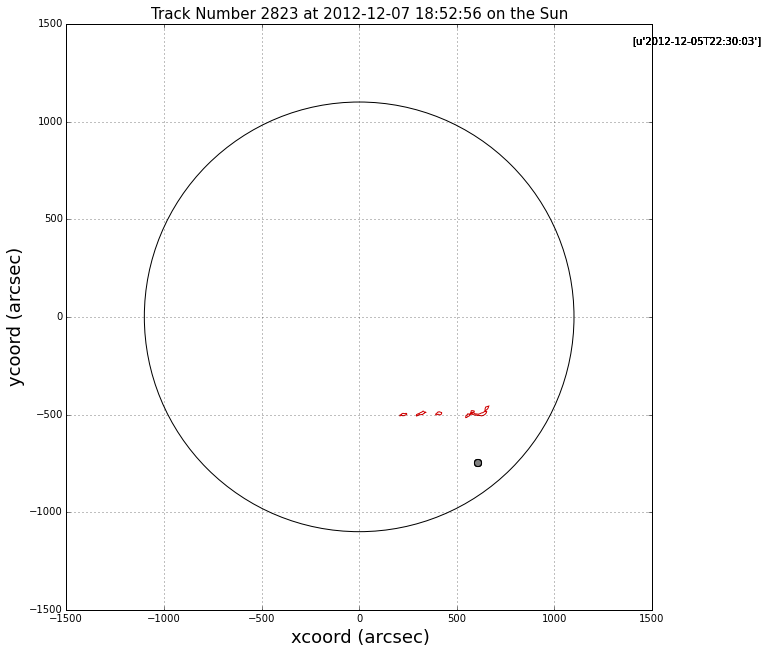

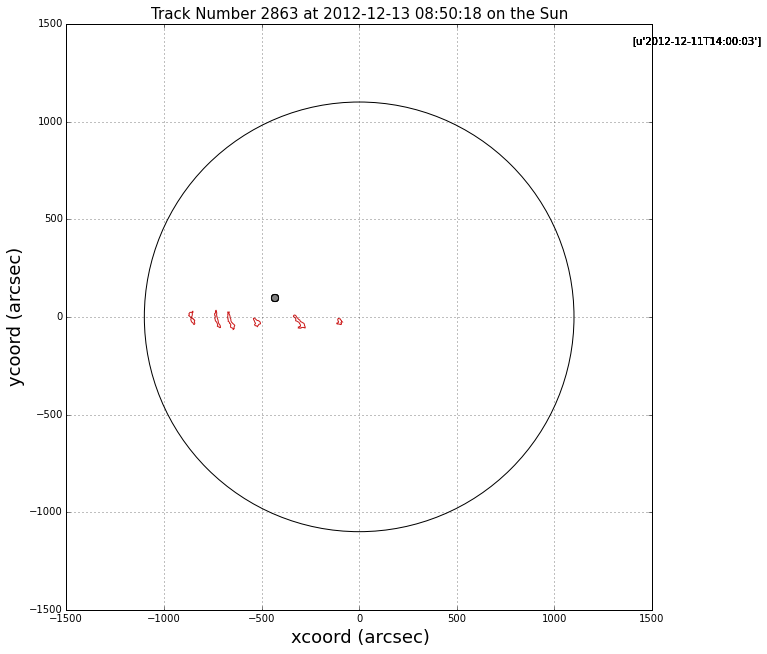

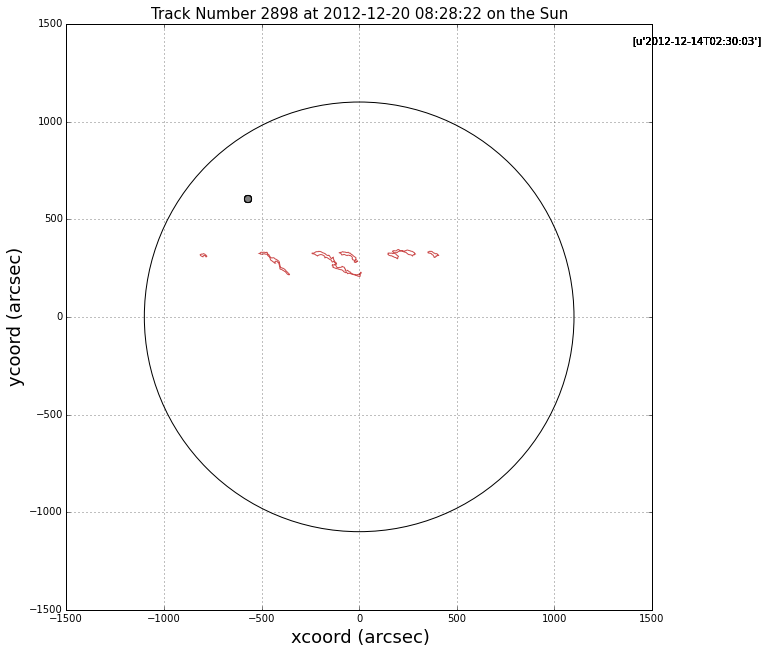

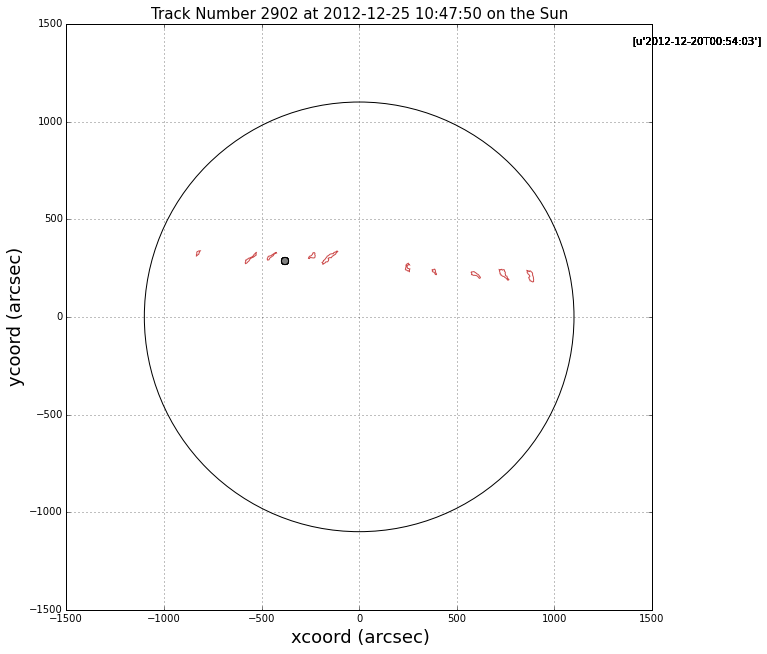

75


In [95]:
   ###new updated eruption list for each track 
holder = []
tot=[]
unique=[]
erupind=[]
close_unique=np.unique(close)
for tracks in close_unique:
    tot.append(unique)
    unique=[]
    for i in range(0, len(good_tracks)):
        if tracks == good_tracks['Track No.'][i]:
            unique.append(i)
            
for item in tot:
    colorscale2=[]
    norm = mpl.colors.Normalize(vmin=0, vmax=3000)
    cmap = plt.get_cmap('nipy_spectral')
    m = cm.ScalarMappable(norm=norm, cmap=cmap)
    for thing1 in close: #plotting those filaments that have eruptions contained within them
        scaleR= m.to_rgba(thing1) 
        colorscale2.append(scaleR)
####plots eruptions/sun
    plt.grid(True)
    plt.ylabel('ycoord (arcsec)',fontsize=18)
    plt.xlabel('xcoord (arcsec)',fontsize=18)
    plt.axis([-1500, 1500, -1500, 1500])
    fig1 = plt.gcf()
    Sun=plt.Circle((0,0), radius=1100, color='black', fill=False)
    plt.gcf().gca().add_artist(Sun)
    fig1.set_size_inches(10.5,10.5)
    ax = fig1.add_subplot(111)
    ax.set_aspect('equal')
        ##############################
    for i in range(0, len(item)):
        j=item[i]
        trnum=  good_tracks['Track No.'][j]
        stime=  good_tracks['HEK_time'][j]
        if i == 0:    #getting the coordinates of the first polygon
            first_poly = loads(good_tracks['HPC_Center'][j])
        for thing1 in corresponding:
            if thing1[0] == trnum:
                erupind.append(thing1[1])
        verup=[indices[i] for i in erupind]   #getting the eruption index from a list of possible indices
        erupind=[]
        filtered4=[eruptions[k] for k in verup]
        longitude = [elem["hpc_x"]for elem in filtered4]
        latitude = [elem["hpc_y"] for elem in filtered4]
        erup_coord = [elem["hpc_coord"] for elem in filtered4]
        erup_t = [elem["event_starttime"] for elem in filtered4]
        for thing2 in erup_t:
            tim = (parse_time(thing2))
        for thing3 in erup_coord:
            erup_point = loads(thing3)
        if erup_point.x < first_poly.x:  #finding if the eruption occurs before the first polygon
            #holder.append(trnum)
            plt.close()
        else:
            if abs(erup_point.y - first_poly.y) > 300:
                plt.close()
            else:
                holder.append(trnum)
                plt.text(1400,1400,str(erup_t))
                fig=plt.scatter(longitude,latitude, c = 'grey',s=50)
                scale2=m.to_rgba(good_tracks['Track No.'][j])
                plot_polygon=plt.Polygon(loads(good_tracks['HPC_BB_Poly'][j]).exterior,color=scale2,linewidth=1,fill=None)
                fig1.gca().add_artist(plot_polygon)
                plt.title('Track Number %(Trackno)d at %(starttime)s on the Sun' % {"Trackno" : trnum, "starttime": stime}, fontsize = 15)
    plt.show()
print len(np.unique(holder))

# The following imports the .csv file where the erupted filaments were checked and recorded. "good_track_no_2012" is a list of tracks that were confirmed to erupt. 

In [15]:
tracknumbers_2012=[]
good_track_no_2012=[]
with open('2012Track_eruptions_text.csv', 'rb') as f:    ###opens the excel document containing confirmed eruption track information
    reader = csv.reader(f)
    vdata = [row for row in csv.reader(f.read().splitlines())]   #splits the document by line
for row in vdata:
    tracknumbers_2012.append(row[0])      ###appends just the track number  
for i in range(0, 2):
    tracknumbers_2012.pop(i)     #removes heading text for file 
tracknumbers_2012.remove('')
for item in tracknumbers_2012:      
    x=float(item)
    good_track_no_2012.append(x)  #appends the track numbers as a float to a new list 
print good_track_no_2012   #list of erupting tracks in workable format 
print ''
###################################################################################
transitnumbers_2012=[]
transit_track_no_2012=[]
with open('Transit_tracks2012.csv', 'rb') as f:    ###opens the excel document containing confirmed eruption track information
    reader = csv.reader(f)
    vdata = [row for row in csv.reader(f.read().splitlines())]   #splits the document by line
for row in vdata:
    transitnumbers_2012.append(row[0])      ###appends just the track number  
for i in range(0, 2):
    transitnumbers_2012.pop(i)     #removes heading text for file 
transitnumbers_2012.remove('')
for item in transitnumbers_2012:      
    x=float(item)
    transit_track_no_2012.append(x)  #appends the track numbers as a float to a new list 
print transit_track_no_2012   #list of erupting tracks in workable format 

[2.0, 21.0, 58.0, 93.0, 94.0, 140.0, 175.0, 193.0, 276.0, 319.0, 338.0, 403.0, 404.0, 482.0, 485.0, 489.0, 496.0, 509.0, 516.0, 558.0, 565.0, 644.0, 658.0, 666.0, 717.0, 782.0, 785.0, 850.0, 866.0, 905.0, 914.0, 941.0, 956.0, 993.0, 1028.0, 1030.0, 1055.0, 1075.0, 1096.0, 1101.0, 1135.0, 1178.0, 1199.0, 1202.0, 1246.0, 1286.0, 1396.0, 1399.0, 1403.0, 1409.0, 1410.0, 1441.0, 1450.0, 1480.0, 1492.0, 1512.0, 1568.0, 1614.0, 1626.0, 1655.0, 1728.0, 1777.0, 1788.0, 1800.0, 1869.0, 1870.0, 1882.0, 1891.0, 1903.0, 1909.0, 1916.0, 1939.0, 2017.0, 2027.0, 2038.0, 2103.0, 2130.0, 2177.0, 2211.0, 2236.0, 2338.0, 2412.0, 2541.0, 2671.0, 2702.0, 2723.0, 2863.0, 2881.0, 2902.0]

[64.0, 78.0, 98.0, 106.0, 135.0, 146.0, 161.0, 166.0, 216.0, 354.0, 361.0, 362.0, 366.0, 413.0, 414.0, 491.0, 553.0, 573.0, 575.0, 592.0, 622.0, 743.0, 879.0, 894.0, 901.0, 959.0, 978.0, 983.0, 1025.0, 1026.0, 1058.0, 1063.0, 1078.0, 1092.0, 1157.0, 1167.0, 1181.0, 1194.0, 1225.0, 1227.0, 1342.0, 1357.0, 1351.0, 1426.0, 1445

In [16]:
transit_track_no_2012=np.unique(transit_track_no_2012)
length_2012=[]
transit_length_2012=[]
north_chiral_2012=[]
south_chiral_2012=[]
for i in range(0, len(good_tracks)):
    if good_tracks['Track No.'][i] in good_track_no_2012:
        length_2012.append(good_tracks['fi_length'][i])
        coor=loads(good_tracks['HPC_Center'][i])
        if coor.y < 0:
            south_chiral_2012.append((good_tracks['Track No.'][i],good_tracks['fi_chirality'][i]))
        else:
            north_chiral_2012.append((good_tracks['Track No.'][i],good_tracks['fi_chirality'][i]))
    if good_tracks['Track No.'][i] in transit_track_no_2012:
        transit_length_2012.append(good_tracks['fi_length'][i])

96 208 55


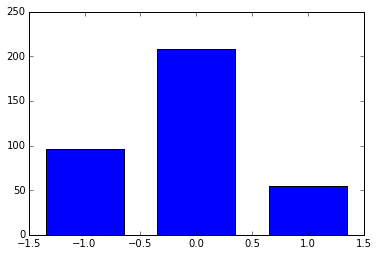

In [17]:
count1=0
count0=0
countneg1=0
for i in range(0, len(north_chiral_2012)):
    if north_chiral_2012[i][1] == -1.0:
        countneg1+=1
    if north_chiral_2012[i][1] == 0.0:
        count0+=1
    if north_chiral_2012[i][1] == 1.0:
        count1+=1
print countneg1, count0, count1

x = range(-1, 2)
y = (countneg1, count0, count1)
plt.bar(x, y, width=0.7, align="center")
plt.show()

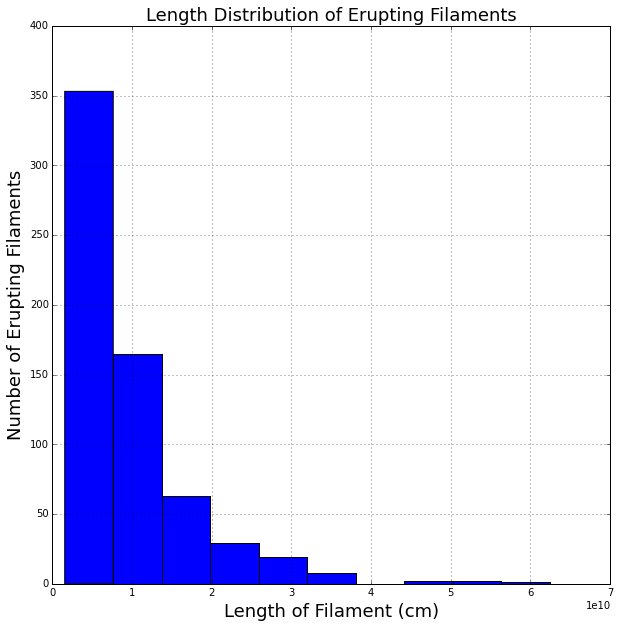

In [18]:
plt.figure(figsize=(10,10))
plt.grid(True)
plt.ylabel('Number of Erupting Filaments',fontsize=18)
plt.xlabel('Length of Filament (cm)',fontsize=18)
plt.hist(length_2012, rwidth=1.5)
plt.title('Length Distribution of Erupting Filaments',fontsize=18)

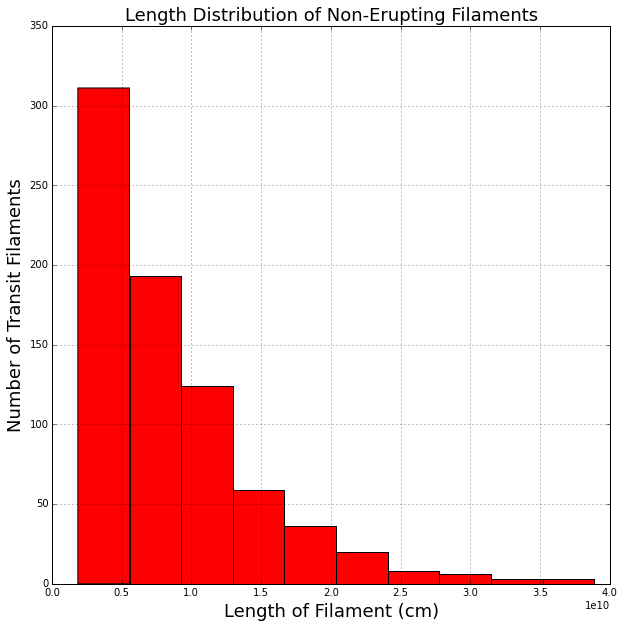

In [19]:
plt.figure(figsize=(10,10))
plt.grid(True)
plt.ylabel('Number of Transit Filaments',fontsize=18)
plt.xlabel('Length of Filament (cm)',fontsize=18)
plt.hist(transit_length_2012, rwidth=1.5, color='r')
plt.title('Length Distribution of Non-Erupting Filaments',fontsize=18)

94 2012-01-09 18:28:35
94 2012-01-10 11:15:10
94 2012-01-10 18:23:00
94 2012-01-11 11:28:18
94 2012-01-12 08:24:05
94 2012-01-12 18:29:14
94 2012-01-13 08:05:59
94 2012-01-14 08:16:28


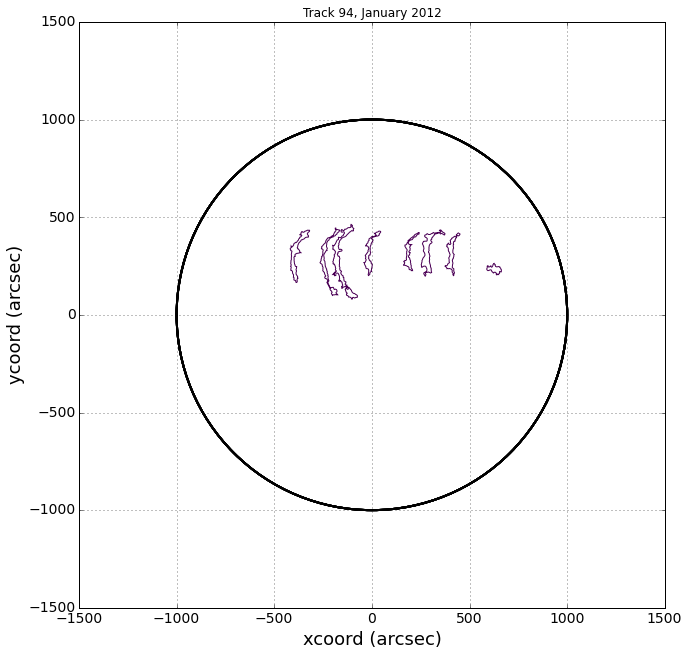

In [20]:
#### to check tracks that aren't "good" for some reason 
noerup=[]
check_track1=[94.0]
check_poly1=[]
for i in range(len(good_tracks)): #iterating through the whole list of tracks 
    #if good_tracks['Track No.'][i] in intersected and good_tracks['Track No.'][i] in okay_filaments:   #if the track number is in the list created previously 
    if fi_tracked['Track No.'][i] in check_track1: 
            check_poly1.append((fi_tracked['Track No.'][i],fi_tracked['HPC_BB_Poly'][i])) #append the polygon data to good polygons
            print fi_tracked['Track No.'][i],fi_tracked['HEK_time'][i]
for poly in check_poly1: #plotting those filaments that have eruptions contained within them
    SetupSunPlotColor(noerup, poly[0], poly[1]) #filament eruption coordinates, track number, track polygon coordinates


# Trying to find tracks that transit

In [21]:
#fi_tracked = pd.read_csv('FIDustinTracked_2012.txt',delimiter='\t')
long_tracks = fi_tracked.groupby('Track No.').filter(lambda x: len(x['Track No.']) >= 6, dropna=False) 


In [22]:
###opens the csv file, pulls out 2012 track numbers 
tracknumbers_2012=[]
good_track_no_2012=[]
erup_info_2012=[]
with open('2012Track_eruptions_text.csv', 'rb') as f:    ###opens the excel document containing confirmed eruption track information
    reader = csv.reader(f)
    vdata = [row for row in csv.reader(f.read().splitlines())]   #splits the document by line
for row in vdata:
    tracknumbers_2012.append(row[0])      ###appends just the track number  
    erup_info_2012.append((row[0], row[7]))
for i in range(0, 2):
    tracknumbers_2012.pop(i)     #removes heading text for file 
    erup_info_2012.pop(i)
del tracknumbers_2012[0]
del erup_info_2012[0]
for item in tracknumbers_2012:      
    x=float(item)
    good_track_no_2012.append(x)  #appends the track numbers as a float to a new list   

In [23]:
#### opens csv file for non-erupting/transit filaments 2012
tracknumbers_2012_trans=[]
good_track_no_2012_trans=[]
with open('Transit_tracks2012.csv', 'rb') as f:    ###opens the excel document containing confirmed eruption track information
    reader = csv.reader(f)
    vdata = [row for row in csv.reader(f.read().splitlines())]   #splits the document by line
for row in vdata:
    tracknumbers_2012_trans.append(row[0])      ###appends just the track number
for i in range(0, 2):
    tracknumbers_2012_trans.pop(i)     #removes heading text for file 
del tracknumbers_2012_trans[0]
##########
for item in tracknumbers_2012_trans:      
    x=float(item)
    good_track_no_2012_trans.append(x)  #appends the track numbers as a float to a new list 
print good_track_no_2012_trans

[64.0, 78.0, 98.0, 106.0, 135.0, 146.0, 161.0, 166.0, 216.0, 354.0, 361.0, 362.0, 366.0, 413.0, 414.0, 491.0, 553.0, 573.0, 575.0, 592.0, 622.0, 743.0, 879.0, 894.0, 901.0, 959.0, 978.0, 983.0, 1025.0, 1026.0, 1058.0, 1063.0, 1078.0, 1092.0, 1157.0, 1167.0, 1181.0, 1194.0, 1225.0, 1227.0, 1342.0, 1357.0, 1351.0, 1426.0, 1445.0, 1458.0, 1494.0, 1505.0, 1525.0, 1546.0, 1557.0, 1575.0, 1605.0, 1680.0, 1684.0, 1695.0, 1705.0, 1709.0, 1717.0, 1734.0, 1739.0, 1834.0, 1880.0, 1912.0, 1945.0, 1983.0, 2047.0, 2048.0, 2052.0, 2176.0, 2185.0, 2206.0, 2222.0, 2241.0, 2404.0, 2407.0, 2416.0, 2479.0, 2490.0, 2571.0, 2623.0, 2797.0, 2813.0, 2894.0, 2904.0, 2946.0]


In [24]:
#the following loop does a similar thing to the "filter" process to correlate eruptions to filaments except 
#the reverse to find filaments that are NOT already documented and NOT near in time/space any eruption
margin = datetime.timedelta(hours=12)  
FT_track = long_tracks['Track No.']
FT_point = long_tracks['HPC_Center']
FT_time = long_tracks['HEK_time']    #Finds the time stamps for all the filaments
FE_time = [elem["event_starttime"] for elem in filtered] #Finds the time stamps for all the eruptions
FT_poly = long_tracks['HPC_BB_Poly'] 
FE_box = [elem["hpc_bbox"] for elem in filtered] 
FE_coords = [elem["hpc_coord"] for elem in filtered] 
non_erup=[] #the tracks that intersect with eruption boxes
yes_erup=[]
for i in range(0, len(FT_poly)):
    if pd.isnull(FT_poly[i]):    #any tracks less than 4 elements 
        pass
    else:
        if FT_track[i] in good_track_no_2012_trans or FT_track[i] in good_track_no_2012:  #checks if track is already documented 
            pass
        else:
            FLT = parse(FT_time[i])
            FT_poly_obj = loads(FT_poly[i])
            for j in range(0, len(FE_box)):
                FET=(parse_time(FE_time[j]))
                FE_box_obj = loads(FE_box[j]) #creates a shapely box object object
                FE_point_obj=loads(FE_coords[j])
                if FT_poly_obj.intersects(FE_box_obj) and FET-margin <= FLT <= FET + margin: #checks if track is close in time and space to eruption
                    yes_erup.append(FT_track[i])
                    pass
                else:
                    non_erup.append(FT_track[i])
                    
non_erup = np.unique(non_erup)
good_ind=[]
for i in range(0, len(non_erup)):
    if non_erup[i] not in yes_erup:
        good_ind.append(i)
non_erup_filt = [non_erup[j] for j in good_ind]

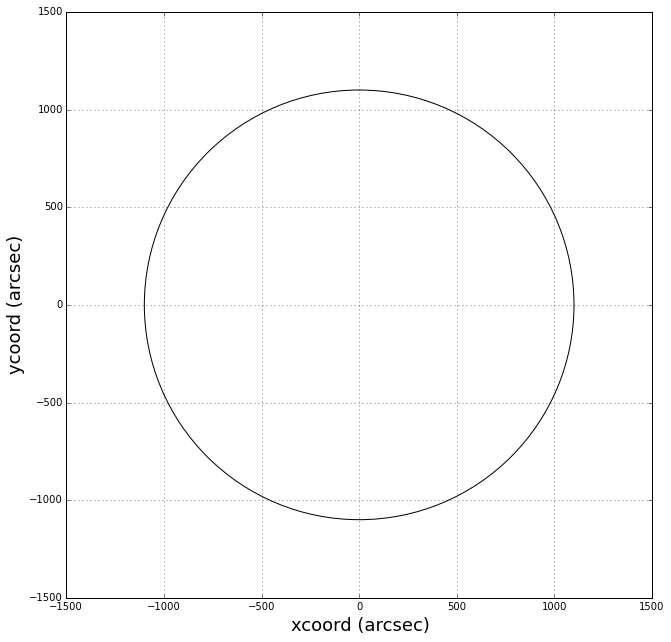

2012-01-01 08:15:04
2012-01-02 08:04:55
2012-01-03 18:27:22
2012-01-04 08:49:18
2012-01-04 18:11:55
2012-01-05 18:32:45


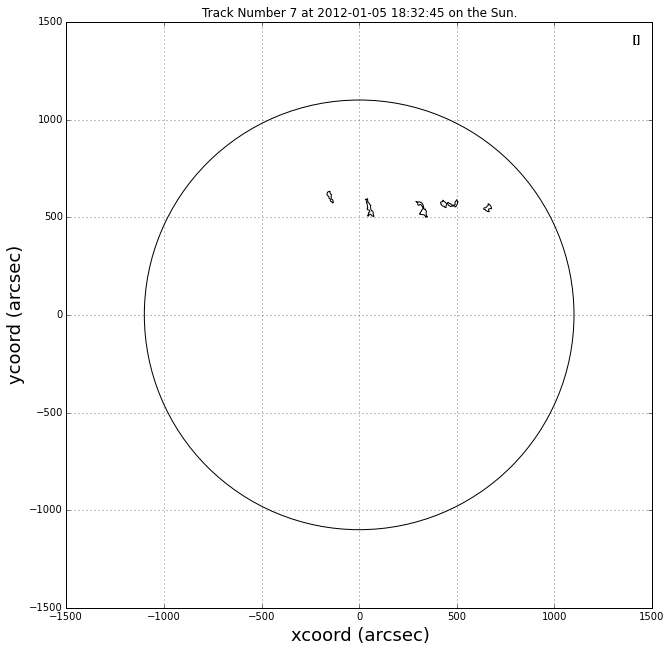

2012-01-03 18:27:22
2012-01-04 08:49:18
2012-01-04 18:11:55
2012-01-05 18:32:45
2012-01-06 18:05:45
2012-01-07 09:33:12


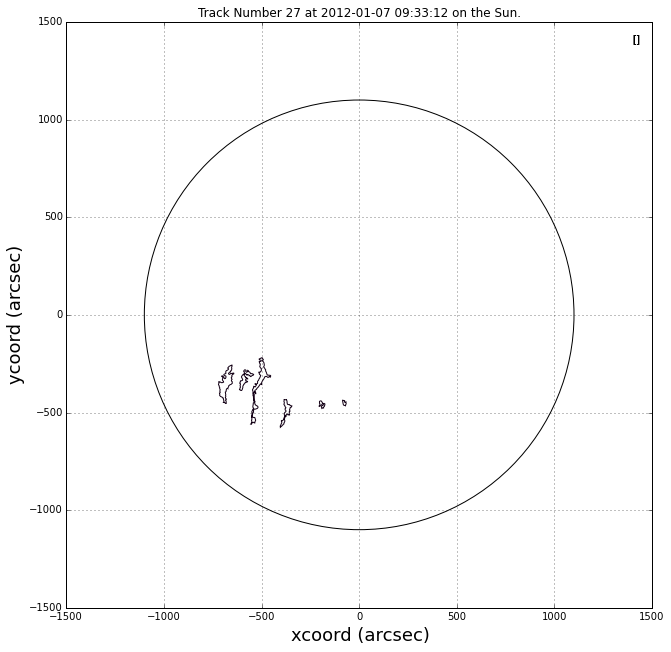

2012-01-05 18:32:45
2012-01-06 18:05:45
2012-01-07 09:33:12
2012-01-08 08:28:28
2012-01-09 11:08:54
2012-01-09 18:28:35


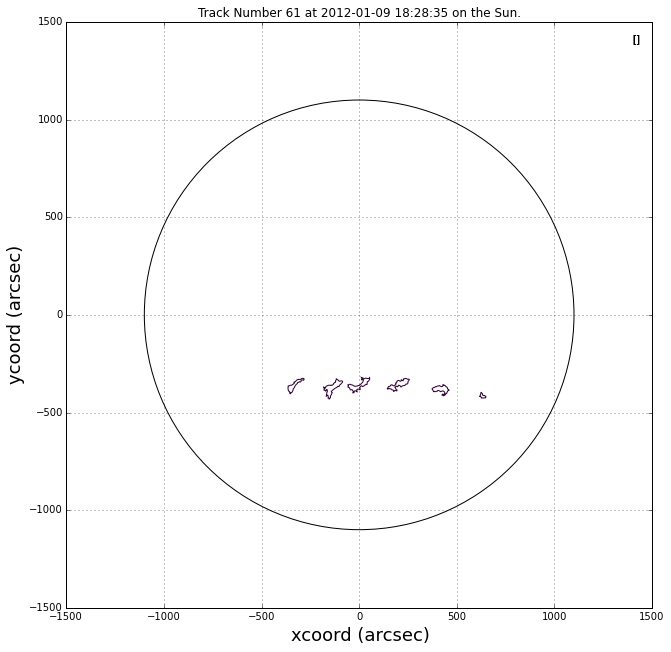

2012-01-07 09:33:12
2012-01-08 08:28:28
2012-01-09 11:08:54
2012-01-09 18:28:35
2012-01-10 11:15:10
2012-01-11 11:28:18
2012-01-12 08:24:05
2012-01-13 08:05:59
2012-01-13 18:23:37


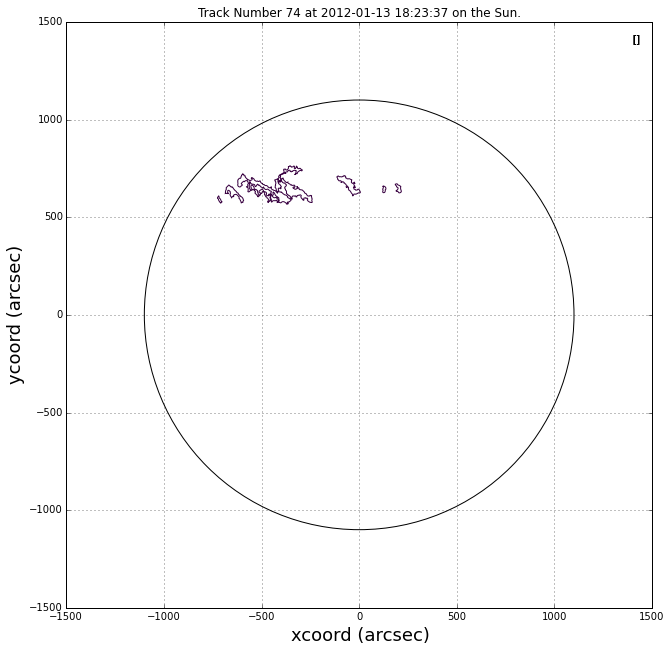

2012-01-10 11:15:10
2012-01-11 11:28:18
2012-01-12 08:24:05
2012-01-12 18:29:14
2012-01-13 08:05:59
2012-01-13 18:23:37
2012-01-14 08:16:28


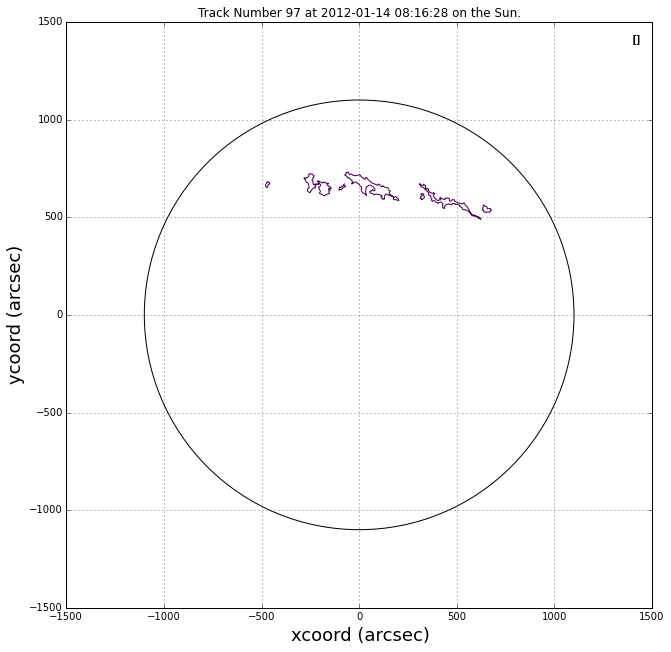

2012-01-13 18:23:37
2012-01-14 08:16:28
2012-01-15 09:44:48
2012-01-16 08:25:38
2012-01-17 07:51:41
2012-01-17 18:08:23
2012-01-18 08:13:36
2012-01-18 18:23:34
2012-01-19 17:47:27


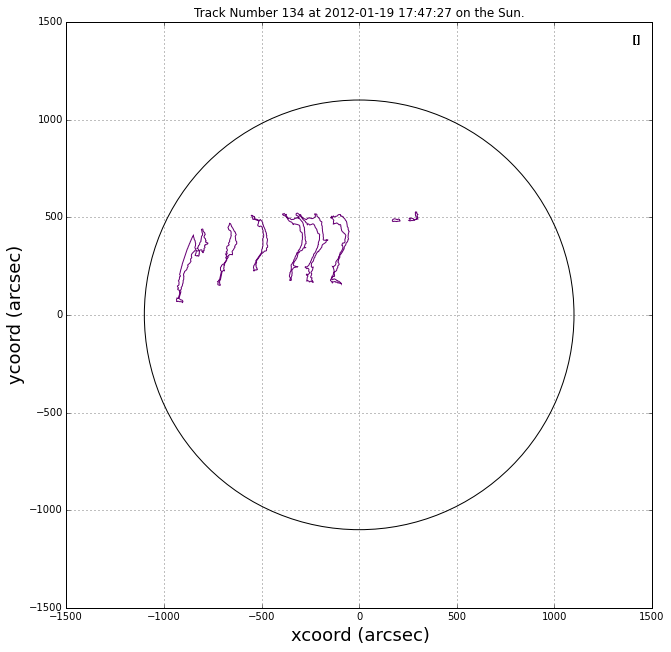

2012-01-15 09:44:48
2012-01-16 08:25:38
2012-01-17 07:51:41
2012-01-17 18:08:23
2012-01-18 08:13:36
2012-01-18 18:23:34


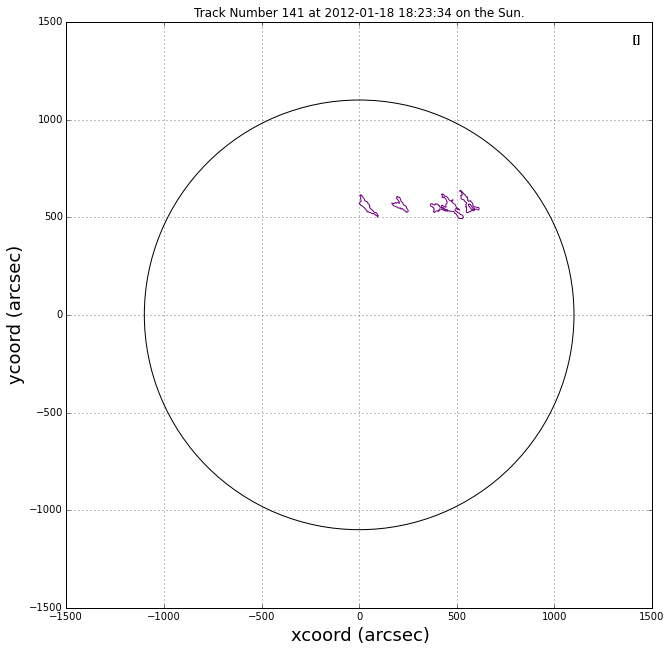

2012-01-17 18:08:23
2012-01-18 08:13:36
2012-01-18 18:23:34
2012-01-19 10:32:20
2012-01-19 17:47:27
2012-01-20 18:52:42


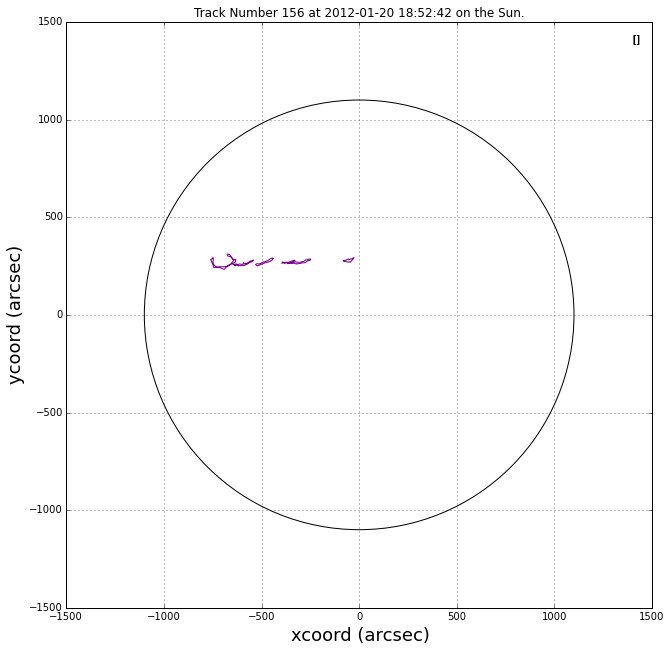

2012-01-17 18:08:23
2012-01-18 18:23:34
2012-01-19 17:47:27
2012-01-20 18:52:42
2012-01-21 08:23:31
2012-01-22 08:37:38
2012-01-23 11:59:44
2012-01-24 19:09:49
2012-01-25 18:13:07
2012-01-26 07:56:41
2012-01-26 18:06:53
2012-01-27 07:48:27


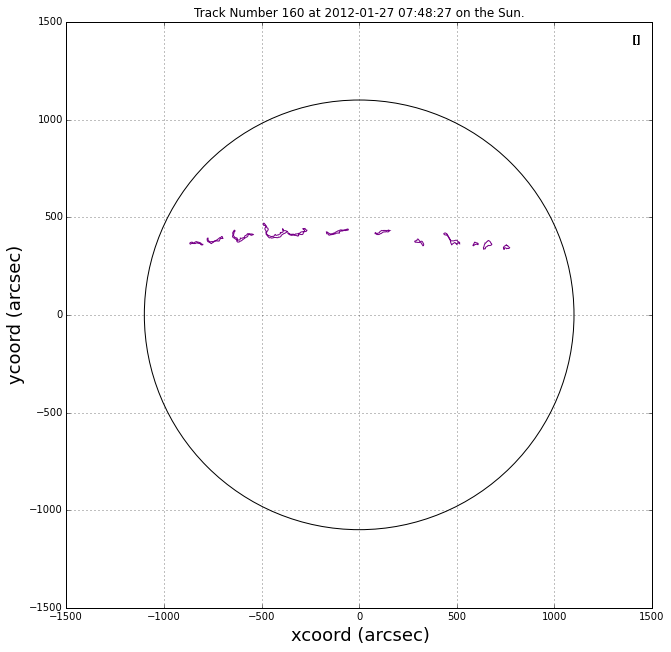

2012-01-19 17:47:27
2012-01-20 07:57:02
2012-01-20 18:52:42
2012-01-21 08:23:31
2012-01-22 08:37:38
2012-01-23 11:59:44
2012-01-24 10:19:19
2012-01-25 08:30:51
2012-01-25 18:13:07
2012-01-26 18:06:53


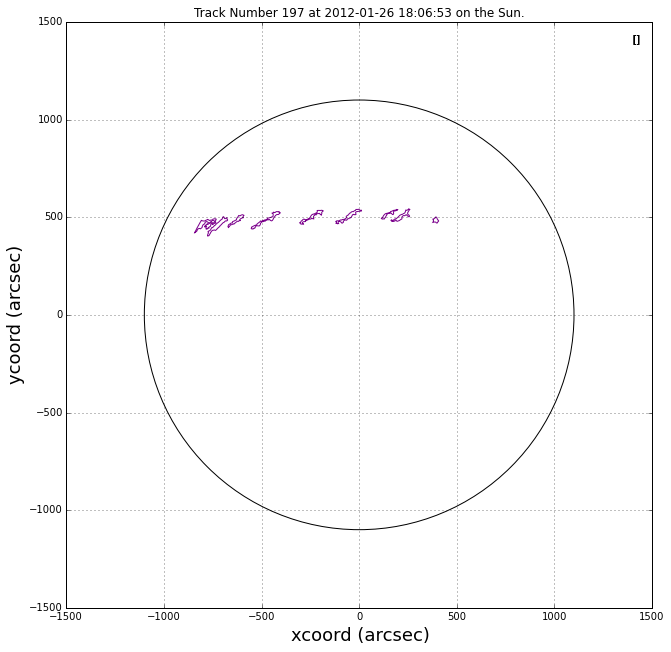

2012-01-23 11:59:44
2012-01-24 19:09:49
2012-01-26 07:56:41
2012-01-26 18:06:53
2012-01-27 07:48:27
2012-01-28 08:28:47


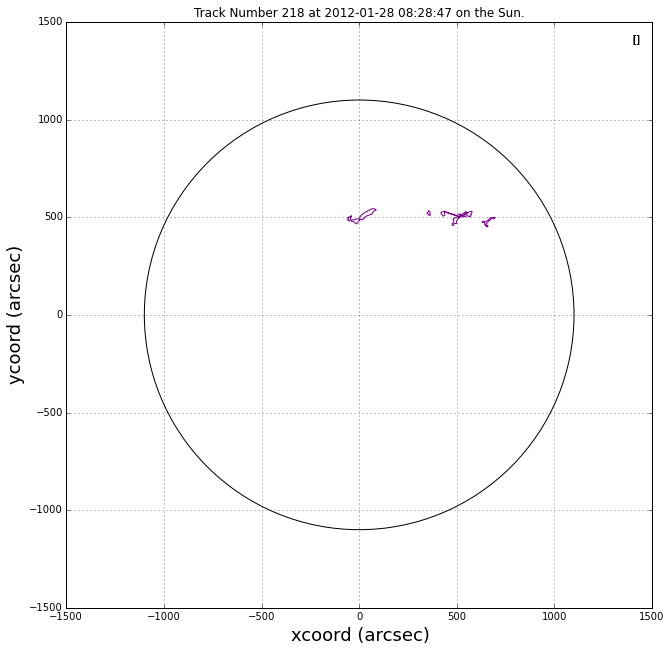

2012-01-24 19:09:49
2012-01-25 08:30:51
2012-01-25 18:13:07
2012-01-26 07:56:41
2012-01-26 18:06:53
2012-01-27 07:48:27
2012-01-28 08:28:47
2012-01-30 09:08:22
2012-01-30 18:57:26
2012-01-31 18:42:21
2012-02-01 19:42:32
2012-02-02 18:25:38
2012-02-03 18:55:21


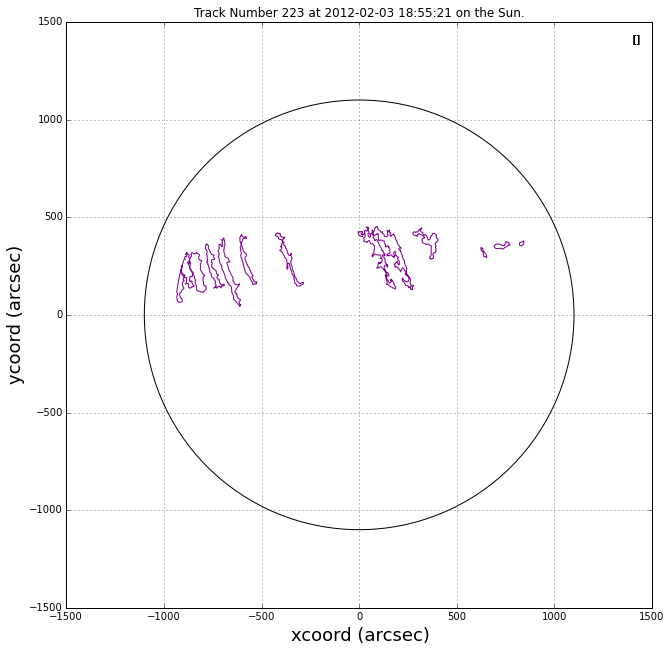

2012-01-24 19:09:49
2012-01-25 08:30:51
2012-01-25 18:13:07
2012-01-26 07:56:41
2012-01-26 18:06:53
2012-01-27 07:48:27


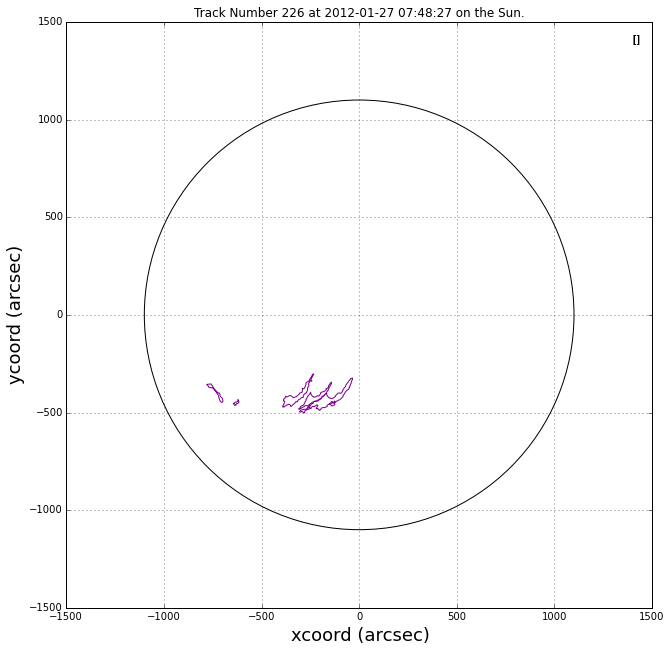

2012-01-30 09:08:22
2012-01-30 18:57:26
2012-01-31 18:42:21
2012-02-01 19:42:32
2012-02-02 18:25:38
2012-02-03 18:55:21


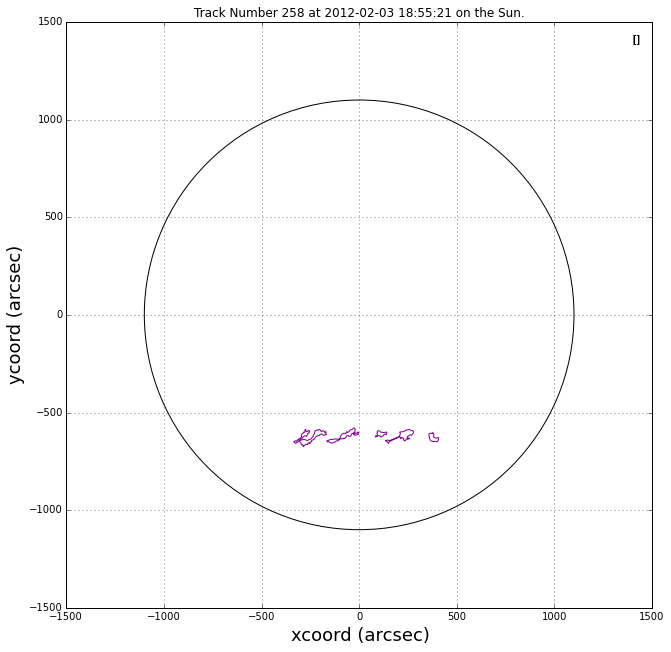

2012-01-30 18:57:26
2012-01-31 18:42:21
2012-02-01 19:42:32
2012-02-02 18:25:38
2012-02-02 18:49:08
2012-02-03 18:55:21


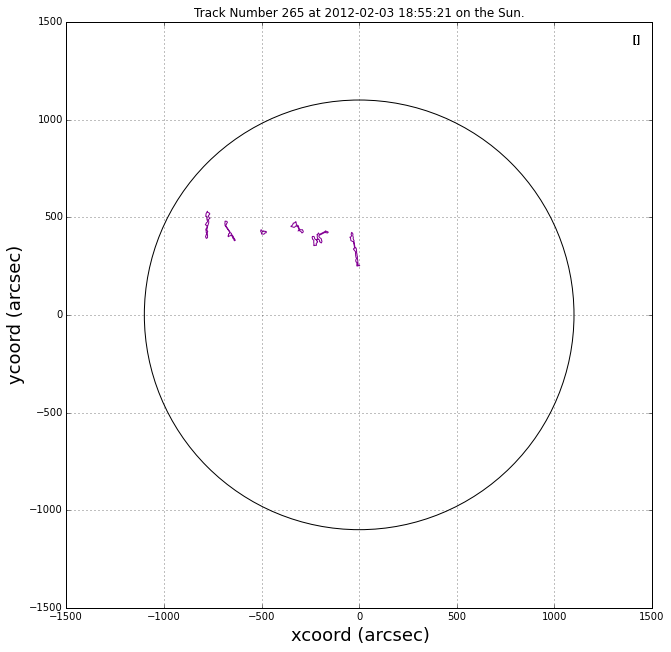

2012-02-15 08:17:02
2012-02-16 12:45:15
2012-02-17 08:26:34
2012-02-17 18:57:01
2012-02-18 11:57:35
2012-02-18 18:27:52
2012-02-19 07:18:12
2012-02-21 19:12:50
2012-02-22 18:18:45


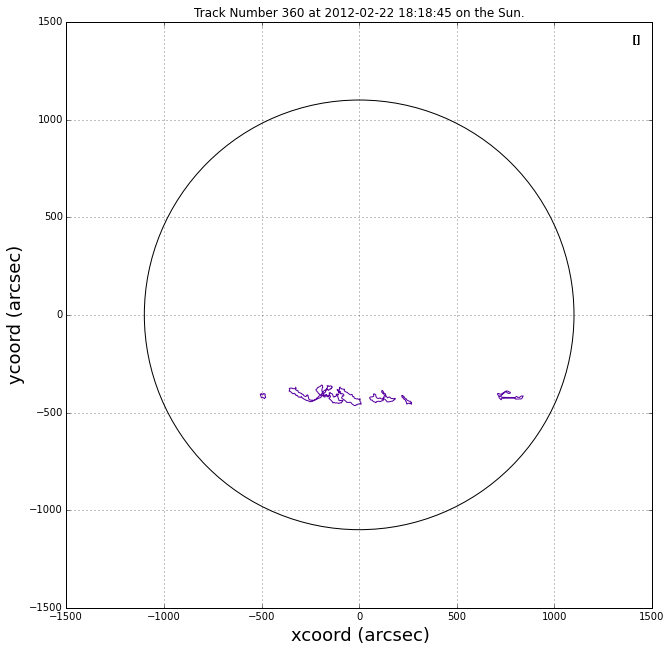

2012-02-16 12:45:15
2012-02-17 08:26:34
2012-02-17 18:57:01
2012-02-18 11:57:35
2012-02-18 18:27:52
2012-02-19 07:18:12
2012-02-19 17:44:45


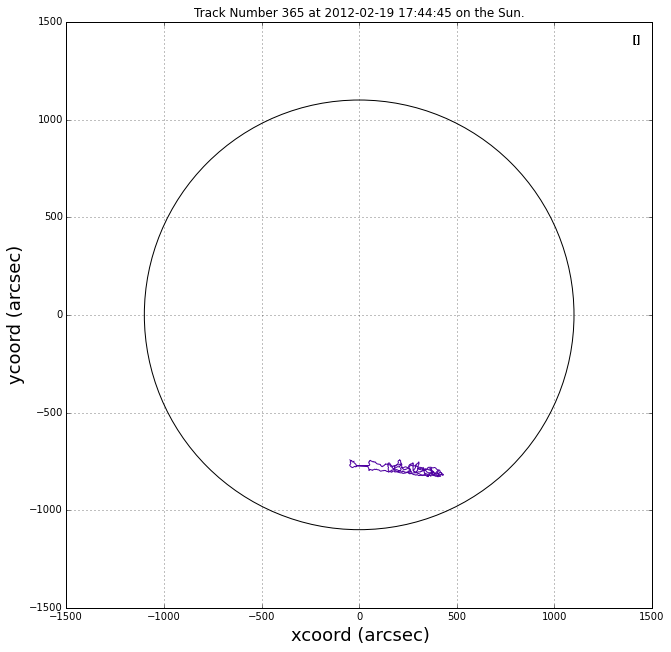

2012-02-17 08:26:34
2012-02-17 18:57:01
2012-02-18 11:57:35
2012-02-18 18:27:52
2012-02-19 07:18:12
2012-02-19 17:44:45


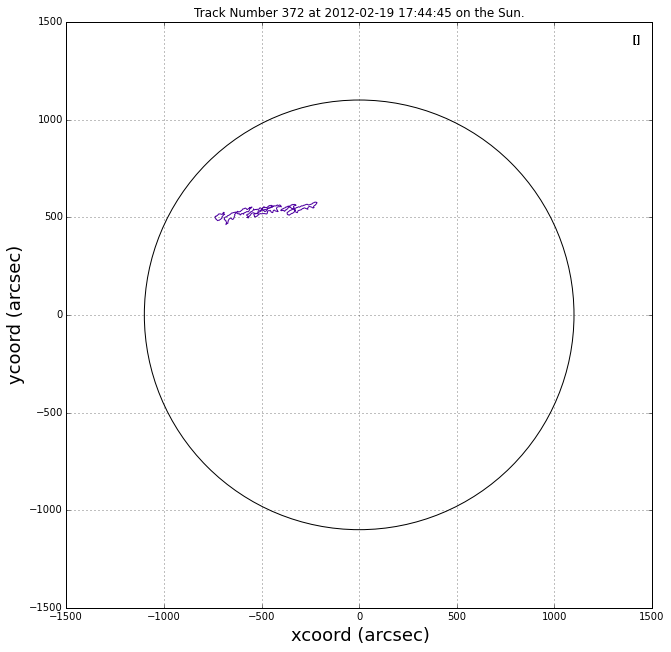

2012-02-18 11:57:35
2012-02-18 18:27:52
2012-02-19 07:18:12
2012-02-19 17:44:45
2012-02-21 19:12:50
2012-02-22 18:18:45
2012-02-23 17:12:27
2012-02-24 09:53:52
2012-02-24 18:38:06
2012-02-25 09:31:00
2012-02-26 07:52:46
2012-02-27 07:30:20
2012-02-28 08:09:05


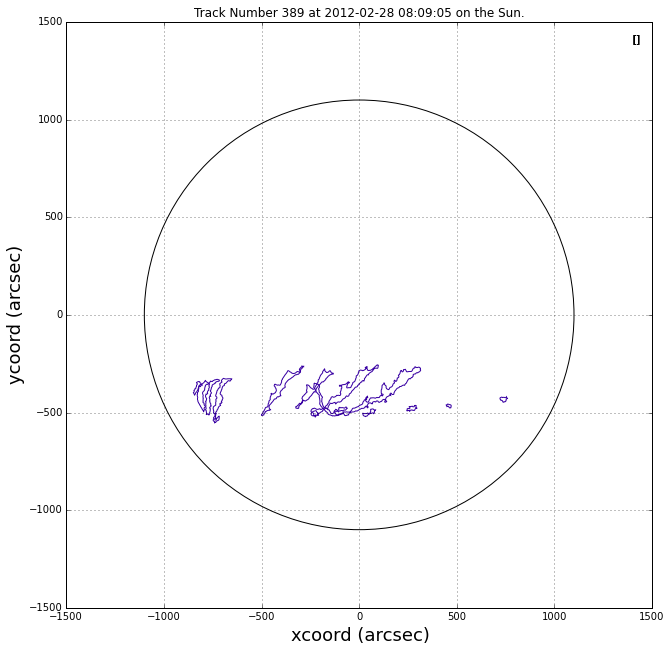

2012-02-18 18:27:52
2012-02-19 17:44:45
2012-02-21 19:12:50
2012-02-22 18:18:45
2012-02-23 17:12:27
2012-02-24 18:38:06


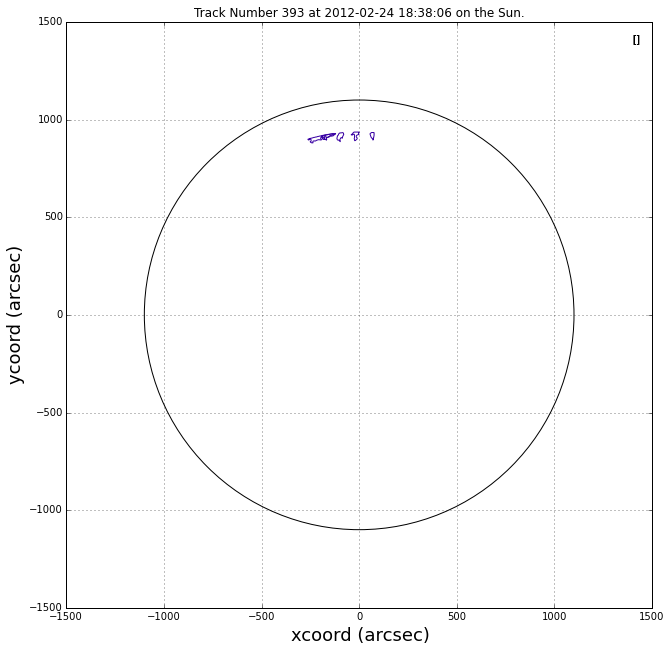

2012-02-21 19:12:50
2012-02-22 07:50:19
2012-02-22 18:18:45
2012-02-23 06:33:04
2012-02-23 17:12:27
2012-02-24 09:53:52
2012-02-25 09:31:00
2012-02-26 07:52:46
2012-02-27 07:30:20
2012-02-28 08:09:05
2012-02-29 08:12:25
2012-03-01 08:15:57
2012-03-01 18:28:48


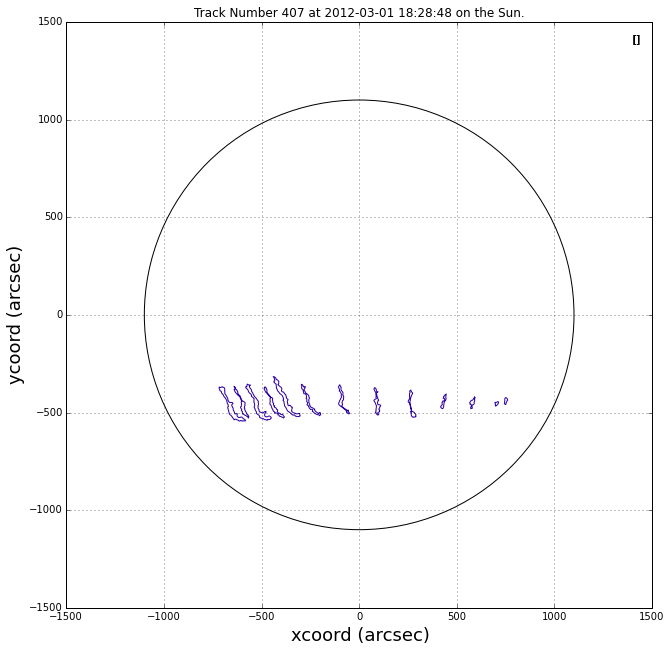

2012-02-23 06:33:04
2012-02-24 09:53:52
2012-02-26 07:52:46
2012-02-27 07:30:20
2012-02-28 08:09:05
2012-02-29 08:12:25


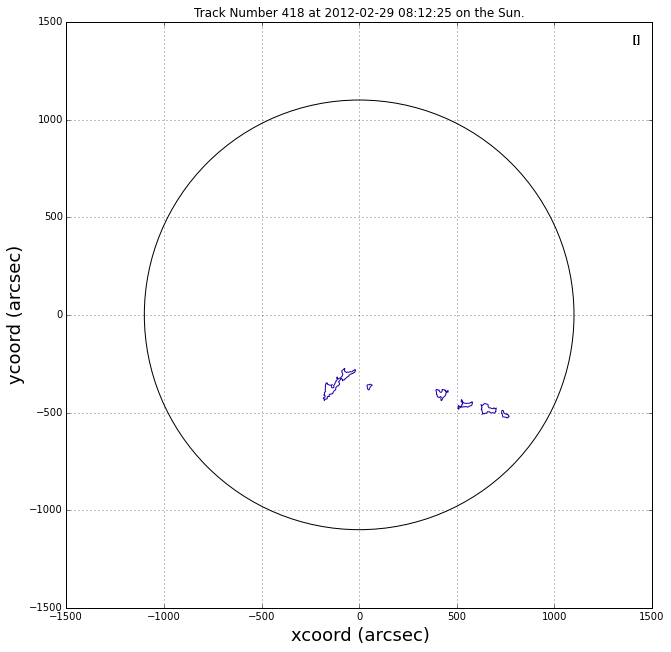

2012-02-25 09:31:00
2012-02-29 08:12:25
2012-03-01 08:15:57
2012-03-01 12:05:15
2012-03-02 07:55:04
2012-03-02 19:08:44
2012-03-03 07:40:00
2012-03-04 09:00:13


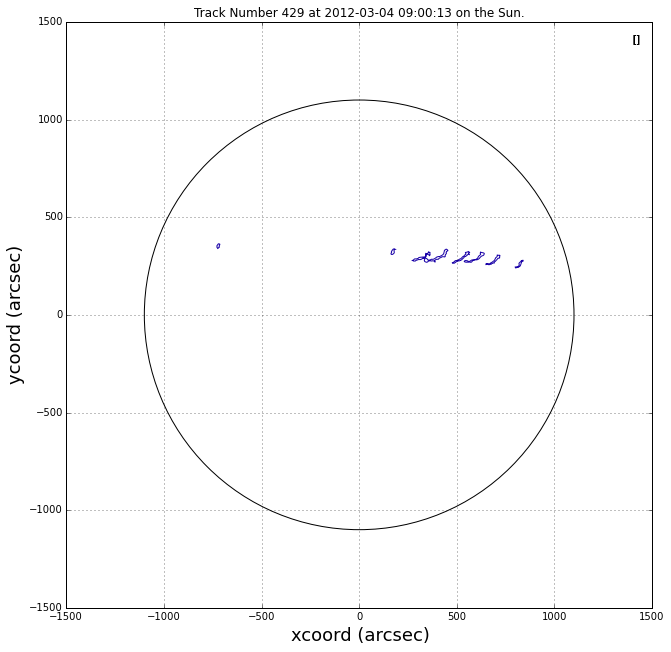

2012-02-27 07:30:20
2012-02-28 08:09:05
2012-02-29 08:12:25
2012-02-29 22:43:31
2012-03-01 18:28:48
2012-03-02 07:55:04
2012-03-02 19:08:44


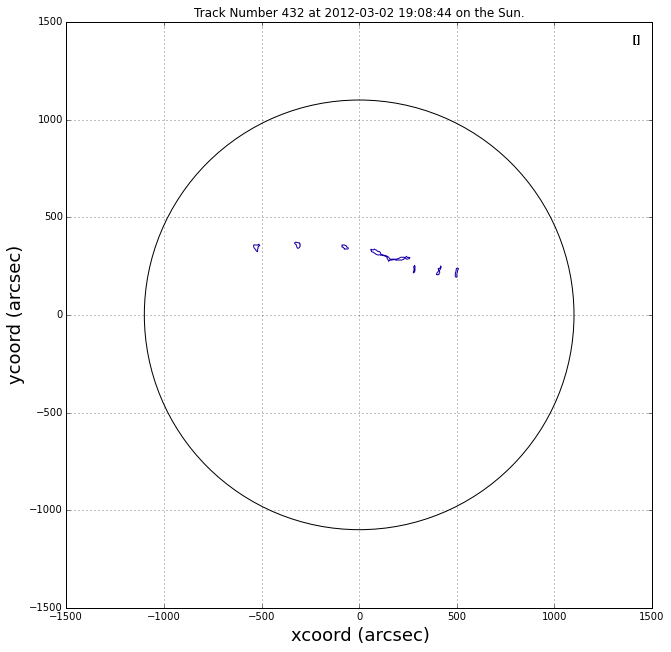

2012-03-06 17:41:32
2012-03-07 19:16:04
2012-03-08 18:08:02
2012-03-09 08:33:48
2012-03-09 18:22:02
2012-03-10 08:04:38


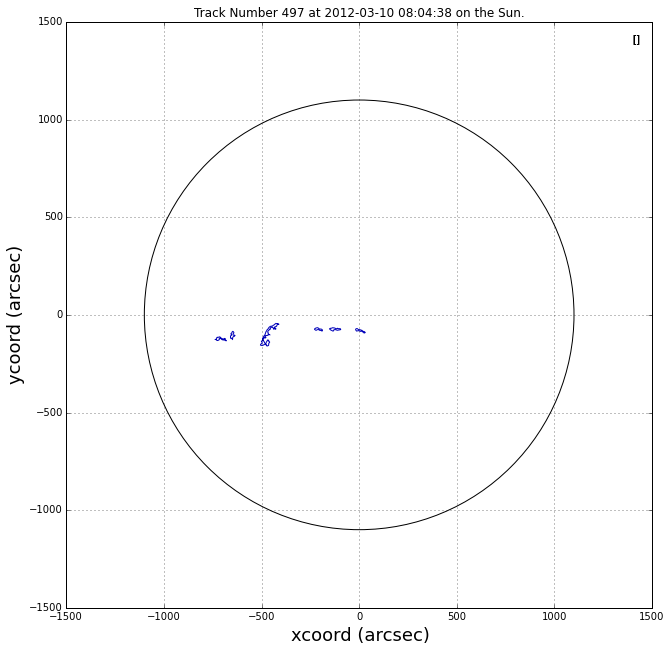

2012-03-06 17:41:32
2012-03-07 19:16:04
2012-03-08 18:08:02
2012-03-09 08:33:48
2012-03-09 18:22:02
2012-03-10 08:04:38
2012-03-11 08:13:19
2012-03-12 08:07:30


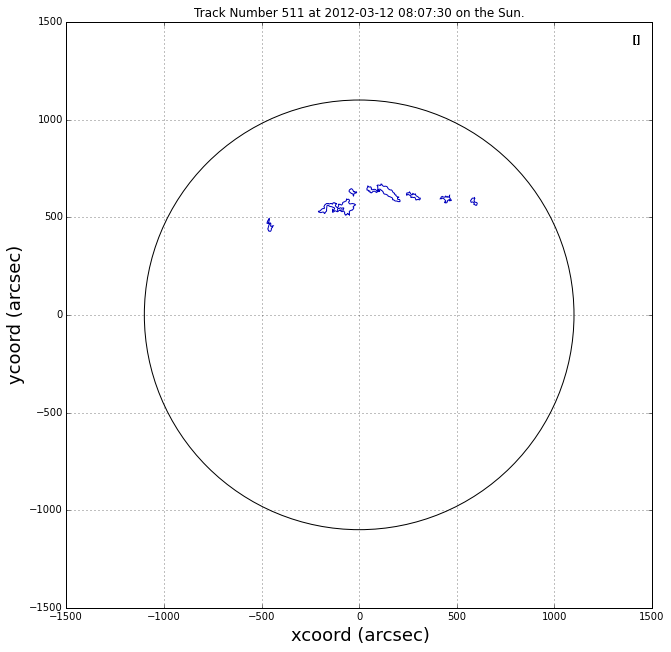

2012-03-08 18:08:02
2012-03-09 08:33:48
2012-03-10 08:04:38
2012-03-11 08:13:19
2012-03-12 08:07:30
2012-03-12 19:09:13
2012-03-13 07:27:39
2012-03-13 17:07:57
2012-03-14 07:40:10
2012-03-14 16:54:36
2012-03-15 07:03:23
2012-03-15 16:40:23
2012-03-16 17:51:24
2012-03-17 06:36:19
2012-03-18 06:32:26


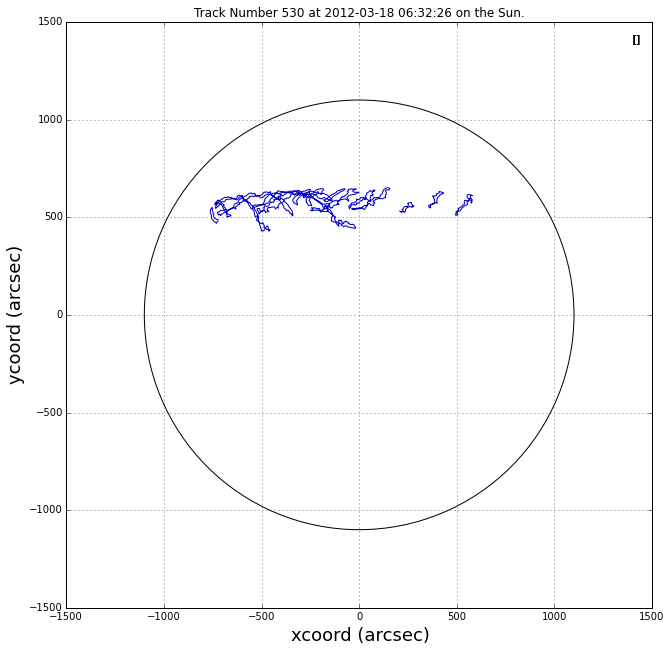

2012-03-08 18:08:02
2012-03-09 08:33:48
2012-03-09 18:22:02
2012-03-10 08:04:38
2012-03-12 08:07:30
2012-03-12 19:09:13
2012-03-13 07:27:39
2012-03-13 17:07:57
2012-03-14 07:40:10
2012-03-14 16:54:36
2012-03-15 16:40:23
2012-03-16 17:51:24


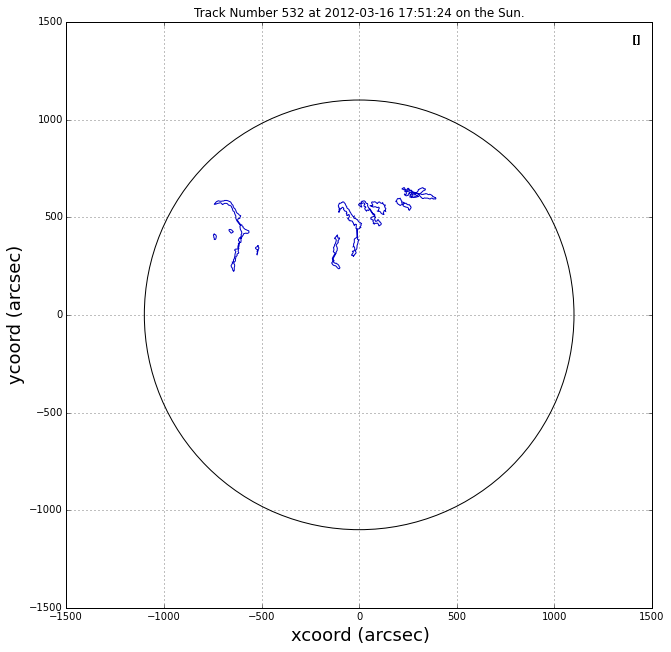

2012-03-11 08:13:19
2012-03-12 19:09:13
2012-03-13 07:27:39
2012-03-13 17:07:57
2012-03-14 16:54:36
2012-03-15 07:03:23
2012-03-16 06:20:55


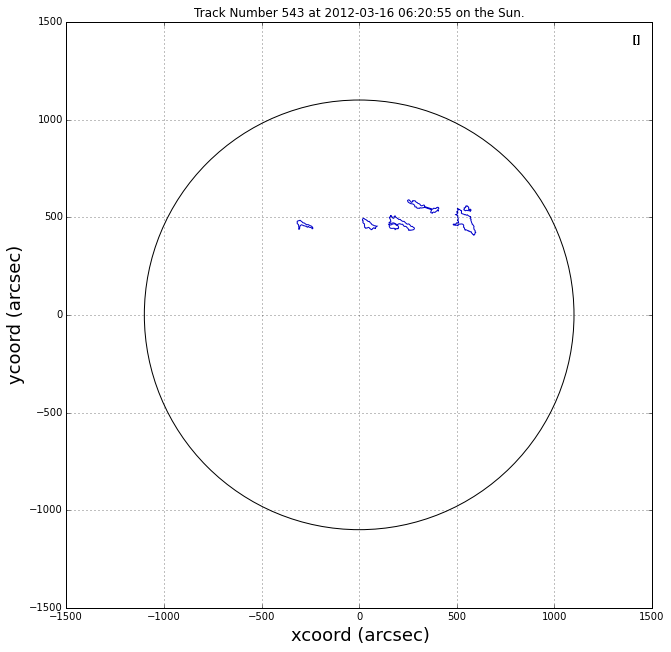

2012-03-12 08:07:30
2012-03-12 19:09:13
2012-03-13 07:27:39
2012-03-13 17:07:57
2012-03-14 07:40:10
2012-03-14 16:54:36
2012-03-15 16:40:23
2012-03-16 17:51:24
2012-03-17 06:36:19
2012-03-18 06:32:26
2012-03-19 10:31:22
2012-03-20 11:00:41


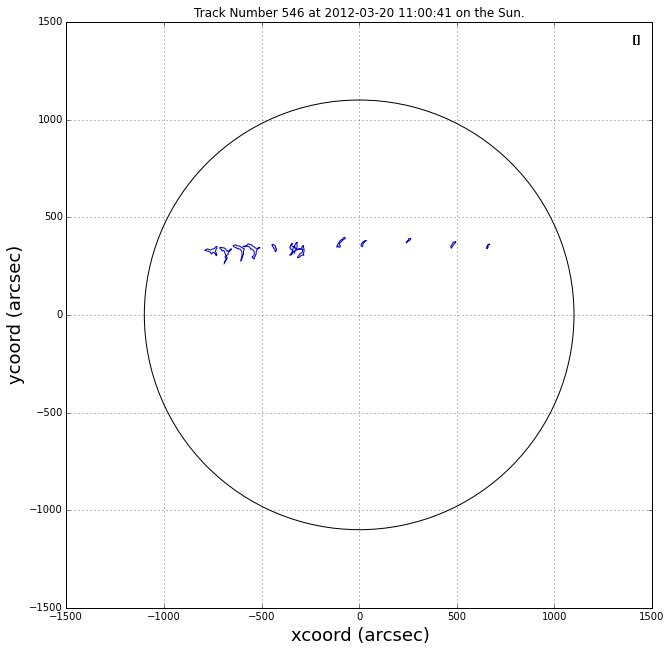

2012-03-12 19:09:13
2012-03-13 17:07:57
2012-03-14 07:40:10
2012-03-15 07:03:23
2012-03-15 16:40:23
2012-03-16 06:20:55
2012-03-16 17:51:24


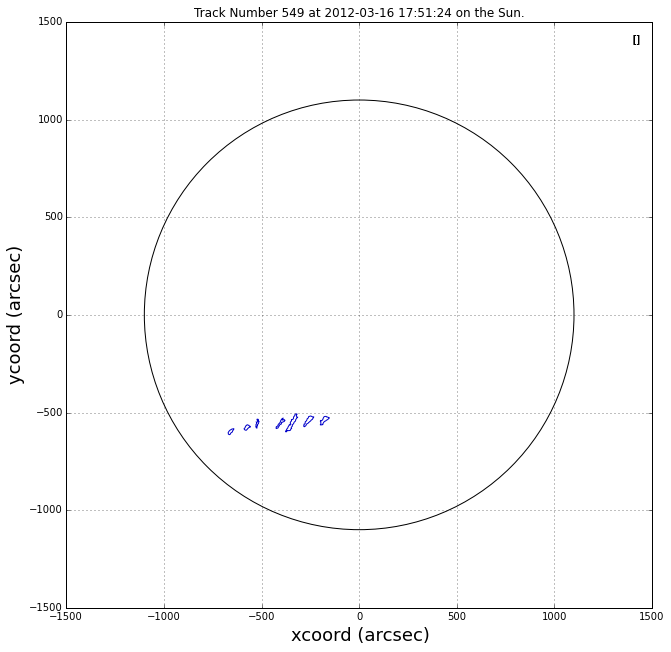

2012-03-12 19:09:13
2012-03-13 17:07:57
2012-03-14 07:40:10
2012-03-14 16:54:36
2012-03-15 07:03:23
2012-03-15 16:40:23
2012-03-16 06:20:55
2012-03-16 17:51:24


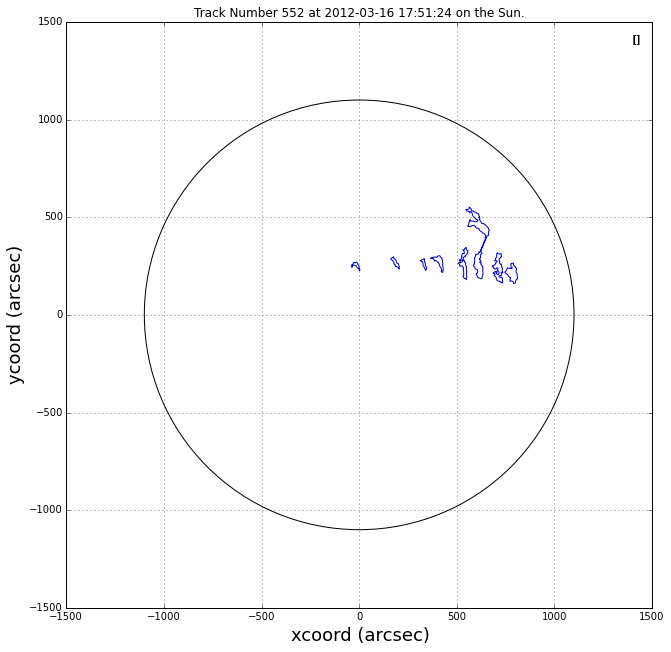

2012-03-14 16:54:36
2012-03-15 16:40:23
2012-03-16 06:20:55
2012-03-16 17:51:24
2012-03-17 06:36:19
2012-03-20 11:00:41
2012-03-20 18:02:37
2012-03-21 07:37:31
2012-03-21 16:52:38


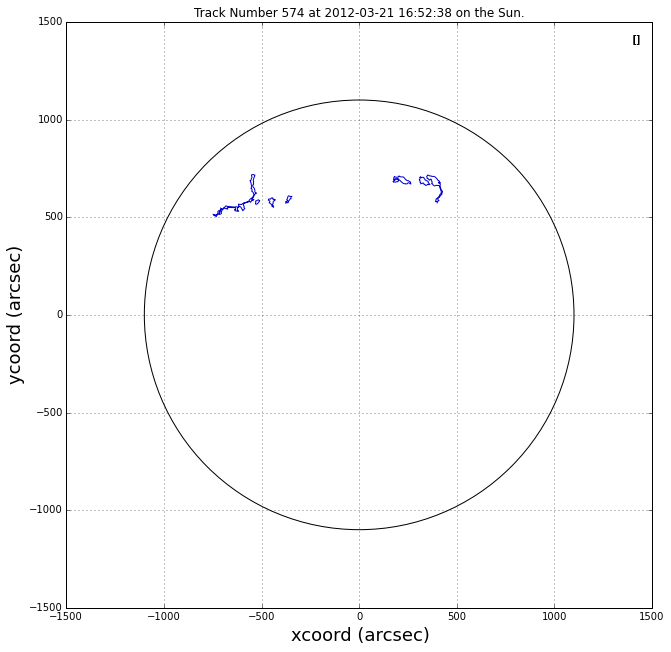

2012-03-20 18:02:37
2012-03-21 07:37:31
2012-03-21 16:52:38
2012-03-22 18:05:17
2012-03-23 19:09:36
2012-03-26 20:13:50


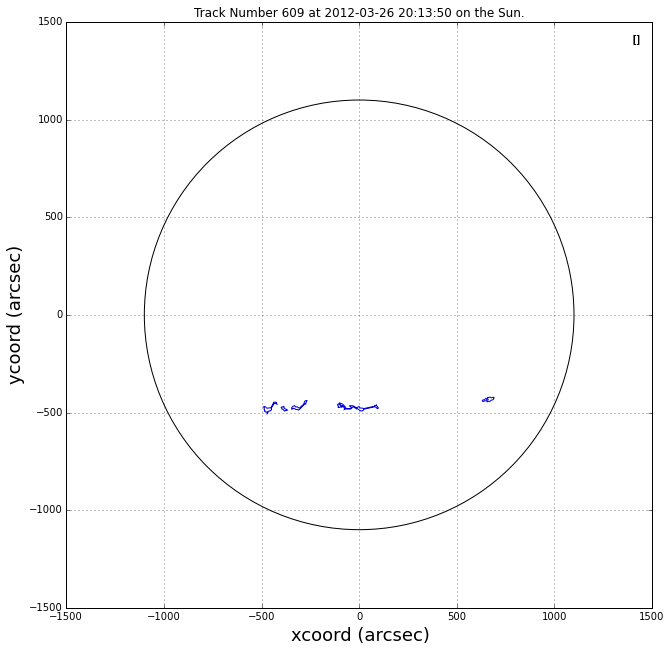

2012-03-21 16:52:38
2012-03-22 18:05:17
2012-03-23 19:09:36
2012-03-26 20:13:50
2012-03-27 17:19:34
2012-03-29 17:08:46


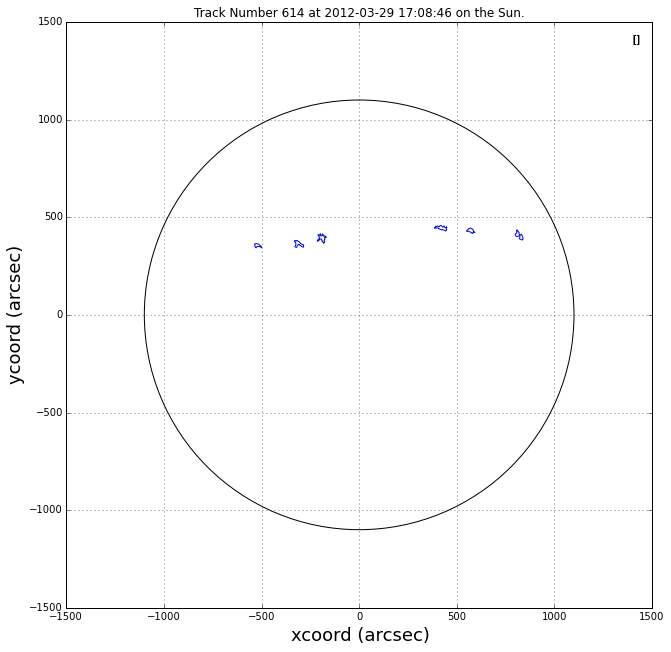

2012-03-22 18:05:17
2012-03-23 19:09:36
2012-03-26 20:13:50
2012-03-27 17:19:34
2012-03-28 18:56:45
2012-03-29 17:08:46
2012-03-30 16:40:20


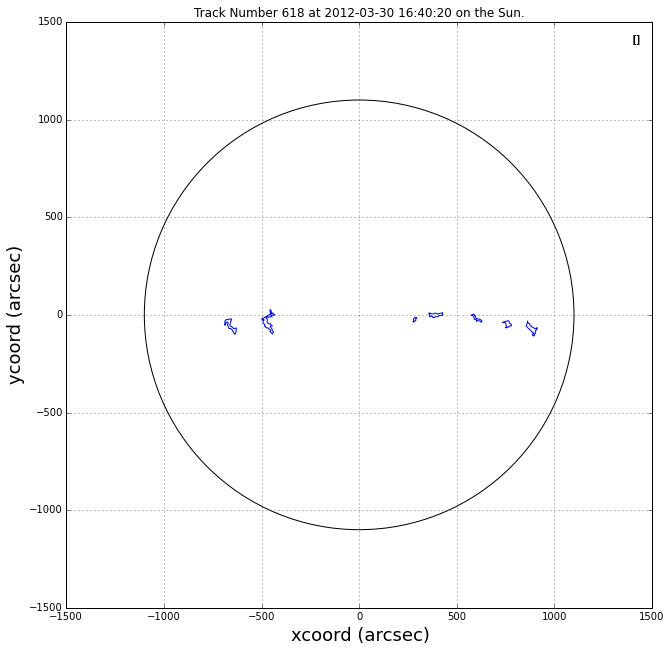

2012-03-26 20:13:50
2012-03-27 17:19:34
2012-03-28 18:56:45
2012-04-03 17:39:13
2012-04-04 18:27:50
2012-04-05 16:53:57


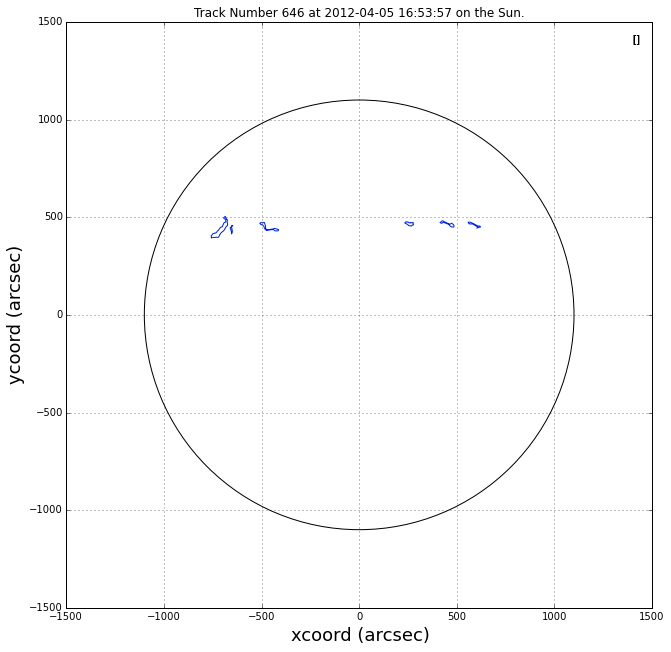

2012-04-16 18:40:44
2012-04-17 16:52:31
2012-04-18 17:54:42
2012-04-19 18:22:28
2012-04-20 18:21:44
2012-04-24 16:38:38


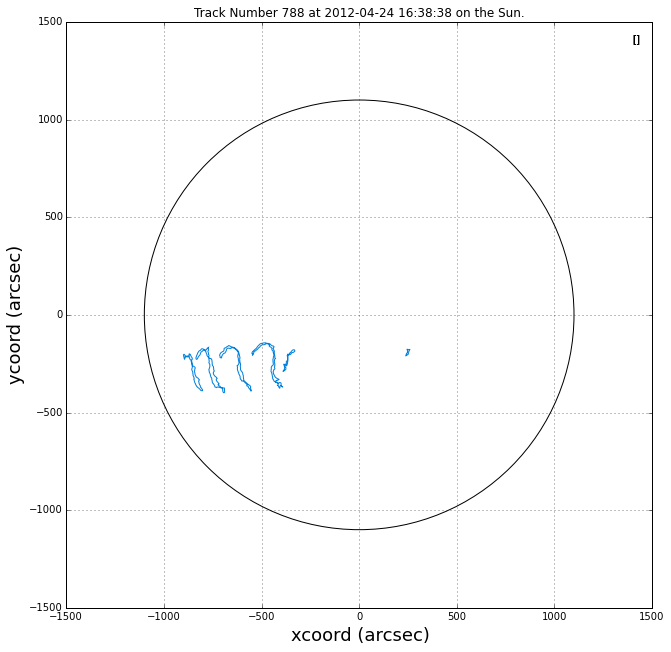

2012-04-20 18:21:44
2012-04-23 16:43:07
2012-04-24 16:38:38
2012-04-26 06:32:48
2012-04-27 05:50:43
2012-04-27 17:47:11
2012-04-28 05:35:14


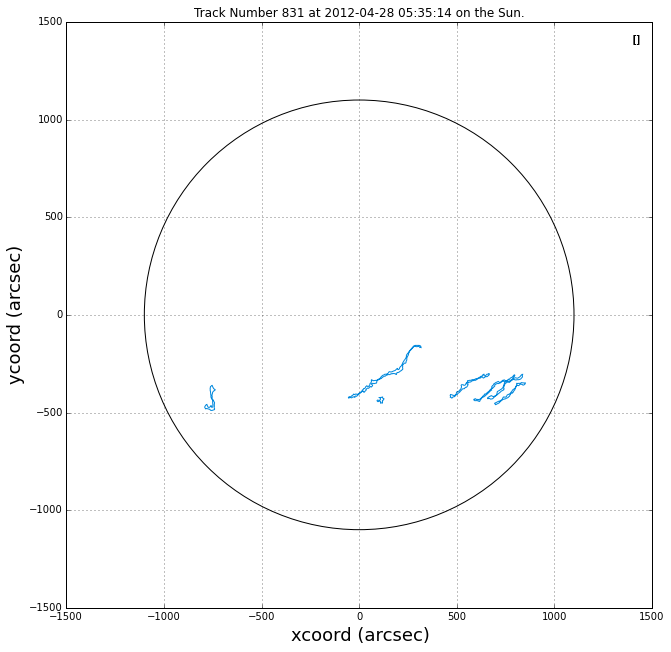

2012-04-23 16:43:07
2012-04-24 16:38:38
2012-04-26 06:32:48
2012-04-27 05:50:43
2012-04-27 17:47:11
2012-04-28 05:35:14
2012-04-29 05:38:43
2012-04-30 11:48:08
2012-04-30 16:50:18
2012-05-01 05:15:08
2012-05-02 06:36:54
2012-05-02 16:47:35
2012-05-03 06:06:17


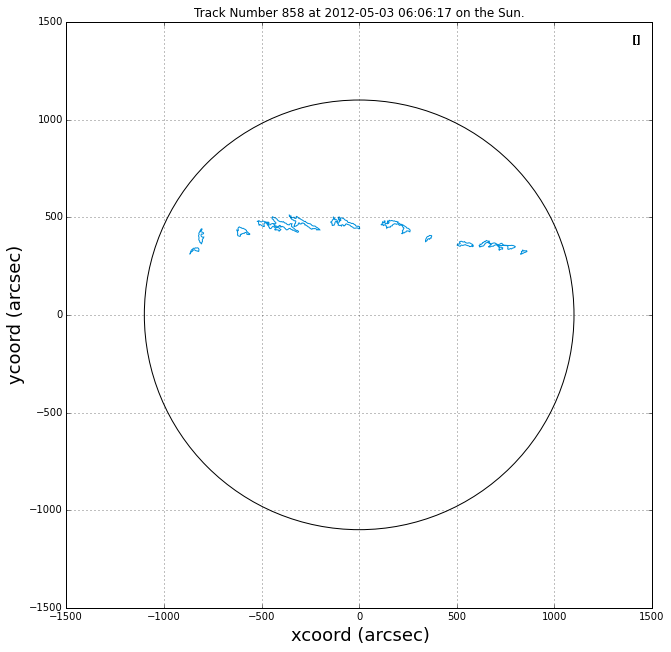

2012-04-23 16:43:07
2012-04-24 16:38:38
2012-04-26 06:32:48
2012-04-27 05:50:43
2012-04-28 05:35:14
2012-04-29 05:38:43
2012-04-30 16:50:18


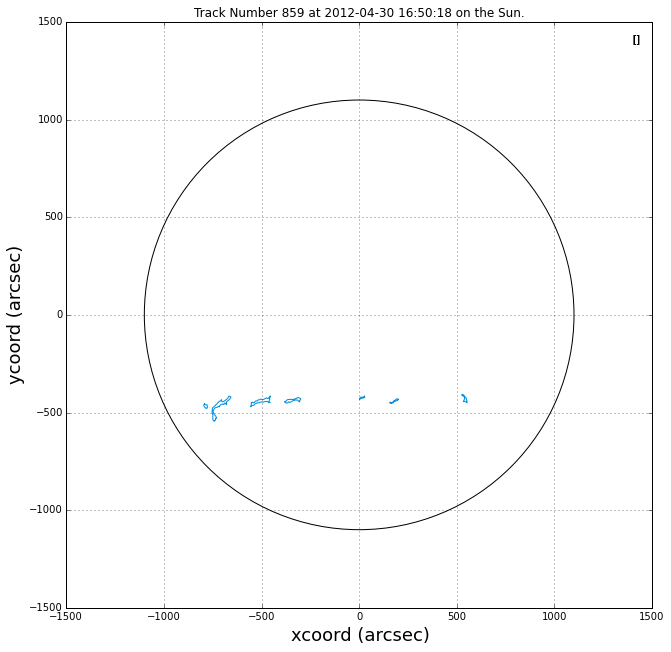

2012-04-26 06:32:48
2012-04-27 05:50:43
2012-04-27 17:47:11
2012-04-28 05:35:14
2012-04-29 05:38:43
2012-04-30 11:48:08
2012-04-30 16:50:18
2012-05-01 05:15:08
2012-05-01 21:46:48
2012-05-02 06:36:54
2012-05-02 16:47:35


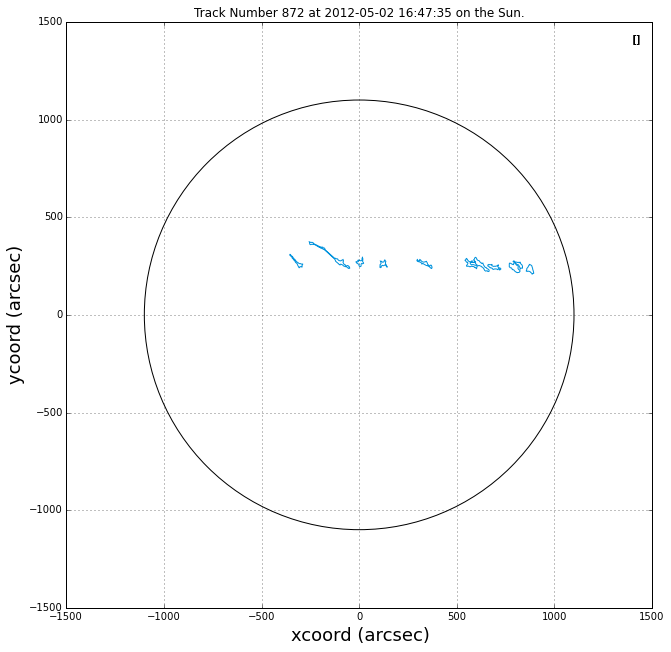

2012-04-27 05:50:43
2012-04-27 17:47:11
2012-04-28 05:35:14
2012-04-29 05:38:43
2012-04-30 16:50:18
2012-05-01 05:15:08
2012-05-01 21:46:48
2012-05-02 16:47:35
2012-05-03 19:07:30
2012-05-04 06:15:20
2012-05-04 17:22:03


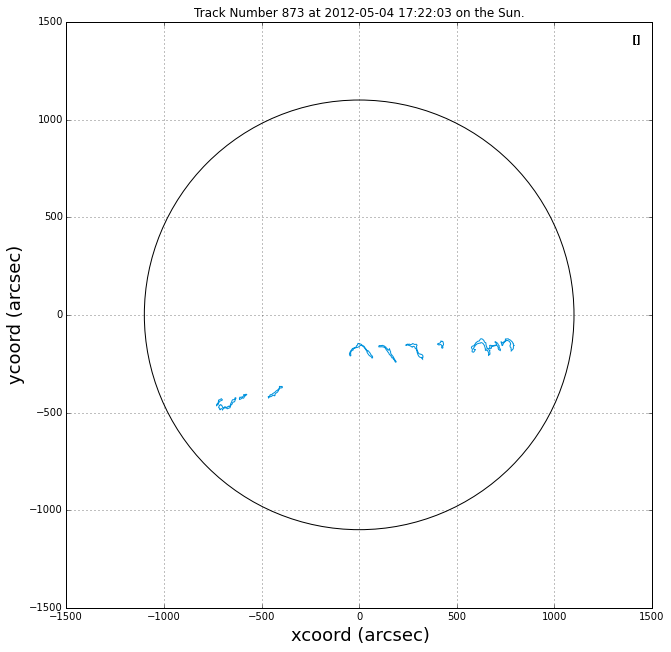

2012-04-27 05:50:43
2012-04-27 17:47:11
2012-04-28 05:35:14
2012-04-29 05:38:43
2012-04-30 11:48:08
2012-05-01 05:15:08
2012-05-01 21:46:48
2012-05-02 06:36:54
2012-05-02 16:47:35
2012-05-03 06:06:17


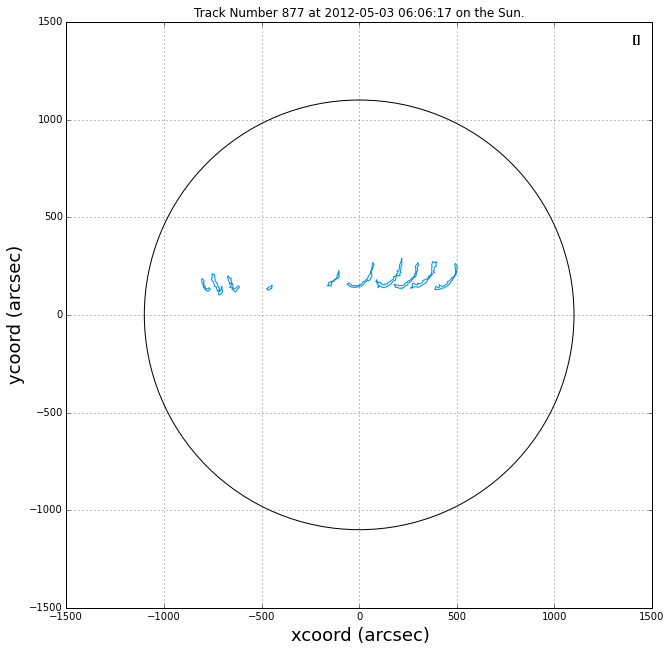

2012-04-27 17:47:11
2012-04-28 05:35:14
2012-04-29 05:38:43
2012-04-30 11:48:08
2012-05-02 06:36:54
2012-05-02 16:47:35
2012-05-03 06:06:17
2012-05-03 19:07:30
2012-05-04 17:22:03


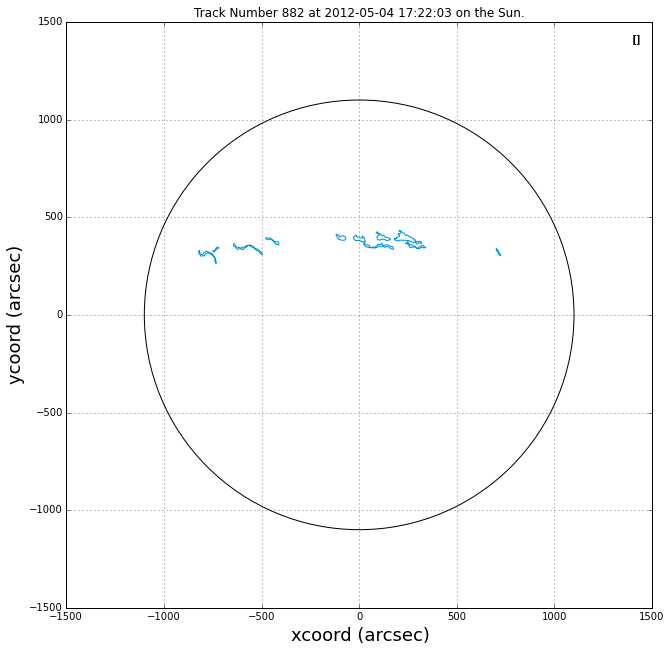

2012-04-27 17:47:11
2012-04-28 05:35:14
2012-04-29 05:38:43
2012-04-30 11:48:08
2012-04-30 16:50:18
2012-05-01 21:46:48


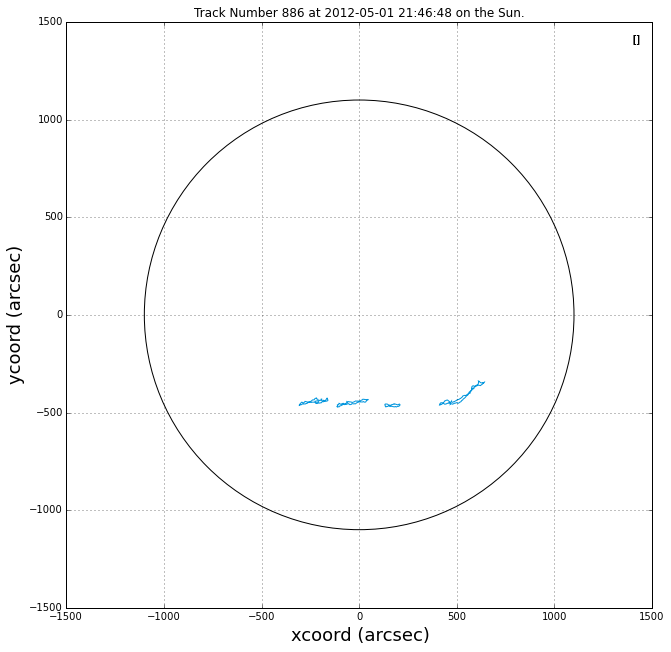

2012-04-30 16:50:18
2012-05-01 05:15:08
2012-05-01 21:46:48
2012-05-02 16:47:35
2012-05-03 06:06:17
2012-05-03 19:07:30
2012-05-04 06:15:20
2012-05-04 17:22:03
2012-05-05 07:27:28


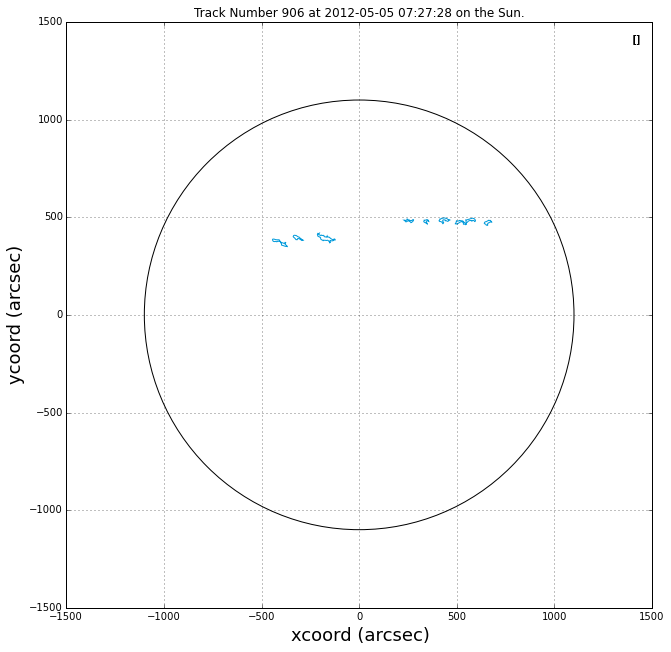

2012-04-30 16:50:18
2012-05-01 05:15:08
2012-05-01 21:46:48
2012-05-02 06:36:54
2012-05-03 06:06:17
2012-05-04 06:15:20
2012-05-06 05:55:21


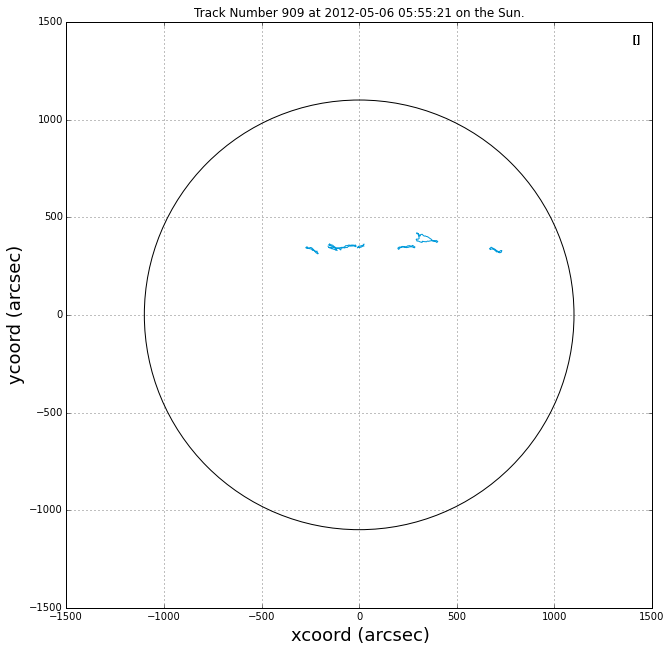

2012-04-30 16:50:18
2012-05-01 21:46:48
2012-05-02 06:36:54
2012-05-02 16:47:35
2012-05-03 06:06:17
2012-05-03 19:07:30
2012-05-04 06:15:20
2012-05-04 17:22:03
2012-05-05 07:27:28
2012-05-06 05:55:21


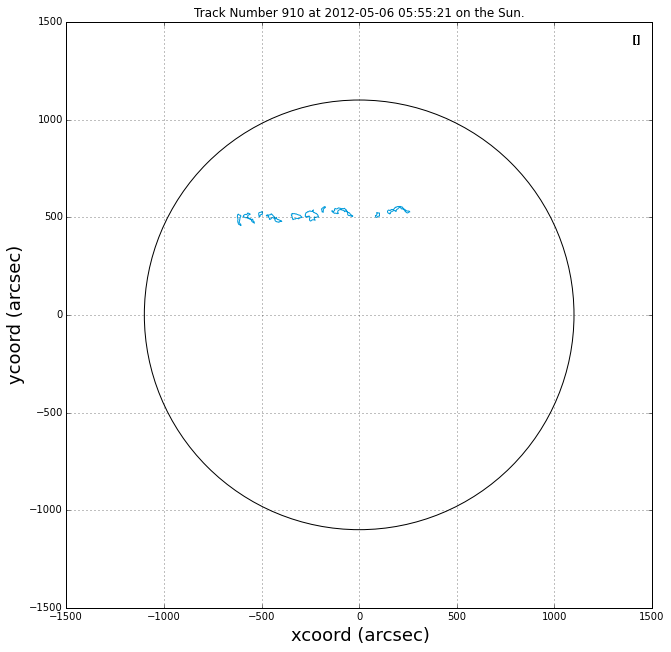

2012-05-01 21:46:48
2012-05-03 19:07:30
2012-05-04 06:15:20
2012-05-04 17:22:03
2012-05-05 07:27:28
2012-05-06 05:55:21


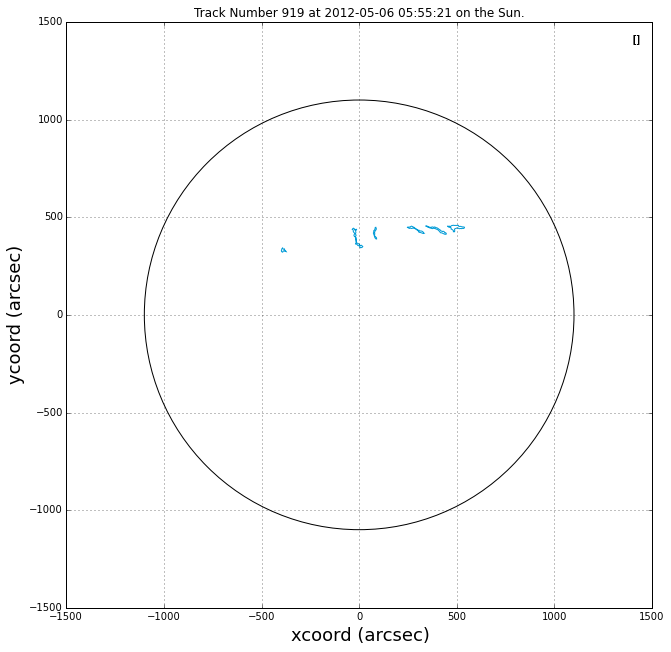

2012-05-03 19:07:30
2012-05-04 06:15:20
2012-05-04 17:22:03
2012-05-07 17:05:48
2012-05-08 06:12:54
2012-05-08 19:25:56
2012-05-09 06:18:25
2012-05-11 06:00:30


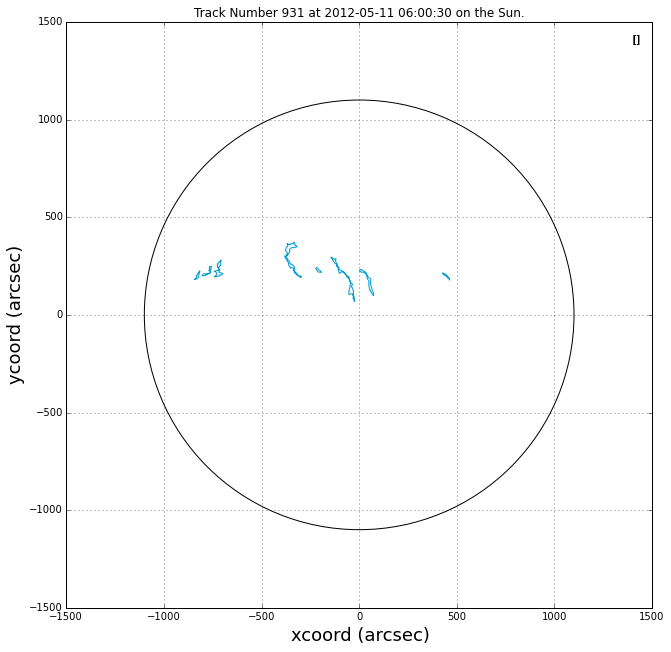

2012-05-04 17:22:03
2012-05-06 05:55:21
2012-05-07 12:49:23
2012-05-07 17:05:48
2012-05-08 06:12:54
2012-05-08 19:25:56
2012-05-09 06:18:25
2012-05-09 16:13:00
2012-05-10 06:07:14
2012-05-10 16:56:24
2012-05-11 06:00:30


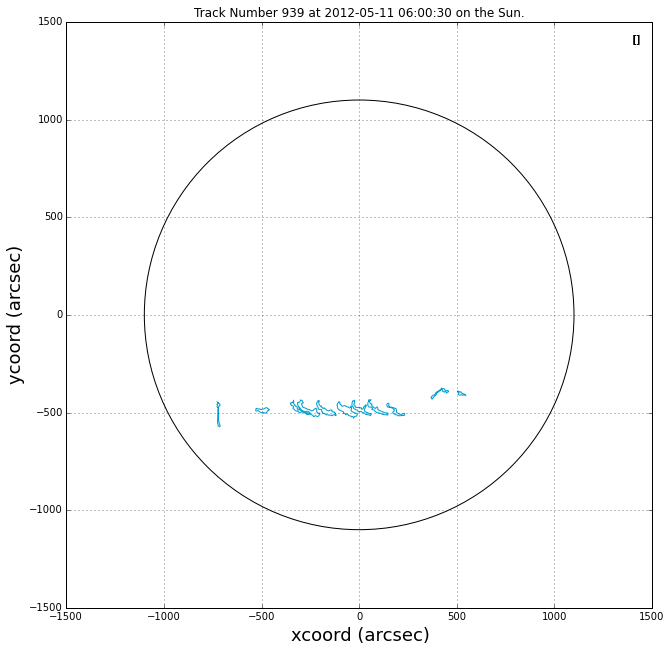

2012-05-06 05:55:21
2012-05-07 17:05:48
2012-05-08 19:25:56
2012-05-09 06:18:25
2012-05-09 16:13:00
2012-05-10 06:07:14
2012-05-10 16:56:24
2012-05-11 06:00:30
2012-05-11 16:32:11


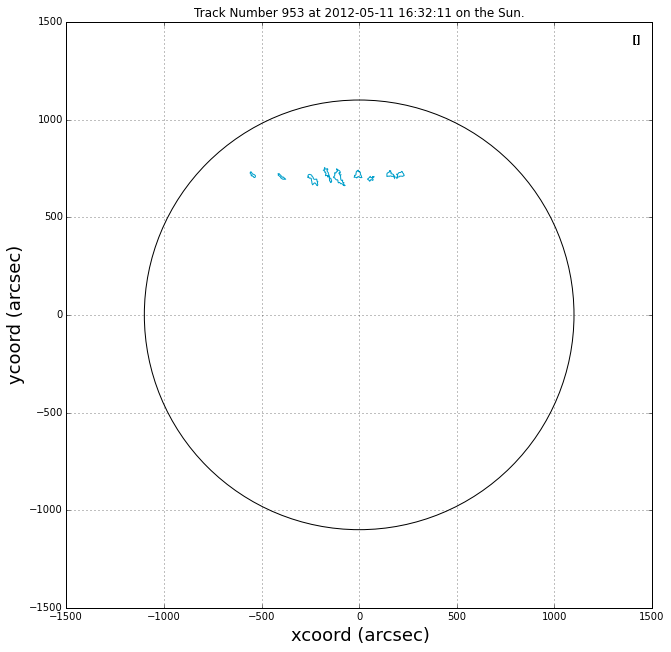

2012-05-07 12:49:23
2012-05-07 17:05:48
2012-05-08 19:25:56
2012-05-09 06:18:25
2012-05-09 16:13:00
2012-05-10 06:07:14
2012-05-10 16:56:24
2012-05-11 06:00:30
2012-05-11 16:32:11


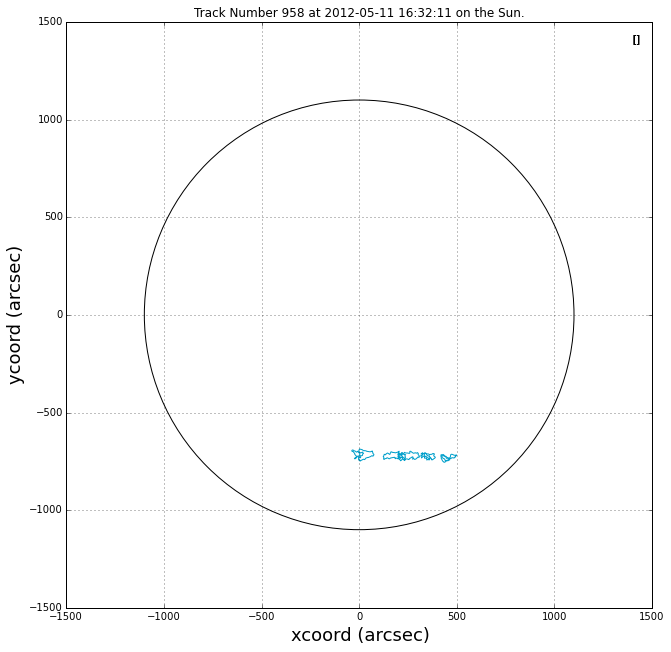

2012-05-07 17:05:48
2012-05-08 06:12:54
2012-05-08 19:25:56
2012-05-09 06:18:25
2012-05-09 16:13:00
2012-05-10 16:56:24
2012-05-11 16:32:11


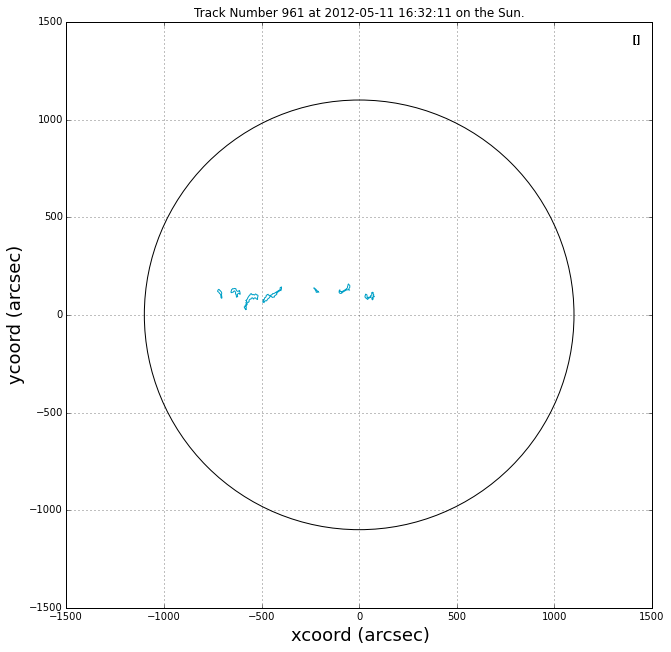

2012-05-07 17:05:48
2012-05-08 06:12:54
2012-05-08 19:25:56
2012-05-09 06:18:25
2012-05-09 16:13:00
2012-05-10 06:07:14
2012-05-11 06:00:30
2012-05-11 16:32:11
2012-05-12 06:07:56


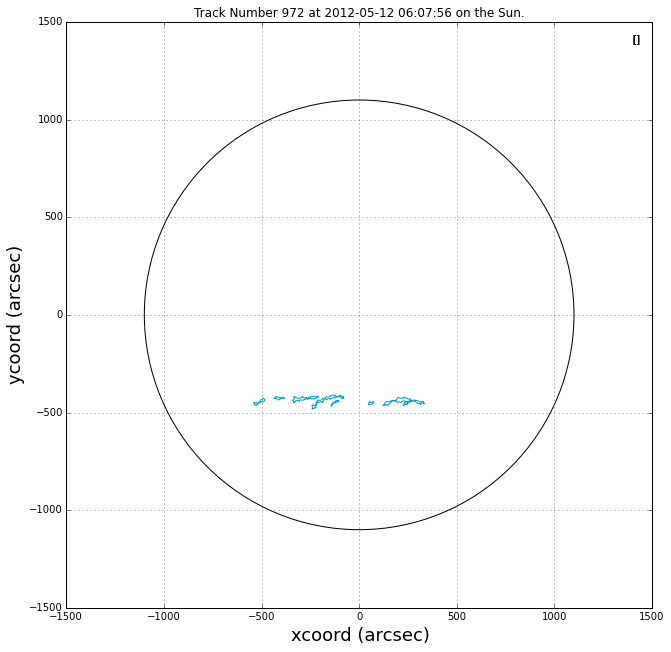

2012-05-07 17:05:48
2012-05-08 19:25:56
2012-05-09 06:18:25
2012-05-09 16:13:00
2012-05-10 06:07:14
2012-05-10 16:56:24


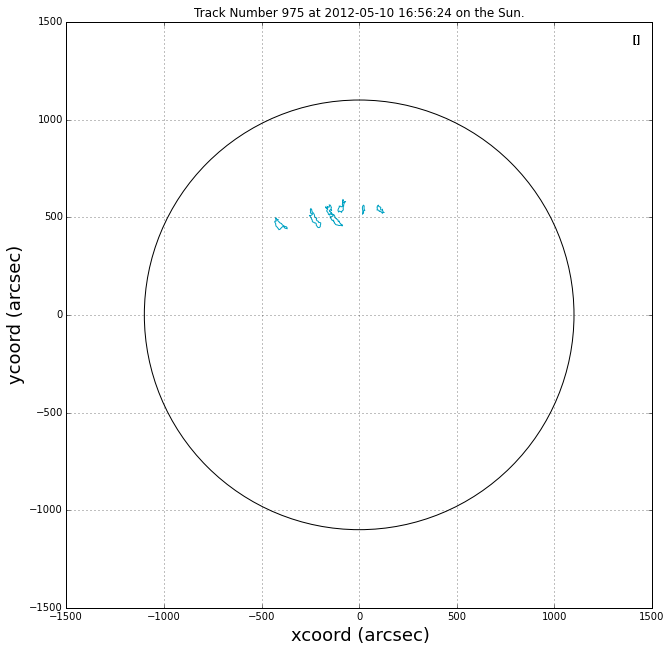

2012-05-08 19:25:56
2012-05-09 16:13:00
2012-05-10 06:07:14
2012-05-10 16:56:24
2012-05-11 16:32:11
2012-05-12 06:07:56


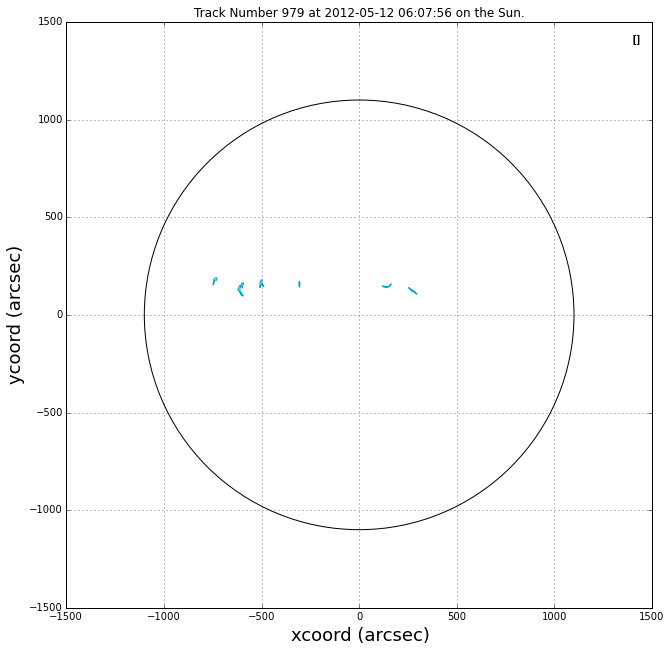

2012-05-08 19:25:56
2012-05-09 06:18:25
2012-05-10 06:07:14
2012-05-10 16:56:24
2012-05-11 06:00:30
2012-05-11 16:32:11
2012-05-12 06:07:56


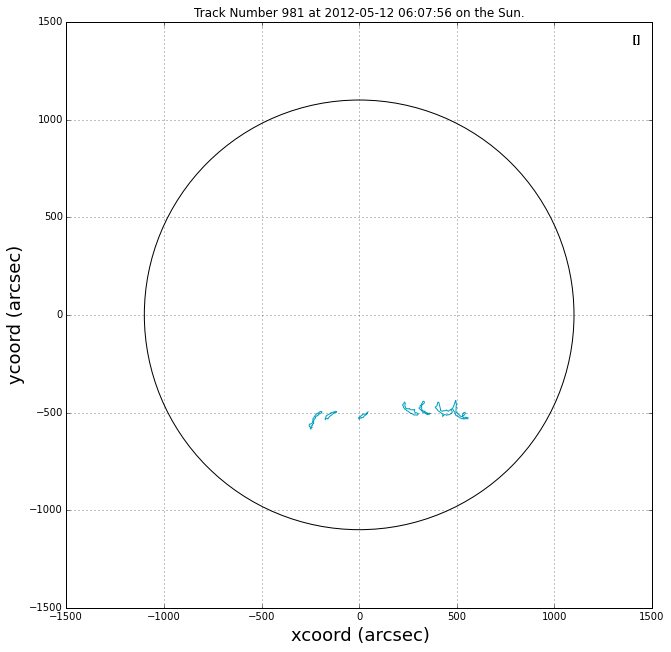

2012-05-08 19:25:56
2012-05-09 06:18:25
2012-05-09 16:13:00
2012-05-10 06:07:14
2012-05-11 06:00:30
2012-05-11 16:32:11
2012-05-14 06:22:35


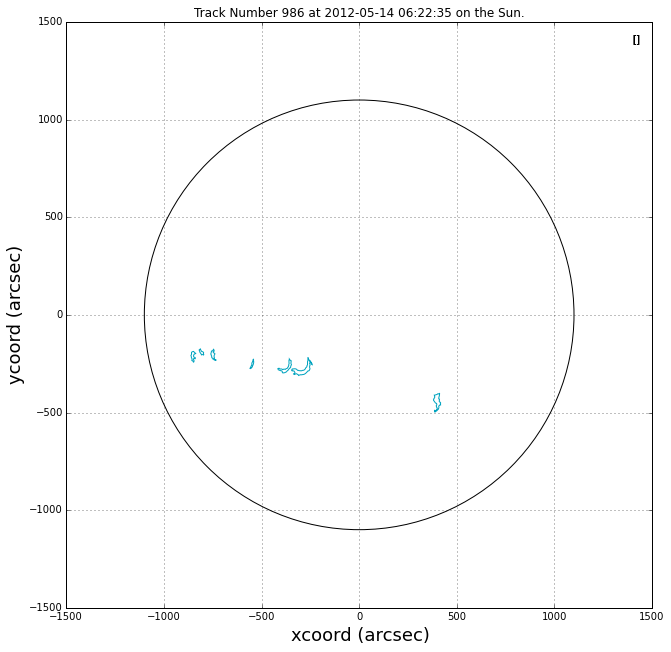

2012-05-09 06:18:25
2012-05-09 16:13:00
2012-05-10 06:07:14
2012-05-10 16:56:24
2012-05-11 06:00:30
2012-05-12 06:07:56


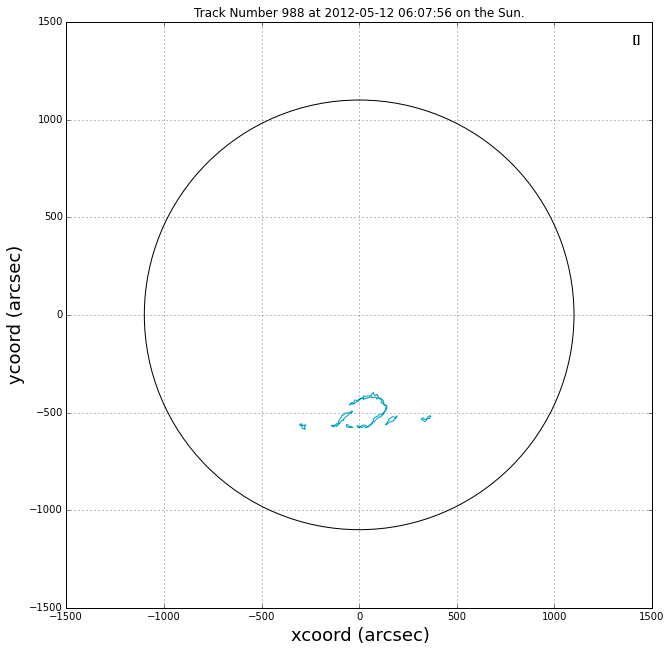

2012-05-14 17:32:46
2012-05-15 16:08:49
2012-05-16 18:00:12
2012-05-17 17:39:49
2012-05-18 17:29:19
2012-05-22 17:41:44
2012-05-23 16:56:54


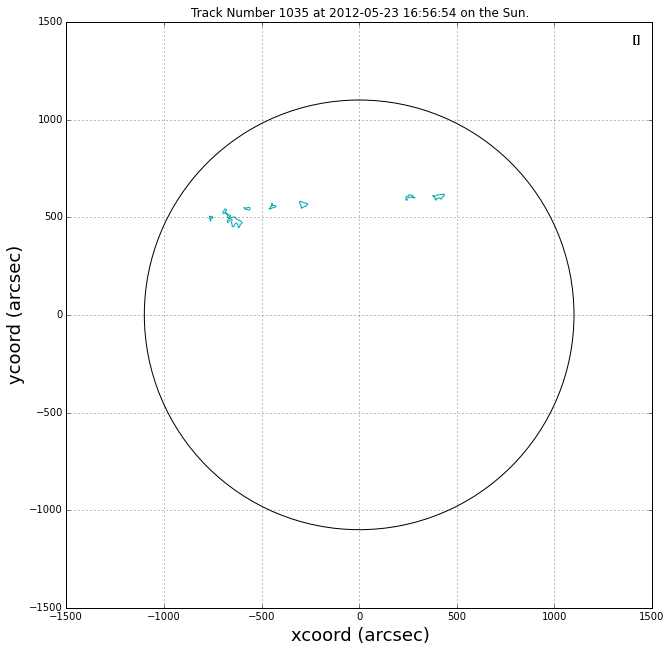

2012-05-15 16:08:49
2012-05-16 18:00:12
2012-05-17 07:50:23
2012-05-17 17:39:49
2012-05-18 06:27:32
2012-05-18 17:29:19
2012-05-19 05:45:00
2012-05-20 05:51:14
2012-05-20 22:59:40
2012-05-21 18:50:57
2012-05-22 17:41:44


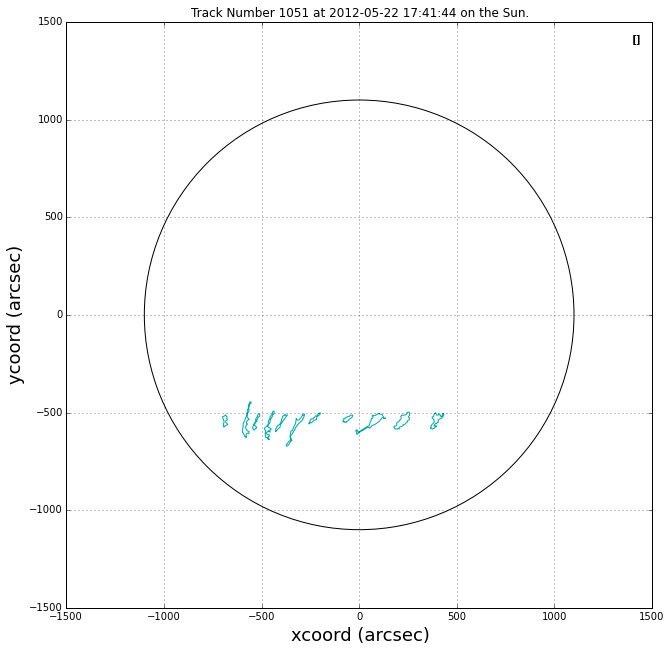

2012-05-15 16:08:49
2012-05-16 18:00:12
2012-05-17 17:39:49
2012-05-18 17:29:19
2012-05-20 05:51:14
2012-05-20 22:59:40
2012-05-21 18:50:57
2012-05-22 17:41:44
2012-05-23 16:56:54


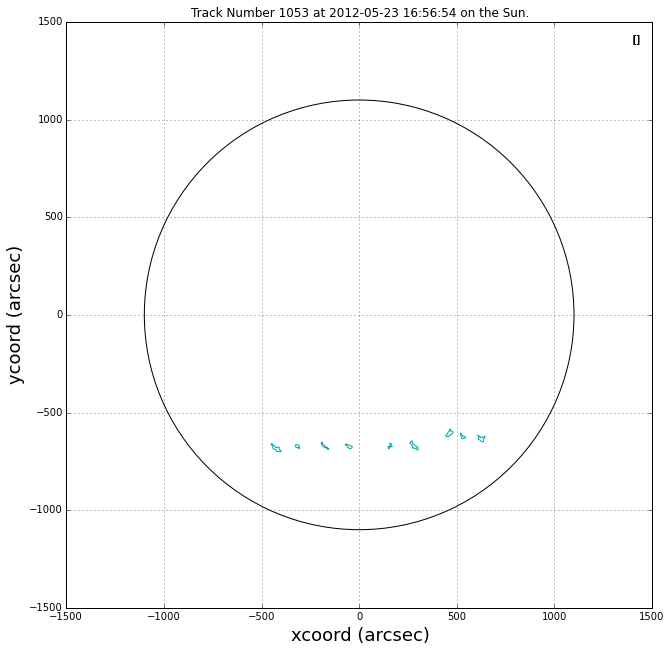

2012-05-16 18:00:12
2012-05-17 17:39:49
2012-05-19 05:45:00
2012-05-20 22:59:40
2012-05-21 18:50:57
2012-05-22 17:41:44
2012-05-24 16:38:41


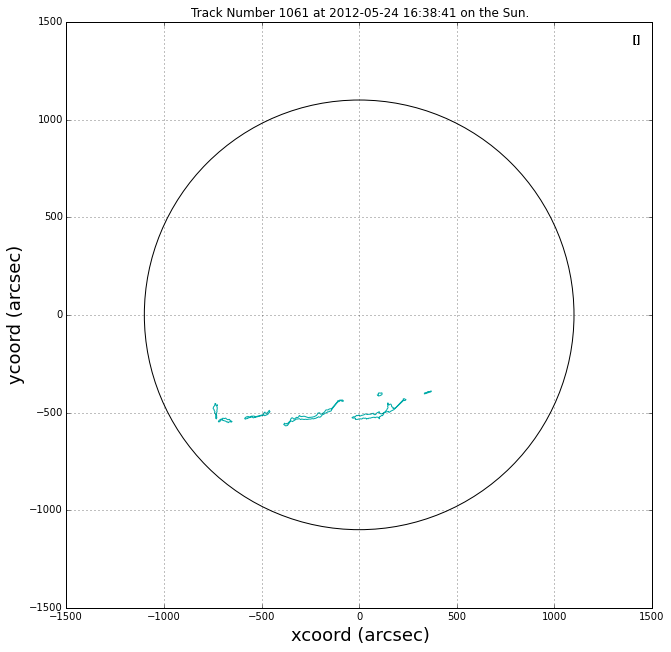

2012-05-17 07:50:23
2012-05-17 17:39:49
2012-05-18 17:29:19
2012-05-20 05:51:14
2012-05-21 18:50:57
2012-05-23 06:10:22
2012-05-23 16:56:54
2012-05-24 08:10:01
2012-05-24 16:38:41


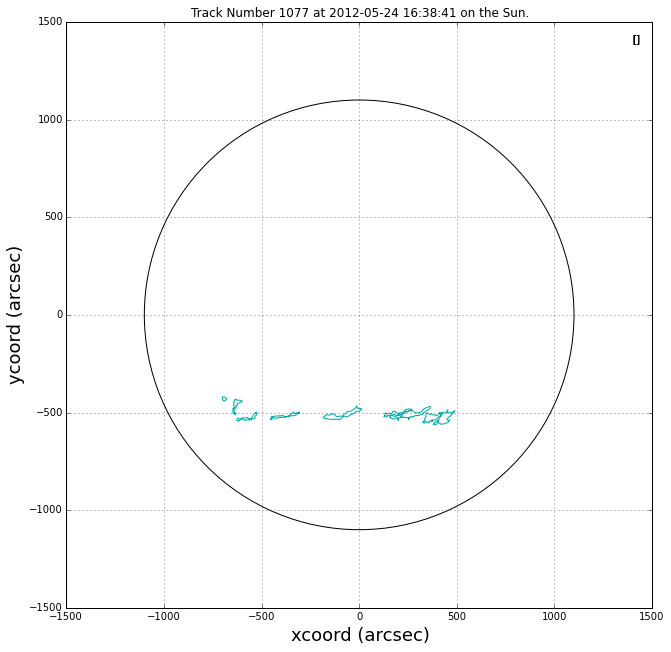

2012-05-17 17:39:49
2012-05-18 17:29:19
2012-05-19 05:45:00
2012-05-20 22:59:40
2012-05-21 18:50:57
2012-05-22 17:41:44
2012-05-23 06:10:22
2012-05-23 16:56:54
2012-05-24 16:38:41


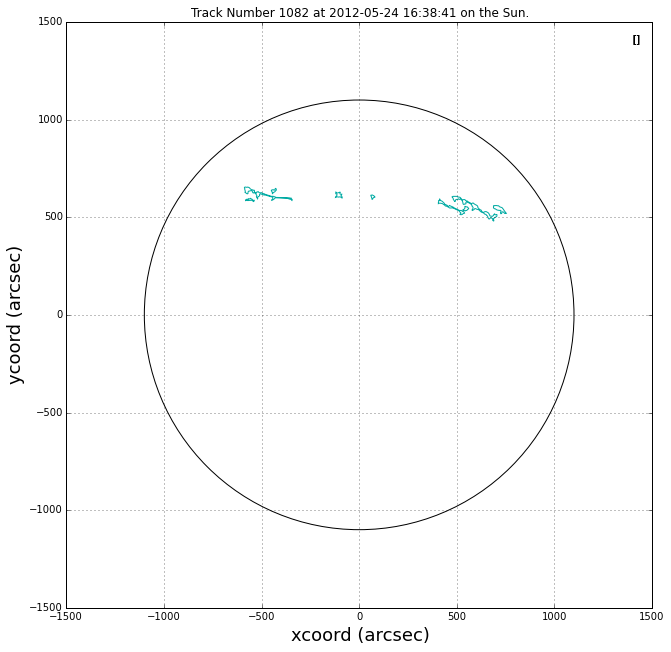

2012-05-17 17:39:49
2012-05-18 06:27:32
2012-05-18 17:29:19
2012-05-19 05:45:00
2012-05-20 22:59:40
2012-05-21 18:50:57


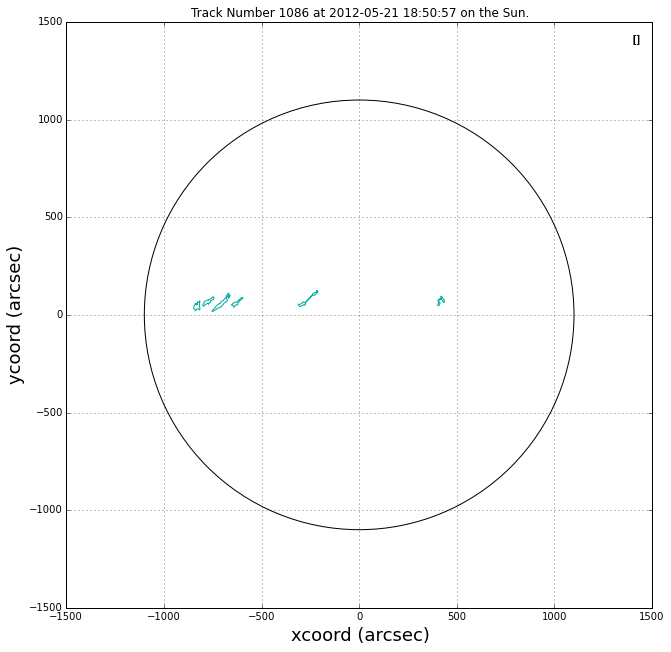

2012-05-17 17:39:49
2012-05-18 17:29:19
2012-05-21 18:50:57
2012-05-22 17:41:44
2012-05-23 06:10:22
2012-05-23 16:56:54


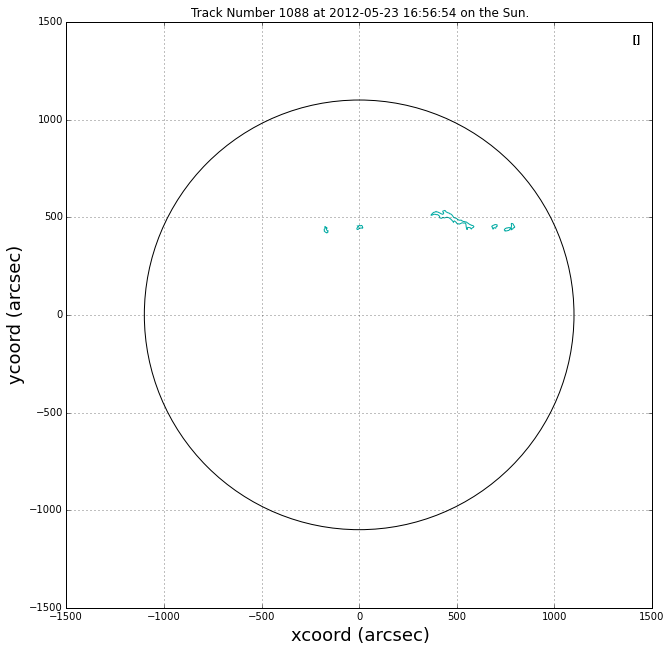

2012-05-18 06:27:32
2012-05-19 05:45:00
2012-05-20 05:51:14
2012-05-20 22:59:40
2012-05-21 18:50:57
2012-05-22 17:41:44
2012-05-23 06:10:22
2012-05-23 16:56:54
2012-05-24 08:10:01
2012-05-24 16:38:41
2012-05-26 06:30:14
2012-05-27 18:58:55
2012-05-28 06:50:09


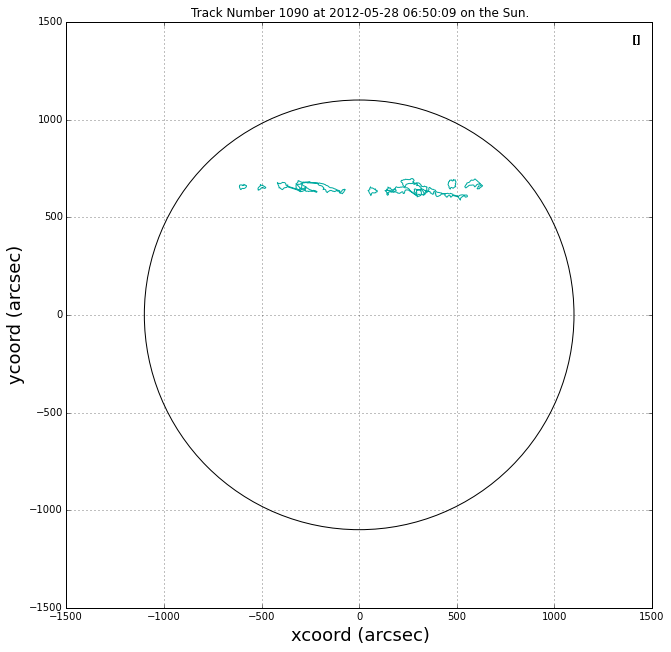

2012-05-18 17:29:19
2012-05-19 05:45:00
2012-05-20 22:59:40
2012-05-21 18:50:57
2012-05-22 17:41:44
2012-05-23 06:10:22
2012-05-23 16:56:54
2012-05-24 08:10:01
2012-05-24 16:38:41
2012-05-25 07:01:23
2012-05-26 06:30:14


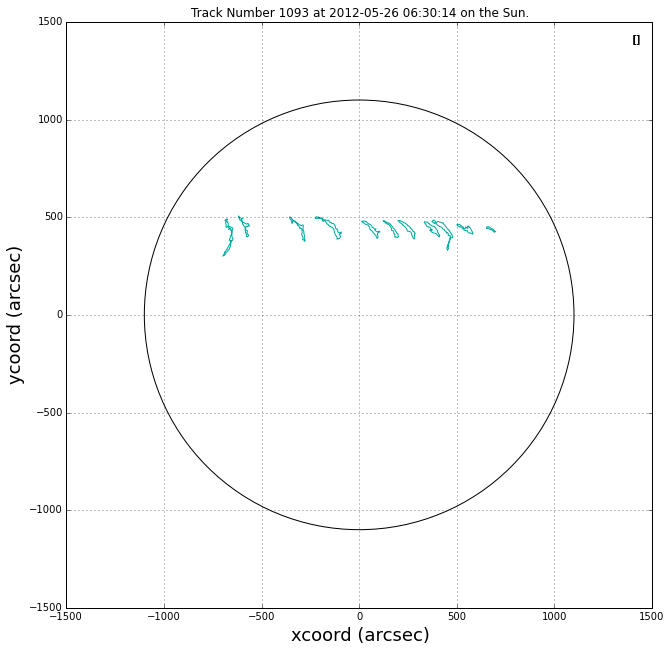

2012-05-20 22:59:40
2012-05-21 18:50:57
2012-05-22 17:41:44
2012-05-23 06:10:22
2012-05-23 16:56:54
2012-05-24 16:38:41


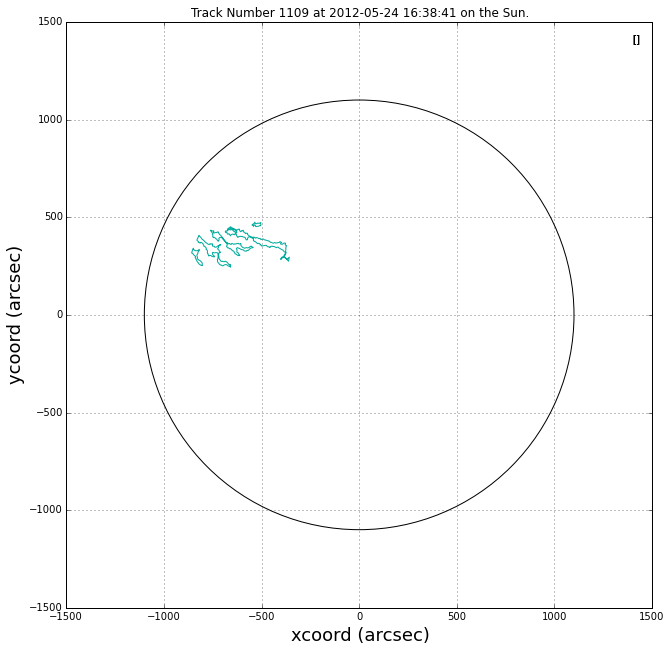

2012-05-21 18:50:57
2012-05-22 17:41:44
2012-05-24 16:38:41
2012-05-25 07:01:23
2012-05-26 06:30:14
2012-05-27 06:40:00
2012-05-28 06:50:09


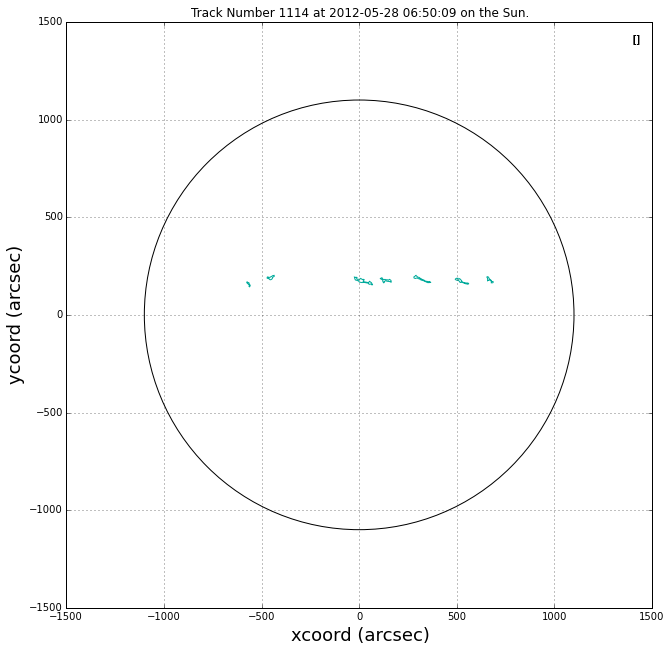

2012-05-22 17:41:44
2012-05-23 06:10:22
2012-05-23 16:56:54
2012-05-24 08:10:01
2012-05-25 07:01:23
2012-05-26 06:30:14
2012-05-27 06:40:00
2012-05-27 18:58:55
2012-05-28 06:50:09
2012-05-29 07:11:01
2012-05-29 17:05:37


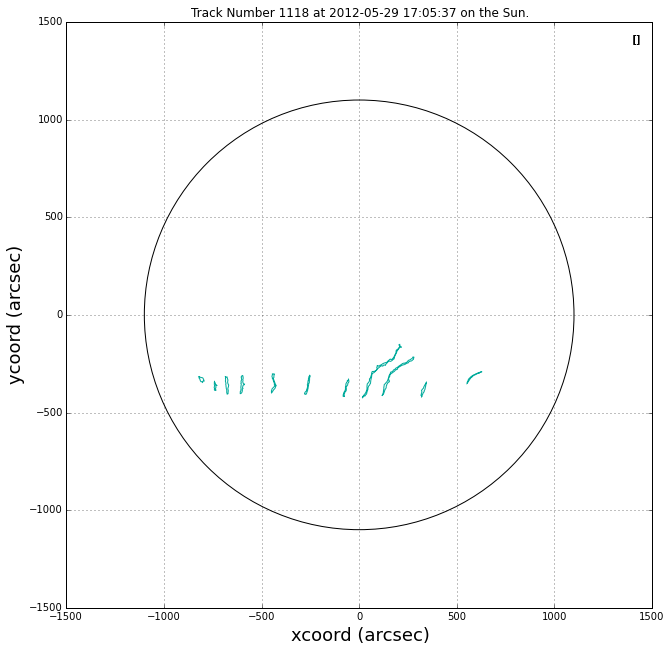

2012-05-22 17:41:44
2012-05-23 06:10:22
2012-05-23 16:56:54
2012-05-24 16:38:41
2012-05-26 06:30:14
2012-05-29 07:11:01
2012-05-29 17:05:37


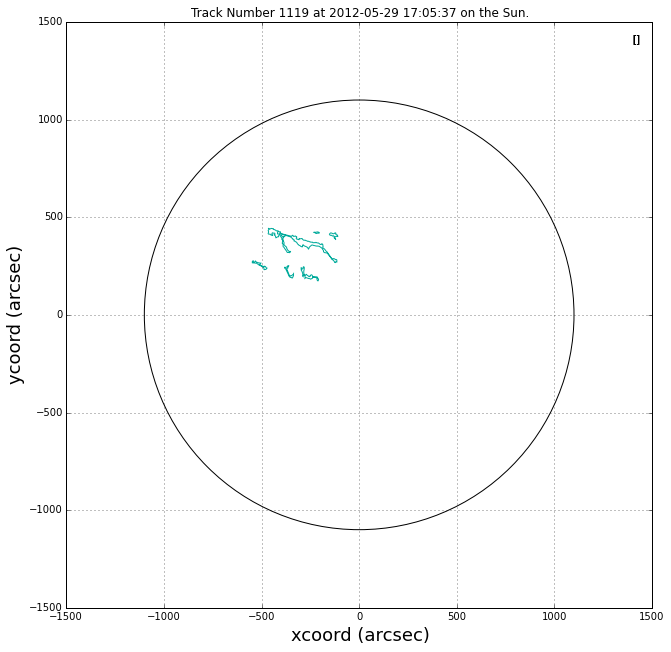

2012-05-22 17:41:44
2012-05-23 16:56:54
2012-05-24 16:38:41
2012-05-25 07:01:23
2012-05-26 06:30:14
2012-05-27 06:40:00


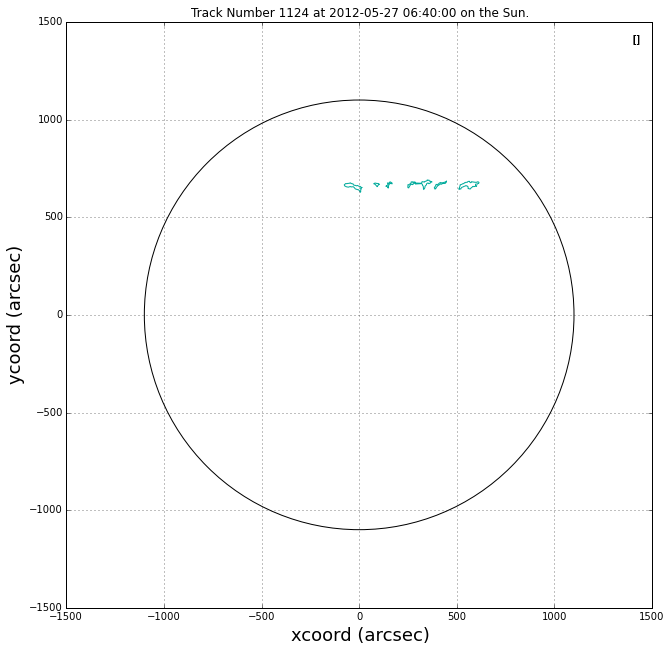

2012-05-23 06:10:22
2012-05-24 08:10:01
2012-05-25 07:01:23
2012-05-26 06:30:14
2012-05-27 06:40:00
2012-05-27 18:58:55
2012-05-28 06:50:09
2012-05-29 07:11:01
2012-05-29 17:05:37
2012-05-30 17:00:26
2012-05-31 05:51:30
2012-05-31 17:30:30
2012-06-01 06:30:47
2012-06-01 18:04:04


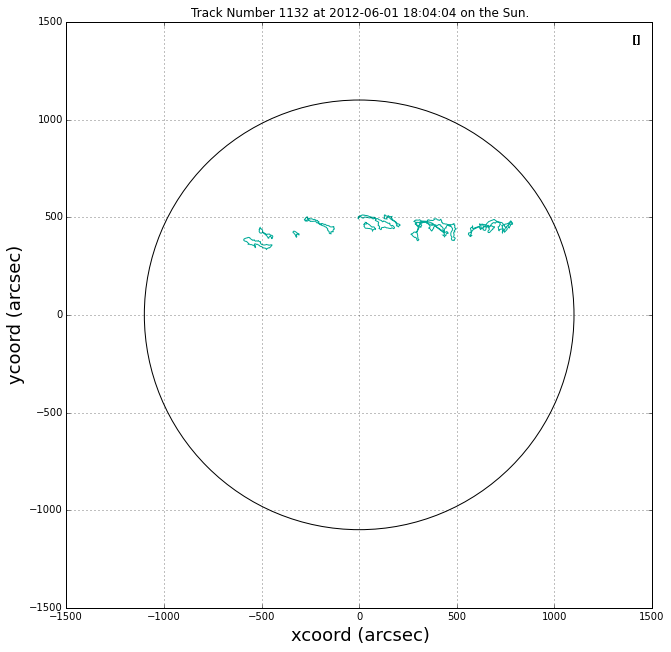

2012-05-24 08:10:01
2012-05-25 07:01:23
2012-05-26 06:30:14
2012-05-27 06:40:00
2012-05-27 18:58:55
2012-05-28 06:50:09


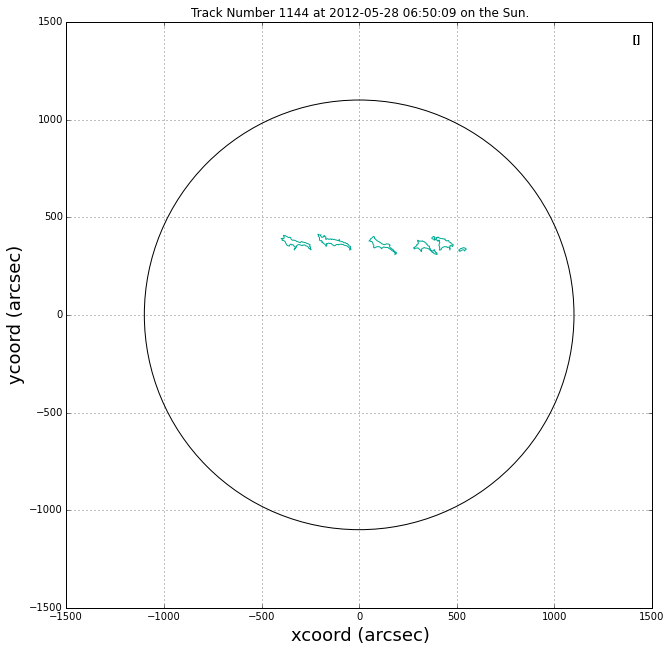

2012-05-24 16:38:41
2012-05-27 18:58:55
2012-05-28 06:50:09
2012-05-29 07:11:01
2012-05-30 07:39:22
2012-05-30 17:00:26


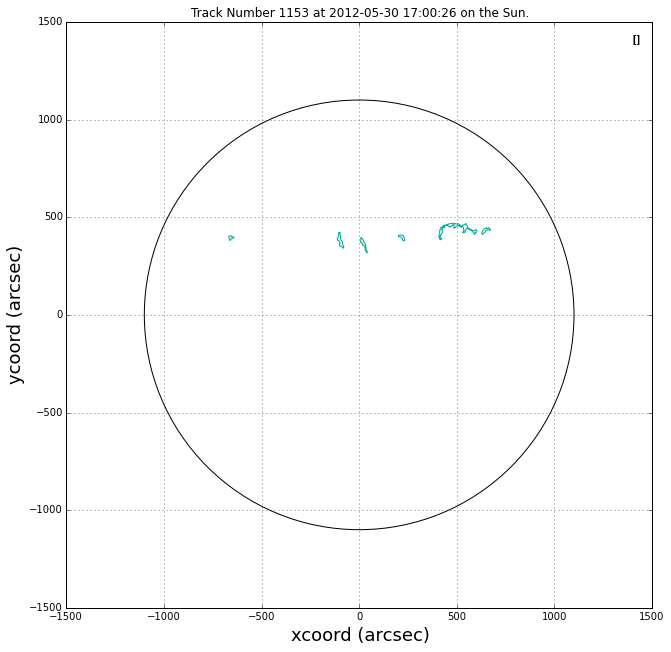

2012-05-27 06:40:00
2012-05-27 18:58:55
2012-05-29 07:11:01
2012-05-29 17:05:37
2012-05-30 07:39:22
2012-05-30 17:00:26
2012-05-31 17:30:30
2012-06-01 06:30:47
2012-06-01 18:04:04
2012-06-02 10:32:40
2012-06-02 16:17:50
2012-06-03 16:30:52


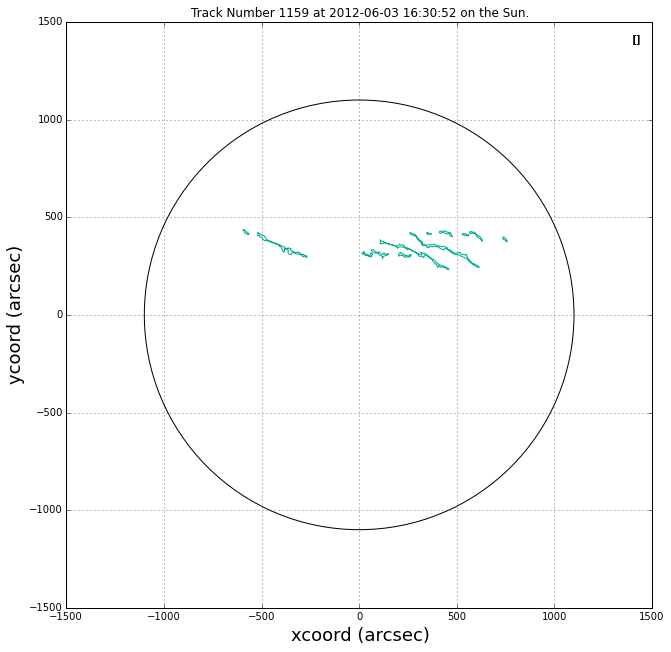

2012-05-27 18:58:55
2012-05-29 17:05:37
2012-05-30 07:39:22
2012-05-30 17:00:26
2012-05-31 17:30:30
2012-06-01 18:04:04
2012-06-02 10:32:40
2012-06-03 16:30:52
2012-06-04 16:53:05


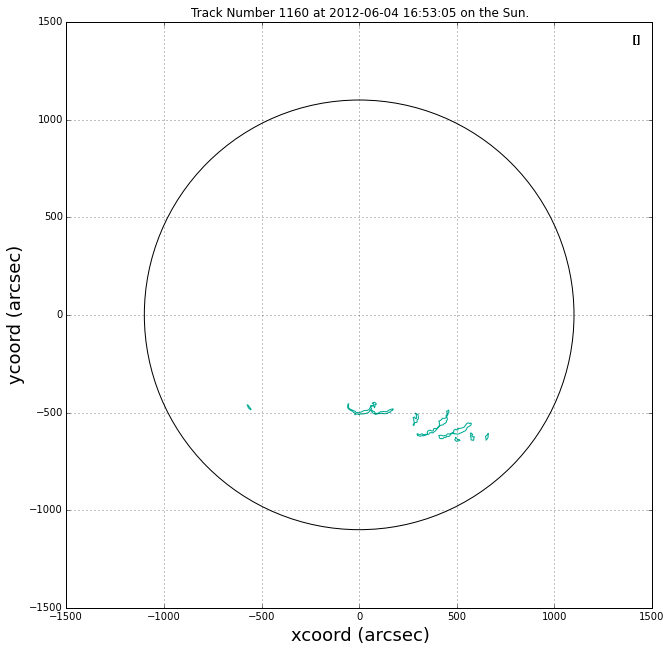

2012-05-27 18:58:55
2012-05-29 17:05:37
2012-05-30 07:39:22
2012-05-30 17:00:26
2012-05-31 05:51:30
2012-05-31 17:30:30
2012-06-01 06:30:47
2012-06-01 18:04:04
2012-06-02 16:17:50
2012-06-03 05:20:12
2012-06-03 16:30:52


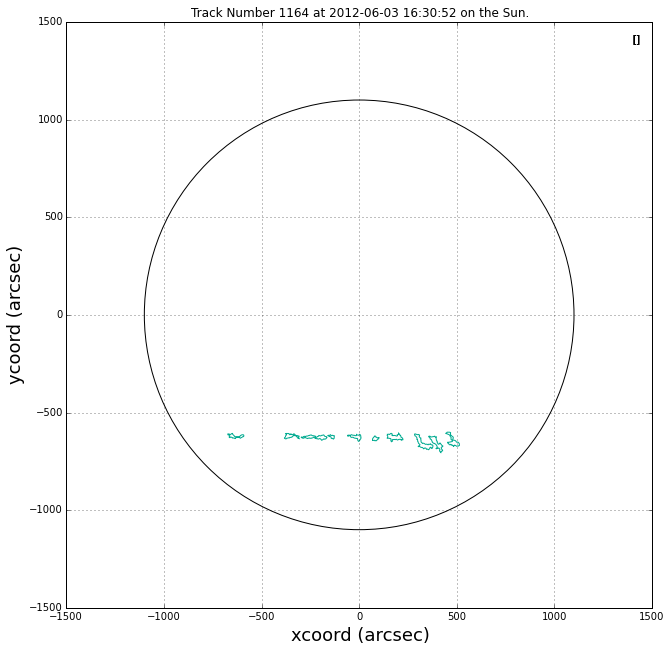

2012-05-29 07:11:01
2012-05-29 17:05:37
2012-05-30 07:39:22
2012-05-31 05:51:30
2012-05-31 17:30:30
2012-06-01 06:30:47
2012-06-01 18:04:04
2012-06-02 16:17:50
2012-06-03 16:30:52


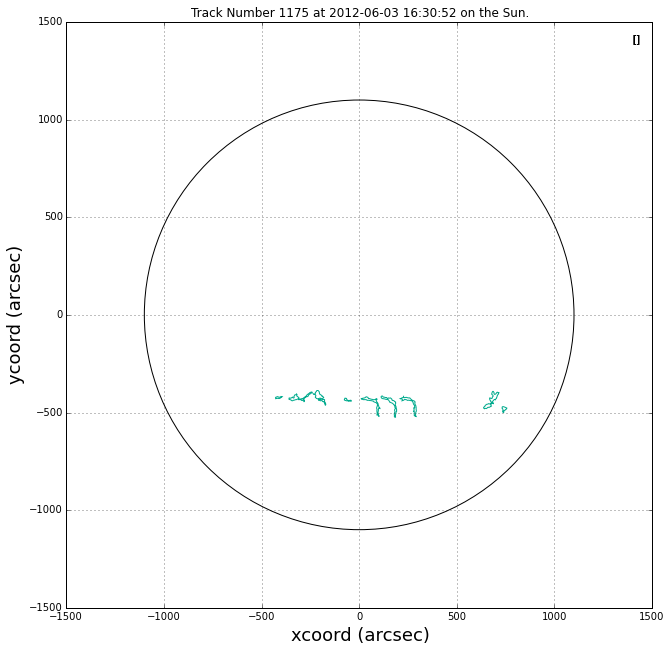

2012-05-29 17:05:37
2012-05-30 17:00:26
2012-05-31 17:30:30
2012-06-01 06:30:47
2012-06-01 18:04:04
2012-06-02 10:32:40
2012-06-03 16:30:52


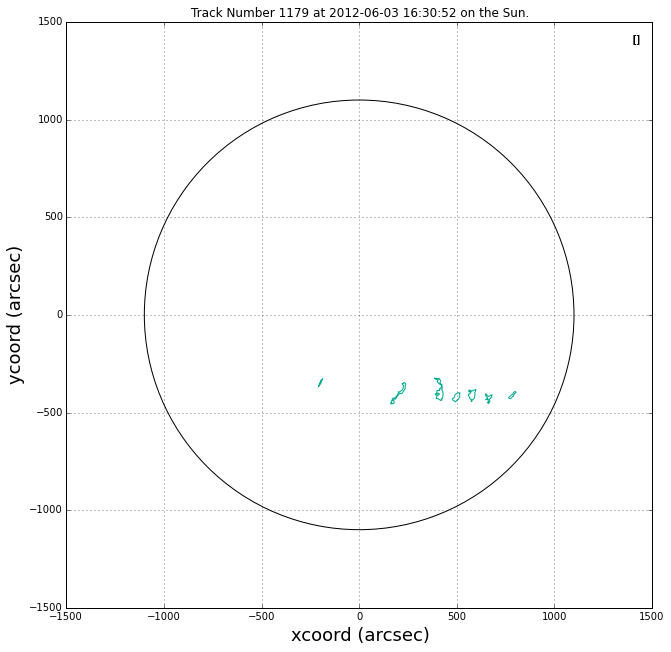

2012-05-30 07:39:22
2012-05-31 05:51:30
2012-06-01 18:04:04
2012-06-02 10:32:40
2012-06-02 16:17:50
2012-06-03 05:20:12
2012-06-03 16:30:52


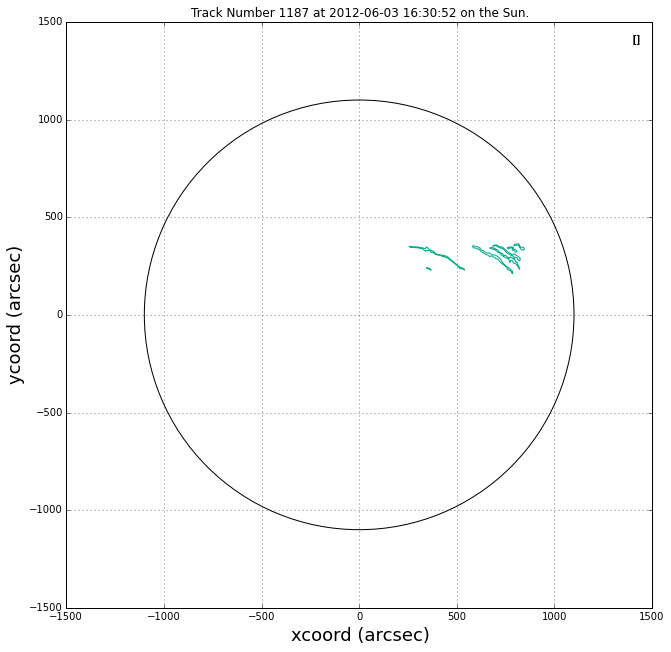

2012-06-02 16:17:50
2012-06-03 16:30:52
2012-06-04 16:53:05
2012-06-06 17:16:26
2012-06-07 05:57:37
2012-06-07 16:57:05
2012-06-08 17:11:55
2012-06-09 16:33:59
2012-06-10 18:00:13


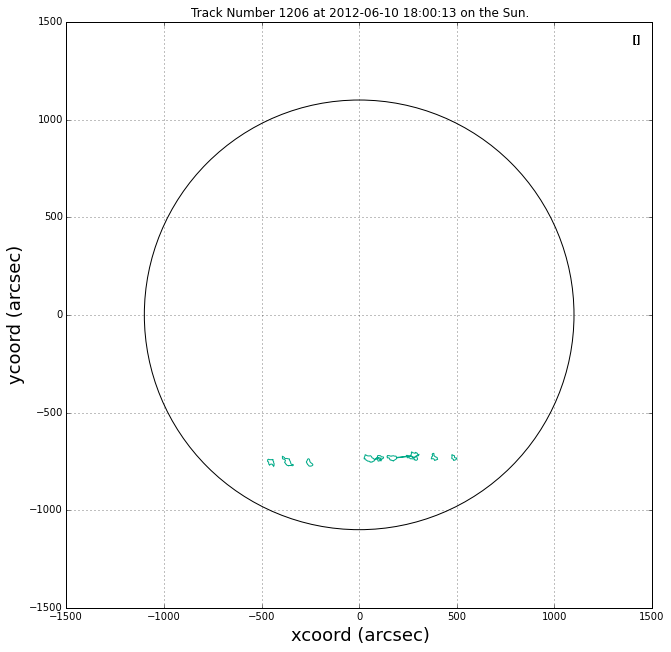

2012-06-03 16:30:52
2012-06-04 16:53:05
2012-06-05 05:27:41
2012-06-05 18:08:25
2012-06-06 07:42:10
2012-06-06 17:16:26
2012-06-07 05:57:37
2012-06-07 16:57:05
2012-06-08 06:07:34
2012-06-08 17:11:55
2012-06-09 07:15:16
2012-06-10 08:12:09
2012-06-12 06:38:45
2012-06-12 15:49:44


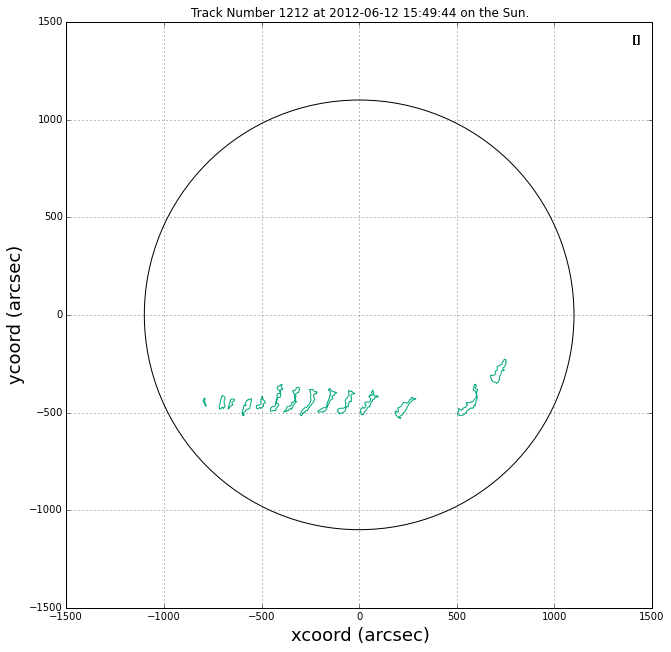

2012-06-03 16:30:52
2012-06-04 16:53:05
2012-06-05 18:08:25
2012-06-07 16:57:05
2012-06-08 06:07:34
2012-06-08 17:11:55
2012-06-09 16:33:59


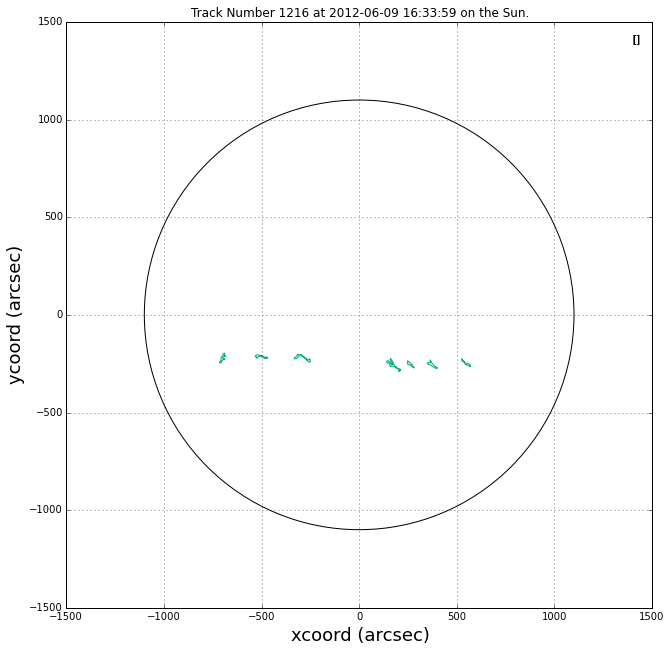

2012-06-04 16:53:05
2012-06-05 18:08:25
2012-06-06 07:42:10
2012-06-06 17:16:26
2012-06-07 16:57:05
2012-06-08 06:07:34
2012-06-08 17:11:55
2012-06-09 16:33:59
2012-06-10 08:12:09
2012-06-12 06:38:45


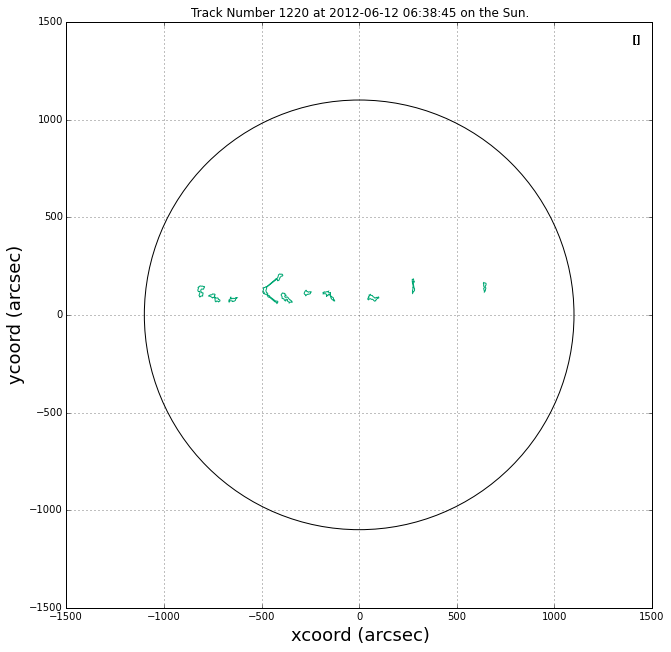

2012-06-05 18:08:25
2012-06-06 17:16:26
2012-06-08 17:11:55
2012-06-09 16:33:59
2012-06-10 08:12:09
2012-06-10 18:00:13
2012-06-11 07:25:00
2012-06-12 06:38:45


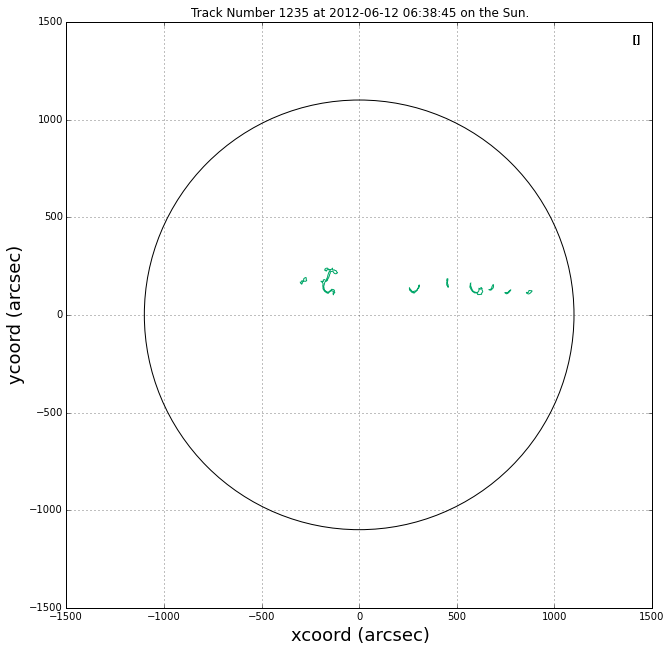

2012-06-05 18:08:25
2012-06-06 07:42:10
2012-06-06 17:16:26
2012-06-08 17:11:55
2012-06-09 16:33:59
2012-06-11 07:25:00
2012-06-11 17:53:45
2012-06-12 06:38:45
2012-06-13 16:48:56
2012-06-14 18:18:45


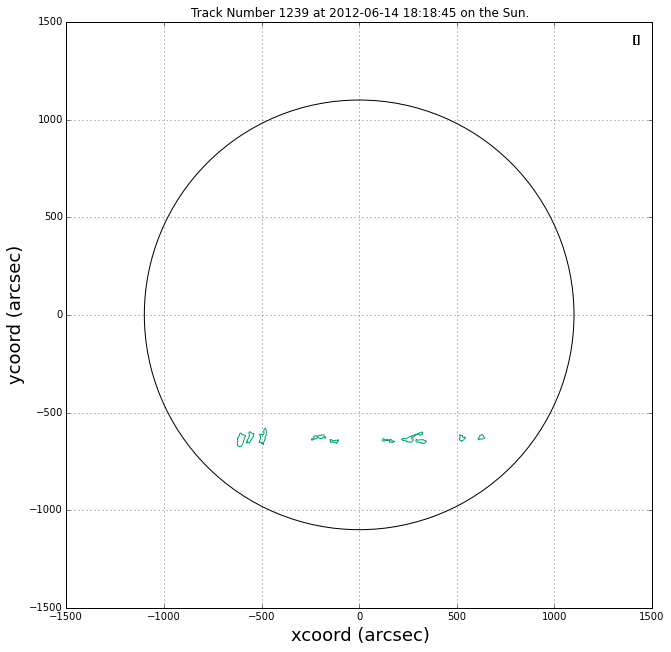

2012-06-05 18:08:25
2012-06-07 16:57:05
2012-06-08 17:11:55
2012-06-09 07:15:16
2012-06-09 16:33:59
2012-06-10 18:00:13
2012-06-11 07:25:00
2012-06-12 06:38:45


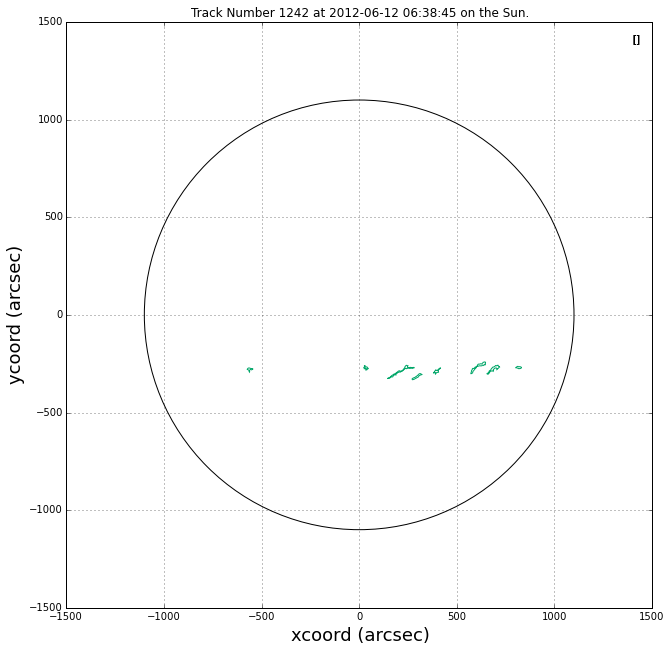

2012-06-05 18:08:25
2012-06-06 07:42:10
2012-06-06 17:16:26
2012-06-07 05:57:37
2012-06-07 16:57:05
2012-06-08 06:07:34
2012-06-08 17:11:55
2012-06-09 16:33:59
2012-06-10 18:00:13
2012-06-11 07:25:00
2012-06-11 17:53:45
2012-06-12 06:38:45


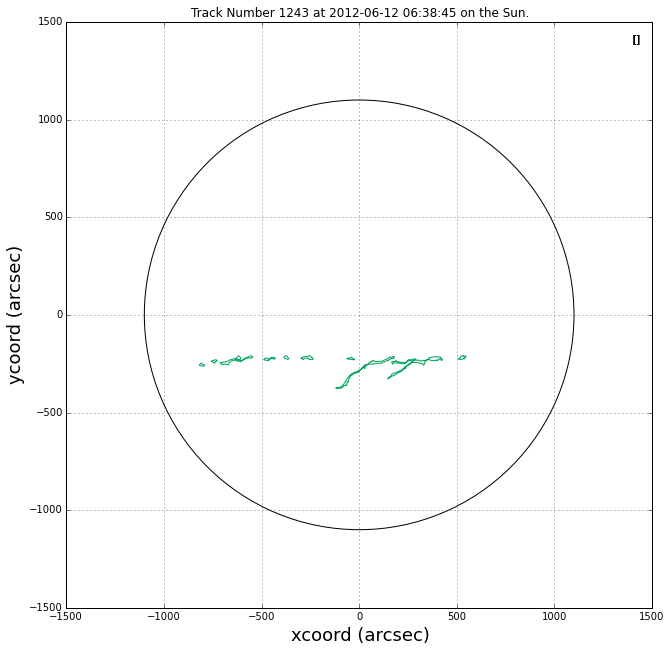

2012-06-06 07:42:10
2012-06-06 17:16:26
2012-06-07 05:57:37
2012-06-07 16:57:05
2012-06-08 06:07:34
2012-06-09 07:15:16


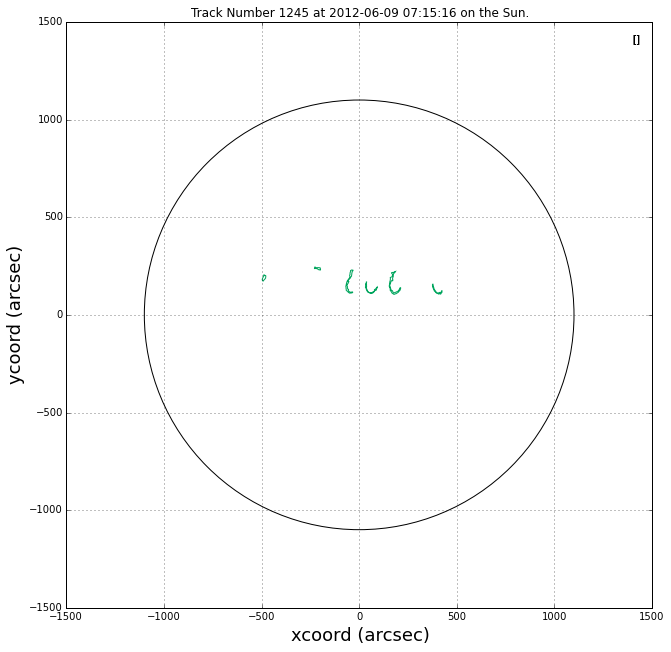

2012-06-06 17:16:26
2012-06-07 16:57:05
2012-06-10 18:00:13
2012-06-11 07:25:00
2012-06-13 16:48:56
2012-06-14 06:15:38


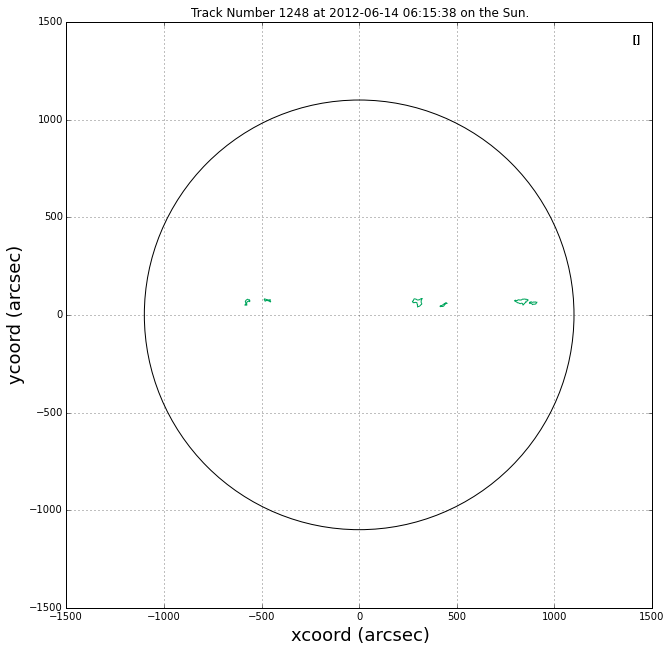

2012-06-07 16:57:05
2012-06-08 17:11:55
2012-06-09 07:15:16
2012-06-09 16:33:59
2012-06-10 08:12:09
2012-06-11 07:25:00


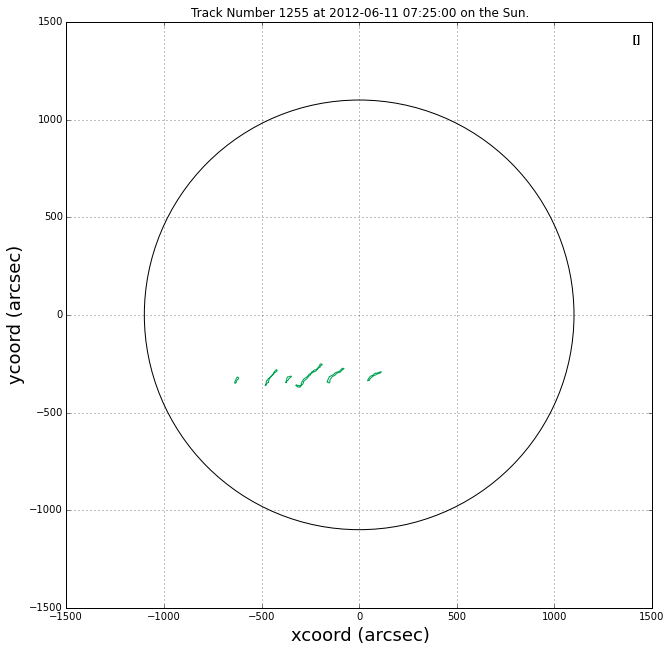

2012-06-07 16:57:05
2012-06-08 06:07:34
2012-06-08 17:11:55
2012-06-10 18:00:13
2012-06-11 17:53:45
2012-06-12 15:49:44
2012-06-13 16:48:56
2012-06-14 06:15:38
2012-06-15 05:27:19


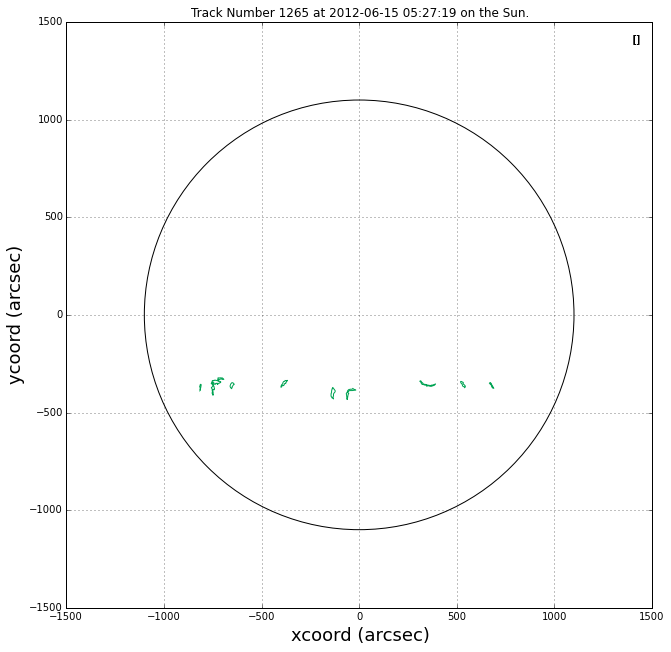

2012-06-10 18:00:13
2012-06-11 17:53:45
2012-06-12 06:38:45
2012-06-12 15:49:44
2012-06-13 16:48:56
2012-06-14 06:15:38
2012-06-14 18:18:45


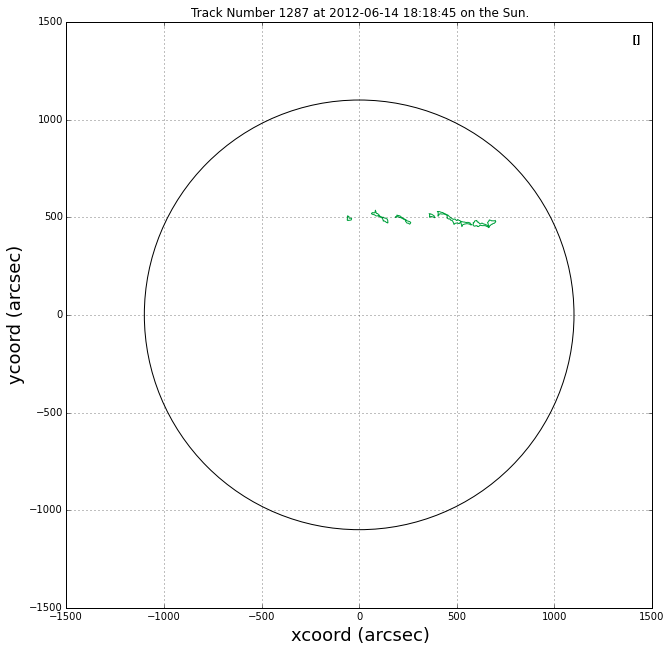

2012-06-10 18:00:13
2012-06-11 07:25:00
2012-06-11 17:53:45
2012-06-12 15:49:44
2012-06-13 16:48:56
2012-06-14 18:18:45
2012-06-15 17:05:50
2012-06-16 16:58:31
2012-06-17 18:07:01
2012-06-18 16:51:49


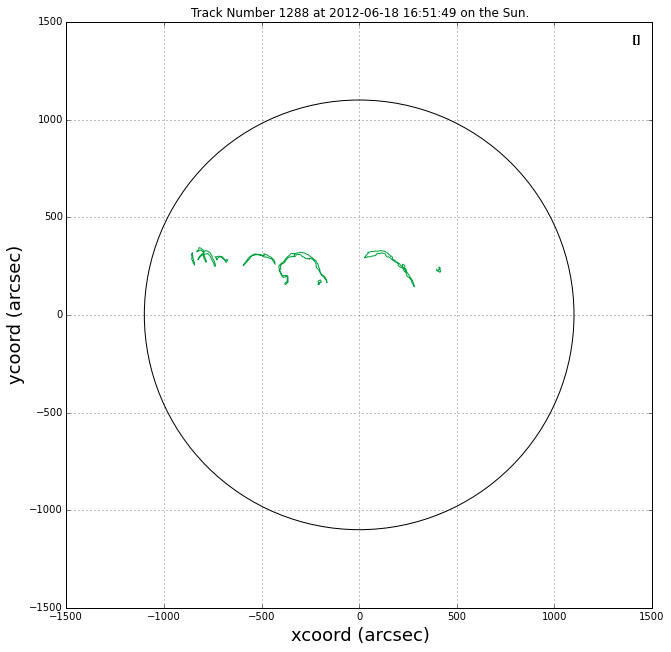

2012-06-11 17:53:45
2012-06-13 16:48:56
2012-06-14 18:18:45
2012-06-15 17:05:50
2012-06-16 16:58:31
2012-06-17 06:15:11


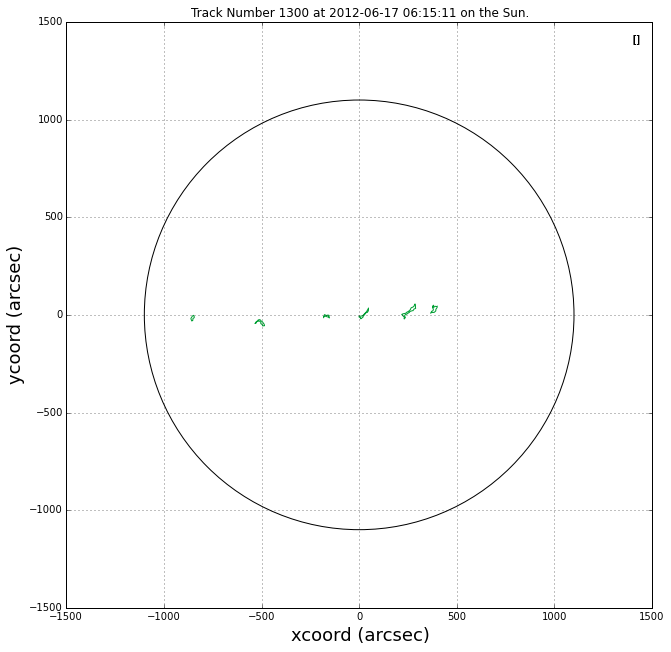

2012-06-11 17:53:45
2012-06-12 06:38:45
2012-06-13 06:19:18
2012-06-13 16:48:56
2012-06-14 06:15:38
2012-06-14 18:18:45
2012-06-15 17:05:50
2012-06-16 06:29:11
2012-06-16 16:58:31
2012-06-17 18:07:01
2012-06-18 16:51:49
2012-06-19 06:11:26
2012-06-19 17:25:28


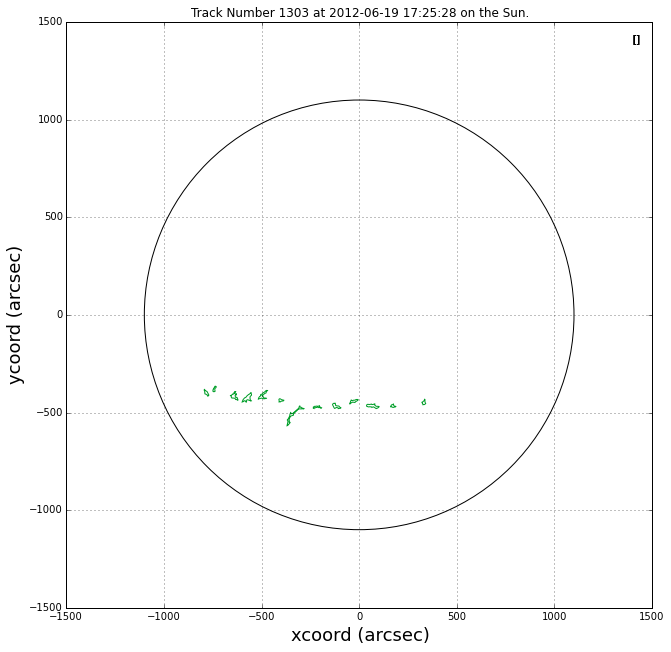

2012-06-11 17:53:45
2012-06-13 16:48:56
2012-06-14 06:15:38
2012-06-14 18:18:45
2012-06-15 17:05:50
2012-06-16 06:29:11
2012-06-16 16:58:31
2012-06-17 06:15:11
2012-06-17 18:07:01
2012-06-18 06:11:10
2012-06-18 16:51:49
2012-06-20 05:56:49
2012-06-20 16:53:10
2012-06-21 05:43:49
2012-06-21 17:14:52
2012-06-22 08:07:19
2012-06-22 17:41:43
2012-06-23 14:53:56


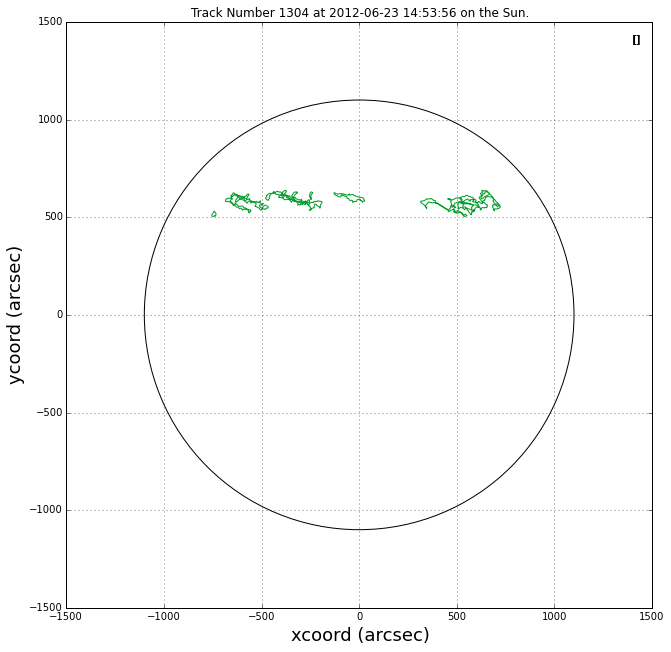

2012-06-13 06:19:18
2012-06-15 05:27:19
2012-06-16 06:29:11
2012-06-17 06:15:11
2012-06-17 18:07:01
2012-06-18 16:51:49


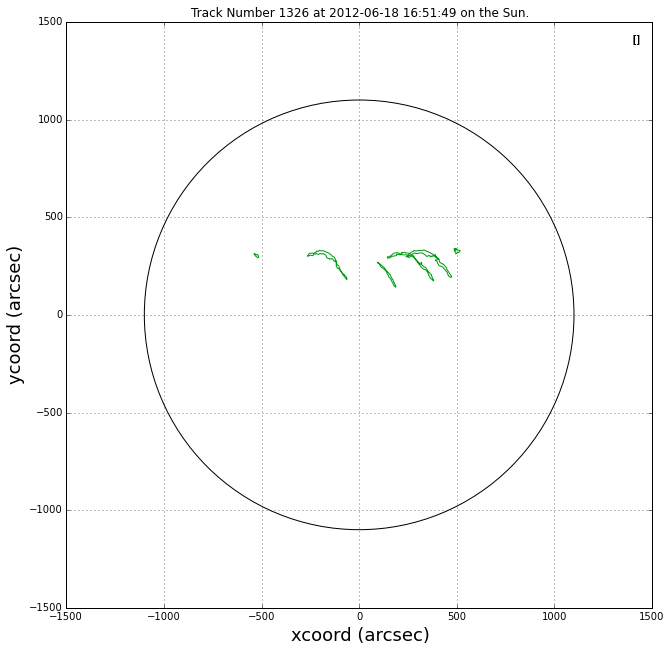

2012-06-13 16:48:56
2012-06-14 06:15:38
2012-06-14 18:18:45
2012-06-15 17:05:50
2012-06-16 06:29:11
2012-06-17 06:15:11
2012-06-17 18:07:01
2012-06-18 06:11:10
2012-06-18 16:51:49
2012-06-19 06:11:26


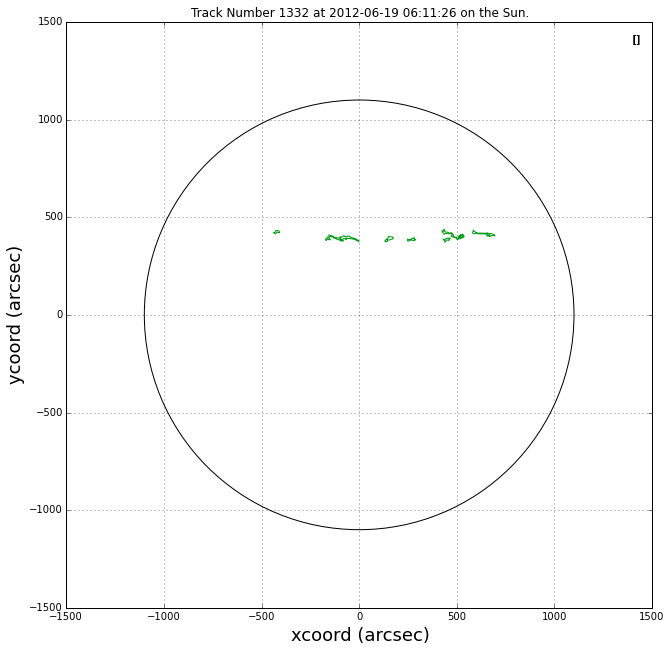

2012-06-13 16:48:56
2012-06-14 18:18:45
2012-06-15 17:05:50
2012-06-16 06:29:11
2012-06-16 16:58:31
2012-06-17 18:07:01


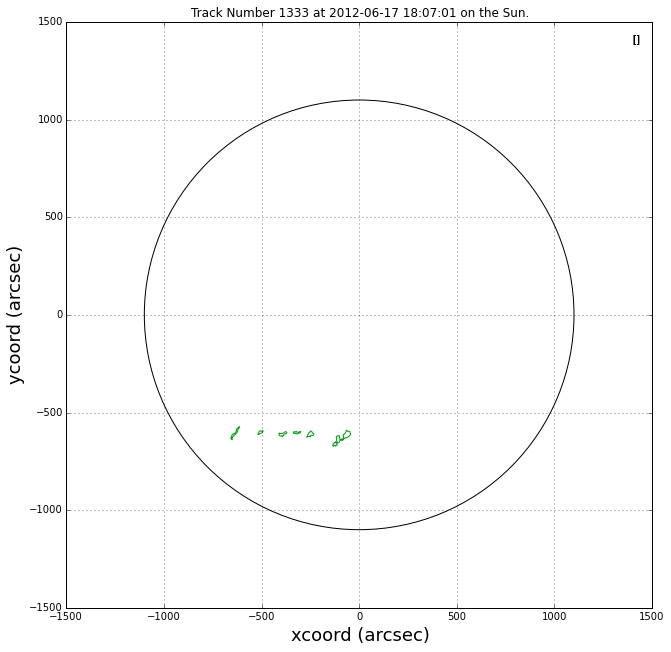

2012-06-13 16:48:56
2012-06-14 18:18:45
2012-06-15 17:05:50
2012-06-16 16:58:31
2012-06-19 17:25:28
2012-06-20 16:53:10


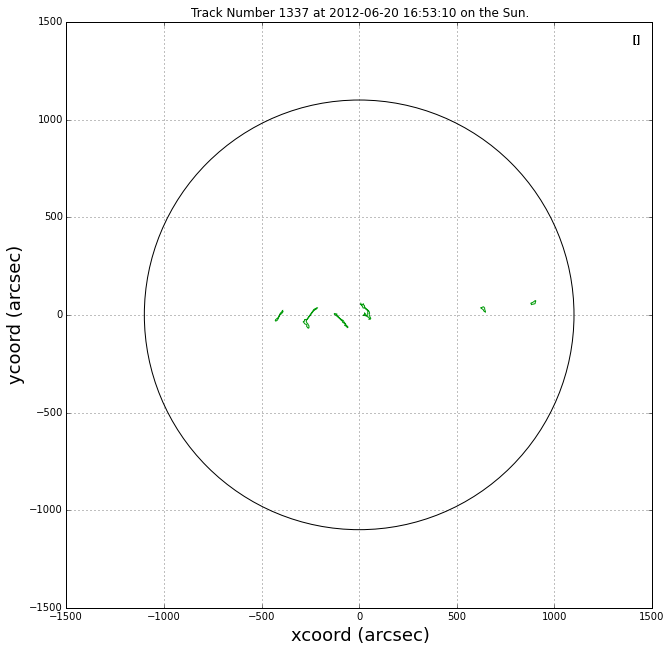

2012-06-13 16:48:56
2012-06-14 06:15:38
2012-06-14 18:18:45
2012-06-15 17:05:50
2012-06-16 06:29:11
2012-06-16 16:58:31


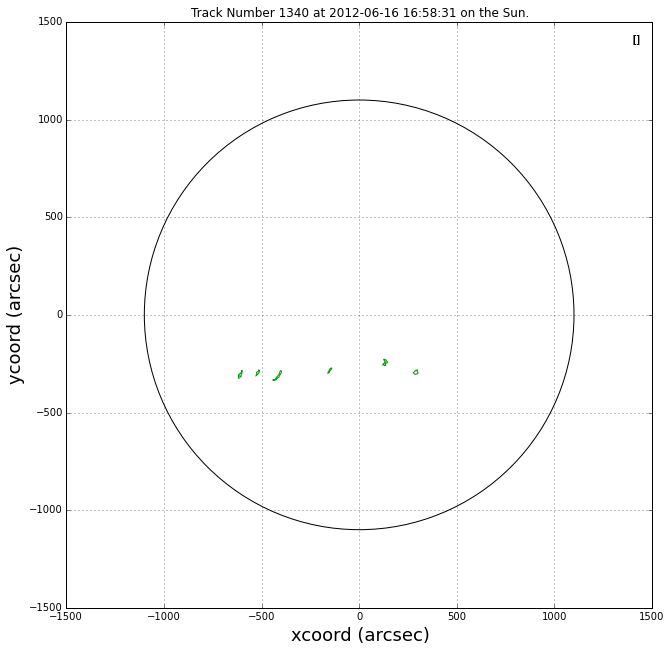

2012-06-14 06:15:38
2012-06-15 05:27:19
2012-06-16 16:58:31
2012-06-17 06:15:11
2012-06-17 18:07:01
2012-06-18 06:11:10
2012-06-18 16:51:49
2012-06-19 17:25:28


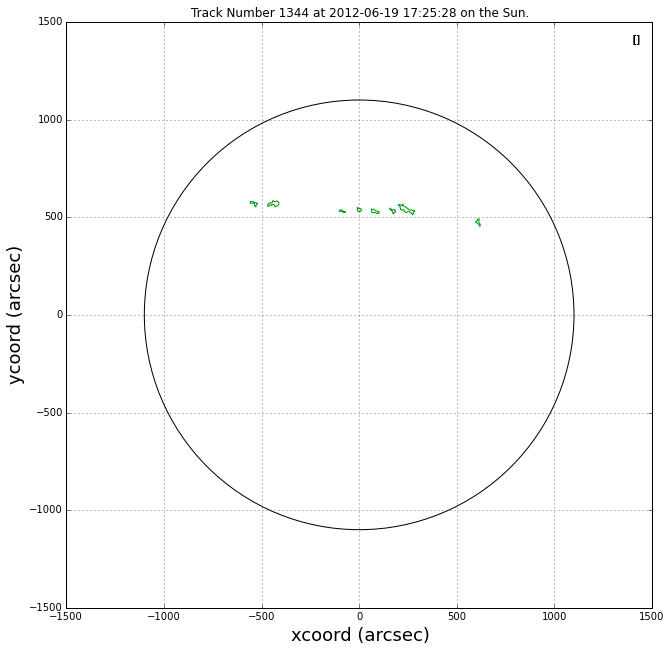

2012-06-14 18:18:45
2012-06-15 17:05:50
2012-06-16 06:29:11
2012-06-16 16:58:31
2012-06-17 18:07:01
2012-06-18 16:51:49
2012-06-19 06:11:26
2012-06-19 17:25:28
2012-06-20 16:53:10
2012-06-21 17:14:52


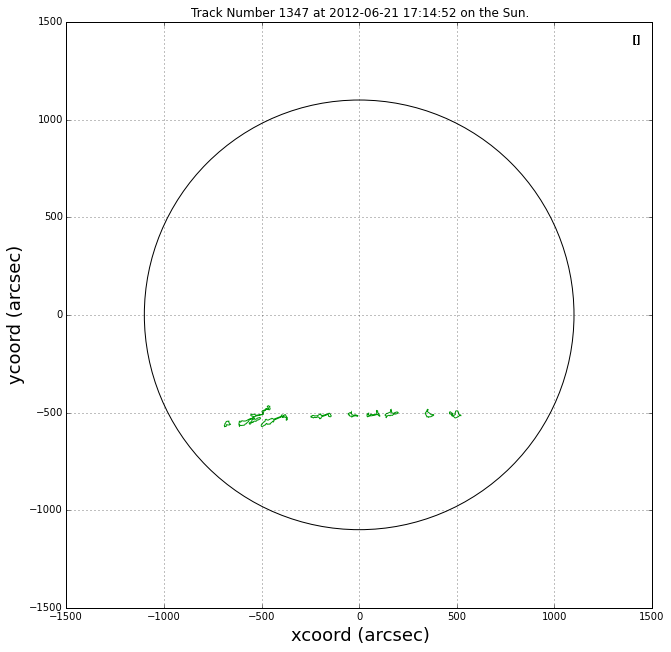

2012-06-14 18:18:45
2012-06-15 17:05:50
2012-06-16 16:58:31
2012-06-17 18:07:01
2012-06-19 17:25:28
2012-06-20 05:56:49
2012-06-20 16:53:10
2012-06-21 05:43:49


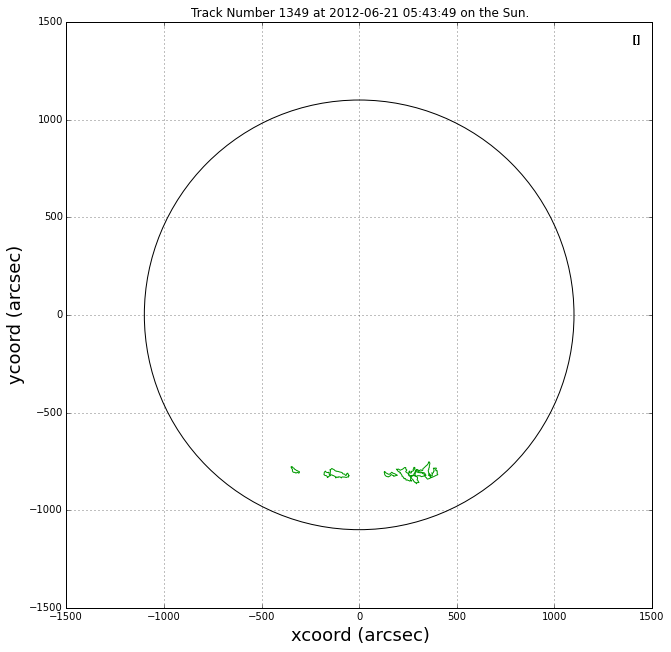

2012-06-15 17:05:50
2012-06-16 06:29:11
2012-06-17 06:15:11
2012-06-17 18:07:01
2012-06-18 06:11:10
2012-06-19 06:11:26


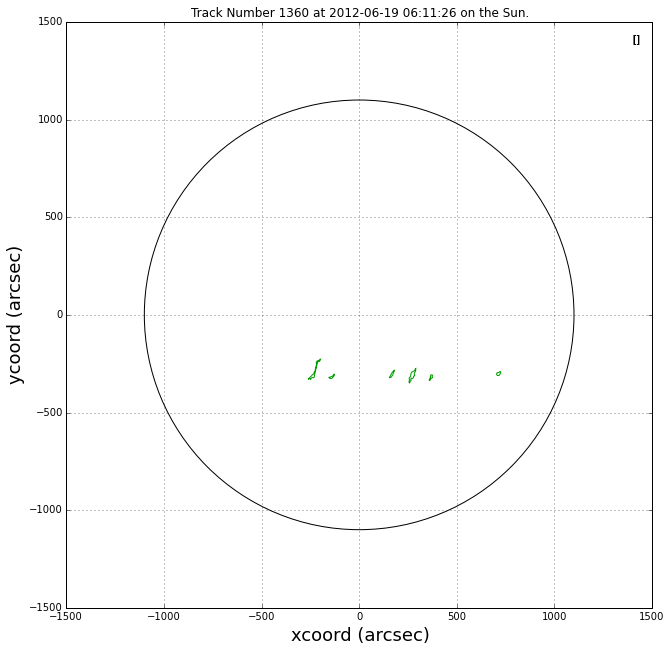

2012-06-16 06:29:11
2012-06-17 06:15:11
2012-06-17 18:07:01
2012-06-18 06:11:10
2012-06-18 16:51:49
2012-06-19 06:11:26
2012-06-20 16:53:10
2012-06-21 17:14:52


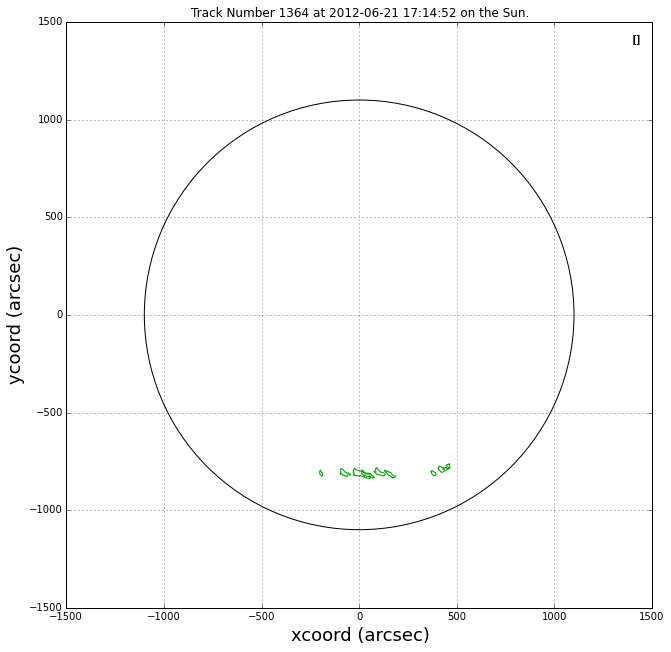

2012-06-16 16:58:31
2012-06-17 18:07:01
2012-06-18 06:11:10
2012-06-18 16:51:49
2012-06-19 17:25:28
2012-06-20 16:53:10


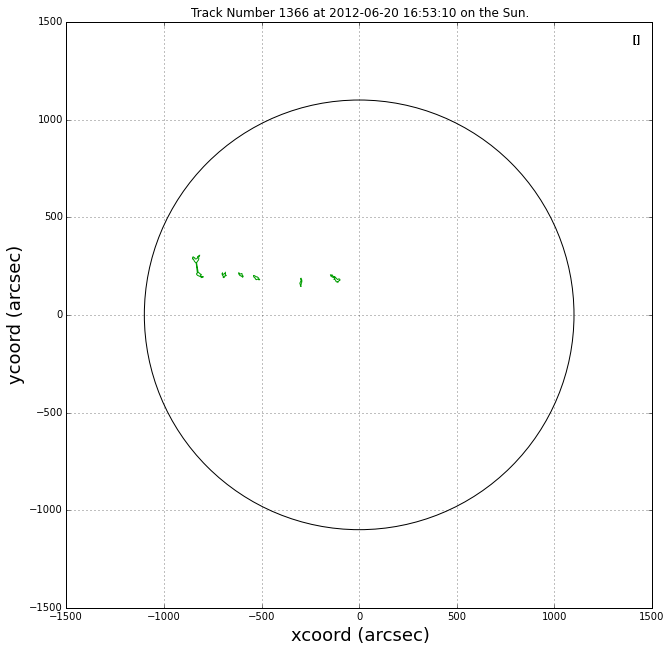

2012-06-16 16:58:31
2012-06-17 18:07:01
2012-06-18 16:51:49
2012-06-19 06:11:26
2012-06-20 16:53:10
2012-06-22 08:07:19


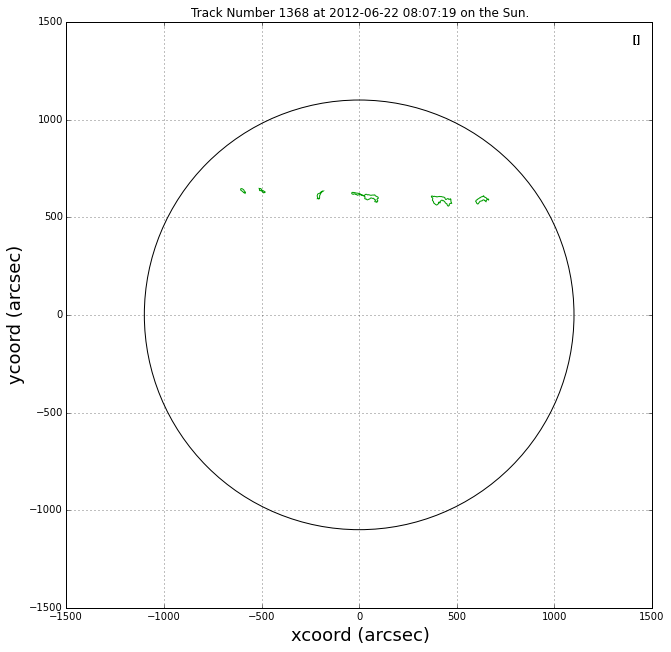

2012-06-17 06:15:11
2012-06-17 18:07:01
2012-06-19 17:25:28
2012-06-20 05:56:49
2012-06-20 16:53:10
2012-06-21 17:14:52
2012-06-22 17:41:43
2012-06-23 17:50:11
2012-06-24 17:21:10
2012-06-25 18:04:37


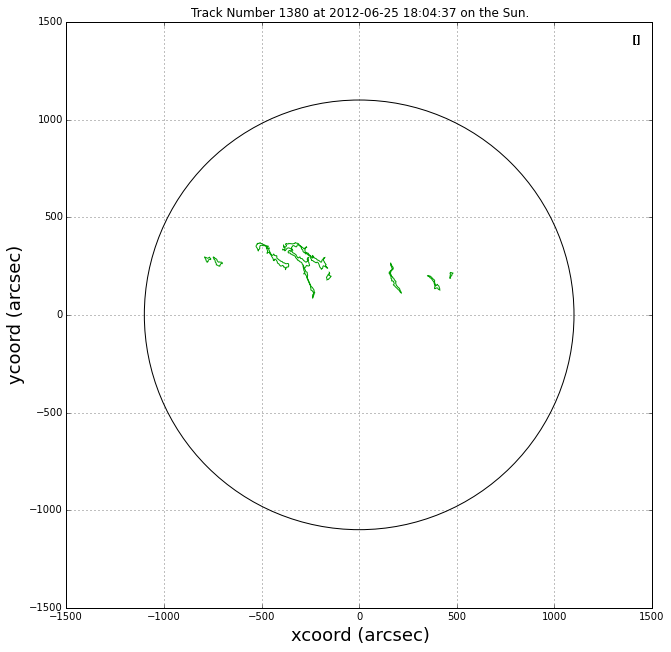

2012-06-18 06:11:10
2012-06-18 16:51:49
2012-06-19 17:25:28
2012-06-20 16:53:10
2012-06-21 05:43:49
2012-06-21 17:14:52
2012-06-23 17:50:11


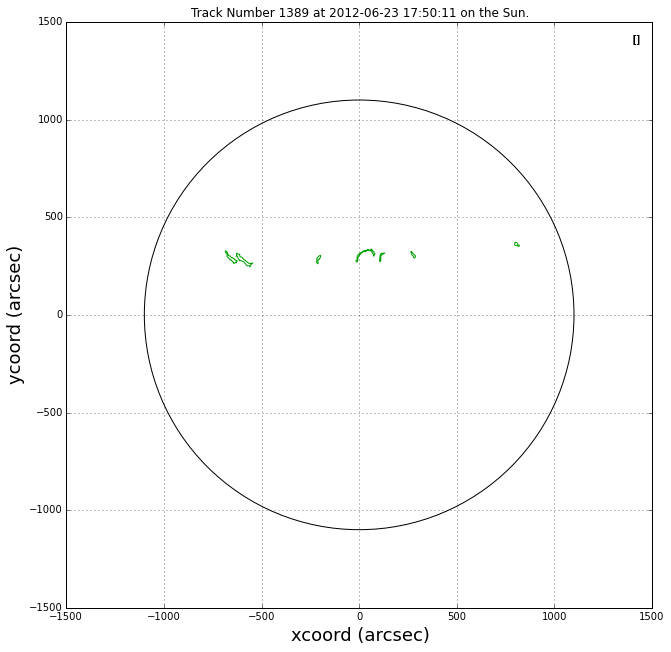

2012-06-18 16:51:49
2012-06-19 17:25:28
2012-06-20 05:56:49
2012-06-21 17:14:52
2012-06-22 17:41:43
2012-06-23 17:50:11
2012-06-24 08:26:36


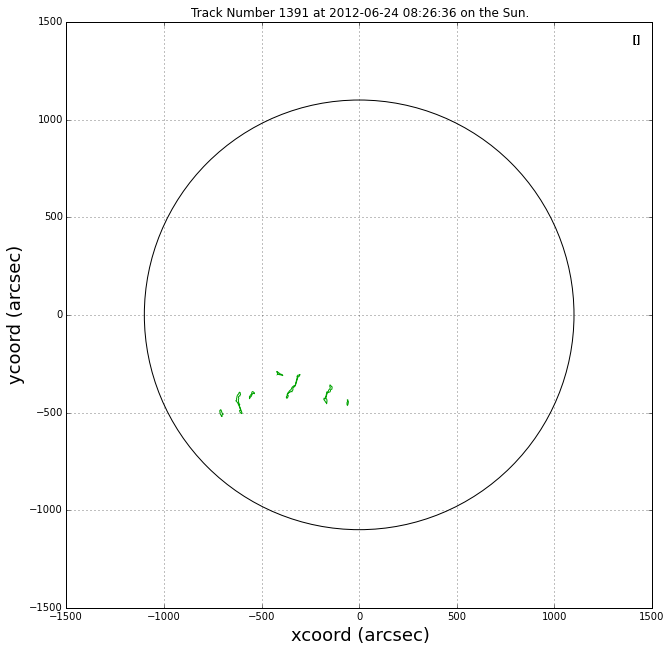

2012-06-19 06:11:26
2012-06-20 05:56:49
2012-06-21 05:43:49
2012-06-21 17:14:52
2012-06-23 14:53:56
2012-06-24 08:26:36
2012-06-24 17:21:10
2012-06-25 18:04:37


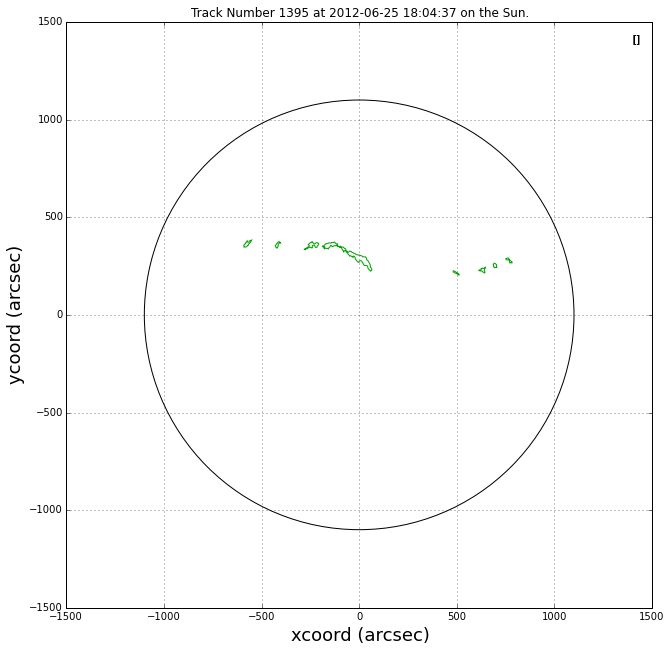

2012-06-19 17:25:28
2012-06-20 16:53:10
2012-06-21 05:43:49
2012-06-21 17:14:52
2012-06-22 08:07:19
2012-06-22 17:41:43


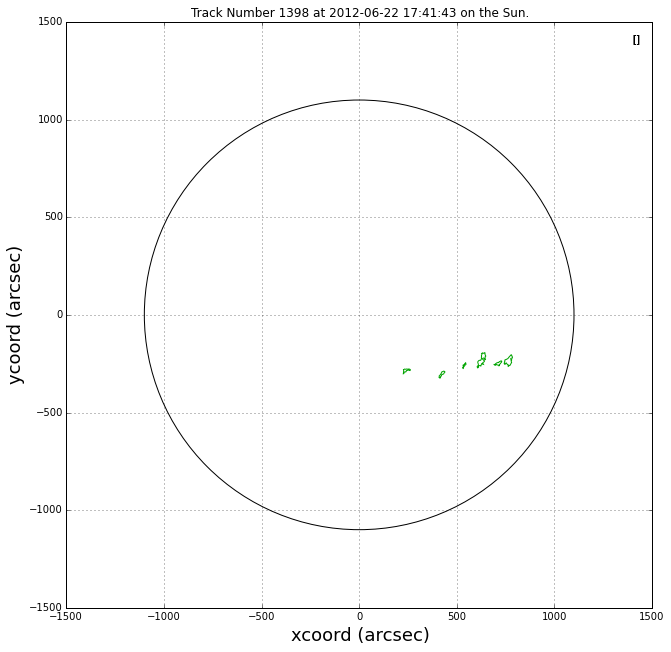

2012-06-20 16:53:10
2012-06-21 05:43:49
2012-06-21 17:14:52
2012-06-23 14:53:56
2012-06-24 17:21:10
2012-06-26 16:18:52
2012-06-27 05:40:07
2012-06-27 17:07:33
2012-06-28 17:33:11
2012-06-29 17:39:42
2012-06-30 06:16:40
2012-06-30 17:52:33


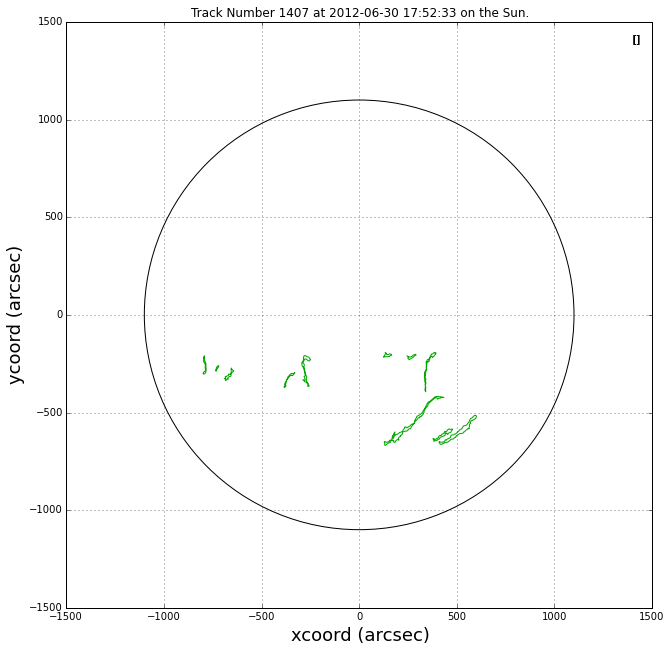

2012-06-25 18:04:37
2012-06-26 16:18:52
2012-06-27 17:07:33
2012-06-28 17:33:11
2012-06-29 17:39:42
2012-06-30 17:52:33


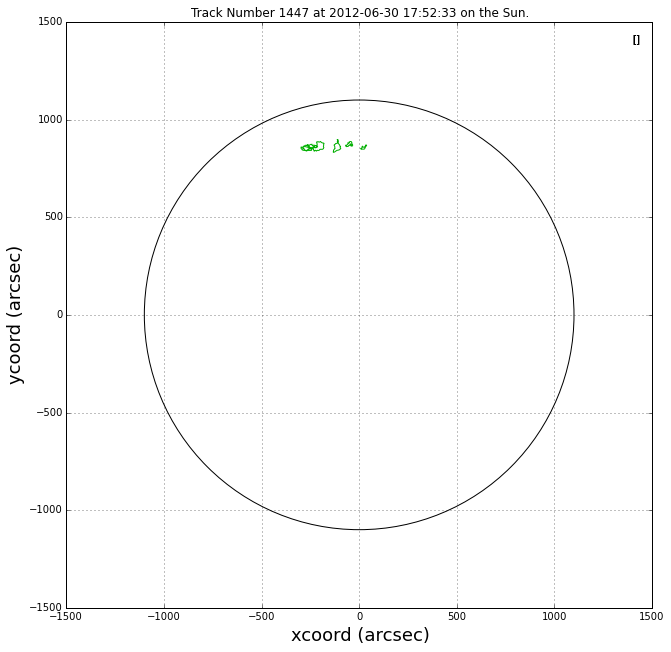

2012-06-27 05:40:07
2012-06-28 06:06:56
2012-06-29 17:39:42
2012-06-30 17:52:33
2012-07-01 06:28:04
2012-07-01 17:08:21
2012-07-02 07:17:25
2012-07-02 17:08:08
2012-07-03 06:47:54


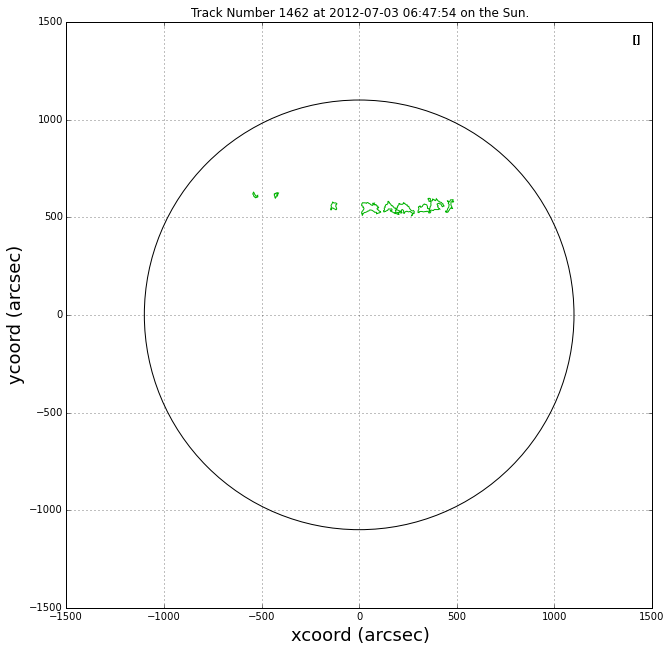

2012-06-27 17:07:33
2012-06-28 17:33:11
2012-06-29 06:11:01
2012-06-29 17:39:42
2012-06-30 17:52:33
2012-07-02 17:08:08
2012-07-03 18:08:40
2012-07-04 08:40:02


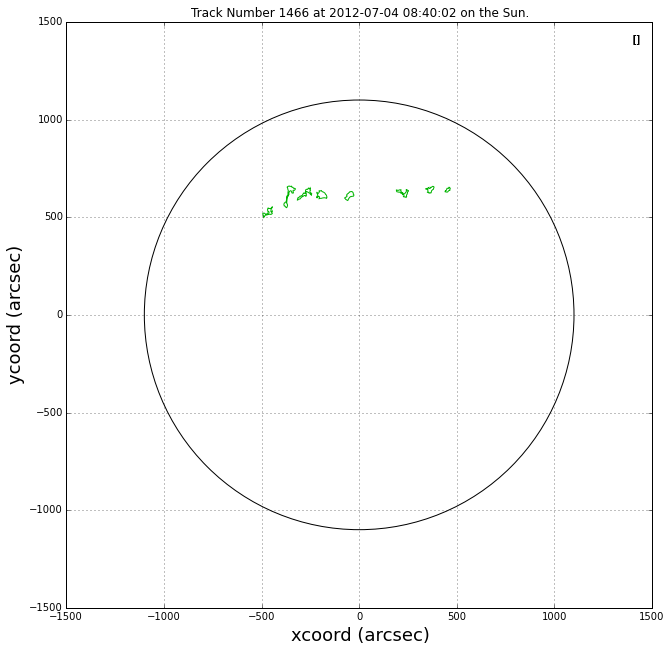

2012-06-29 06:11:01
2012-06-29 17:39:42
2012-06-30 17:52:33
2012-07-02 17:08:08
2012-07-03 18:08:40
2012-07-04 08:40:02


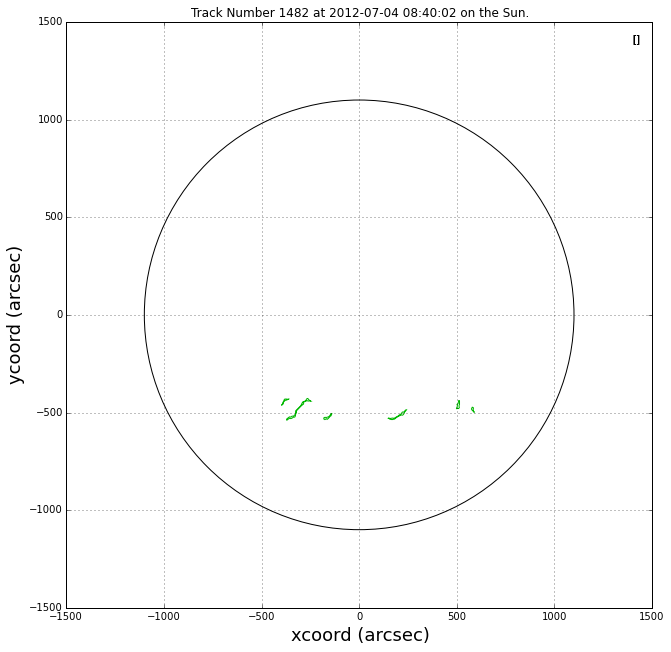

2012-06-29 17:39:42
2012-06-30 06:16:40
2012-06-30 17:52:33
2012-07-01 17:08:21
2012-07-02 07:17:25
2012-07-02 17:08:08
2012-07-04 08:40:02


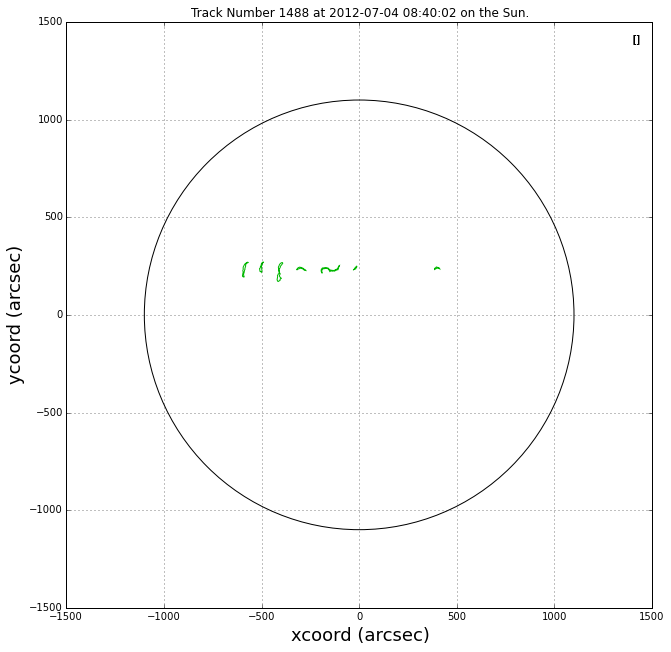

2012-06-30 17:52:33
2012-07-01 17:08:21
2012-07-02 07:17:25
2012-07-02 17:08:08
2012-07-03 06:47:54
2012-07-03 18:08:40
2012-07-04 08:40:02
2012-07-05 06:56:22
2012-07-06 06:01:24
2012-07-06 16:57:19
2012-07-07 06:00:16
2012-07-07 18:07:16
2012-07-08 05:51:13
2012-07-08 18:22:42
2012-07-09 06:09:09
2012-07-09 18:26:55


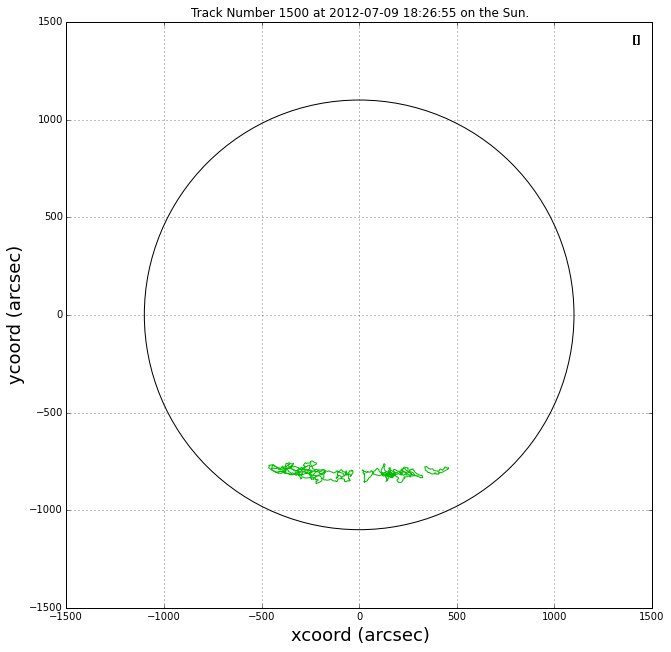

2012-07-01 17:08:21
2012-07-02 17:08:08
2012-07-03 06:47:54
2012-07-03 18:08:40
2012-07-04 08:40:02
2012-07-05 17:14:14


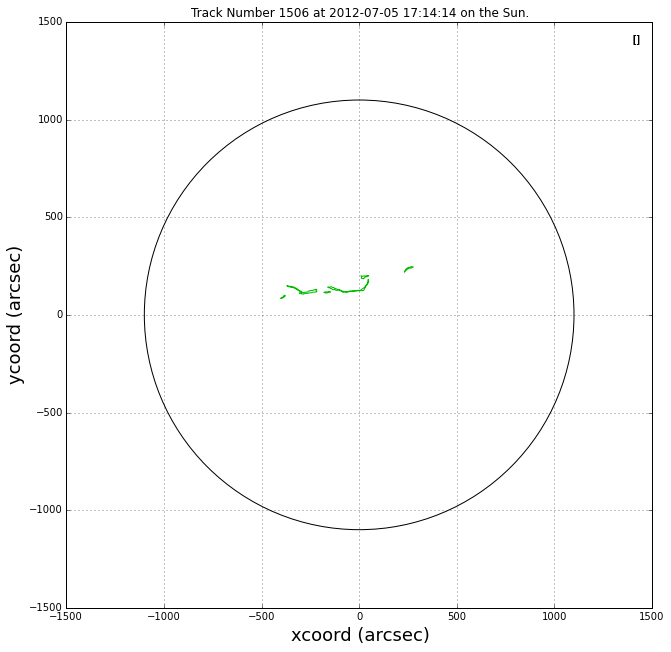

2012-07-02 17:08:08
2012-07-03 06:47:54
2012-07-03 18:08:40
2012-07-05 06:56:22
2012-07-05 17:14:14
2012-07-06 16:57:19
2012-07-11 06:27:48


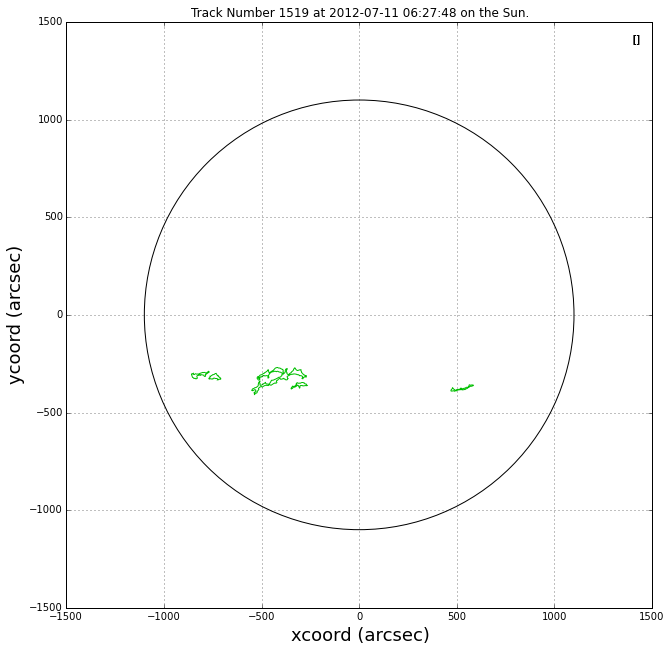

2012-07-03 18:08:40
2012-07-05 17:14:14
2012-07-06 06:01:24
2012-07-06 16:57:19
2012-07-07 06:00:16
2012-07-07 18:07:16
2012-07-08 05:51:13
2012-07-08 18:22:42
2012-07-09 06:09:09
2012-07-09 18:26:55
2012-07-10 06:29:41


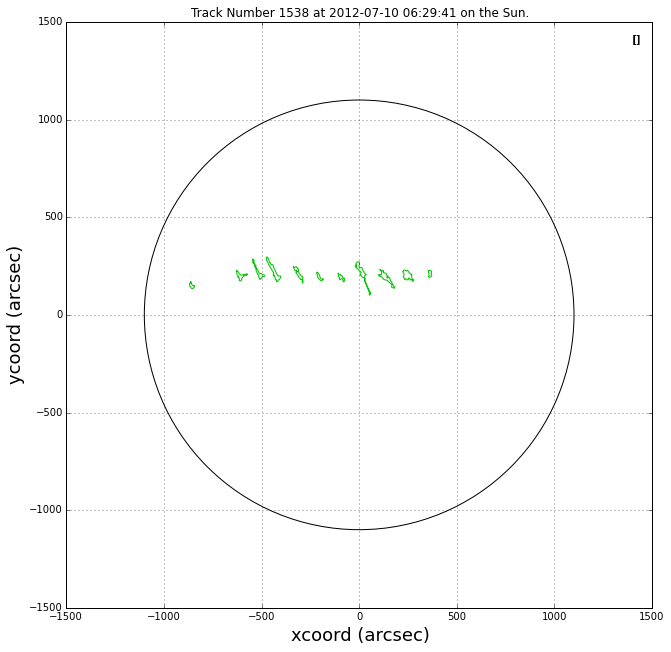

2012-07-03 18:08:40
2012-07-04 08:40:02
2012-07-05 06:56:22
2012-07-06 06:01:24
2012-07-06 16:57:19
2012-07-07 06:00:16
2012-07-07 18:07:16
2012-07-11 06:27:48
2012-07-12 05:10:11


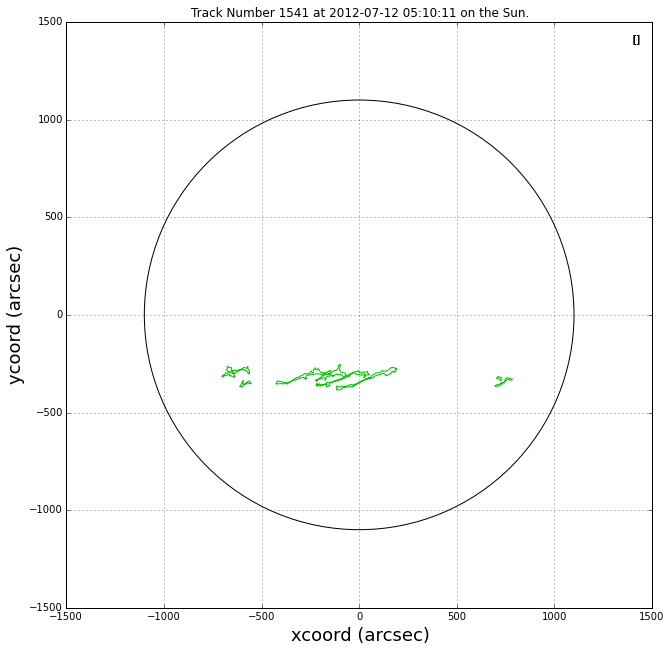

2012-07-05 17:14:14
2012-07-06 06:01:24
2012-07-06 16:57:19
2012-07-07 18:07:16
2012-07-08 18:22:42
2012-07-09 06:09:09


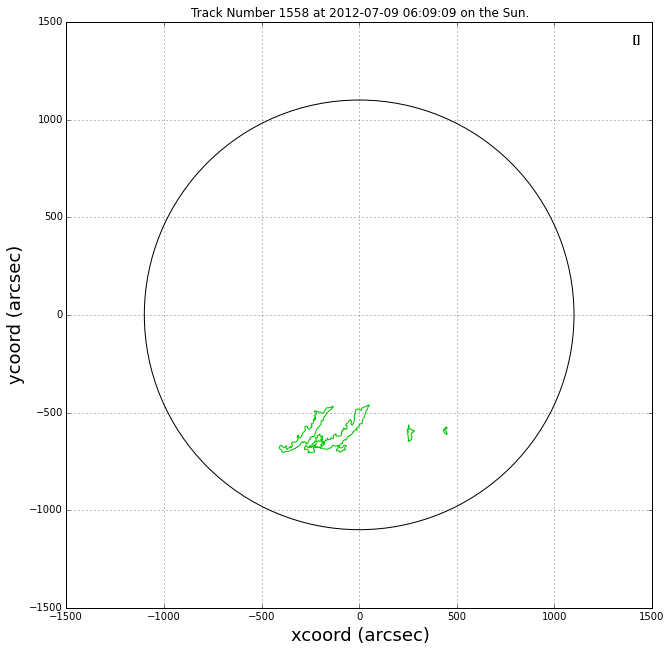

2012-07-06 16:57:19
2012-07-07 06:00:16
2012-07-07 18:07:16
2012-07-08 18:22:42
2012-07-09 06:09:09
2012-07-09 18:26:55
2012-07-11 06:27:48
2012-07-14 05:47:25
2012-07-14 17:03:11
2012-07-15 16:51:33


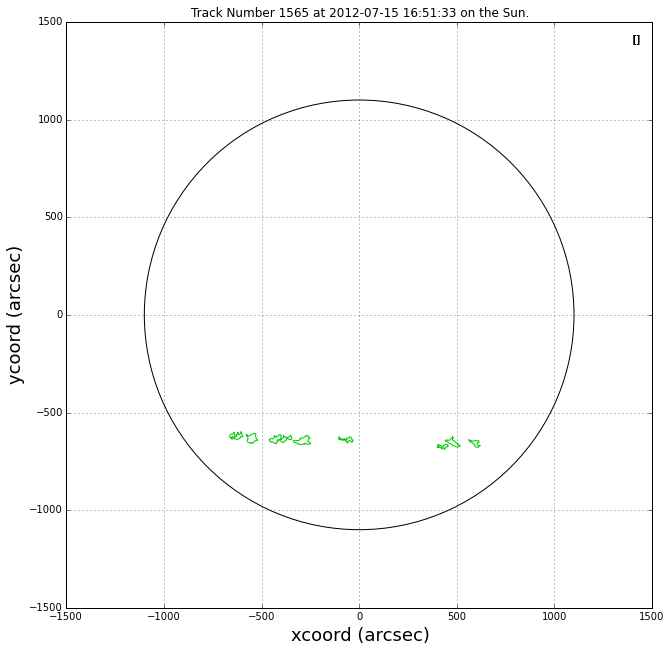

2012-07-07 06:00:16
2012-07-07 18:07:16
2012-07-08 05:51:13
2012-07-08 18:22:42
2012-07-09 06:09:09
2012-07-09 18:26:55
2012-07-10 06:29:41
2012-07-11 06:27:48


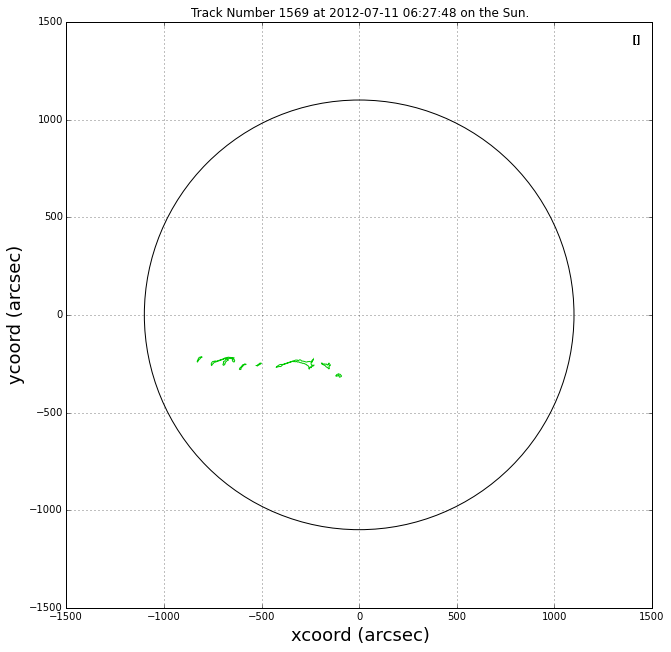

2012-07-07 18:07:16
2012-07-08 18:22:42
2012-07-09 18:26:55
2012-07-10 06:29:41
2012-07-11 06:27:48
2012-07-12 05:10:11


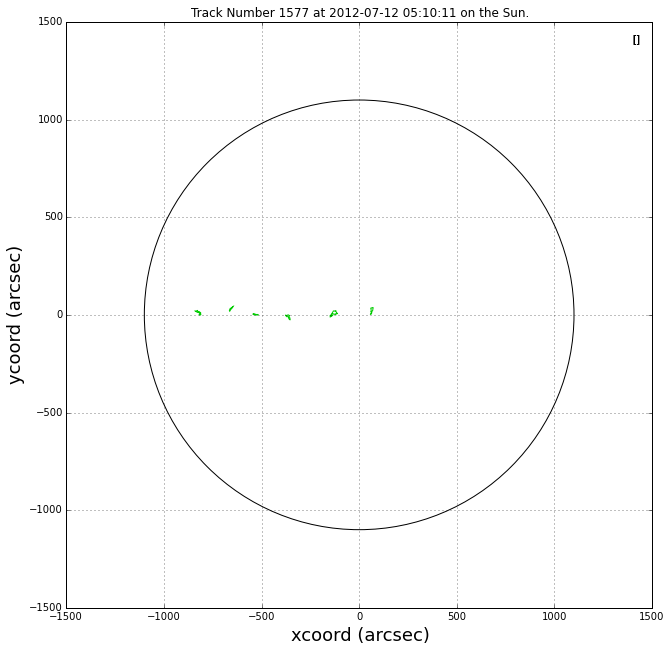

2012-07-08 18:22:42
2012-07-09 06:09:09
2012-07-09 18:26:55
2012-07-10 06:29:41
2012-07-11 06:27:48
2012-07-12 05:10:11


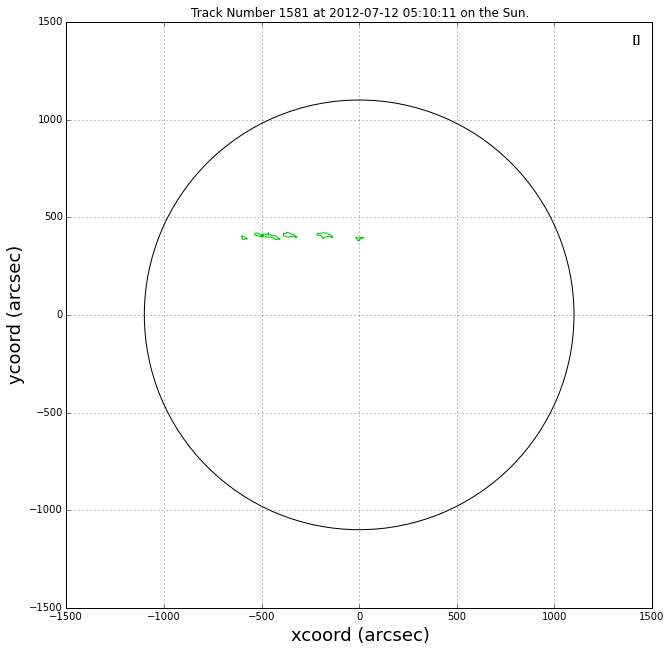

2012-07-14 05:47:25
2012-07-14 17:03:11
2012-07-15 16:51:33
2012-07-16 16:32:20
2012-07-17 05:24:36
2012-07-18 05:15:03
2012-07-19 07:23:22
2012-07-19 21:57:30
2012-07-20 06:16:23


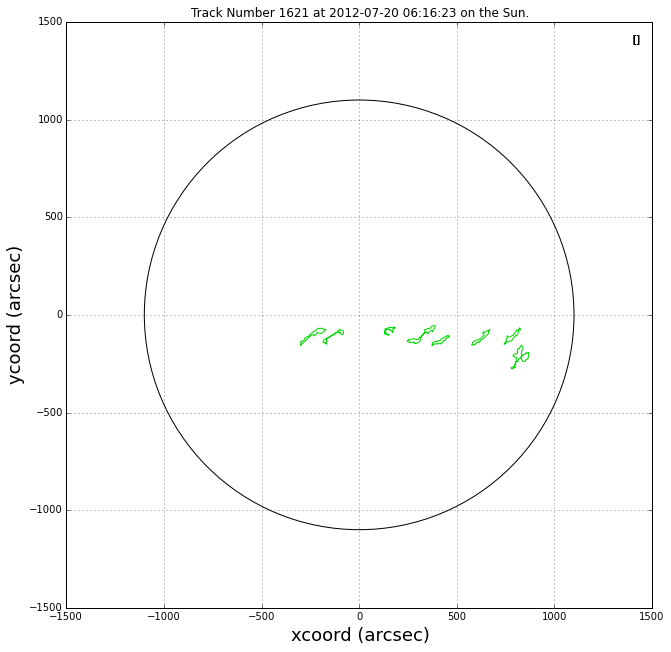

2012-07-19 07:23:22
2012-07-19 21:57:30
2012-07-20 18:05:55
2012-07-21 18:28:58
2012-07-22 07:27:01
2012-07-23 16:58:20


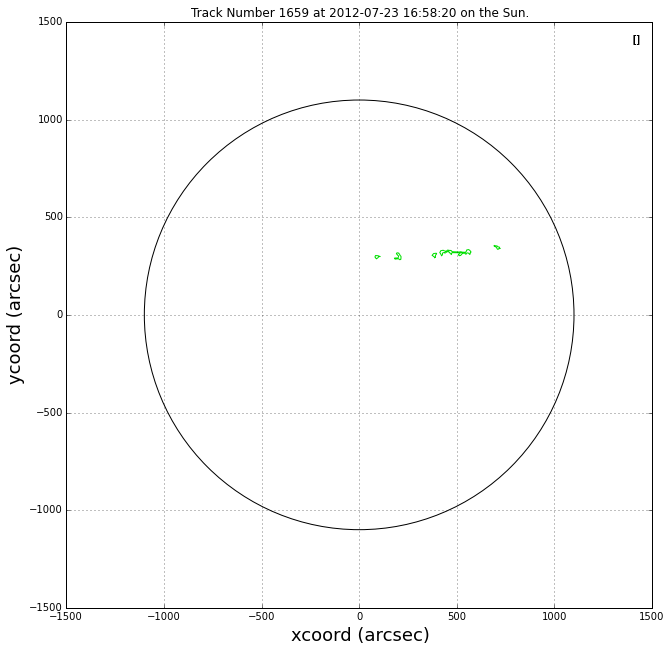

2012-07-19 21:57:30
2012-07-20 18:05:55
2012-07-23 08:55:10
2012-07-23 16:58:20
2012-07-24 07:37:13
2012-07-24 16:36:23
2012-07-25 09:00:32
2012-07-25 17:19:24


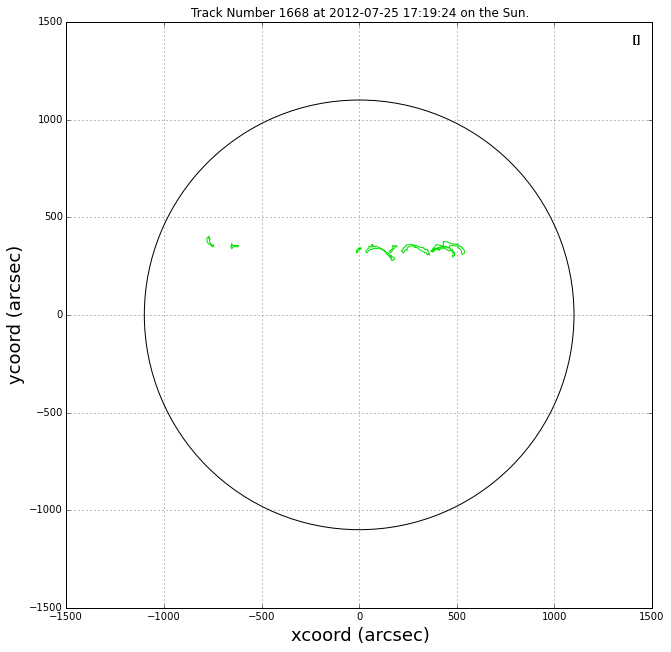

2012-07-21 18:28:58
2012-07-23 16:58:20
2012-07-24 16:36:23
2012-07-25 09:00:32
2012-07-26 10:43:04
2012-07-26 17:08:01
2012-07-28 05:55:57
2012-07-28 16:51:22
2012-07-29 05:57:11
2012-07-29 17:31:05


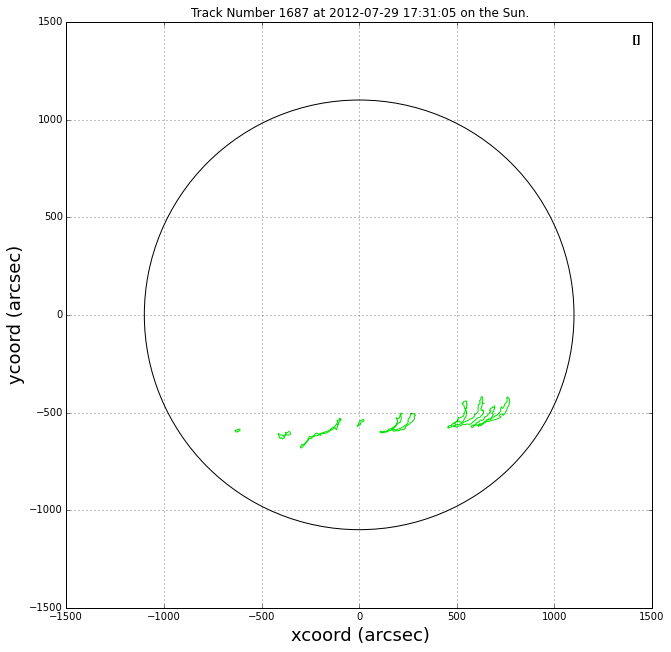

2012-07-23 16:58:20
2012-07-24 16:36:23
2012-07-25 09:00:32
2012-07-25 17:19:24
2012-07-26 10:43:04
2012-07-26 17:08:01
2012-07-27 06:13:34
2012-07-27 18:51:49
2012-07-28 05:55:57
2012-07-28 16:51:22
2012-07-29 05:57:11
2012-07-29 17:31:05
2012-07-30 07:34:02
2012-07-30 17:46:18
2012-07-31 09:46:00
2012-08-01 06:20:13
2012-08-01 16:55:35
2012-08-02 06:13:39
2012-08-02 17:11:06
2012-08-03 06:12:12


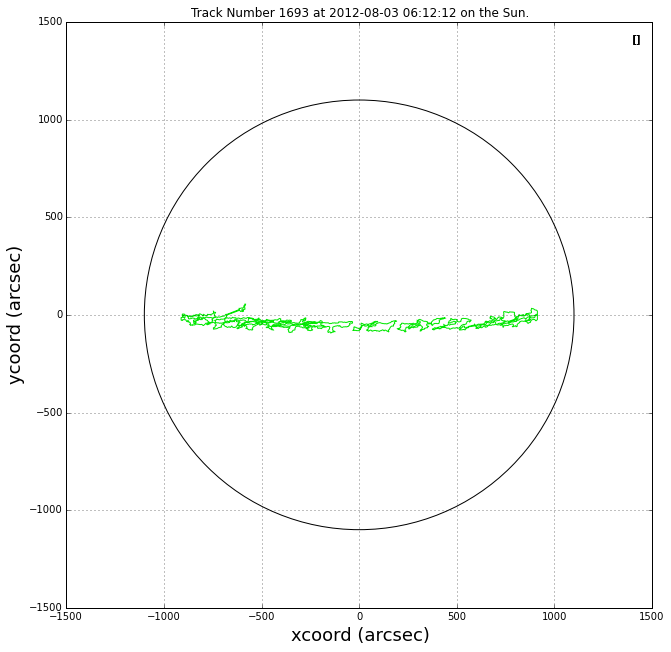

2012-07-23 16:58:20
2012-07-24 07:37:13
2012-07-24 16:36:23
2012-07-25 09:00:32
2012-07-25 17:19:24
2012-07-26 10:43:04
2012-07-26 17:08:01
2012-07-28 05:55:57
2012-07-28 16:51:22
2012-07-29 05:57:11
2012-07-30 07:34:02
2012-07-30 17:46:18
2012-07-31 09:46:00
2012-08-01 06:20:13
2012-08-01 16:55:35


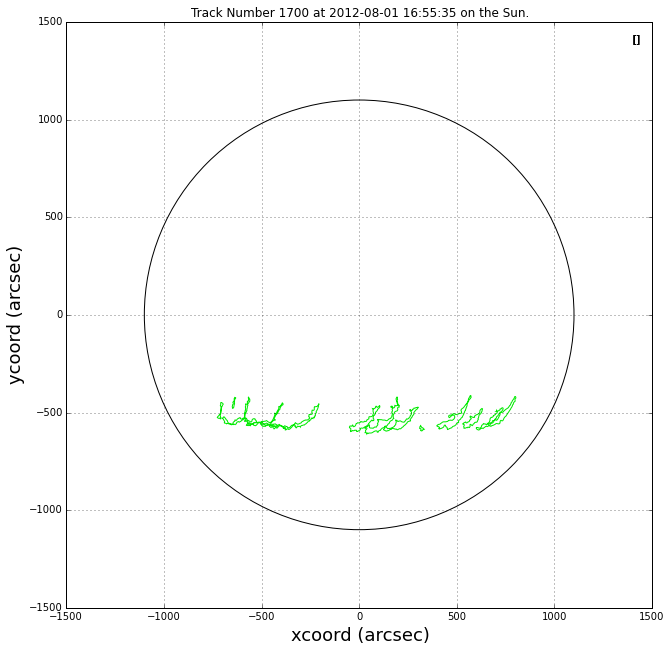

2012-07-25 17:19:24
2012-07-26 10:43:04
2012-07-27 06:13:34
2012-07-27 18:51:49
2012-07-28 05:55:57
2012-07-31 09:46:00


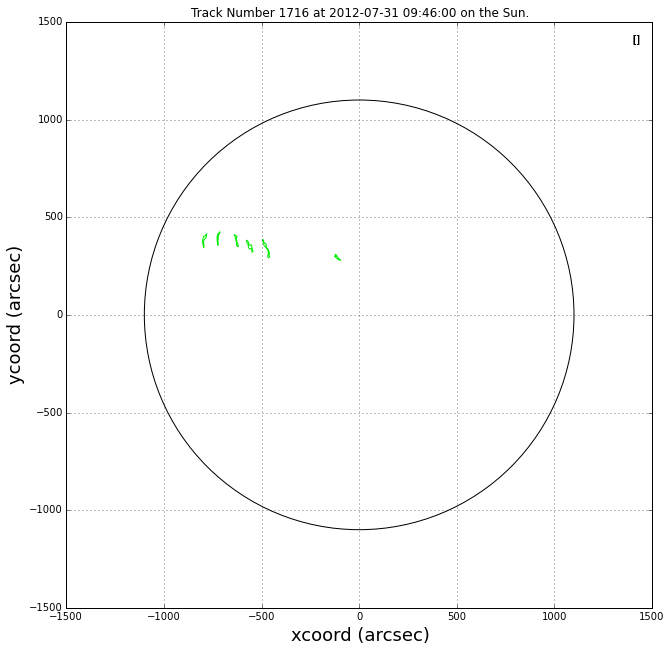

2012-07-27 18:51:49
2012-07-28 05:55:57
2012-07-28 16:51:22
2012-07-29 17:31:05
2012-07-30 17:46:18
2012-08-01 16:55:35
2012-08-02 06:13:39
2012-08-02 17:11:06
2012-08-03 06:12:12
2012-08-03 19:04:23
2012-08-04 08:01:14
2012-08-04 16:41:34
2012-08-05 06:08:38


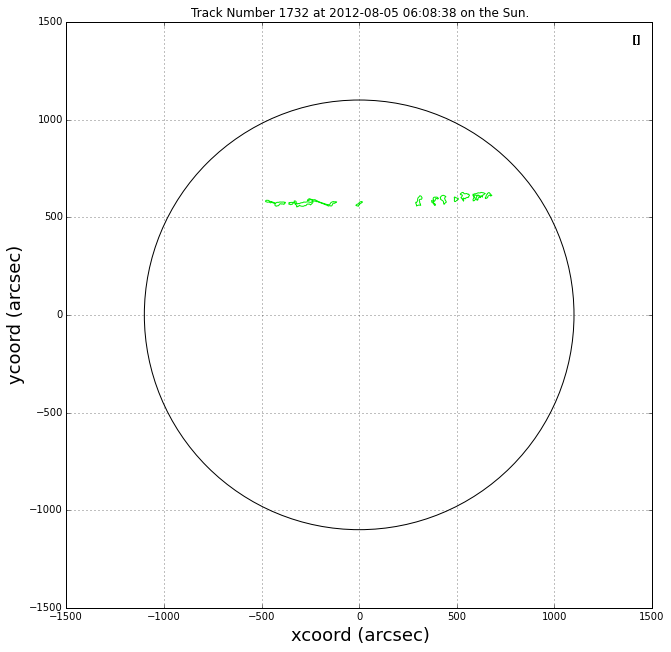

2012-07-27 18:51:49
2012-07-28 16:51:22
2012-07-29 17:31:05
2012-07-30 17:46:18
2012-08-01 16:55:35
2012-08-02 17:11:06
2012-08-03 06:12:12


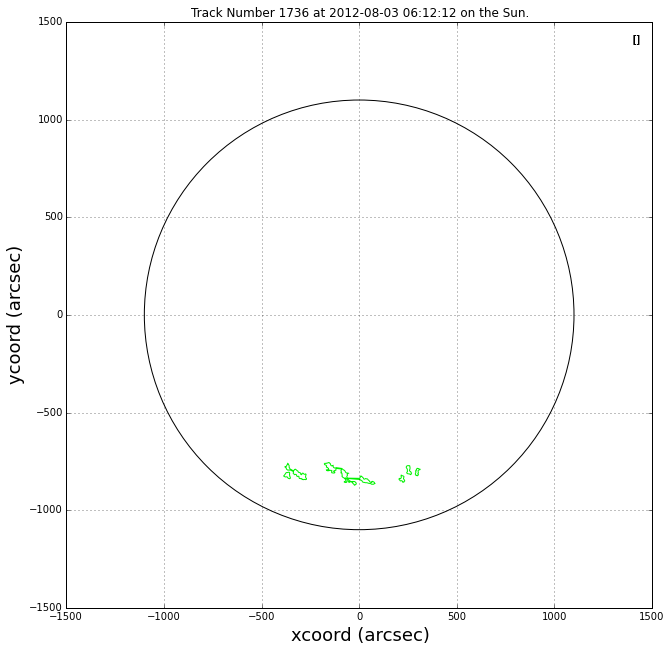

2012-07-28 05:55:57
2012-07-28 16:51:22
2012-07-29 17:31:05
2012-07-30 07:34:02
2012-07-30 17:46:18
2012-07-31 09:46:00
2012-08-01 06:20:13
2012-08-01 16:55:35
2012-08-02 06:13:39
2012-08-02 17:11:06
2012-08-03 06:12:12
2012-08-03 19:04:23
2012-08-04 16:41:34
2012-08-05 06:08:38
2012-08-06 06:08:23
2012-08-06 17:02:55


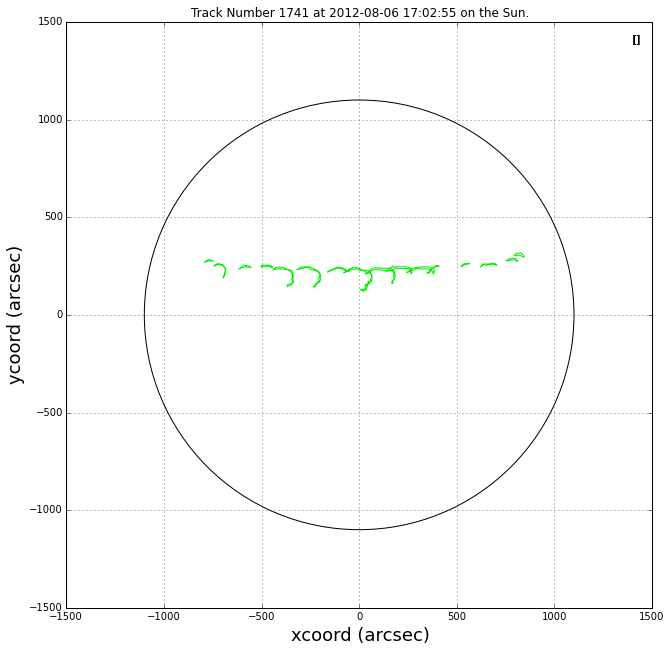

2012-07-28 16:51:22
2012-07-29 17:31:05
2012-07-30 17:46:18
2012-07-31 09:46:00
2012-08-01 06:20:13
2012-08-03 06:12:12
2012-08-03 19:04:23
2012-08-04 08:01:14
2012-08-04 16:41:34


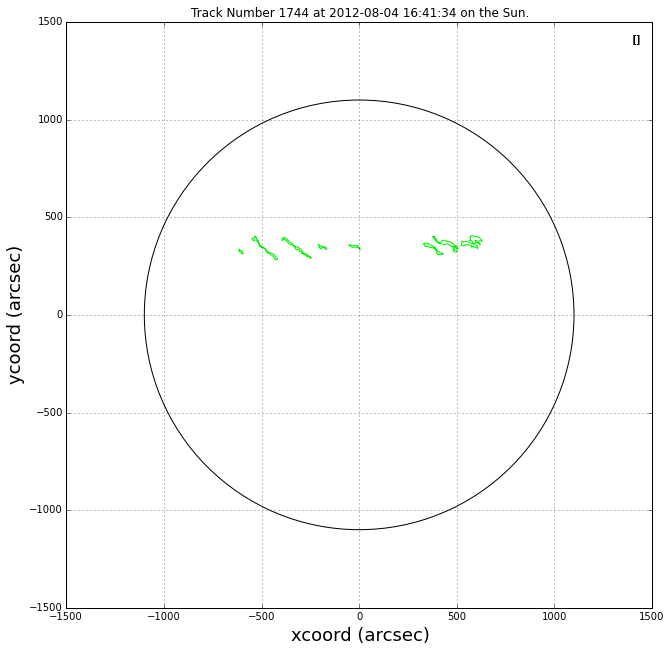

2012-07-30 17:46:18
2012-07-31 09:46:00
2012-08-01 16:55:35
2012-08-02 06:13:39
2012-08-02 17:11:06
2012-08-03 19:04:23
2012-08-04 08:01:14
2012-08-04 16:41:34
2012-08-05 06:08:38
2012-08-06 06:08:23
2012-08-06 17:02:55


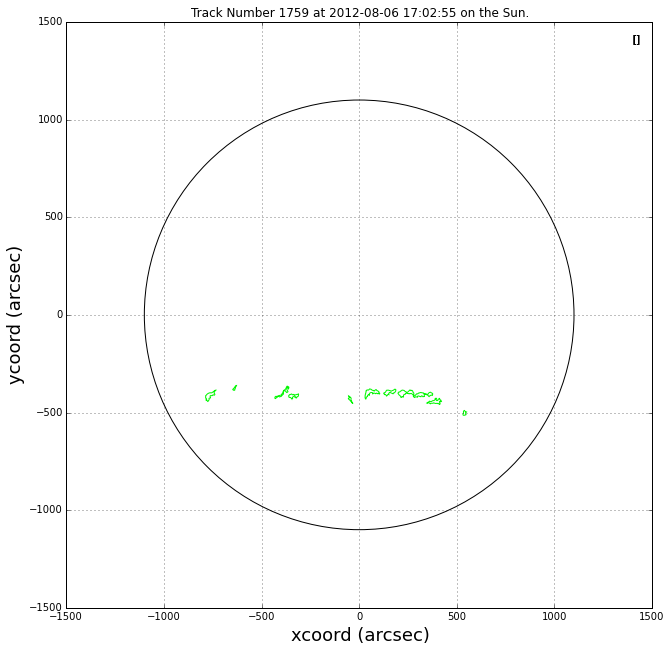

2012-07-30 17:46:18
2012-08-01 16:55:35
2012-08-02 06:13:39
2012-08-02 17:11:06
2012-08-03 06:12:12
2012-08-03 19:04:23
2012-08-04 08:01:14
2012-08-06 17:02:55


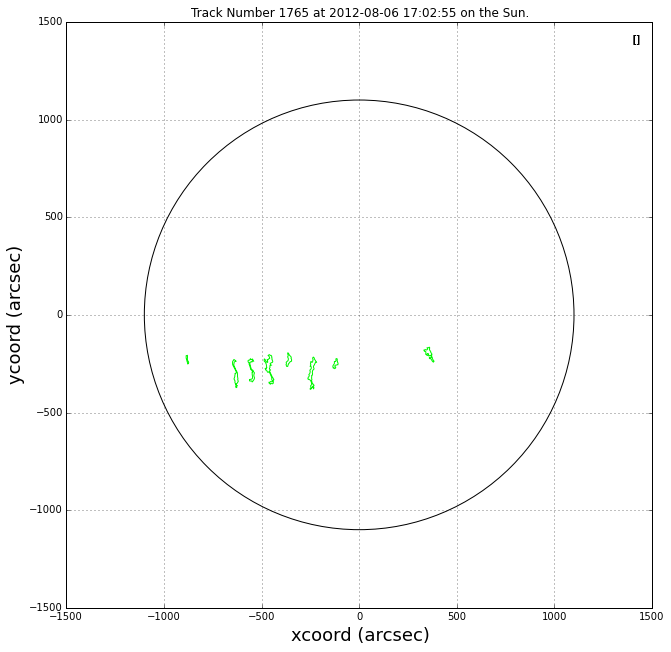

2012-07-31 09:46:00
2012-08-01 16:55:35
2012-08-02 06:13:39
2012-08-02 17:11:06
2012-08-03 19:04:23
2012-08-04 16:41:34


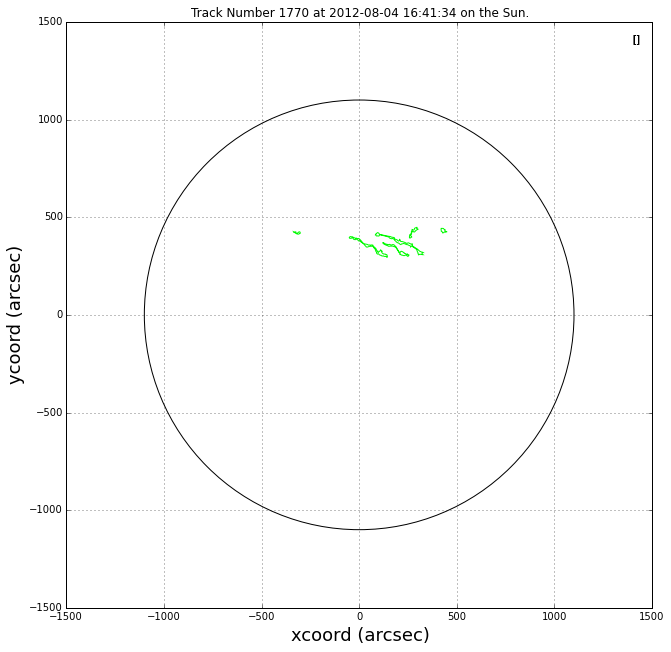

2012-08-01 06:20:13
2012-08-01 16:55:35
2012-08-02 06:13:39
2012-08-02 17:11:06
2012-08-03 06:12:12
2012-08-03 19:04:23
2012-08-06 17:02:55
2012-08-07 09:55:25
2012-08-08 08:54:34
2012-08-09 08:52:12
2012-08-10 05:52:39
2012-08-10 18:49:05
2012-08-11 05:49:40


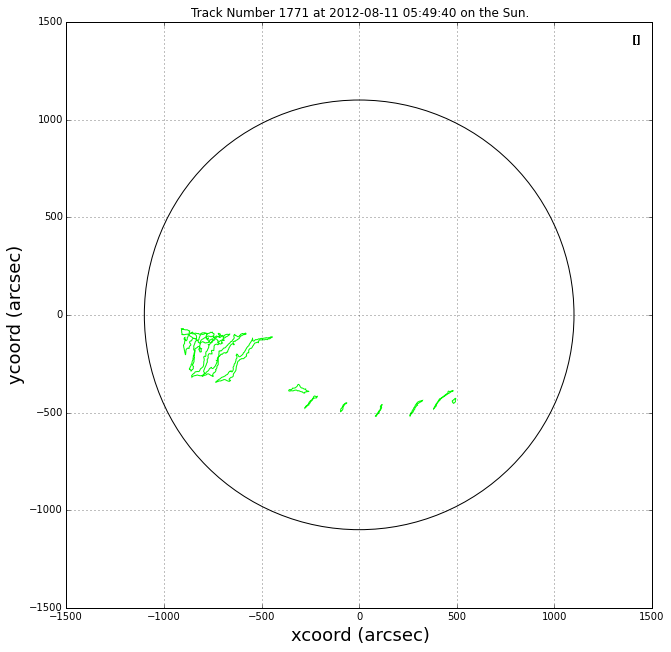

2012-08-01 16:55:35
2012-08-02 06:13:39
2012-08-02 17:11:06
2012-08-03 06:12:12
2012-08-03 19:04:23
2012-08-04 16:41:34


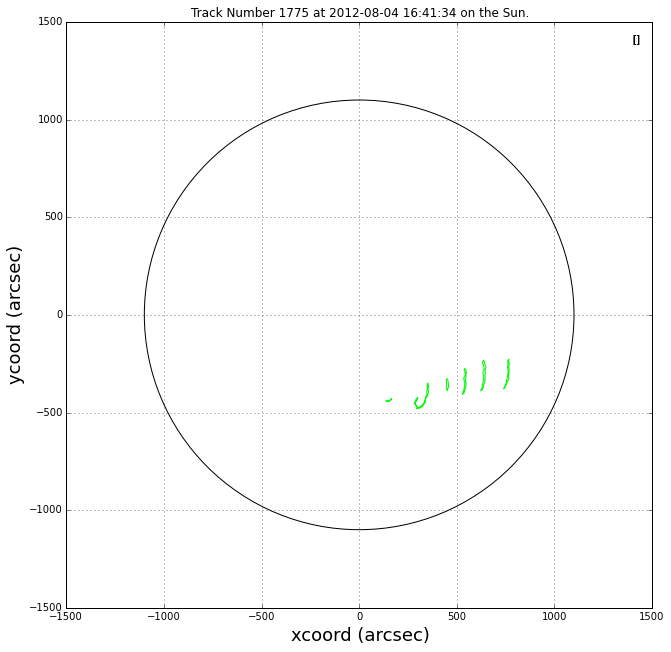

2012-08-01 16:55:35
2012-08-02 17:11:06
2012-08-03 06:12:12
2012-08-03 19:04:23
2012-08-04 08:01:14
2012-08-04 16:41:34


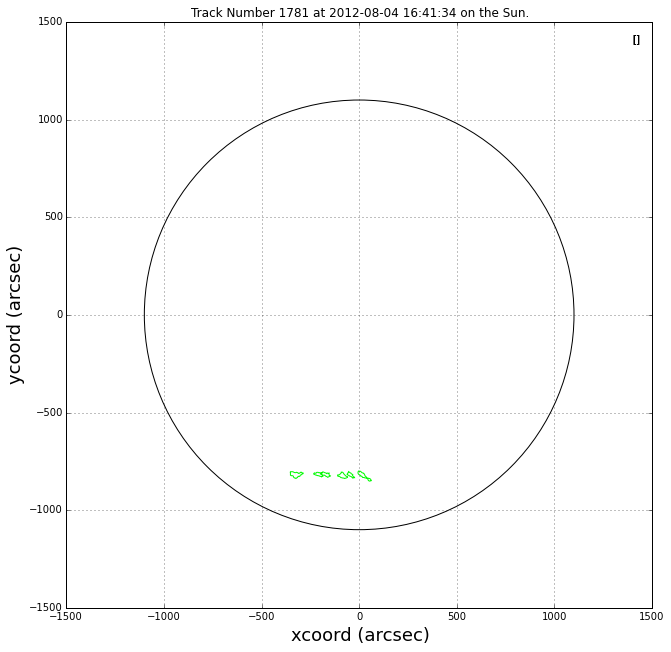

2012-08-02 06:13:39
2012-08-02 17:11:06
2012-08-03 06:12:12
2012-08-03 19:04:23
2012-08-04 08:01:14
2012-08-04 16:41:34
2012-08-05 06:08:38
2012-08-06 17:02:55


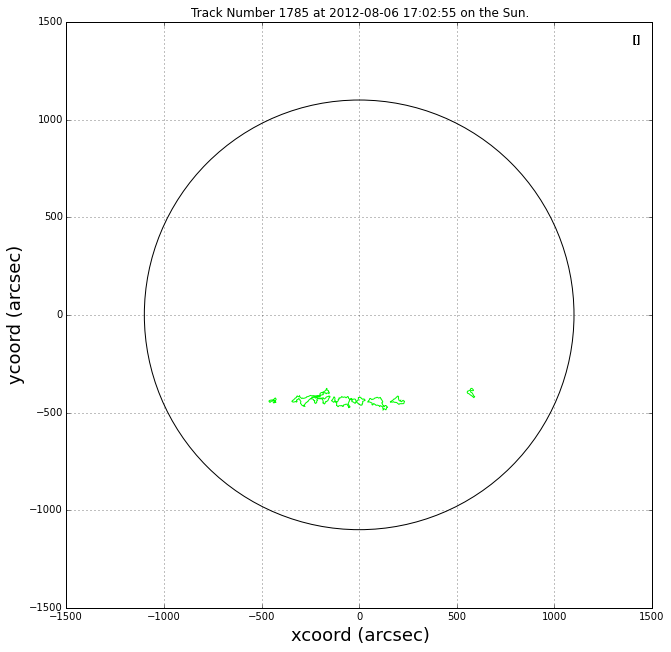

2012-08-02 17:11:06
2012-08-03 19:04:23
2012-08-04 16:41:34
2012-08-05 06:08:38
2012-08-06 17:02:55
2012-08-07 09:55:25
2012-08-08 17:18:02
2012-08-10 05:52:39
2012-08-10 18:49:05
2012-08-11 05:49:40


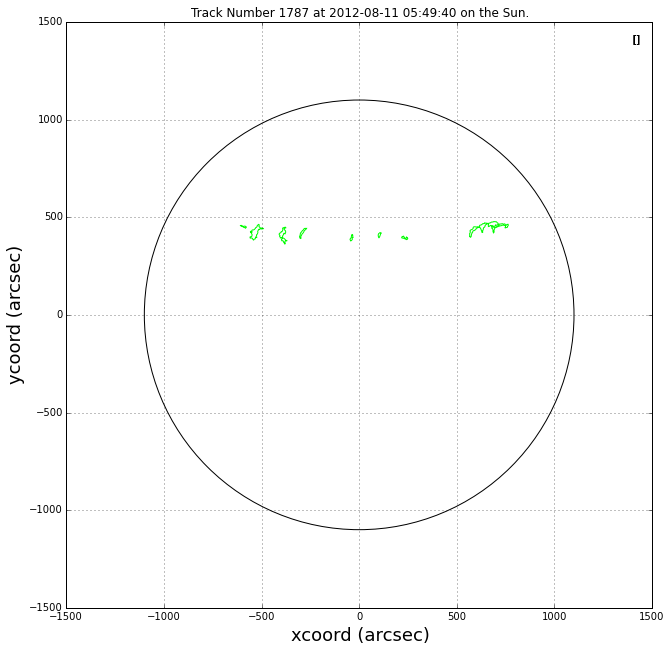

2012-08-02 17:11:06
2012-08-03 06:12:12
2012-08-03 19:04:23
2012-08-04 08:01:14
2012-08-04 16:41:34
2012-08-06 17:02:55


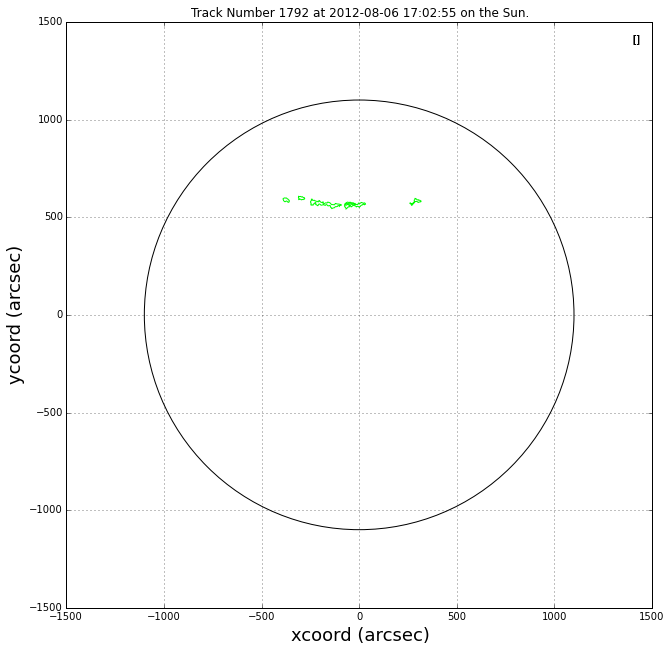

2012-08-04 16:41:34
2012-08-07 09:55:25
2012-08-08 08:54:34
2012-08-10 05:52:39
2012-08-10 18:49:05
2012-08-11 05:49:40
2012-08-12 05:49:54
2012-08-12 17:58:09


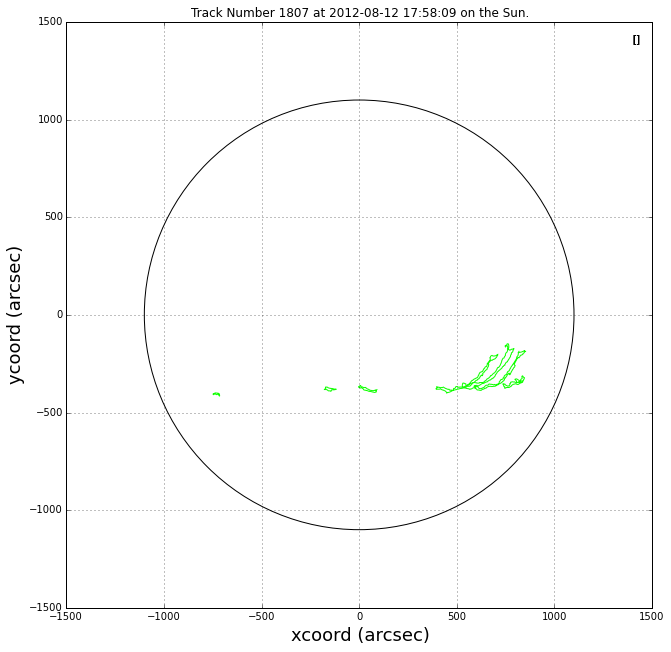

2012-08-09 08:52:12
2012-08-09 16:23:46
2012-08-11 05:49:40
2012-08-12 17:58:09
2012-08-14 17:21:59
2012-08-15 15:49:02


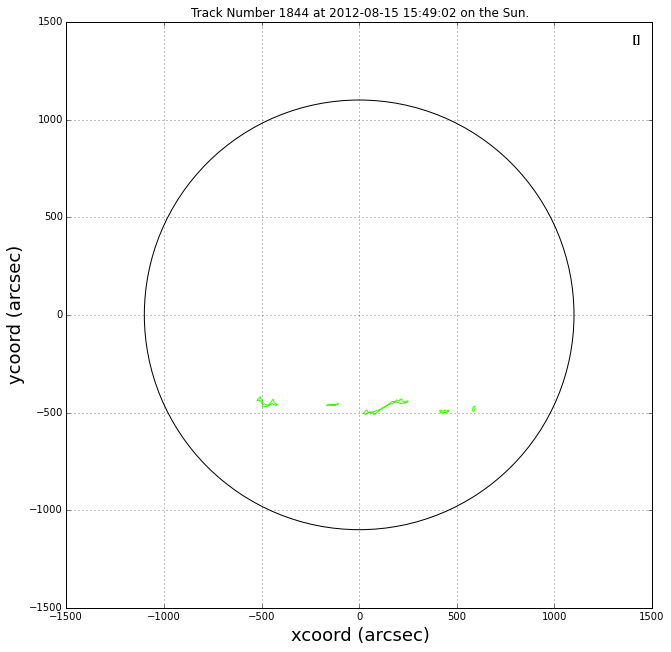

2012-08-10 18:49:05
2012-08-11 05:49:40
2012-08-12 05:49:54
2012-08-14 17:21:59
2012-08-15 06:46:29
2012-08-16 06:16:28


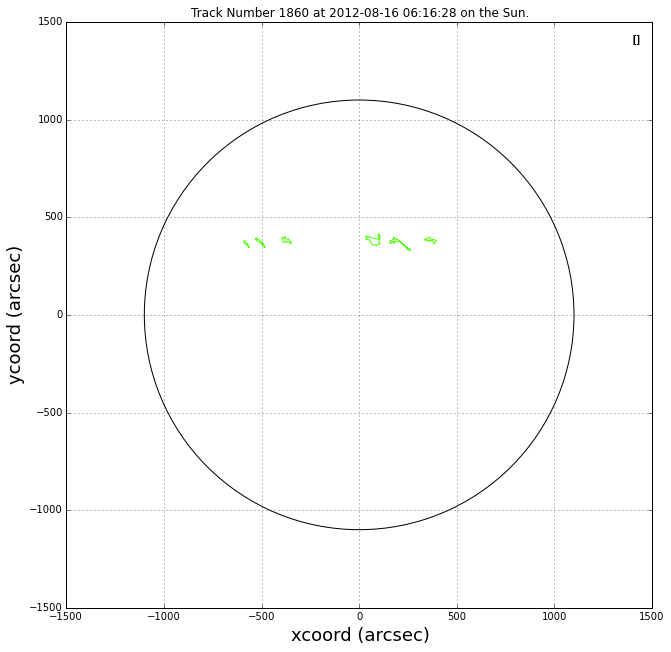

2012-08-12 05:49:54
2012-08-12 17:58:09
2012-08-13 08:33:13
2012-08-14 17:21:59
2012-08-15 06:46:29
2012-08-15 15:49:02


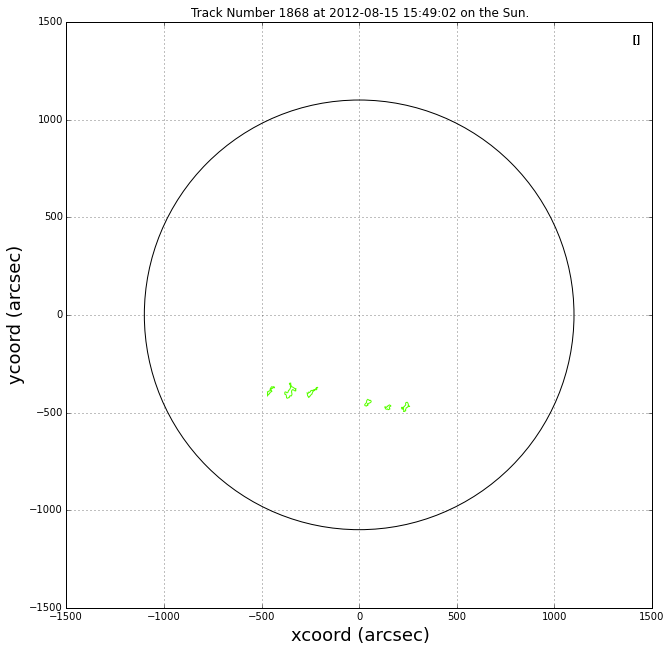

2012-08-14 06:42:53
2012-08-14 17:21:59
2012-08-15 06:46:29
2012-08-15 15:49:02
2012-08-16 06:16:28
2012-08-16 17:30:44


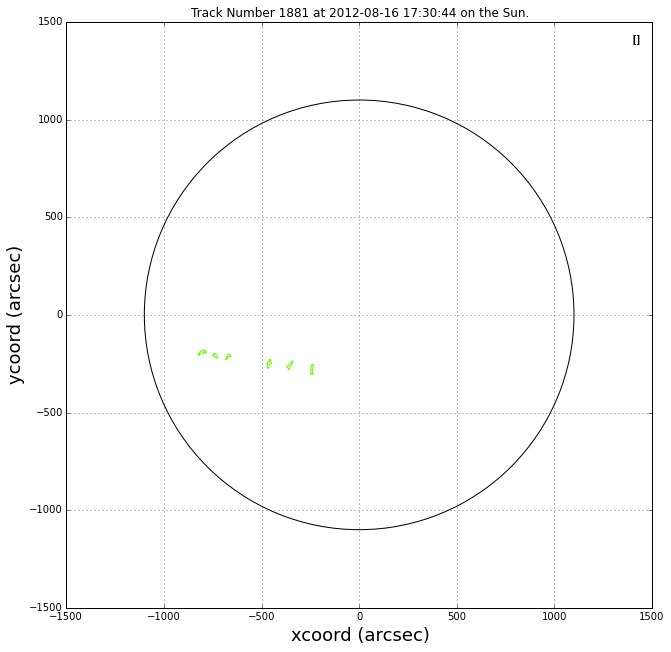

2012-08-14 17:21:59
2012-08-15 06:46:29
2012-08-16 06:16:28
2012-08-17 06:11:33
2012-08-18 05:45:20
2012-08-19 05:45:08
2012-08-20 05:57:15
2012-08-21 07:10:35
2012-08-22 06:08:26


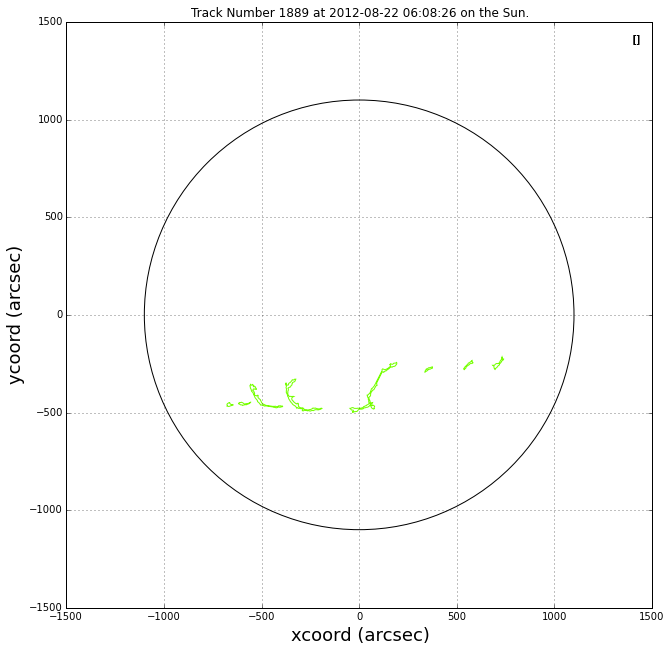

2012-08-18 05:45:20
2012-08-18 16:20:48
2012-08-19 05:45:08
2012-08-20 17:49:19
2012-08-22 06:08:26
2012-08-23 07:58:48
2012-08-24 06:52:41
2012-08-25 06:39:16
2012-08-25 17:46:37


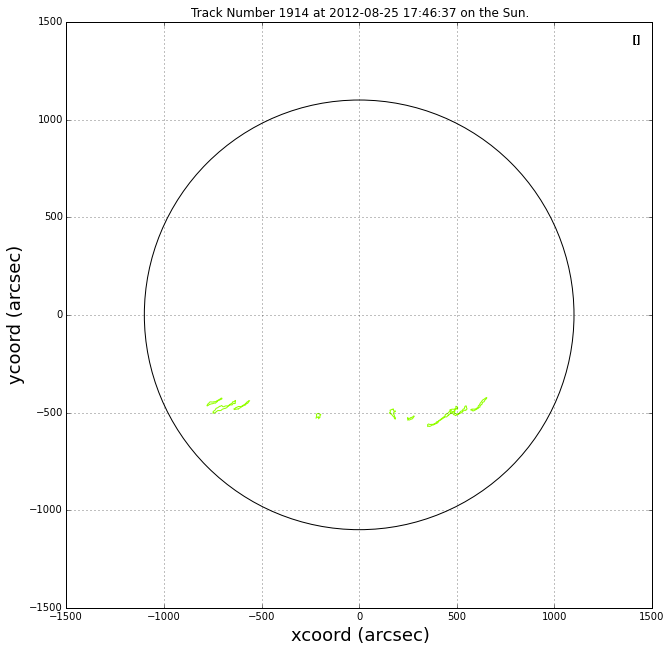

2012-08-18 16:20:48
2012-08-19 05:45:08
2012-08-19 17:12:18
2012-08-20 05:57:15
2012-08-20 17:49:19
2012-08-21 07:10:35
2012-08-22 06:08:26
2012-08-23 16:34:00


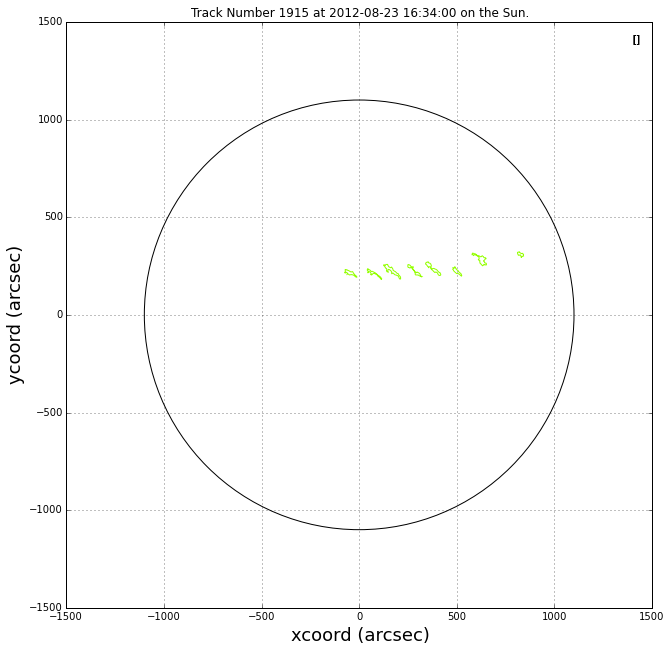

2012-08-19 05:45:08
2012-08-19 17:12:18
2012-08-20 05:57:15
2012-08-20 17:49:19
2012-08-21 07:10:35
2012-08-22 06:08:26
2012-08-23 07:58:48
2012-08-23 16:34:00
2012-08-24 06:52:41
2012-08-24 16:47:43
2012-08-25 17:46:37
2012-08-26 17:20:48
2012-08-27 06:52:24
2012-08-27 16:50:53
2012-08-28 06:08:47
2012-08-28 17:10:48
2012-08-29 06:07:37


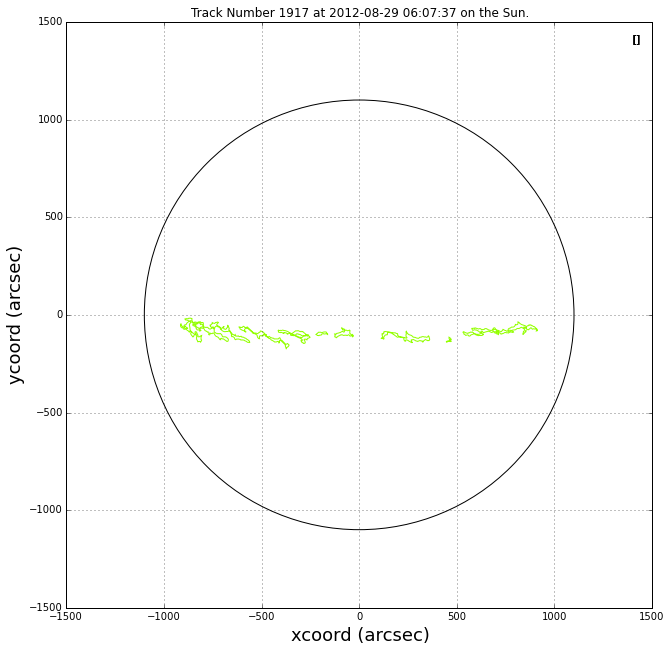

2012-08-19 17:12:18
2012-08-20 05:57:15
2012-08-20 17:49:19
2012-08-21 07:10:35
2012-08-22 06:08:26
2012-08-23 07:58:48
2012-08-23 16:34:00
2012-08-24 06:52:41
2012-08-24 16:47:43
2012-08-25 06:39:16
2012-08-25 17:46:37
2012-08-26 17:20:48
2012-08-27 06:52:24
2012-08-27 16:50:53
2012-08-28 17:10:48


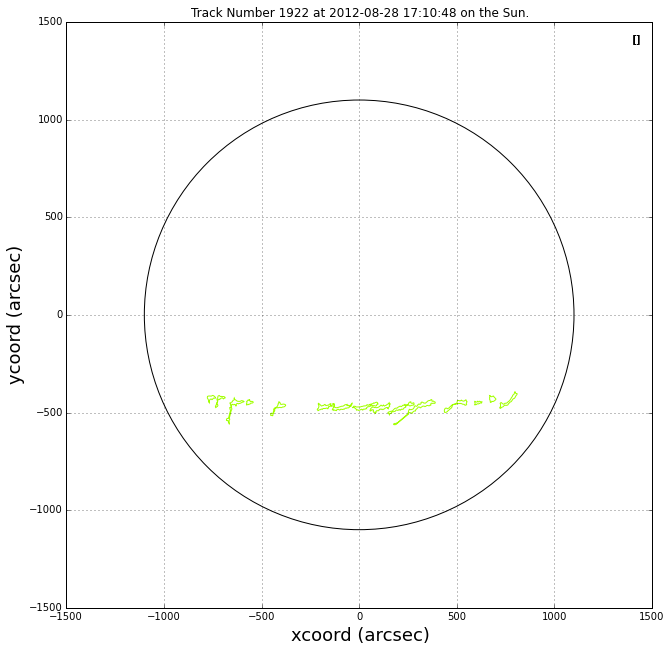

2012-08-21 07:10:35
2012-08-22 06:08:26
2012-08-23 07:58:48
2012-08-23 16:34:00
2012-08-24 06:52:41
2012-08-24 16:47:43
2012-08-25 06:39:16
2012-08-25 17:46:37
2012-08-26 17:20:48
2012-08-27 06:52:24
2012-08-28 06:08:47
2012-08-28 17:10:48
2012-08-29 06:07:37
2012-08-30 06:00:50
2012-08-30 17:07:26
2012-08-31 16:38:55


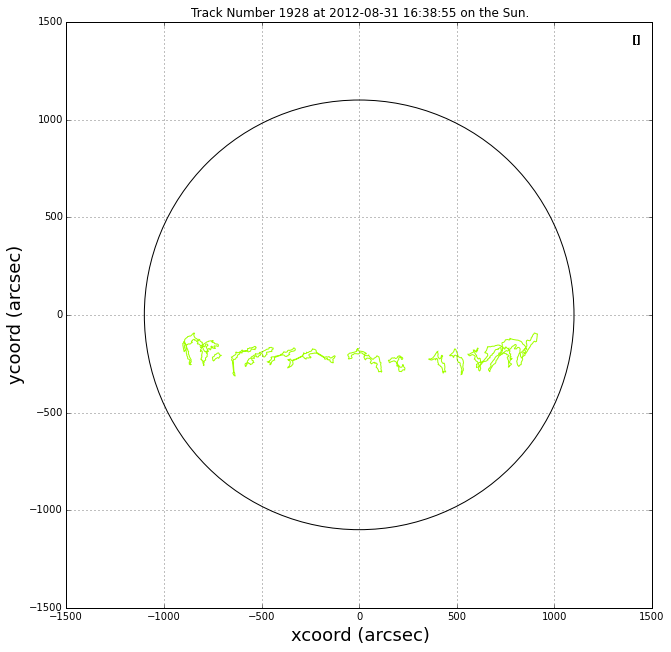

2012-08-21 07:10:35
2012-08-22 06:08:26
2012-08-23 07:58:48
2012-08-23 16:34:00
2012-08-24 16:47:43
2012-08-25 17:46:37
2012-08-26 17:20:48
2012-08-27 16:50:53
2012-08-28 06:08:47
2012-08-28 17:10:48
2012-08-29 06:07:37
2012-08-30 06:00:50
2012-08-30 17:07:26
2012-08-31 16:38:55


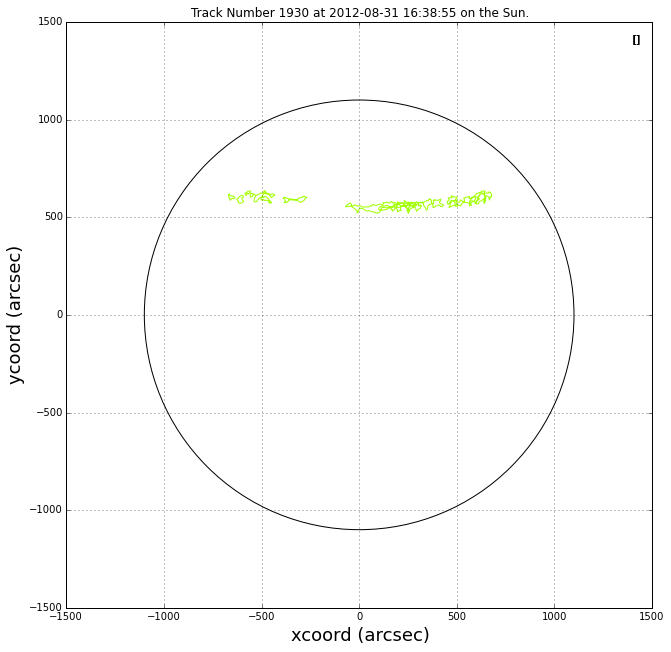

2012-08-22 06:08:26
2012-08-23 07:58:48
2012-08-23 16:34:00
2012-08-24 06:52:41
2012-08-24 16:47:43
2012-08-25 06:39:16
2012-08-25 17:46:37
2012-08-28 17:10:48
2012-08-31 16:38:55


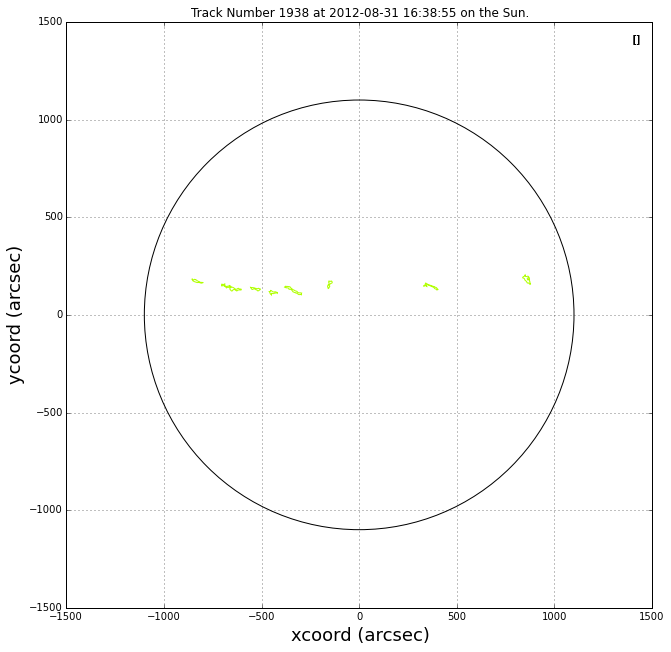

2012-08-23 07:58:48
2012-08-23 16:34:00
2012-08-24 06:52:41
2012-08-24 16:47:43
2012-08-25 06:39:16
2012-08-25 17:46:37
2012-08-27 16:50:53
2012-08-28 17:10:48
2012-08-29 06:07:37


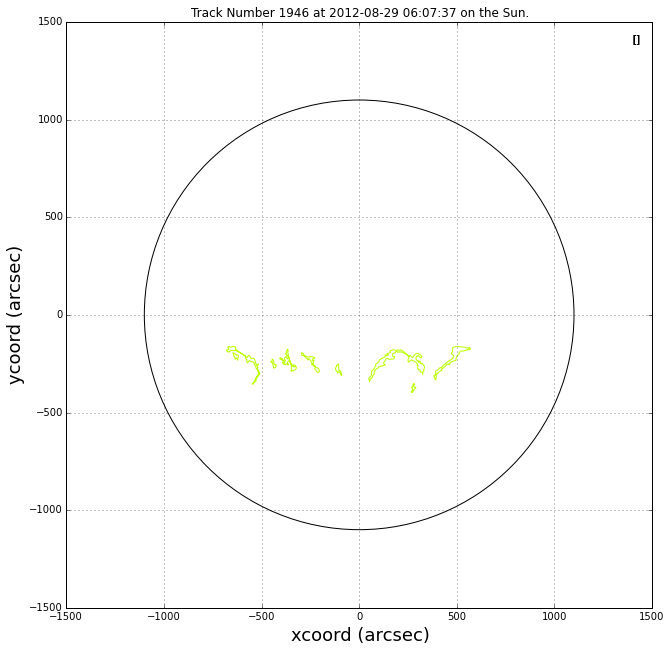

2012-08-23 16:34:00
2012-08-24 06:52:41
2012-08-25 06:39:16
2012-08-25 17:46:37
2012-08-27 16:50:53
2012-08-28 17:10:48
2012-08-29 06:07:37
2012-08-30 06:00:50


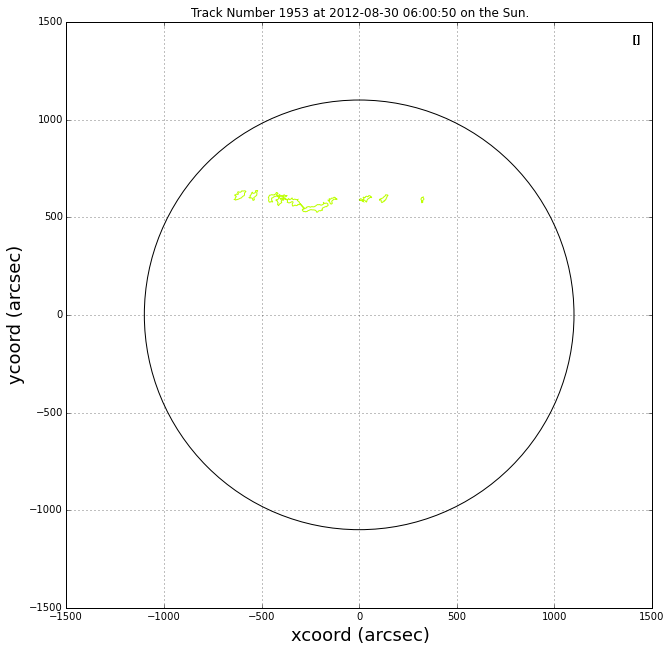

2012-08-23 16:34:00
2012-08-24 06:52:41
2012-08-24 16:47:43
2012-08-25 06:39:16
2012-08-25 17:46:37
2012-08-26 17:20:48
2012-08-29 06:07:37
2012-08-30 06:00:50
2012-09-01 16:51:04


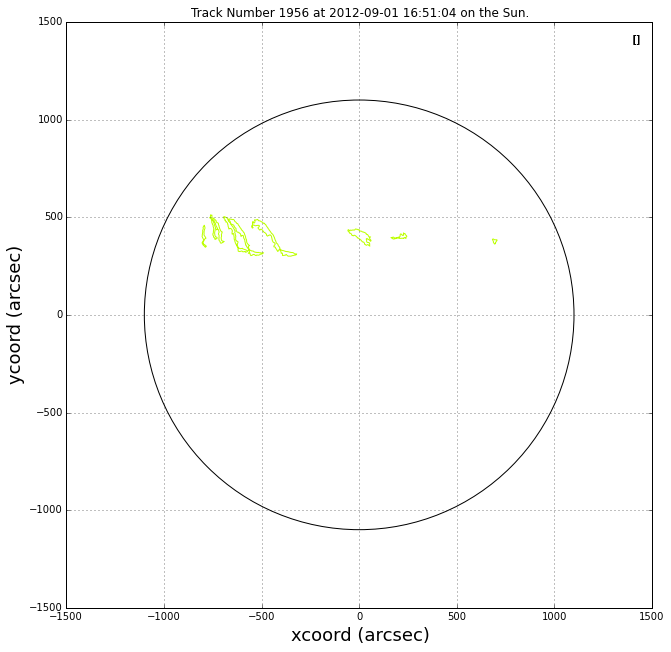

2012-08-24 06:52:41
2012-08-24 16:47:43
2012-08-27 16:50:53
2012-08-28 17:10:48
2012-08-29 06:07:37
2012-08-30 06:00:50
2012-08-31 16:38:55


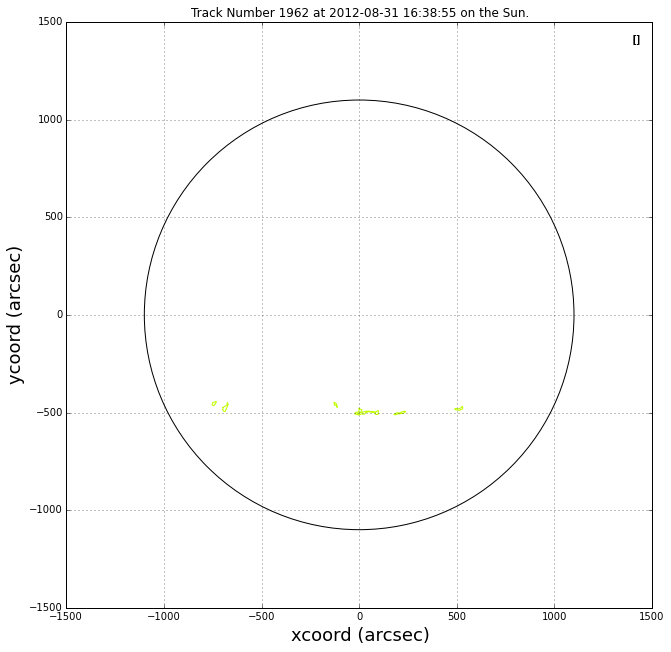

2012-08-24 16:47:43
2012-08-25 06:39:16
2012-08-25 17:46:37
2012-08-26 17:20:48
2012-08-27 06:52:24
2012-08-28 06:08:47
2012-08-30 06:00:50


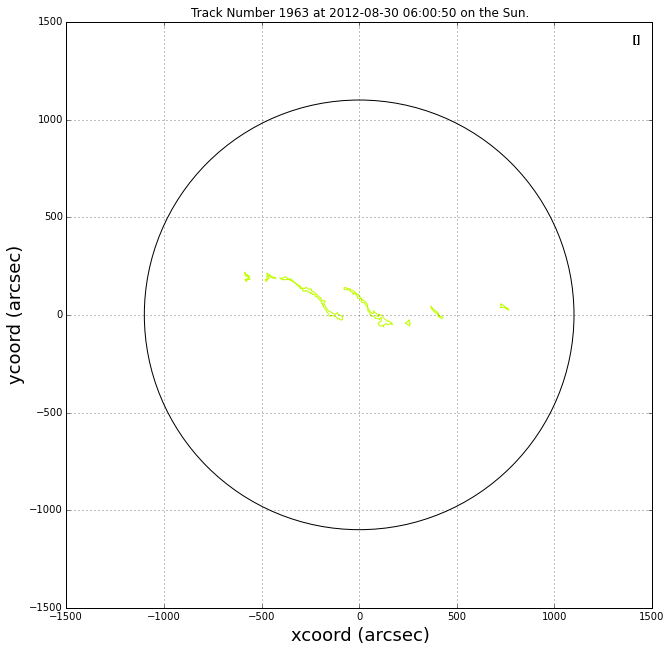

2012-08-26 17:20:48
2012-08-27 16:50:53
2012-08-28 06:08:47
2012-08-28 17:10:48
2012-08-29 06:07:37
2012-08-30 06:00:50


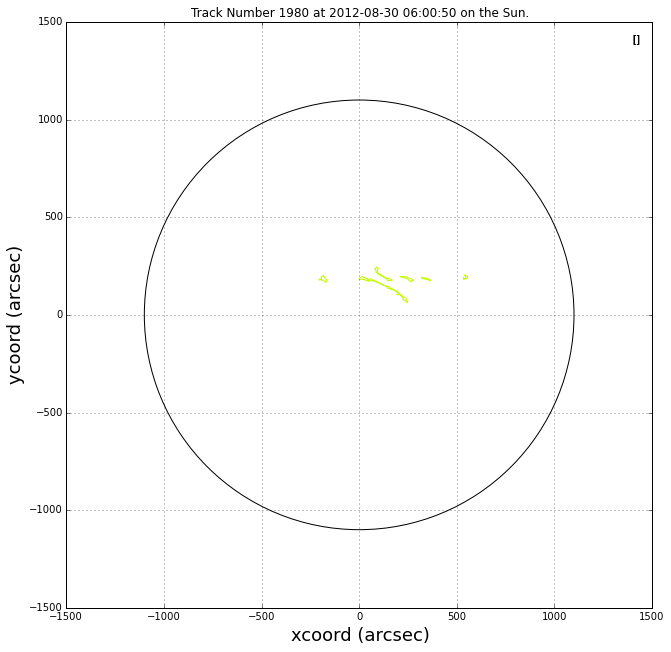

2012-08-26 17:20:48
2012-08-27 06:52:24
2012-08-27 16:50:53
2012-08-28 06:08:47
2012-08-28 17:10:48
2012-08-29 06:07:37


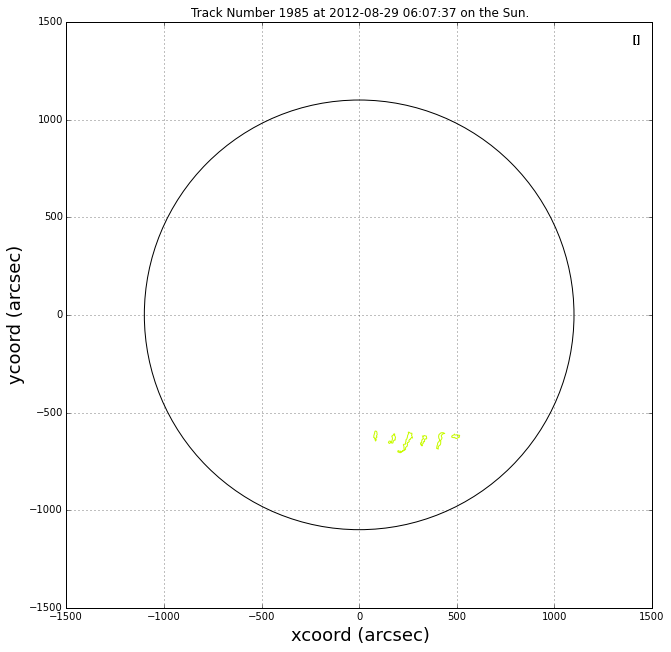

2012-08-26 17:20:48
2012-08-27 06:52:24
2012-08-27 16:50:53
2012-08-28 17:10:48
2012-08-30 17:07:26
2012-09-01 16:51:04
2012-09-02 11:20:48
2012-09-03 06:34:43


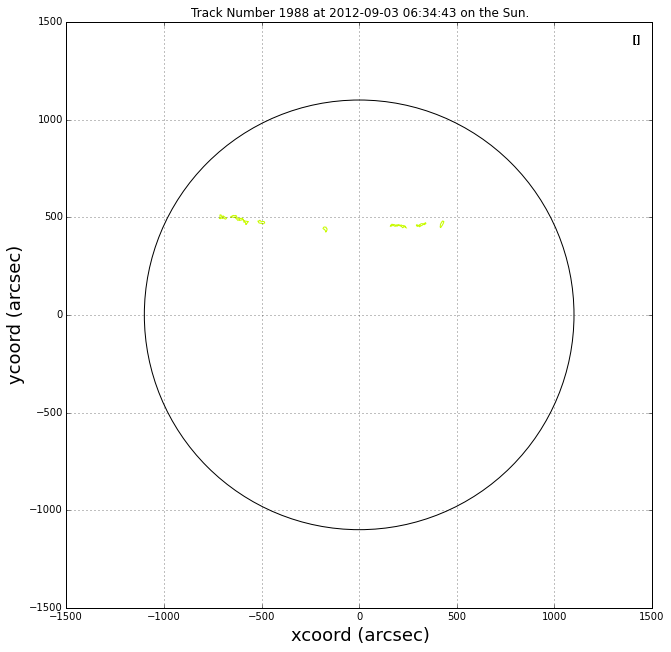

2012-08-26 17:20:48
2012-08-27 06:52:24
2012-08-27 16:50:53
2012-08-28 06:08:47
2012-08-28 17:10:48
2012-08-29 06:07:37
2012-08-30 06:00:50
2012-08-30 17:07:26


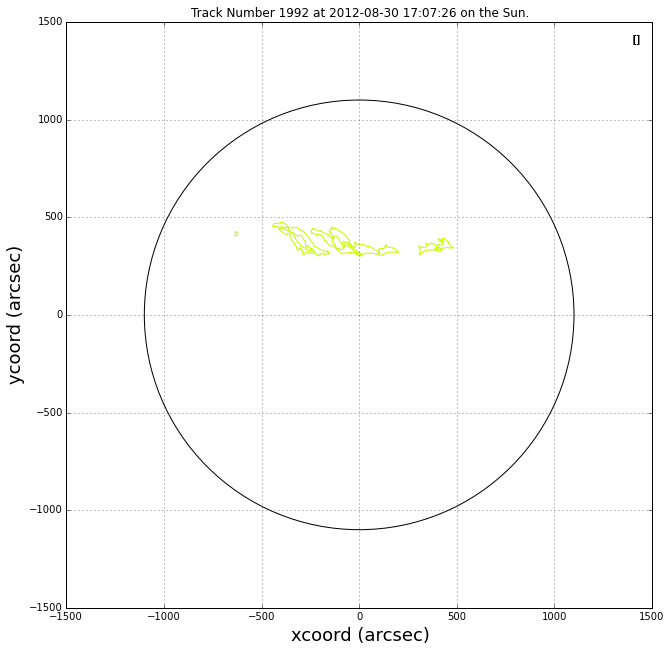

2012-08-28 06:08:47
2012-08-28 17:10:48
2012-08-29 06:07:37
2012-08-30 06:00:50
2012-08-30 17:07:26
2012-08-31 16:38:55
2012-09-01 16:51:04
2012-09-02 11:20:48
2012-09-03 06:34:43
2012-09-04 09:01:03
2012-09-04 17:25:22
2012-09-05 08:26:24


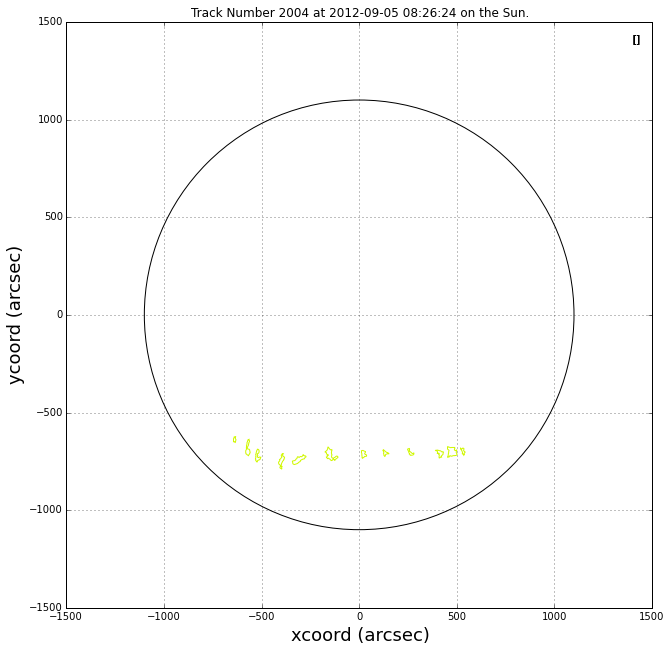

2012-08-28 17:10:48
2012-08-30 17:07:26
2012-08-31 16:38:55
2012-09-01 16:51:04
2012-09-02 11:20:48
2012-09-03 06:34:43


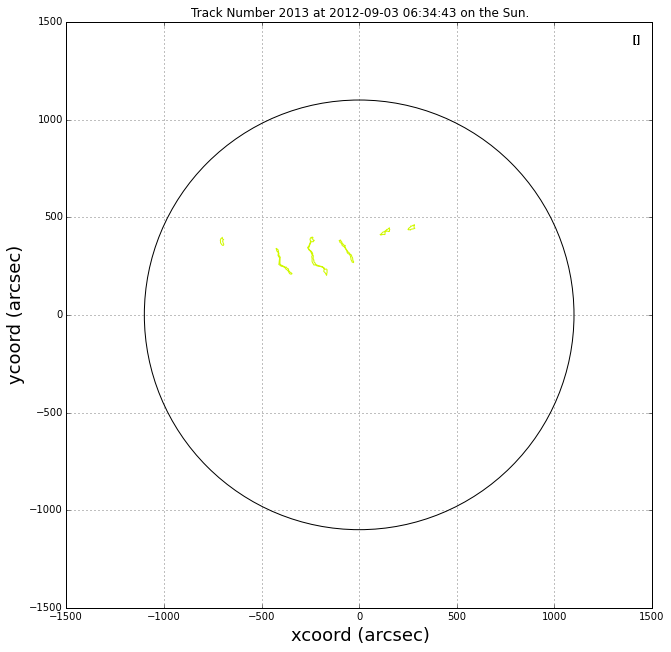

2012-08-31 16:38:55
2012-09-01 16:51:04
2012-09-02 11:20:48
2012-09-03 06:34:43
2012-09-03 17:10:06
2012-09-04 17:25:22


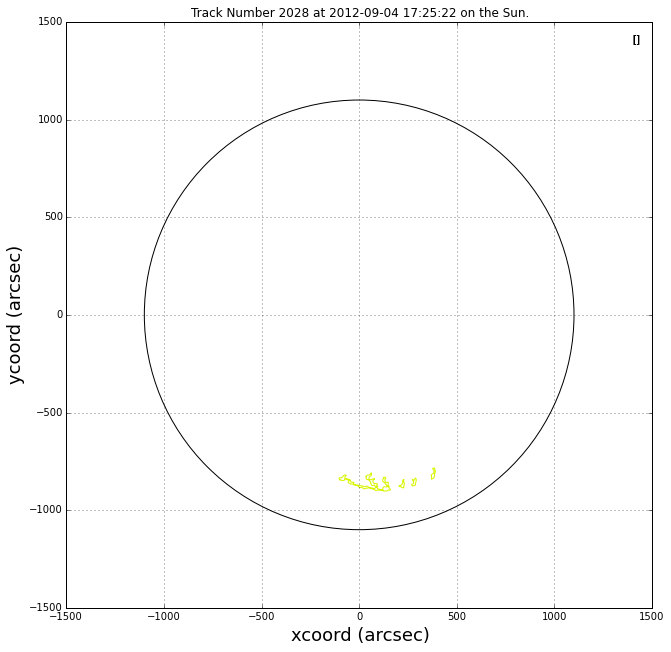

2012-09-03 06:34:43
2012-09-03 17:10:06
2012-09-04 09:01:03
2012-09-04 17:25:22
2012-09-05 08:26:24
2012-09-07 06:04:53
2012-09-08 20:05:19
2012-09-10 16:56:09


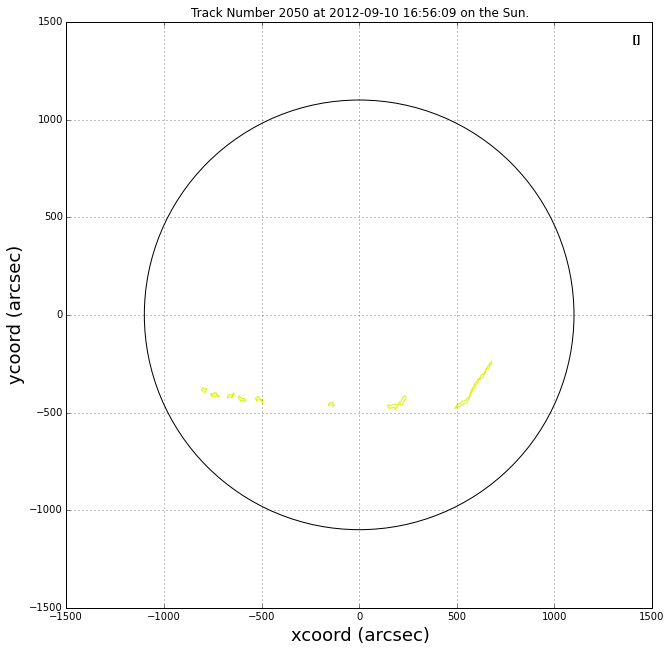

2012-09-03 06:34:43
2012-09-04 09:01:03
2012-09-04 17:25:22
2012-09-06 17:28:37
2012-09-08 05:43:06
2012-09-08 20:05:19
2012-09-09 05:57:27


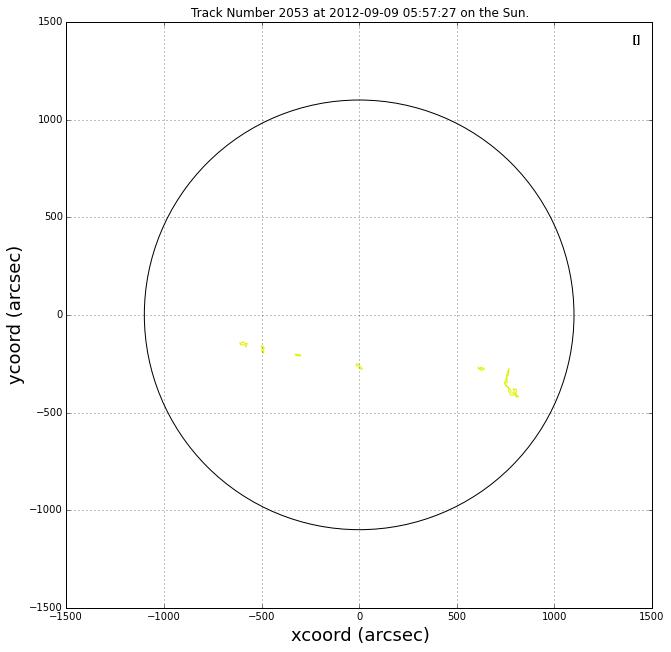

2012-09-03 06:34:43
2012-09-03 17:10:06
2012-09-04 17:25:22
2012-09-05 08:26:24
2012-09-06 17:28:37
2012-09-07 06:04:53
2012-09-08 05:43:06
2012-09-08 20:05:19


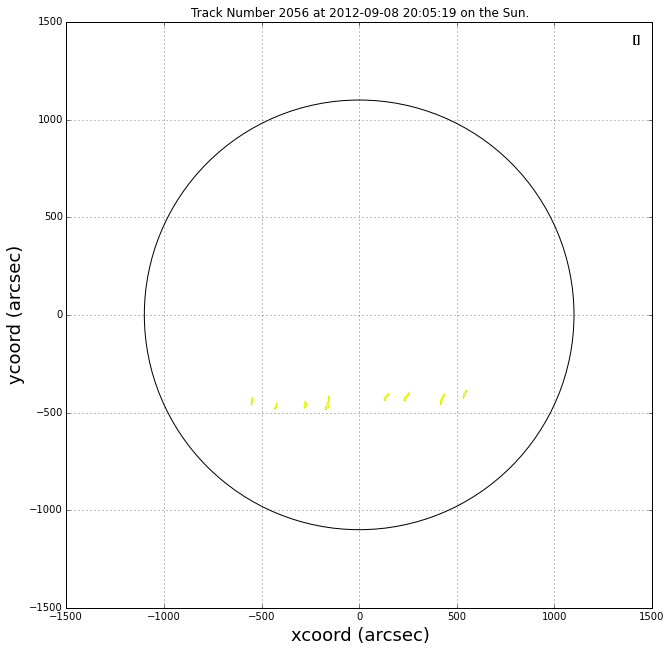

2012-09-03 17:10:06
2012-09-04 09:01:03
2012-09-06 17:28:37
2012-09-07 06:04:53
2012-09-07 17:35:35
2012-09-08 05:43:06
2012-09-08 20:05:19
2012-09-09 05:57:27
2012-09-10 05:41:18
2012-09-11 17:44:34
2012-09-12 17:28:47


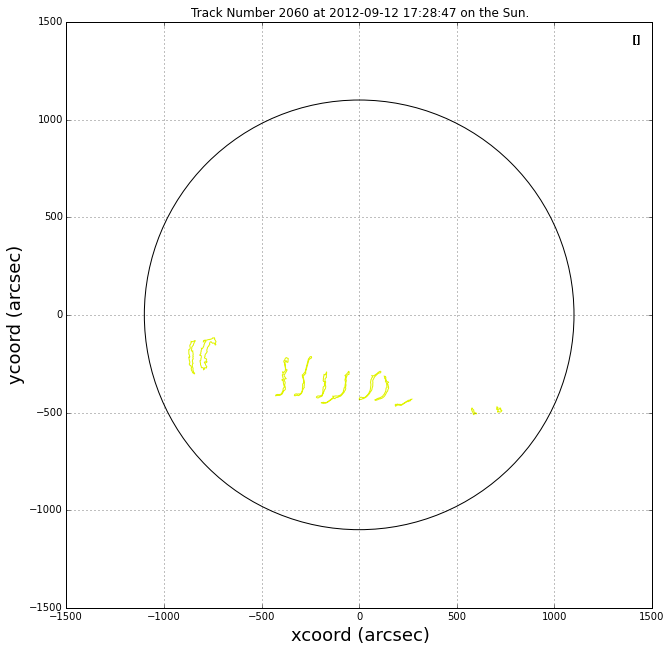

2012-09-04 09:01:03
2012-09-04 17:25:22
2012-09-05 08:26:24
2012-09-06 17:28:37
2012-09-07 17:35:35
2012-09-08 20:05:19
2012-09-10 05:41:18
2012-09-10 16:56:09


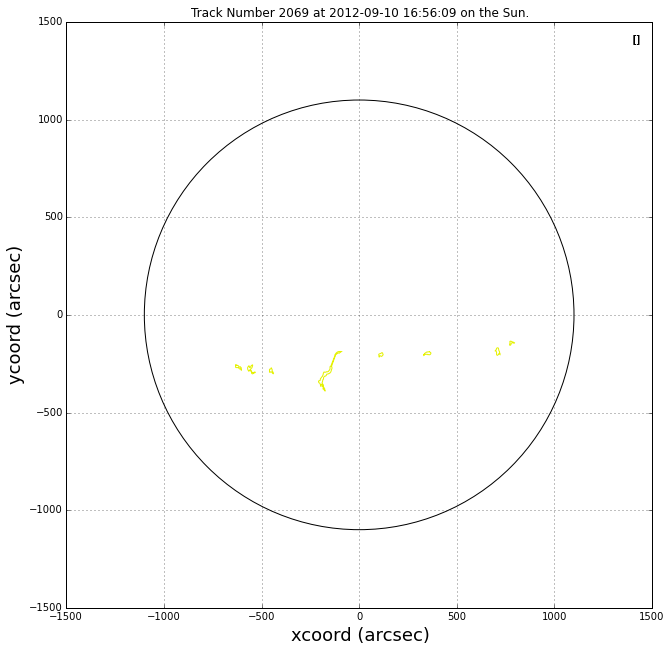

2012-09-04 09:01:03
2012-09-04 17:25:22
2012-09-05 08:26:24
2012-09-06 07:55:29
2012-09-06 17:28:37
2012-09-07 06:04:53
2012-09-07 17:35:35


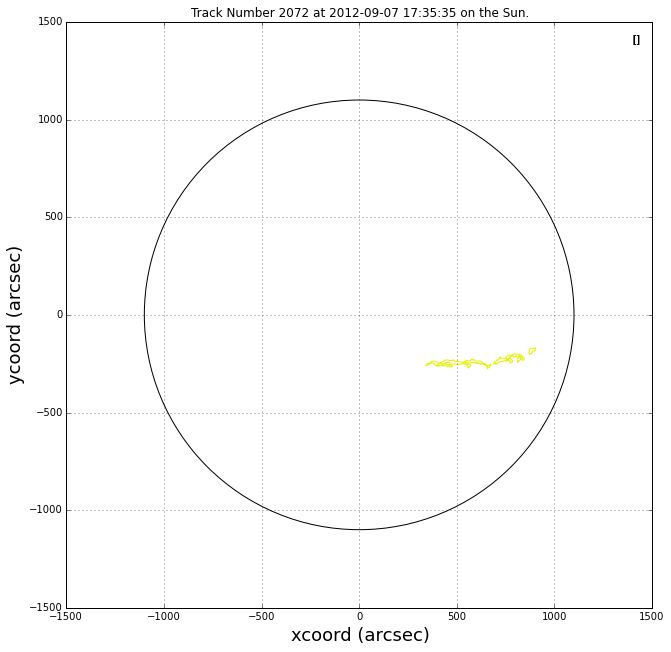

2012-09-06 07:55:29
2012-09-06 17:28:37
2012-09-07 06:04:53
2012-09-07 17:35:35
2012-09-08 05:43:06
2012-09-09 05:57:27
2012-09-10 05:41:18
2012-09-10 16:56:09
2012-09-11 06:16:22
2012-09-12 07:08:50
2012-09-12 17:28:47
2012-09-13 16:50:57
2012-09-14 08:32:13
2012-09-14 18:26:06
2012-09-15 06:54:07


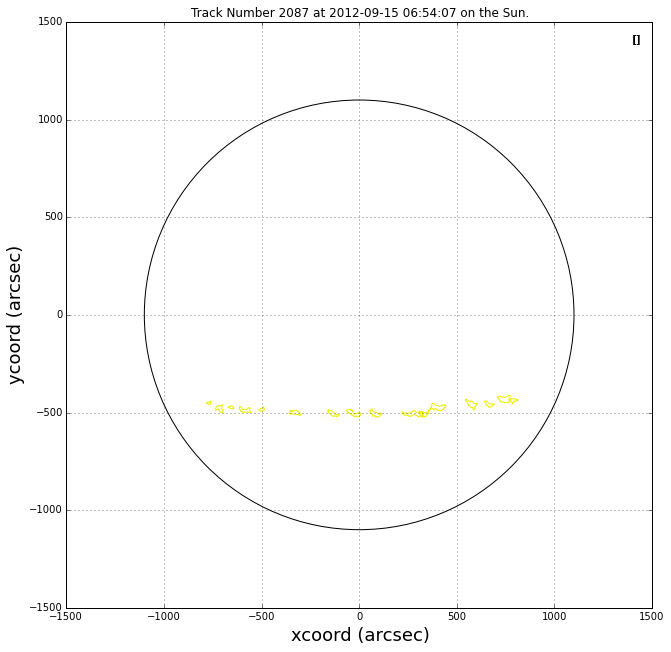

2012-09-06 07:55:29
2012-09-06 17:28:37
2012-09-07 17:35:35
2012-09-08 05:43:06
2012-09-09 05:57:27
2012-09-10 05:41:18
2012-09-11 06:16:22
2012-09-11 17:44:34
2012-09-12 07:08:50
2012-09-12 17:28:47


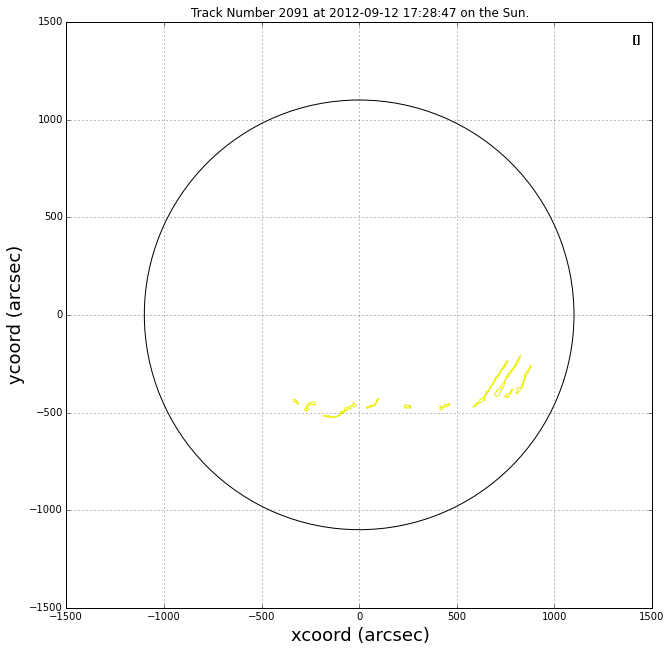

2012-09-06 07:55:29
2012-09-07 06:04:53
2012-09-07 17:35:35
2012-09-08 05:43:06
2012-09-08 20:05:19
2012-09-09 05:57:27
2012-09-10 05:41:18


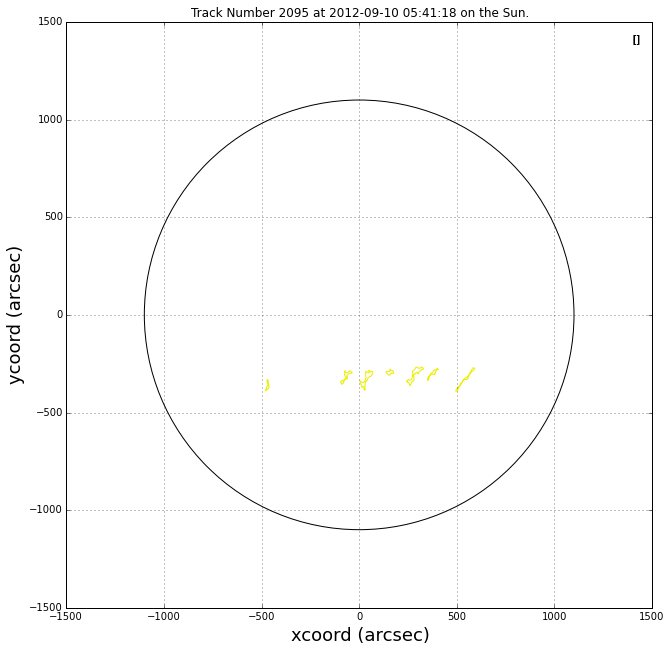

2012-09-06 17:28:37
2012-09-07 17:35:35
2012-09-08 20:05:19
2012-09-09 05:57:27
2012-09-10 16:56:09
2012-09-11 17:44:34
2012-09-12 17:28:47


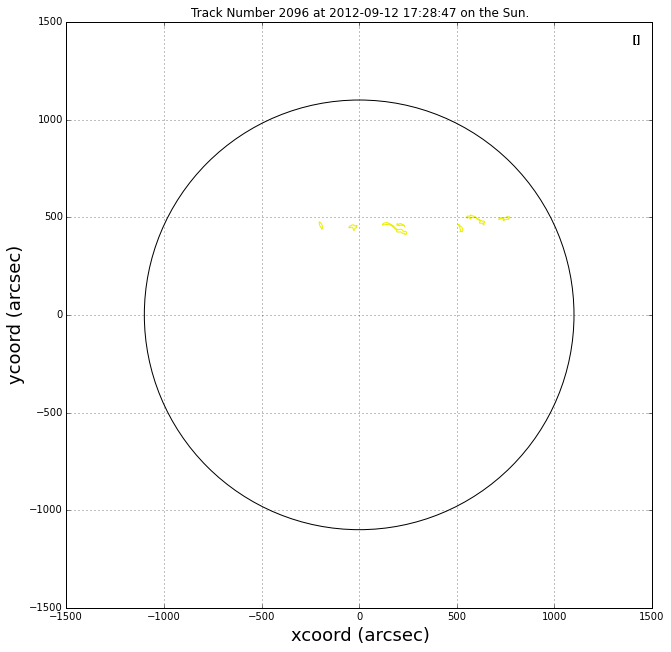

2012-09-06 17:28:37
2012-09-07 06:04:53
2012-09-07 17:35:35
2012-09-08 05:43:06
2012-09-08 20:05:19
2012-09-09 05:57:27
2012-09-10 05:41:18
2012-09-10 16:56:09
2012-09-11 06:16:22
2012-09-12 07:08:50
2012-09-12 17:28:47


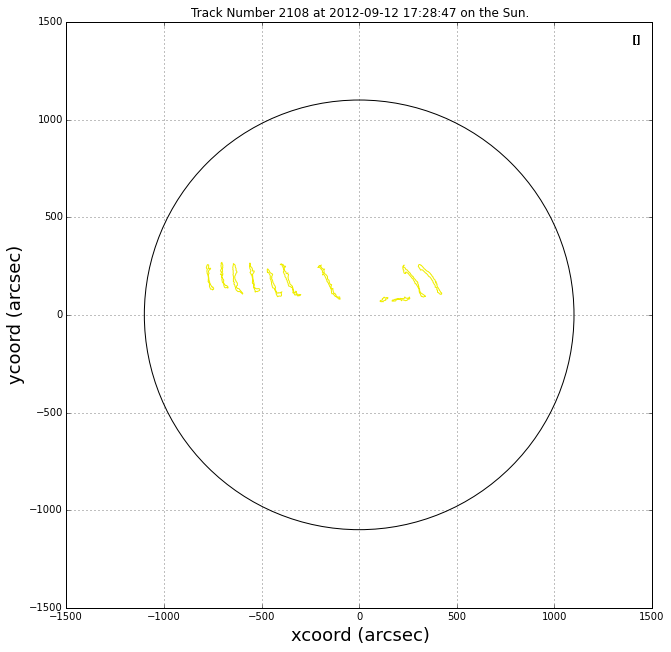

2012-09-10 05:41:18
2012-09-10 16:56:09
2012-09-11 06:16:22
2012-09-11 17:44:34
2012-09-12 07:08:50
2012-09-12 17:28:47
2012-09-13 16:50:57
2012-09-14 18:26:06
2012-09-15 06:54:07
2012-09-16 07:08:01
2012-09-16 19:25:16
2012-09-17 08:53:01
2012-09-17 19:08:37
2012-09-18 06:11:55


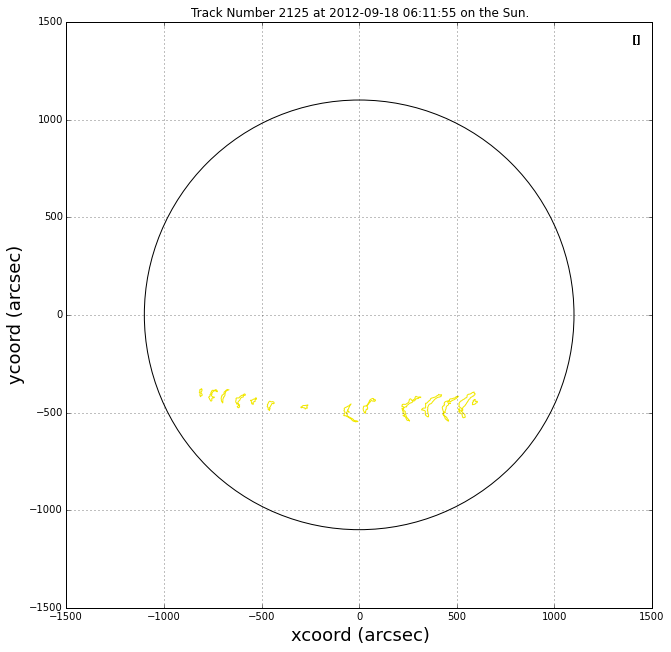

2012-09-10 05:41:18
2012-09-10 16:56:09
2012-09-11 06:16:22
2012-09-11 17:44:34
2012-09-12 07:08:50
2012-09-12 17:28:47
2012-09-13 16:50:57
2012-09-14 18:26:06
2012-09-15 06:54:07
2012-09-16 07:08:01


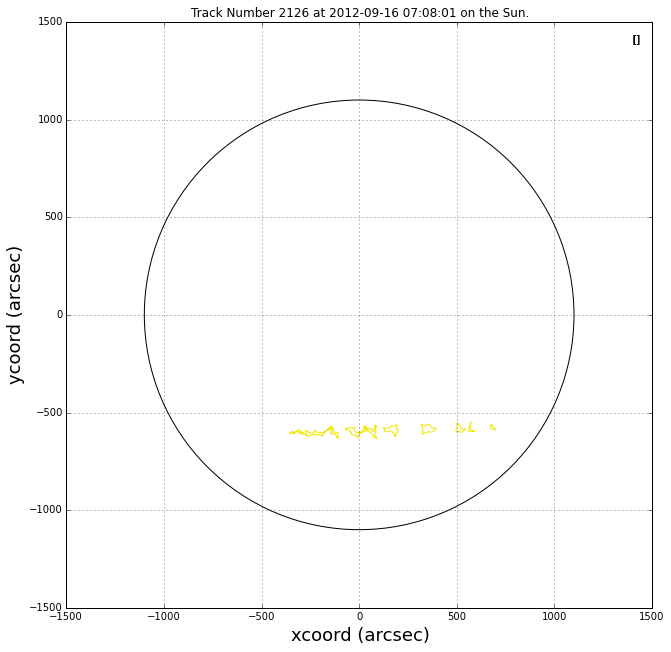

2012-09-10 05:41:18
2012-09-10 16:56:09
2012-09-11 06:16:22
2012-09-11 17:44:34
2012-09-12 07:08:50
2012-09-12 17:28:47
2012-09-13 16:50:57


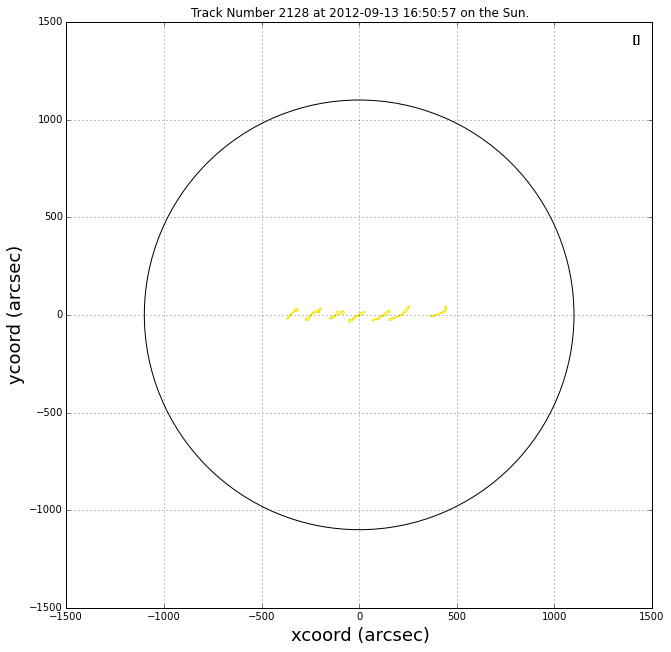

2012-09-14 18:26:06
2012-09-15 06:54:07
2012-09-16 07:08:01
2012-09-16 19:25:16
2012-09-17 08:53:01
2012-09-17 19:08:37
2012-09-18 06:11:55
2012-09-18 19:19:07
2012-09-19 18:20:18
2012-09-20 19:11:26
2012-09-21 07:19:21
2012-09-21 17:52:34
2012-09-23 10:58:52
2012-09-23 19:14:03
2012-09-24 06:14:30
2012-09-25 06:46:50


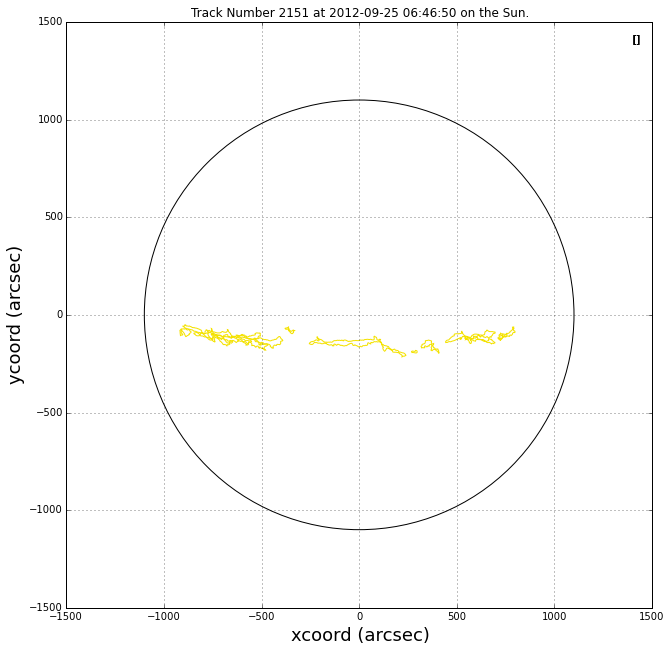

2012-09-16 07:08:01
2012-09-16 19:25:16
2012-09-17 08:53:01
2012-09-17 19:08:37
2012-09-18 06:11:55
2012-09-18 19:19:07
2012-09-19 18:20:18
2012-09-20 06:15:51
2012-09-21 07:19:21
2012-09-21 17:52:34
2012-09-22 06:15:16
2012-09-23 10:58:52
2012-09-24 18:15:47
2012-09-25 06:46:50
2012-09-25 17:30:58
2012-09-26 08:26:21
2012-09-26 17:24:17
2012-09-27 09:38:48
2012-09-27 19:14:37


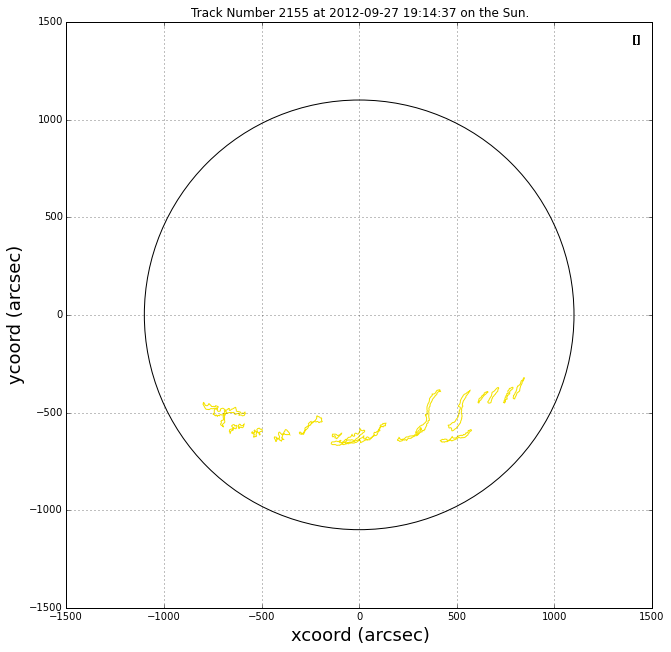

2012-09-16 07:08:01
2012-09-16 19:25:16
2012-09-17 08:53:01
2012-09-18 06:11:55
2012-09-19 18:20:18
2012-09-20 06:15:51
2012-09-20 19:11:26
2012-09-21 07:19:21
2012-09-21 17:52:34
2012-09-22 06:15:16


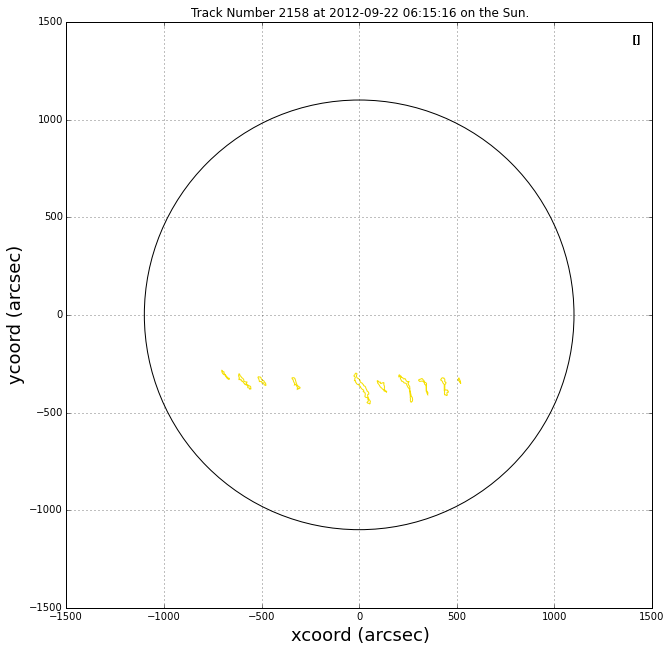

2012-09-16 19:25:16
2012-09-17 19:08:37
2012-09-18 06:11:55
2012-09-18 19:19:07
2012-09-19 18:20:18
2012-09-20 19:11:26


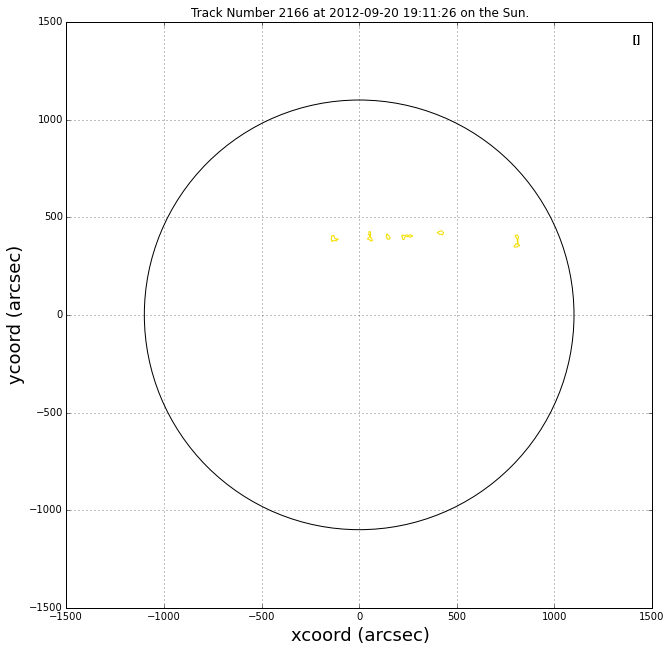

2012-09-17 19:08:37
2012-09-18 19:19:07
2012-09-19 18:20:18
2012-09-20 06:15:51
2012-09-21 07:19:21
2012-09-21 17:52:34
2012-09-22 06:15:16
2012-09-23 19:14:03
2012-09-24 18:15:47


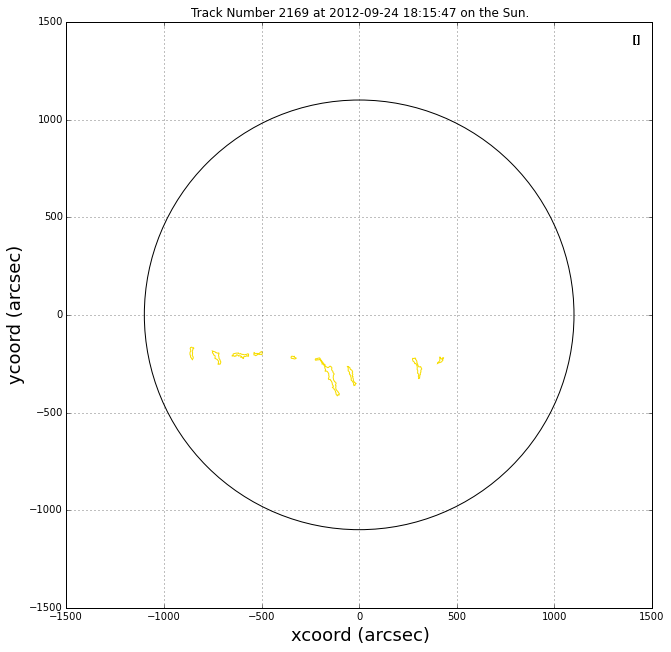

2012-09-19 18:20:18
2012-09-20 06:15:51
2012-09-20 19:11:26
2012-09-21 07:19:21
2012-09-21 17:52:34
2012-09-22 06:15:16
2012-09-23 10:58:52
2012-09-23 19:14:03
2012-09-24 18:15:47
2012-09-25 17:30:58
2012-09-26 17:24:17
2012-09-27 19:14:37
2012-09-28 17:47:02


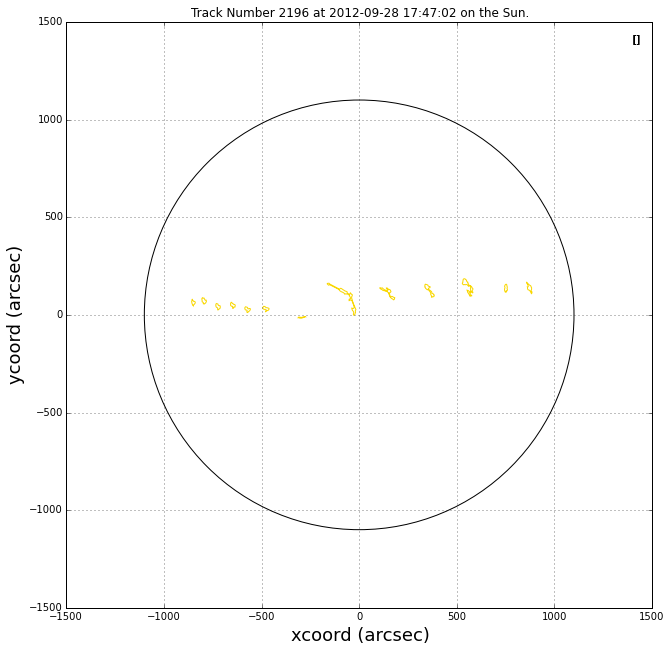

2012-09-19 18:20:18
2012-09-20 06:15:51
2012-09-21 07:19:21
2012-09-21 17:52:34
2012-09-22 06:15:16
2012-09-24 06:14:30
2012-09-24 18:15:47


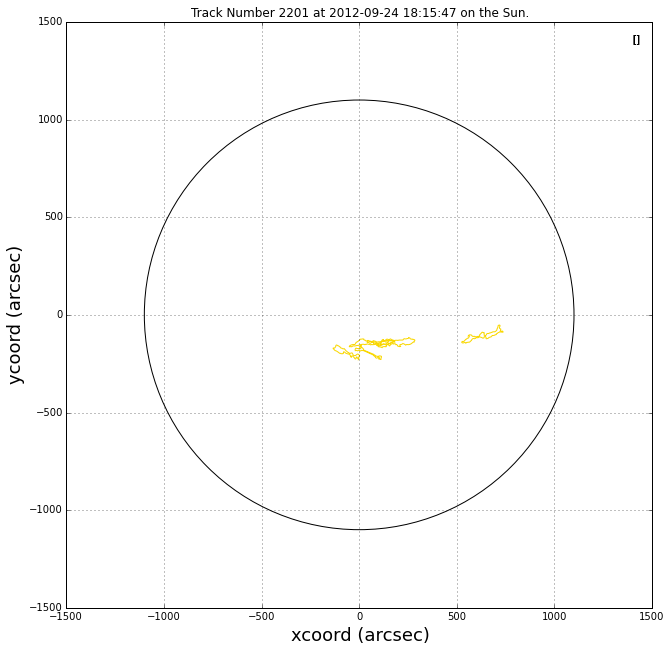

2012-09-21 17:52:34
2012-09-24 06:14:30
2012-09-24 18:15:47
2012-09-25 06:46:50
2012-09-25 17:30:58
2012-09-26 08:26:21
2012-09-26 17:24:17
2012-09-27 09:38:48
2012-09-27 19:14:37


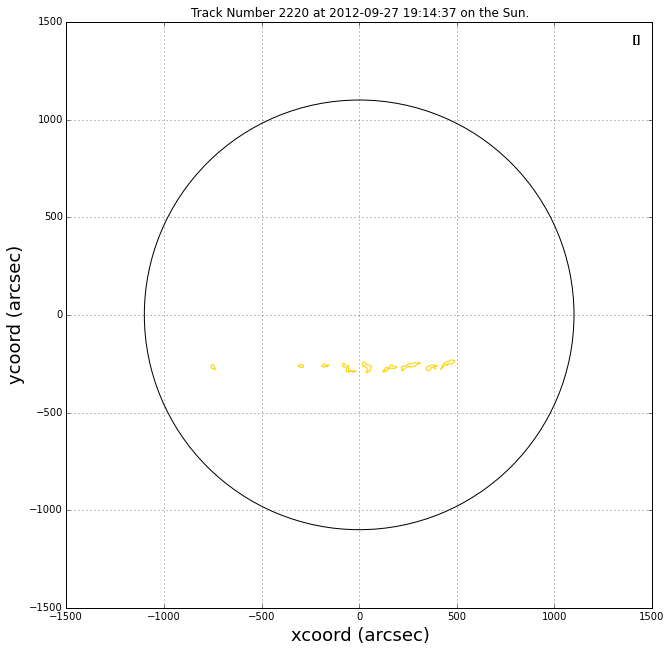

2012-09-23 10:58:52
2012-09-23 19:14:03
2012-09-24 06:14:30
2012-09-24 18:15:47
2012-09-25 06:46:50
2012-09-25 17:30:58
2012-09-26 17:24:17
2012-09-27 19:14:37
2012-09-28 06:05:07


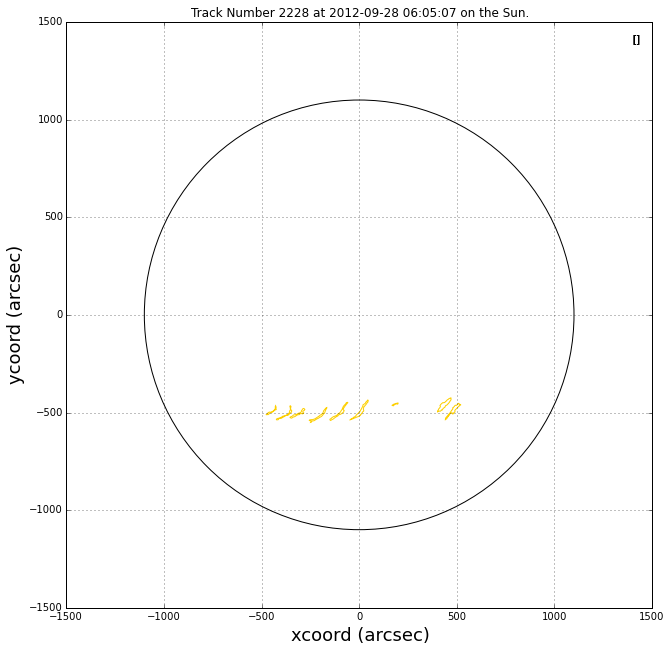

2012-09-23 10:58:52
2012-09-24 06:14:30
2012-09-25 06:46:50
2012-09-25 17:30:58
2012-09-26 08:26:21
2012-09-26 17:24:17


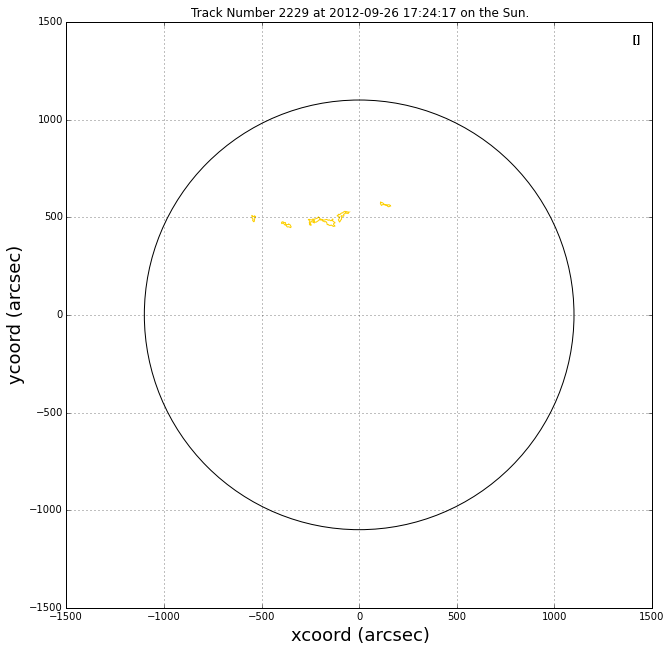

2012-09-23 10:58:52
2012-09-23 19:14:03
2012-09-25 06:46:50
2012-09-25 17:30:58
2012-09-26 08:26:21
2012-09-26 17:24:17
2012-09-27 19:14:37
2012-09-28 17:47:02


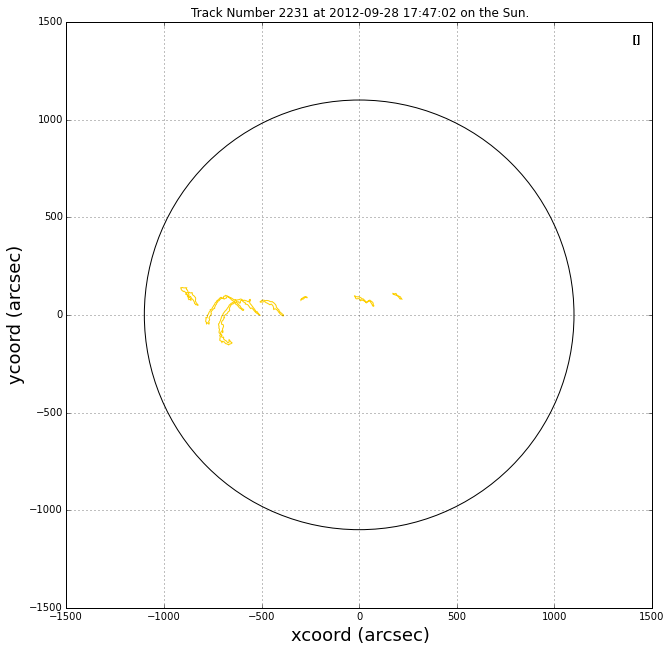

2012-09-23 10:58:52
2012-09-24 06:14:30
2012-09-25 06:46:50
2012-09-26 08:26:21
2012-09-27 19:14:37
2012-09-28 17:47:02
2012-09-29 18:04:42


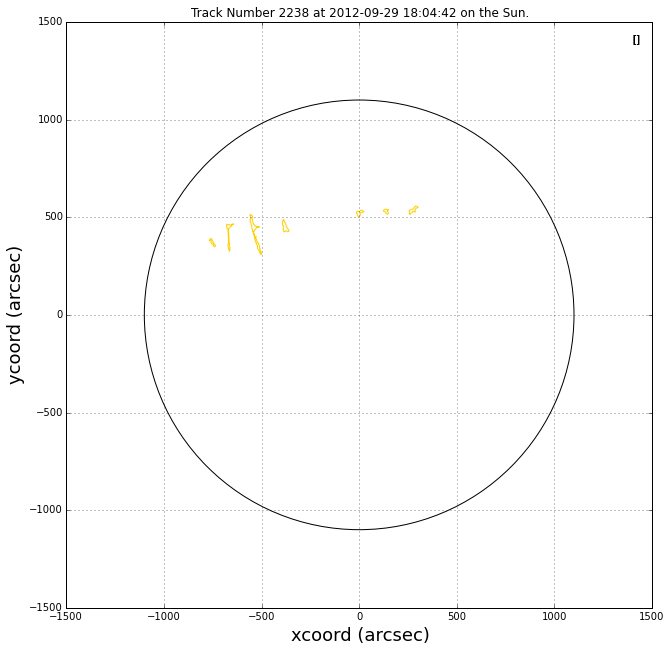

2012-09-23 19:14:03
2012-09-24 06:14:30
2012-09-24 18:15:47
2012-09-25 06:46:50
2012-09-25 17:30:58
2012-09-26 17:24:17
2012-09-27 09:38:48
2012-09-27 19:14:37
2012-09-29 18:04:42


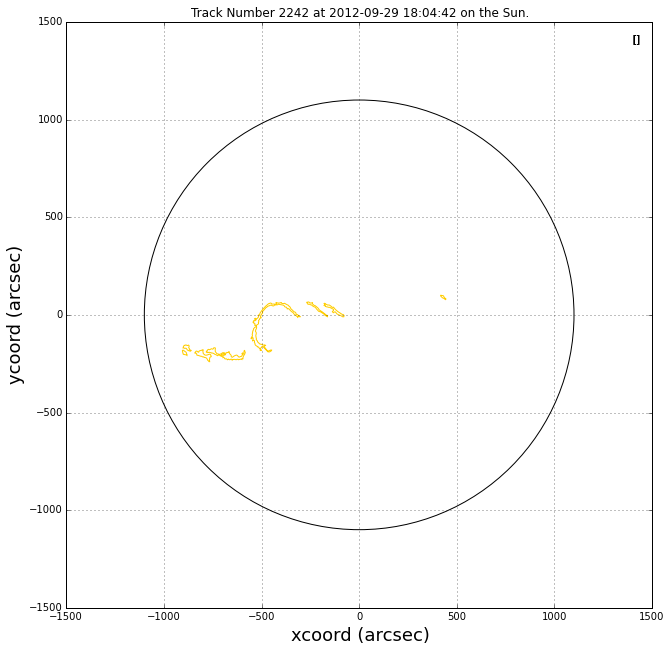

2012-09-23 19:14:03
2012-09-24 06:14:30
2012-09-24 18:15:47
2012-09-25 17:30:58
2012-09-26 08:26:21
2012-09-26 17:24:17
2012-09-27 09:38:48


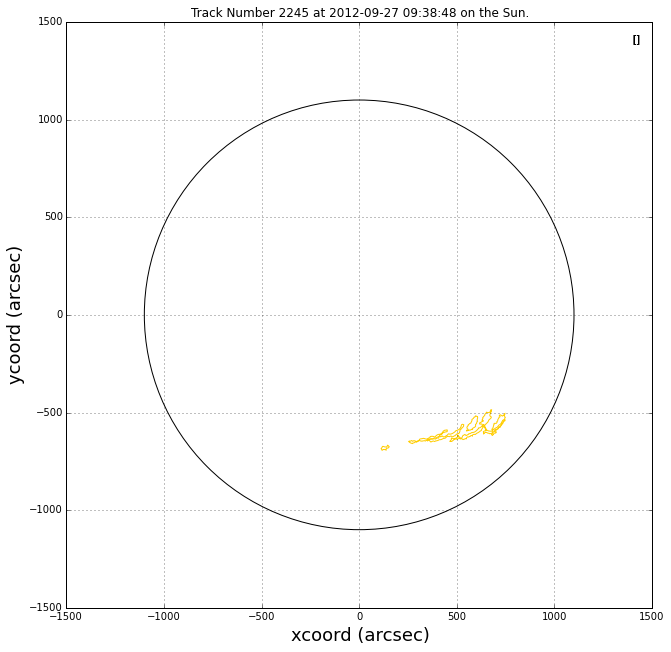

2012-09-23 19:14:03
2012-09-24 18:15:47
2012-09-27 19:14:37
2012-09-28 17:47:02
2012-09-29 07:13:33
2012-09-29 18:04:42
2012-09-30 18:48:42


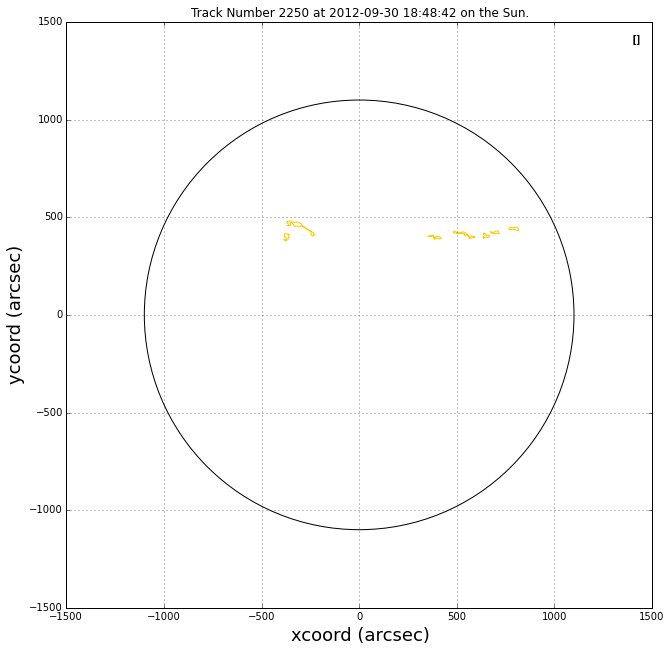

2012-09-23 19:14:03
2012-09-24 06:14:30
2012-09-24 18:15:47
2012-09-25 06:46:50
2012-09-25 17:30:58
2012-09-26 17:24:17
2012-09-27 09:38:48
2012-09-28 06:05:07
2012-09-29 07:13:33
2012-09-29 18:04:42
2012-09-30 18:48:42
2012-10-01 10:25:08
2012-10-01 18:03:16


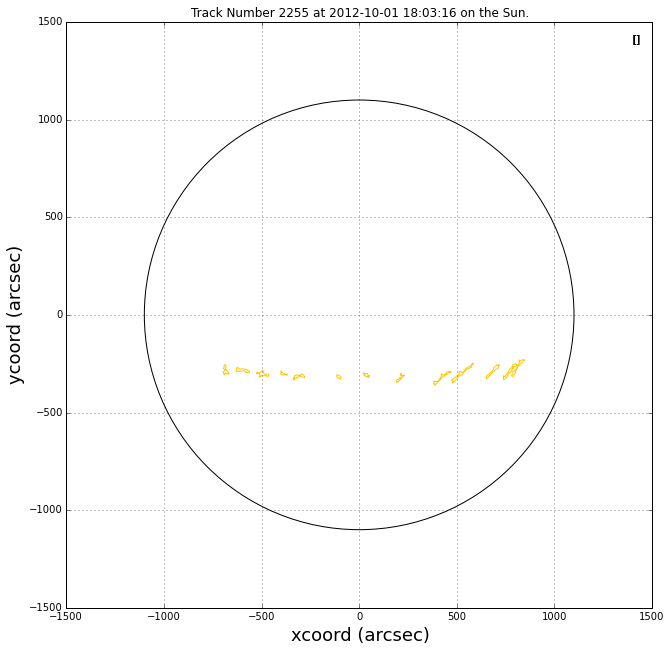

2012-09-24 18:15:47
2012-09-25 06:46:50
2012-09-26 08:26:21
2012-09-26 17:24:17
2012-09-27 09:38:48
2012-09-27 19:14:37
2012-09-28 06:05:07


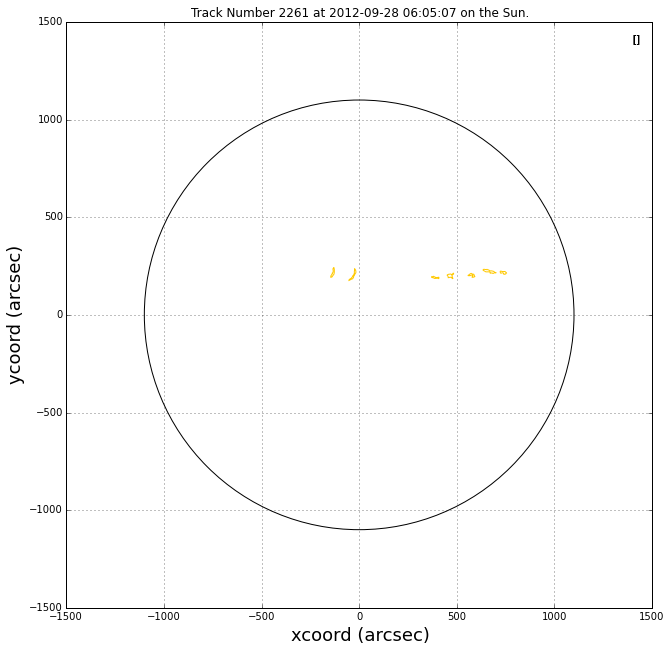

2012-09-26 17:24:17
2012-09-27 09:38:48
2012-09-27 19:14:37
2012-09-28 06:05:07
2012-09-28 17:47:02
2012-09-30 18:48:42
2012-10-01 10:25:08
2012-10-02 18:24:05
2012-10-03 17:21:17
2012-10-04 17:29:53
2012-10-05 16:09:26
2012-10-06 06:19:16
2012-10-07 05:54:18


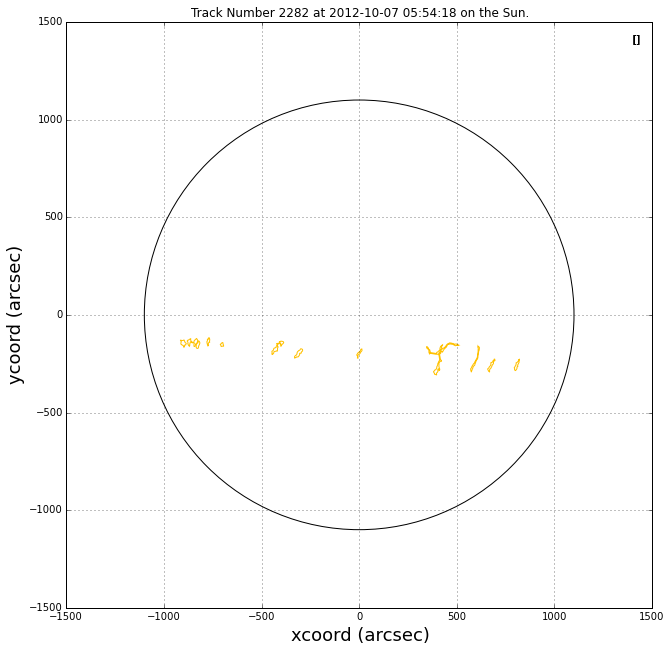

2012-09-28 17:47:02
2012-09-29 18:04:42
2012-10-01 18:03:16
2012-10-02 18:24:05
2012-10-03 06:04:45
2012-10-03 17:21:17


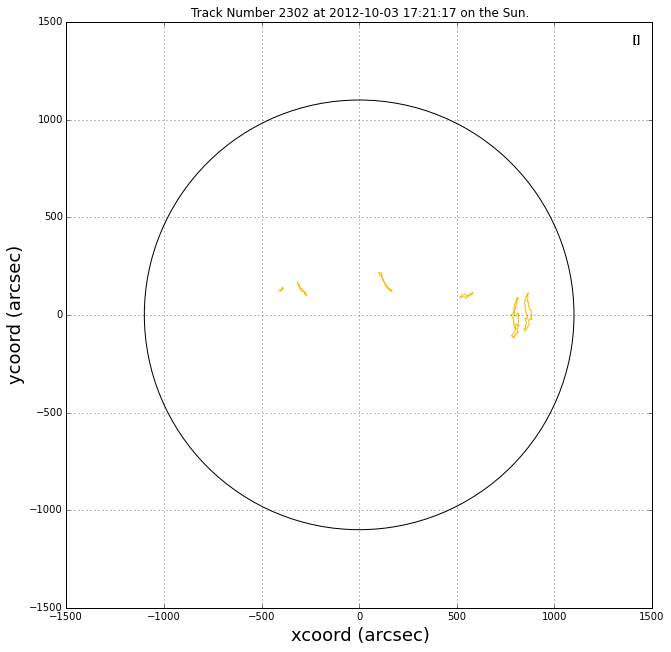

2012-09-28 17:47:02
2012-09-29 18:04:42
2012-09-30 18:48:42
2012-10-03 06:04:45
2012-10-03 17:21:17
2012-10-04 06:18:52
2012-10-05 08:59:54
2012-10-07 05:54:18


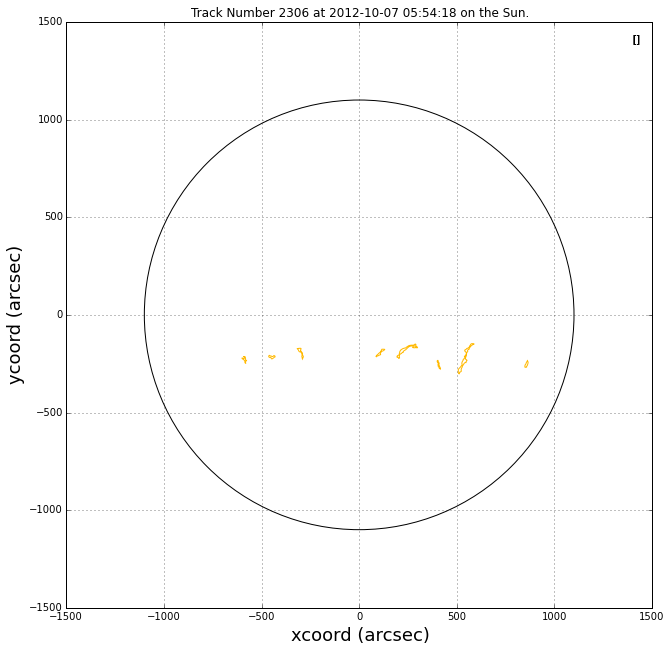

2012-09-29 07:13:33
2012-09-29 18:04:42
2012-09-30 18:48:42
2012-10-01 18:03:16
2012-10-02 18:24:05
2012-10-03 17:21:17


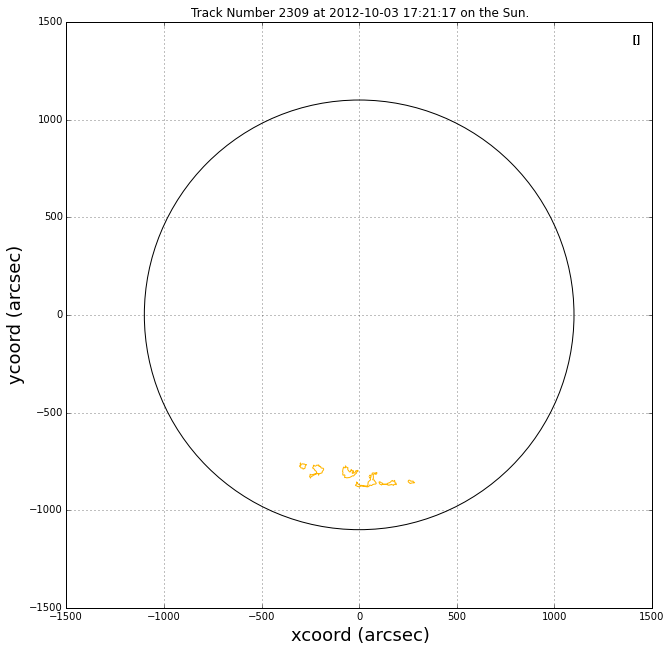

2012-09-29 07:13:33
2012-09-30 18:48:42
2012-10-01 10:25:08
2012-10-01 18:03:16
2012-10-02 18:24:05
2012-10-03 06:04:45
2012-10-03 17:21:17
2012-10-04 17:29:53


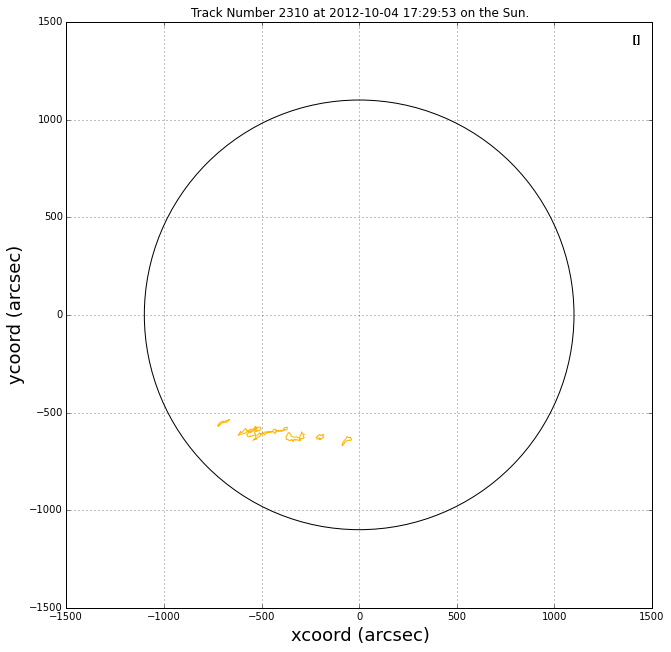

2012-10-01 18:03:16
2012-10-02 18:24:05
2012-10-03 06:04:45
2012-10-03 17:21:17
2012-10-04 06:18:52
2012-10-06 06:19:16


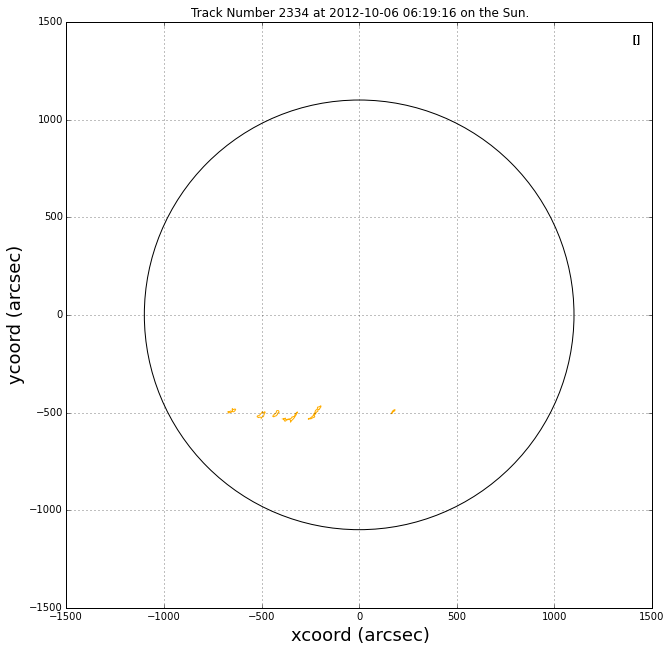

2012-10-01 18:03:16
2012-10-03 06:04:45
2012-10-03 17:21:17
2012-10-04 06:18:52
2012-10-05 08:59:54
2012-10-09 17:24:54


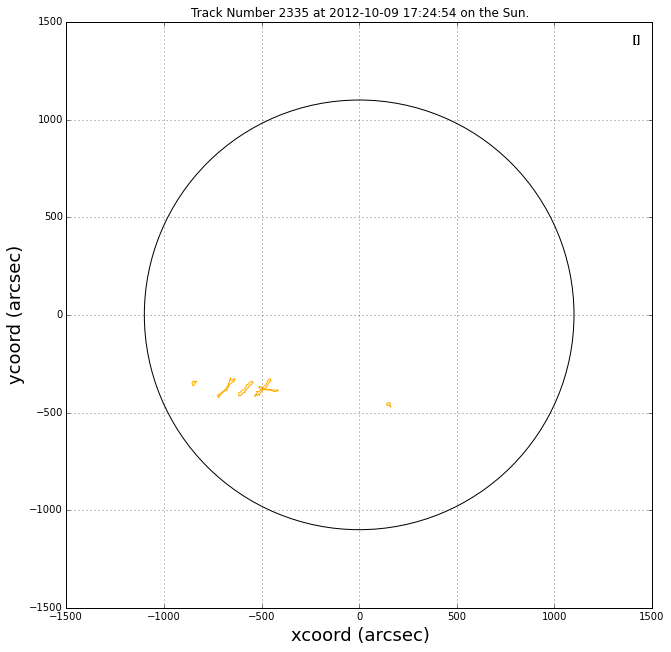

2012-10-02 18:24:05
2012-10-03 06:04:45
2012-10-03 17:21:17
2012-10-04 06:18:52
2012-10-04 17:29:53
2012-10-05 08:59:54


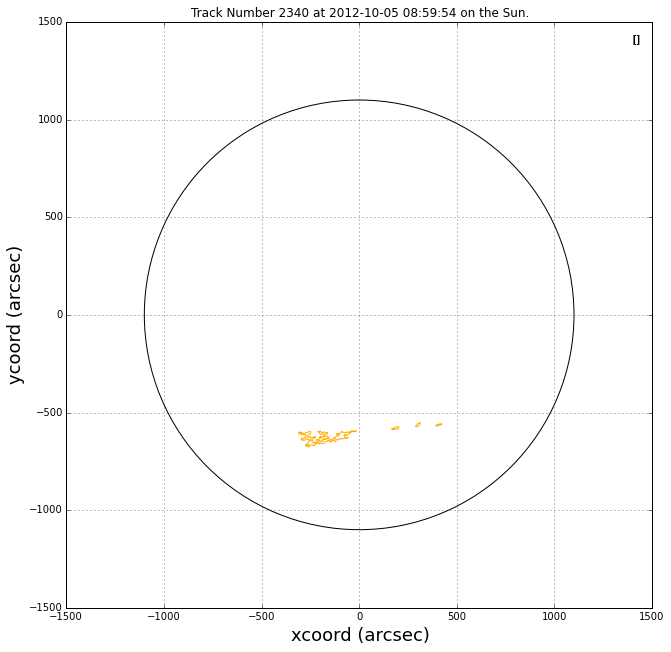

2012-10-02 18:24:05
2012-10-03 06:04:45
2012-10-03 17:21:17
2012-10-04 17:29:53
2012-10-05 08:59:54
2012-10-06 06:19:16
2012-10-07 05:54:18


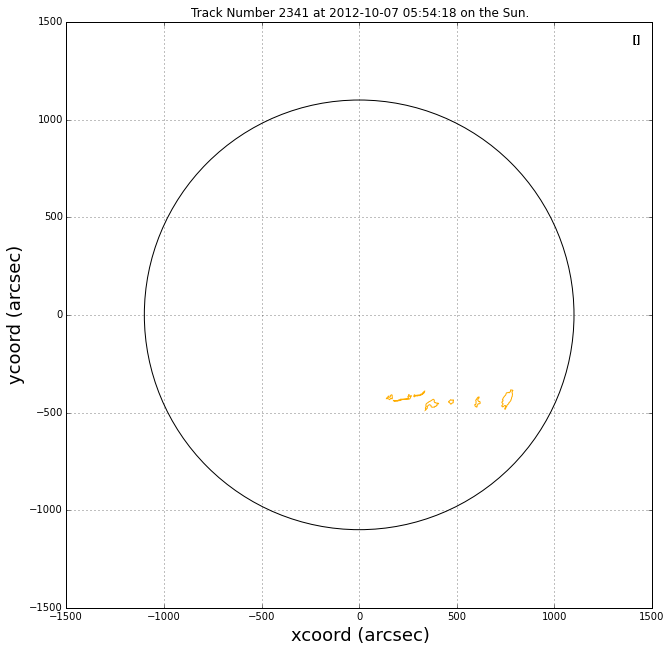

2012-10-02 18:24:05
2012-10-03 06:04:45
2012-10-03 17:21:17
2012-10-04 06:18:52
2012-10-04 17:29:53
2012-10-05 16:09:26
2012-10-06 06:19:16
2012-10-07 05:54:18
2012-10-08 06:44:55
2012-10-08 17:40:34


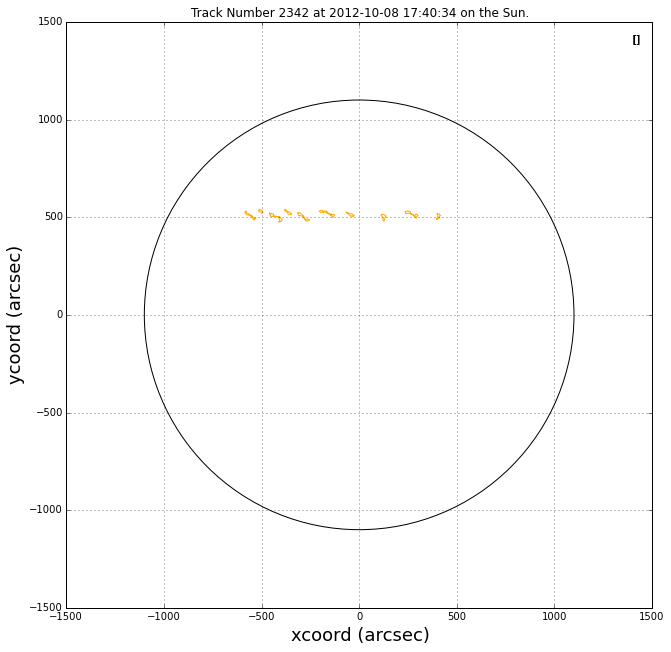

2012-10-04 17:29:53
2012-10-05 16:09:26
2012-10-06 06:19:16
2012-10-07 05:54:18
2012-10-08 17:40:34
2012-10-09 07:41:16


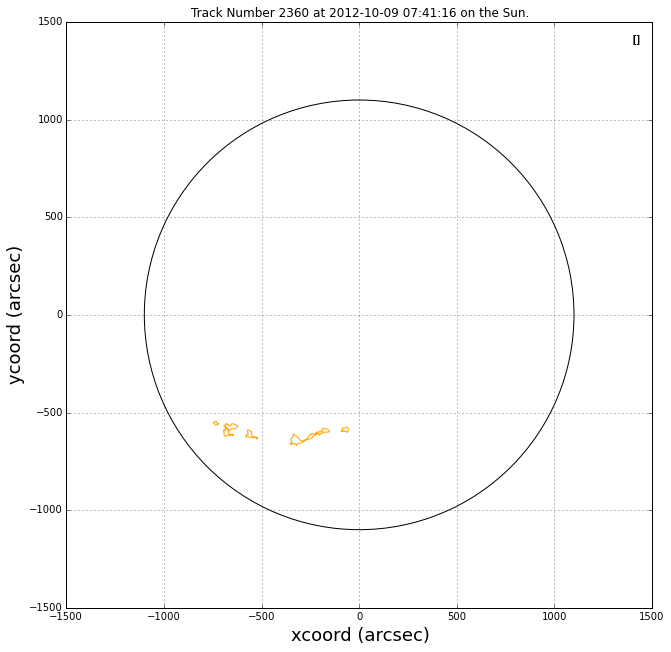

2012-10-08 17:40:34
2012-10-09 07:41:16
2012-10-09 17:24:54
2012-10-12 12:10:52
2012-10-14 06:30:05
2012-10-15 18:42:28
2012-10-16 17:56:27
2012-10-17 07:07:23


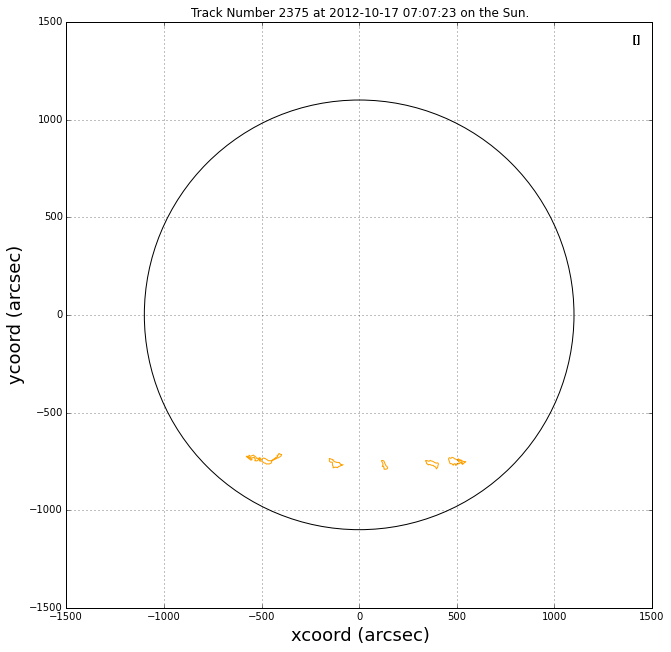

2012-10-12 12:10:52
2012-10-14 06:30:05
2012-10-15 18:42:28
2012-10-16 17:56:27
2012-10-17 07:07:23
2012-10-17 18:17:24
2012-10-18 07:16:06


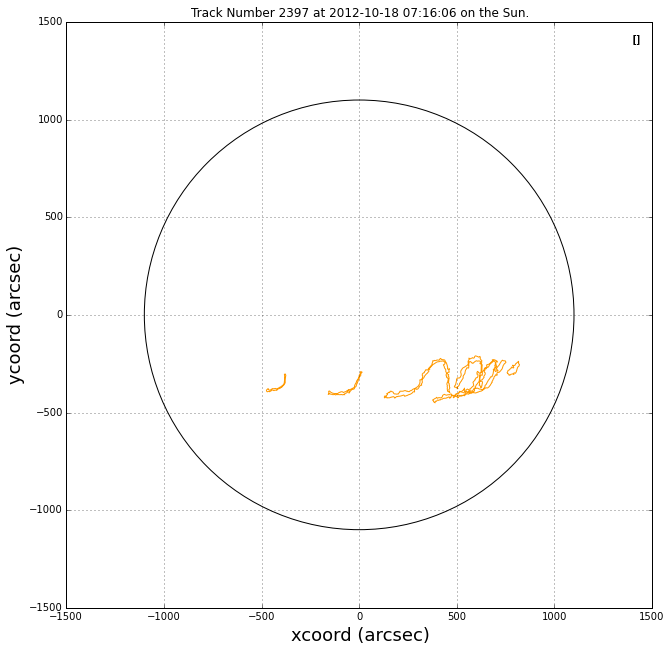

2012-10-14 06:30:05
2012-10-15 18:42:28
2012-10-16 17:56:27
2012-10-17 07:07:23
2012-10-17 18:17:24
2012-10-18 18:03:07


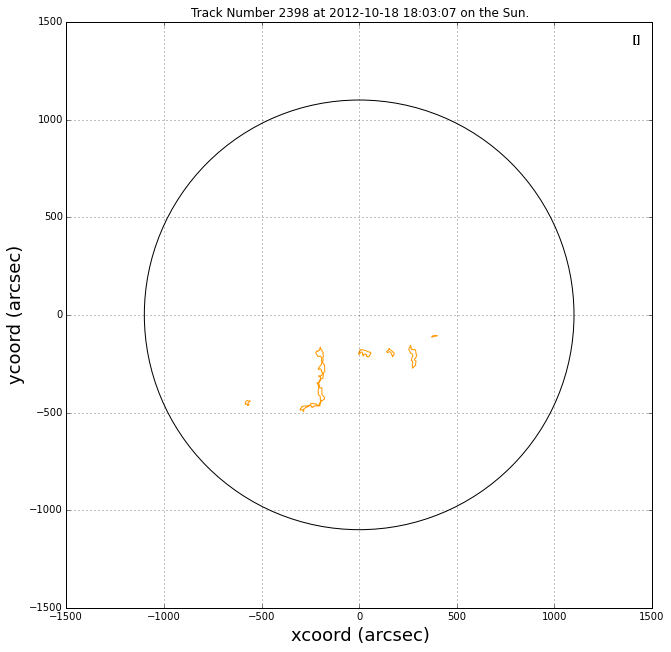

2012-10-15 18:42:28
2012-10-16 17:56:27
2012-10-17 07:07:23
2012-10-17 18:17:24
2012-10-18 07:16:06
2012-10-19 18:05:16


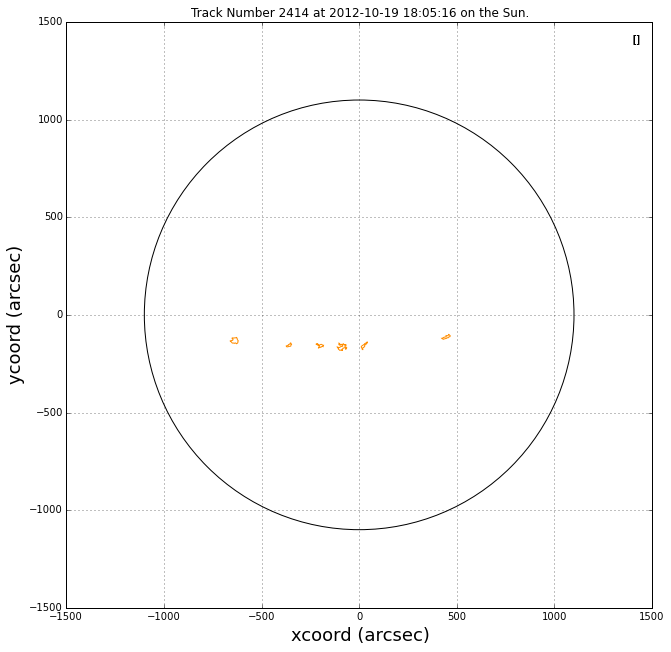

2012-10-16 17:56:27
2012-10-17 18:17:24
2012-10-18 18:03:07
2012-10-19 07:09:50
2012-10-19 18:05:16
2012-10-20 08:06:39


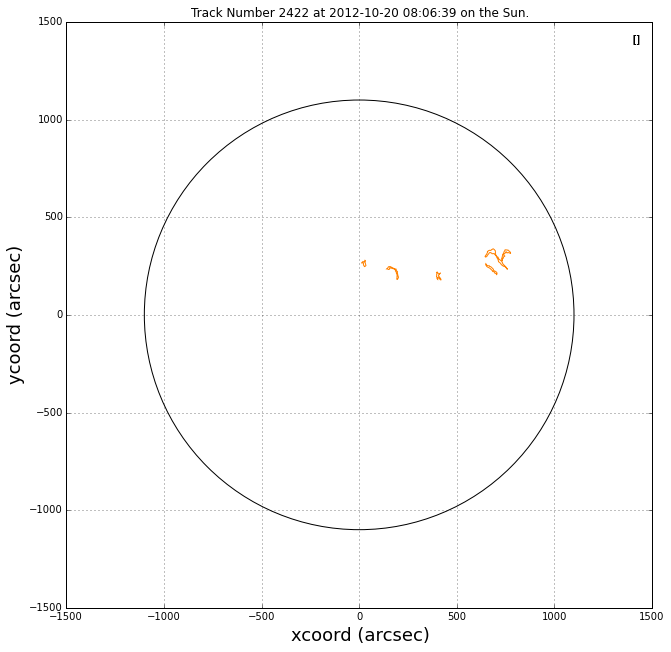

2012-10-16 17:56:27
2012-10-17 07:07:23
2012-10-17 18:17:24
2012-10-18 07:16:06
2012-10-18 18:03:07
2012-10-19 07:09:50
2012-10-19 18:05:16
2012-10-20 08:06:39
2012-10-21 06:41:30
2012-10-22 17:41:45
2012-10-23 07:10:43


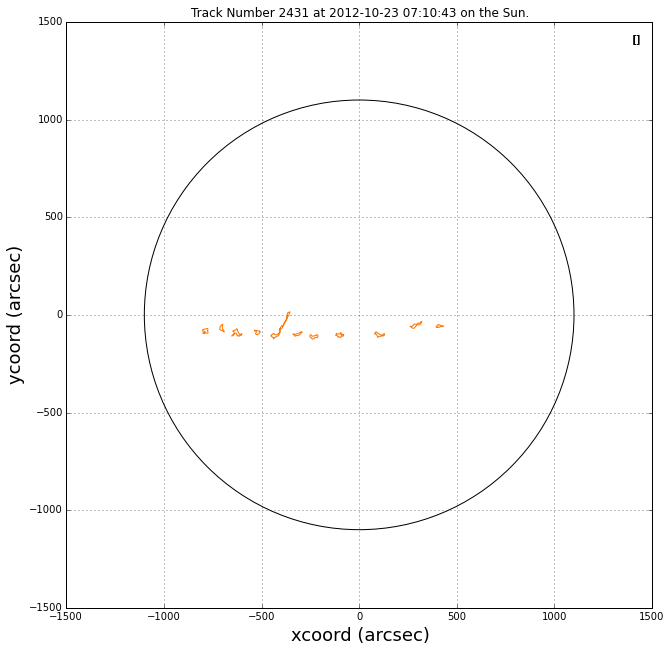

2012-10-17 18:17:24
2012-10-18 07:16:06
2012-10-18 18:03:07
2012-10-19 07:09:50
2012-10-19 18:05:16
2012-10-22 07:03:53
2012-10-22 17:41:45
2012-10-23 17:56:07


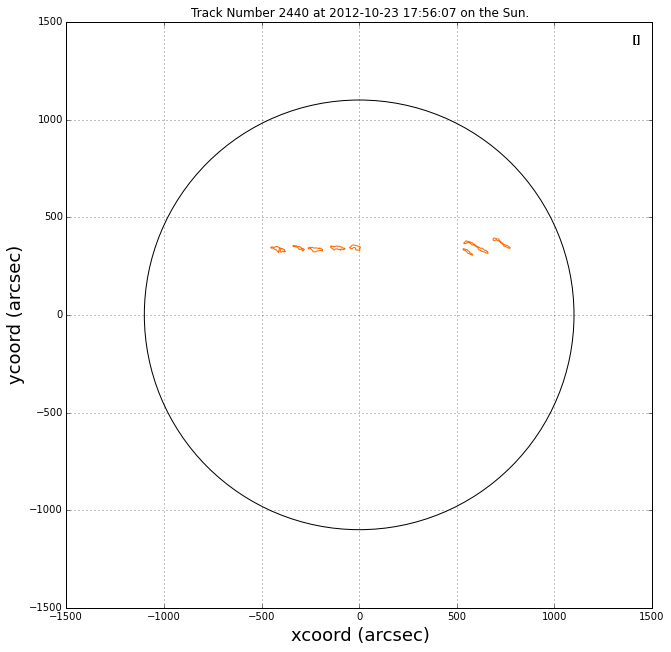

2012-10-18 18:03:07
2012-10-19 07:09:50
2012-10-19 18:05:16
2012-10-20 08:06:39
2012-10-22 07:03:53
2012-10-23 07:10:43


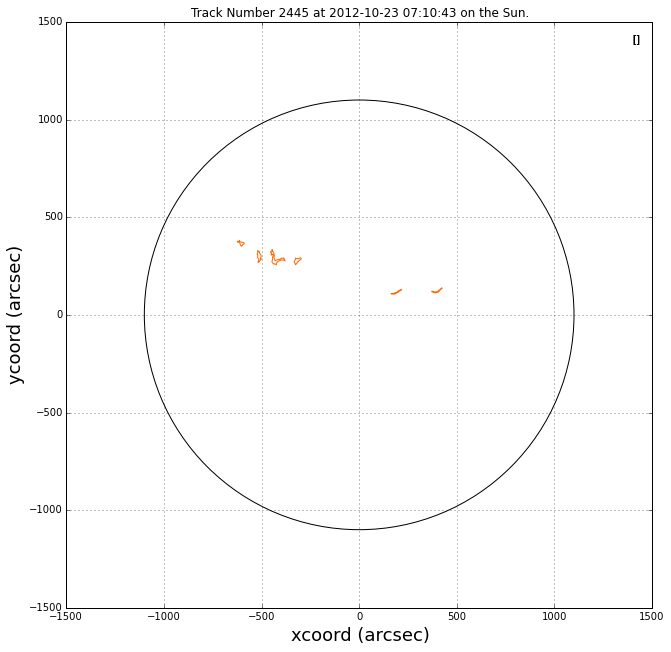

2012-10-21 06:41:30
2012-10-22 07:03:53
2012-10-22 17:41:45
2012-10-23 07:10:43
2012-10-23 17:56:07
2012-10-24 07:28:23
2012-10-25 06:46:50
2012-10-25 18:25:16
2012-10-26 18:09:57
2012-10-27 20:04:42
2012-10-29 18:05:56


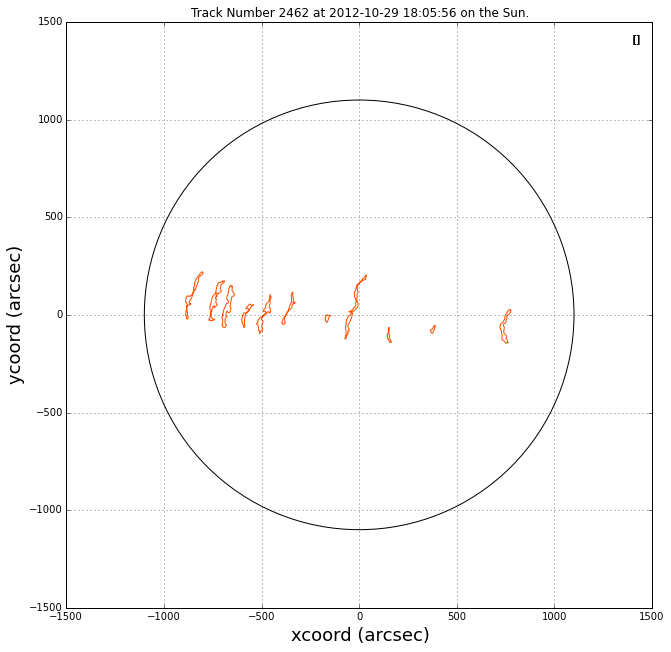

2012-10-21 06:41:30
2012-10-22 07:03:53
2012-10-22 17:41:45
2012-10-23 07:10:43
2012-10-23 17:56:07
2012-10-24 07:28:23
2012-10-25 06:46:50
2012-10-25 18:25:16
2012-10-26 06:57:26
2012-10-26 18:09:57
2012-10-27 20:04:42
2012-10-29 12:57:47
2012-10-29 18:05:56
2012-10-30 09:34:49
2012-10-31 07:33:54
2012-11-01 16:59:26


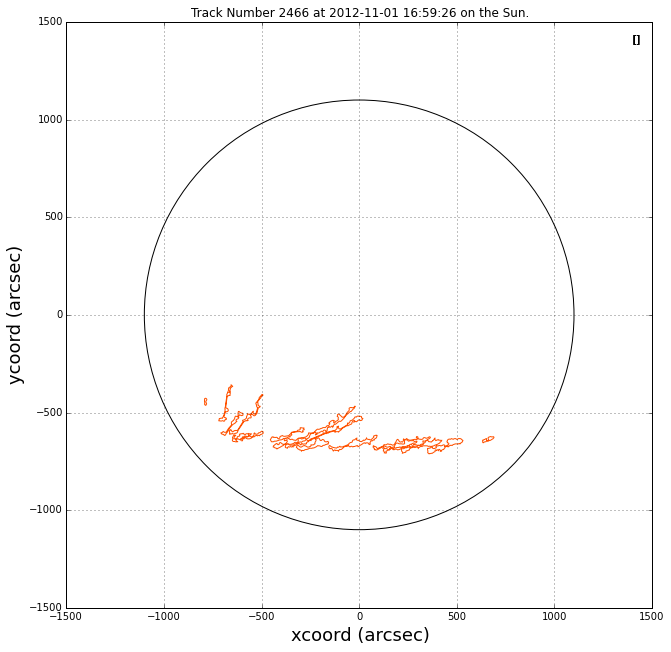

2012-10-22 07:03:53
2012-10-22 17:41:45
2012-10-23 07:10:43
2012-10-24 07:28:23
2012-10-24 17:23:16
2012-10-25 18:25:16


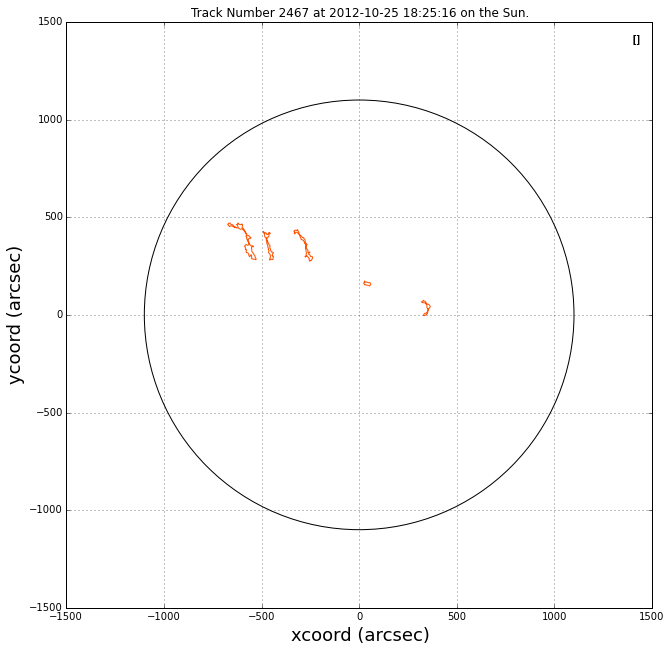

2012-10-22 07:03:53
2012-10-25 06:46:50
2012-10-25 18:25:16
2012-10-26 06:57:26
2012-10-26 18:09:57
2012-10-27 20:04:42
2012-10-29 12:57:47


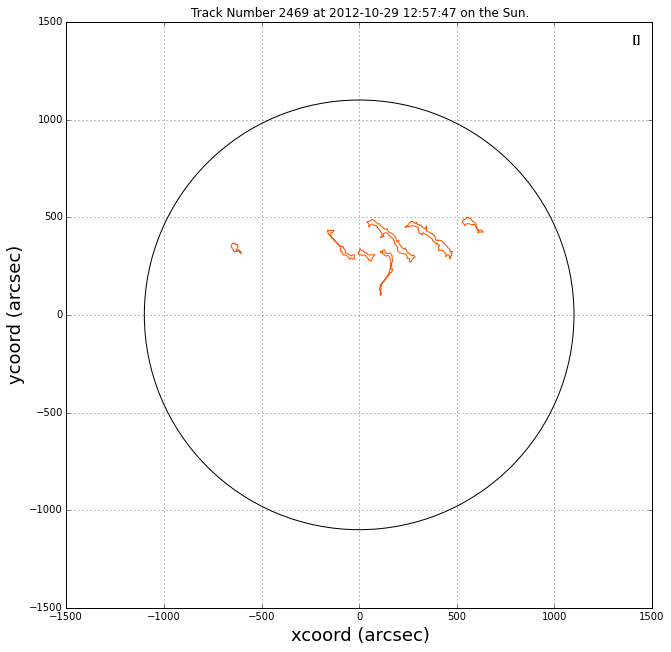

2012-10-22 07:03:53
2012-10-23 07:10:43
2012-10-24 07:28:23
2012-10-24 17:23:16
2012-10-25 06:46:50
2012-10-26 06:57:26
2012-10-26 18:09:57
2012-10-27 20:04:42


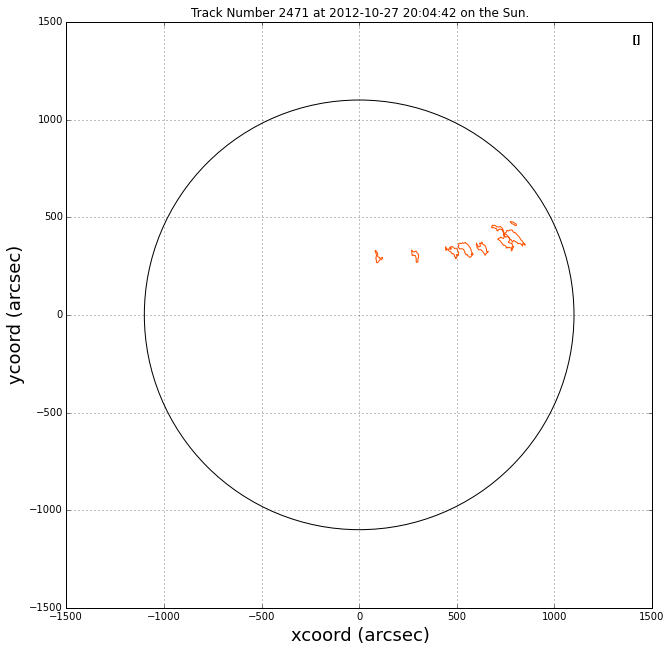

2012-10-22 07:03:53
2012-10-22 17:41:45
2012-10-23 07:10:43
2012-10-24 07:28:23
2012-10-24 17:23:16
2012-10-25 18:25:16


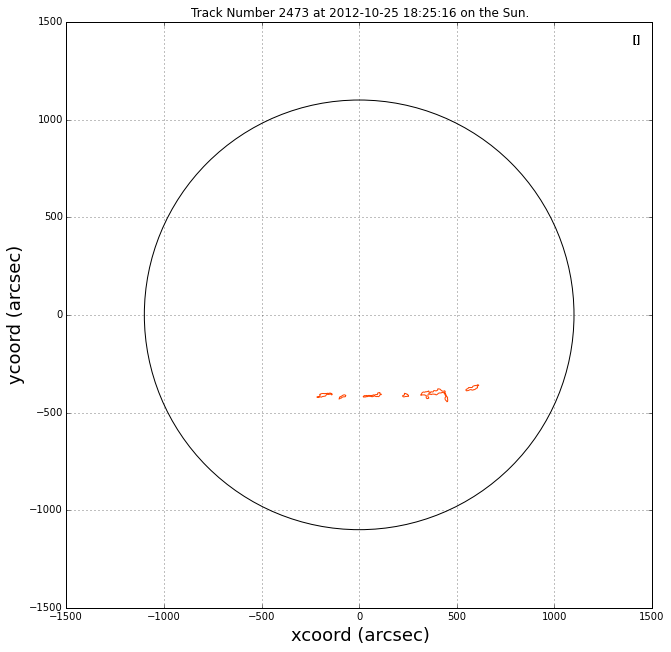

2012-10-22 07:03:53
2012-10-23 07:10:43
2012-10-23 17:56:07
2012-10-24 07:28:23
2012-10-24 17:23:16
2012-10-25 06:46:50
2012-10-25 18:25:16
2012-10-26 06:57:26
2012-10-26 18:09:57


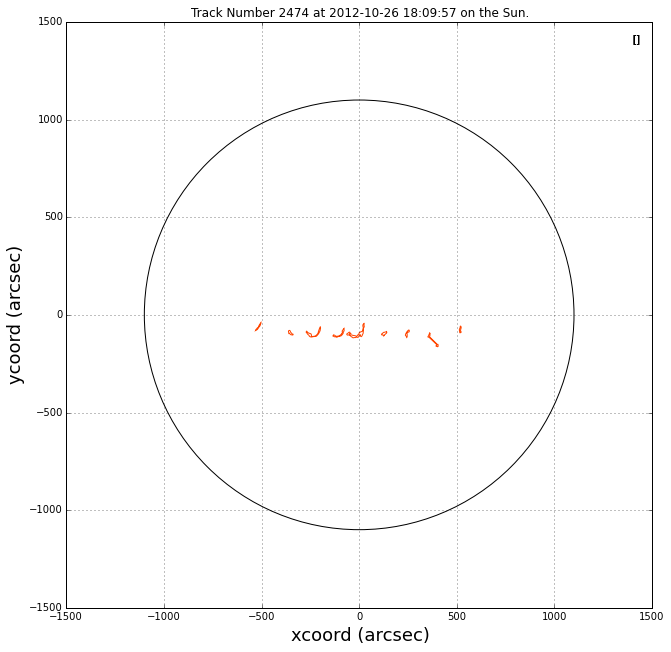

2012-10-23 17:56:07
2012-10-24 17:23:16
2012-10-25 06:46:50
2012-10-26 06:57:26
2012-10-26 18:09:57
2012-10-27 20:04:42


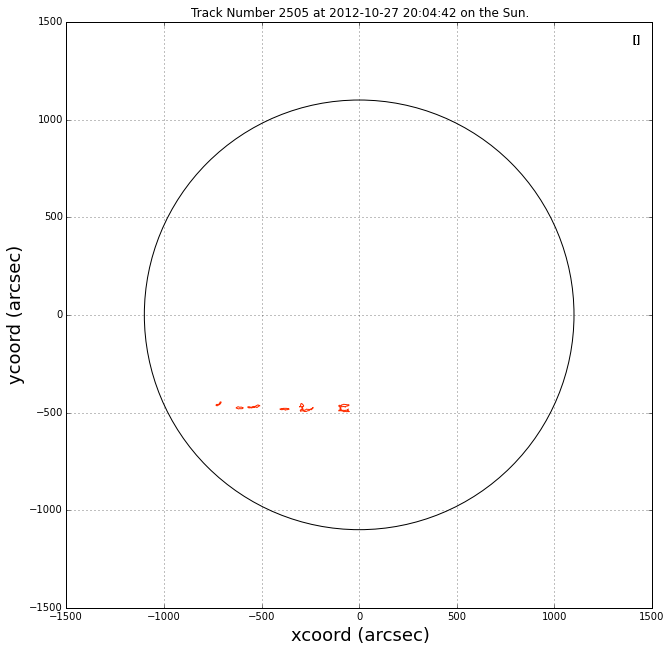

2012-10-24 07:28:23
2012-10-24 17:23:16
2012-10-25 06:46:50
2012-10-25 18:25:16
2012-10-26 06:57:26
2012-10-26 18:09:57
2012-10-27 20:04:42
2012-10-29 12:57:47


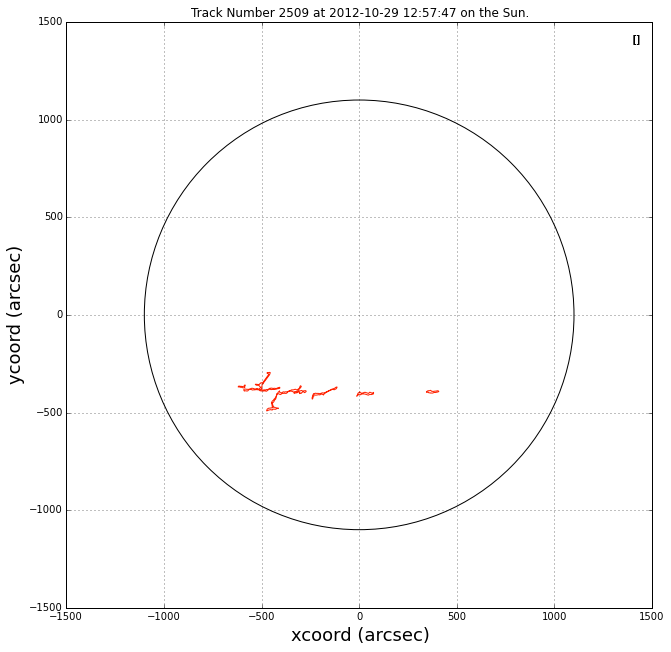

2012-10-25 06:46:50
2012-10-25 18:25:16
2012-10-26 18:09:57
2012-10-27 20:04:42
2012-10-29 18:05:56
2012-10-30 09:34:49


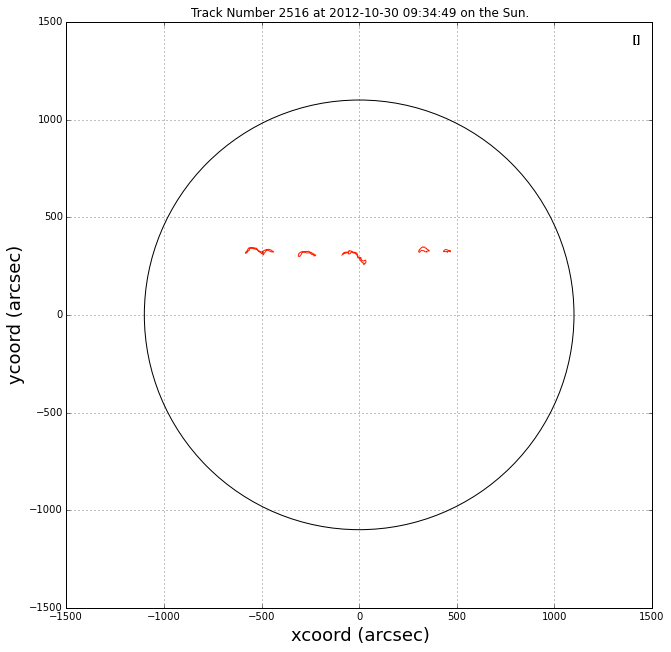

2012-10-25 06:46:50
2012-10-25 18:25:16
2012-10-26 06:57:26
2012-10-26 18:09:57
2012-10-27 20:04:42
2012-10-29 18:05:56
2012-10-30 09:34:49
2012-10-31 07:33:54
2012-10-31 18:05:14
2012-11-01 12:25:00
2012-11-01 16:59:26
2012-11-02 08:20:23
2012-11-02 19:08:11
2012-11-03 21:38:33


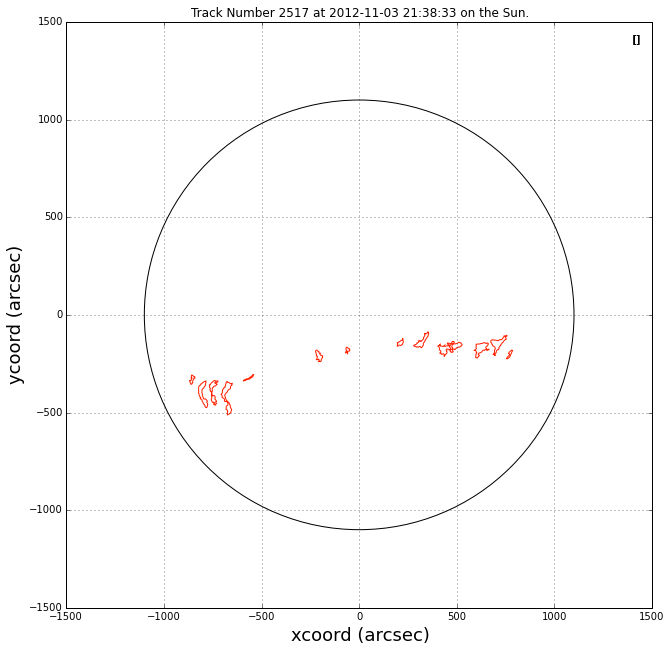

2012-10-25 18:25:16
2012-10-26 06:57:26
2012-10-26 18:09:57
2012-10-27 20:04:42
2012-10-29 18:05:56
2012-10-30 09:34:49


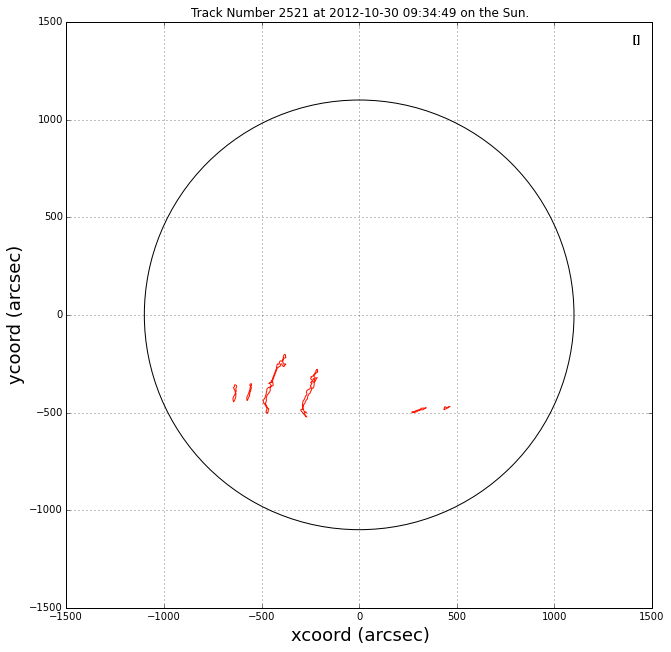

2012-10-26 18:09:57
2012-10-29 12:57:47
2012-10-29 18:05:56
2012-10-30 09:34:49
2012-10-31 07:33:54
2012-10-31 18:05:14
2012-11-02 08:20:23
2012-11-02 19:08:11


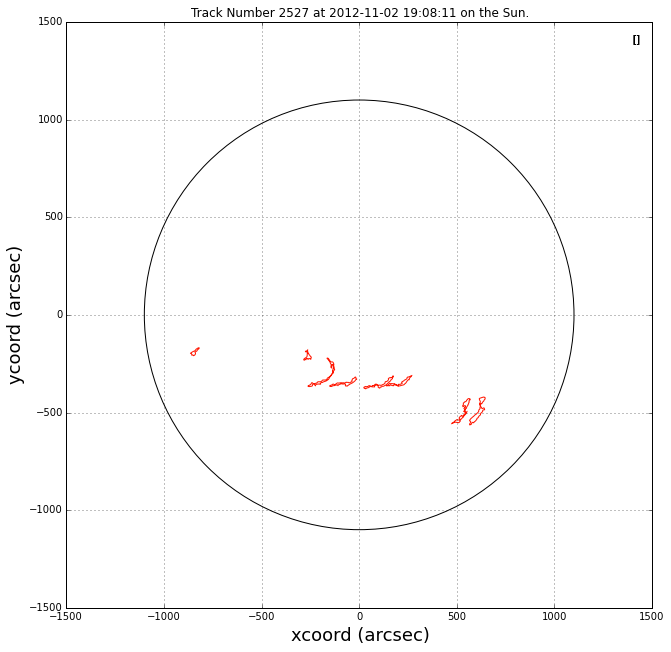

2012-10-26 18:09:57
2012-10-27 20:04:42
2012-10-29 12:57:47
2012-10-31 07:33:54
2012-10-31 18:05:14
2012-11-01 16:59:26
2012-11-02 08:20:23


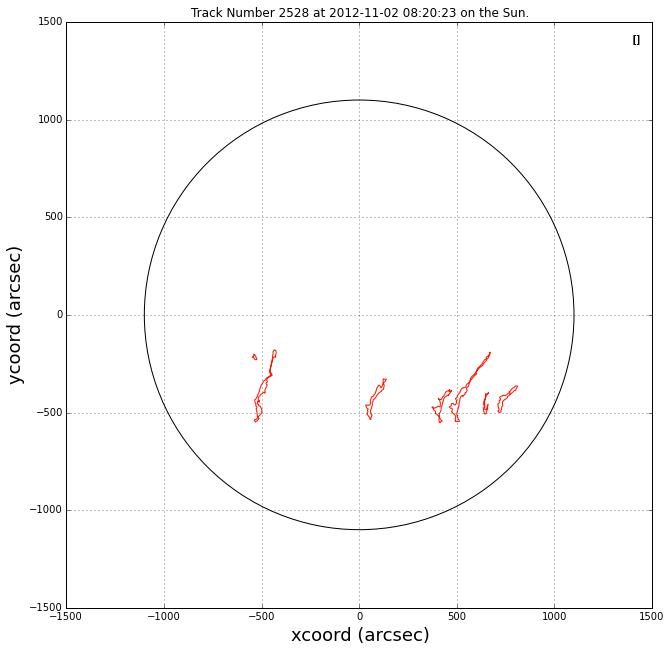

2012-10-26 18:09:57
2012-10-29 12:57:47
2012-10-29 18:05:56
2012-10-30 09:34:49
2012-10-31 07:33:54
2012-10-31 18:05:14


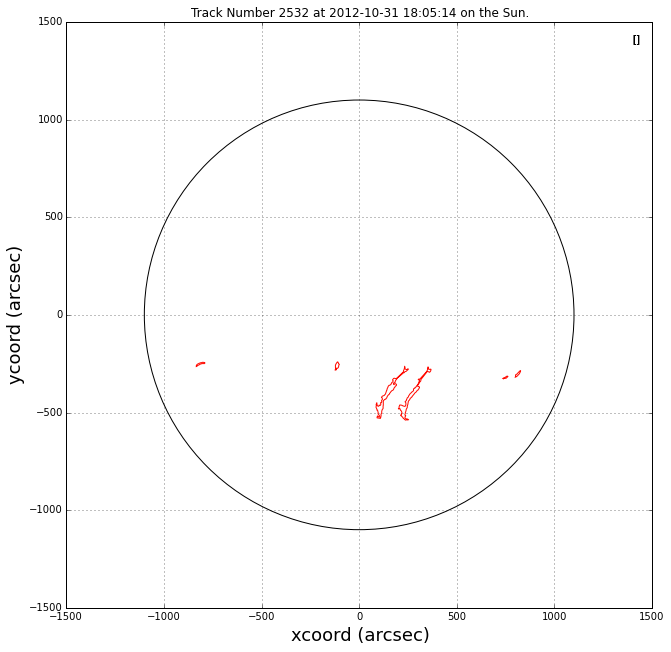

2012-10-29 12:57:47
2012-10-29 18:05:56
2012-10-30 09:34:49
2012-10-31 07:33:54
2012-10-31 18:05:14
2012-11-01 16:59:26
2012-11-02 19:08:11
2012-11-03 21:38:33
2012-11-04 08:52:12
2012-11-05 18:02:56


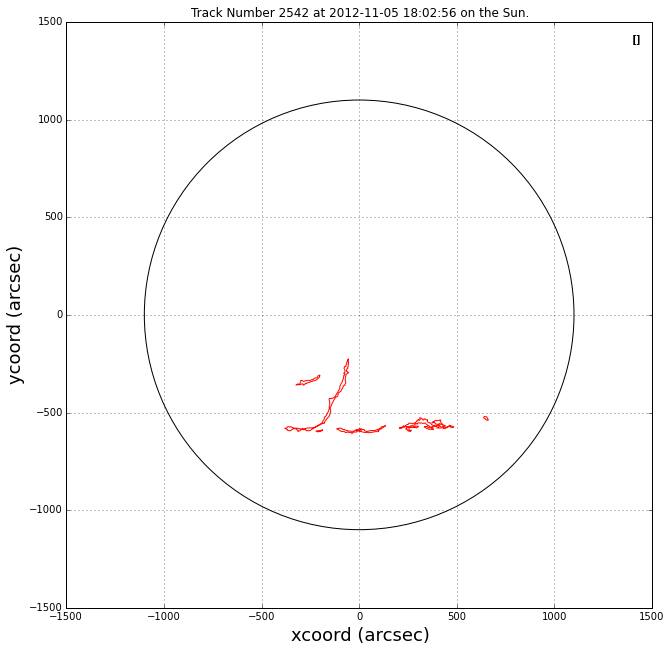

2012-10-29 12:57:47
2012-10-29 18:05:56
2012-10-30 09:34:49
2012-10-31 07:33:54
2012-11-01 16:59:26
2012-11-02 19:08:11
2012-11-03 06:45:59
2012-11-04 08:52:12


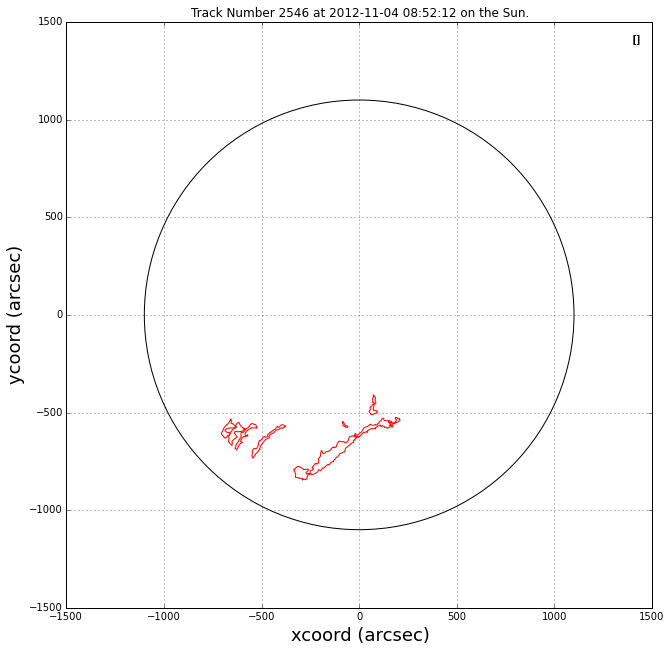

2012-10-31 07:33:54
2012-10-31 18:05:14
2012-11-01 12:25:00
2012-11-02 19:08:11
2012-11-05 18:02:56
2012-11-06 07:34:35


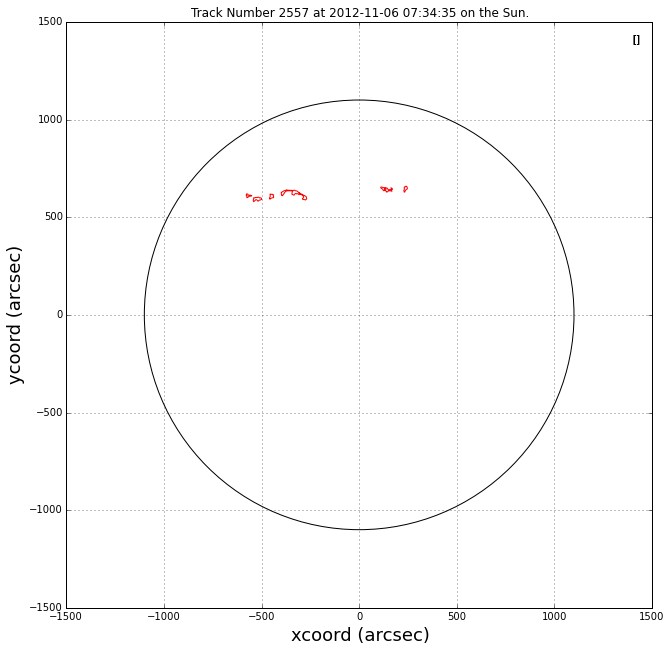

2012-11-01 12:25:00
2012-11-01 16:59:26
2012-11-02 08:20:23
2012-11-03 06:45:59
2012-11-03 21:38:33
2012-11-04 08:52:12
2012-11-05 18:02:56
2012-11-06 07:34:35
2012-11-06 17:39:21
2012-11-07 09:17:03
2012-11-07 18:10:00


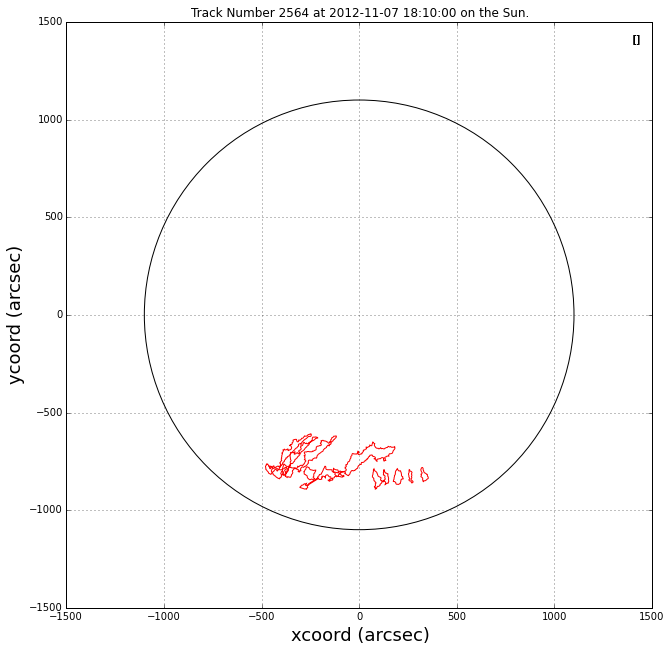

2012-11-02 08:20:23
2012-11-02 19:08:11
2012-11-05 18:02:56
2012-11-07 09:17:03
2012-11-07 18:10:00
2012-11-08 07:21:03
2012-11-09 07:30:35


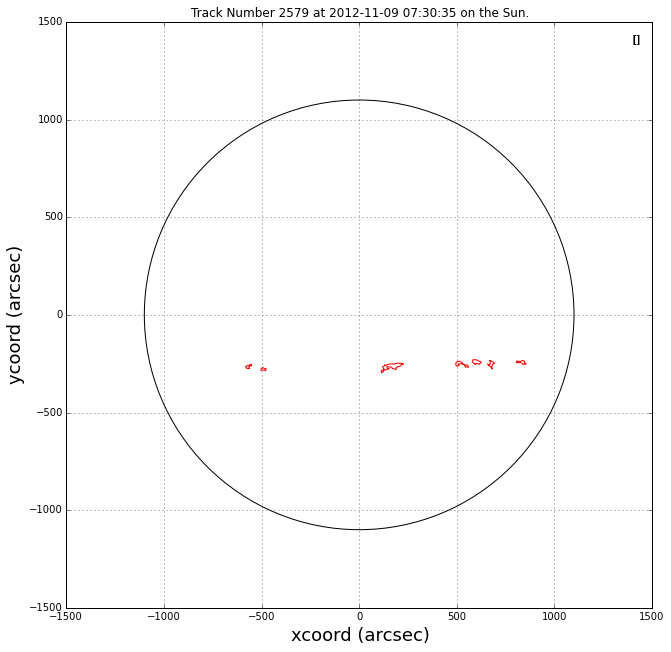

2012-11-05 18:02:56
2012-11-06 07:34:35
2012-11-06 17:39:21
2012-11-07 09:17:03
2012-11-07 18:10:00
2012-11-08 07:21:03
2012-11-09 07:30:35
2012-11-10 08:24:07


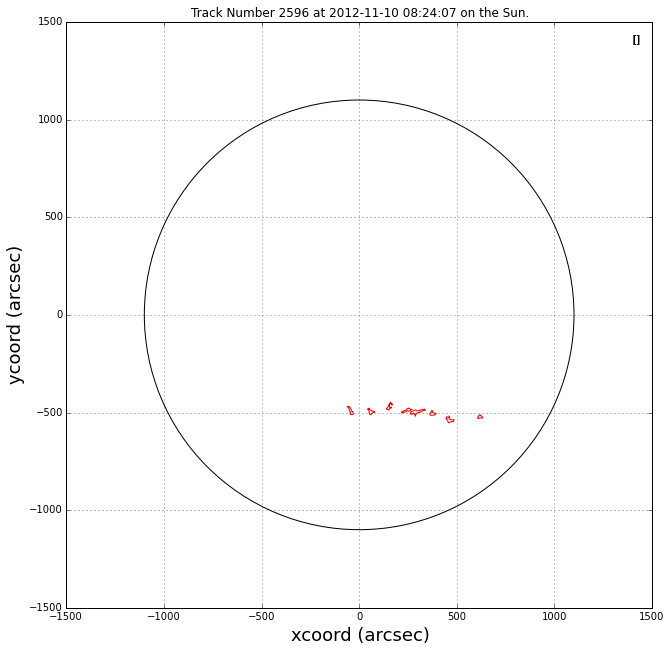

2012-11-05 18:02:56
2012-11-06 07:34:35
2012-11-06 17:39:21
2012-11-07 09:17:03
2012-11-07 18:10:00
2012-11-08 07:21:03
2012-11-09 07:30:35


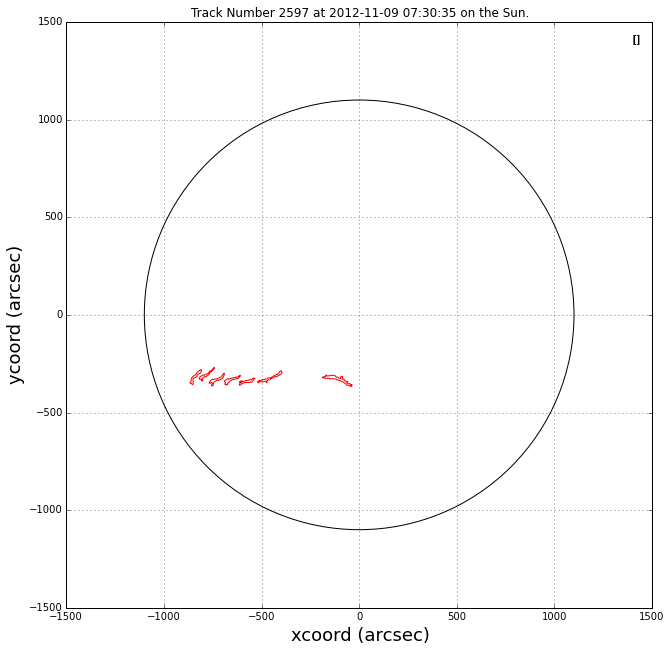

2012-11-05 18:02:56
2012-11-06 07:34:35
2012-11-06 17:39:21
2012-11-07 09:17:03
2012-11-08 07:21:03
2012-11-09 07:30:35
2012-11-10 08:24:07


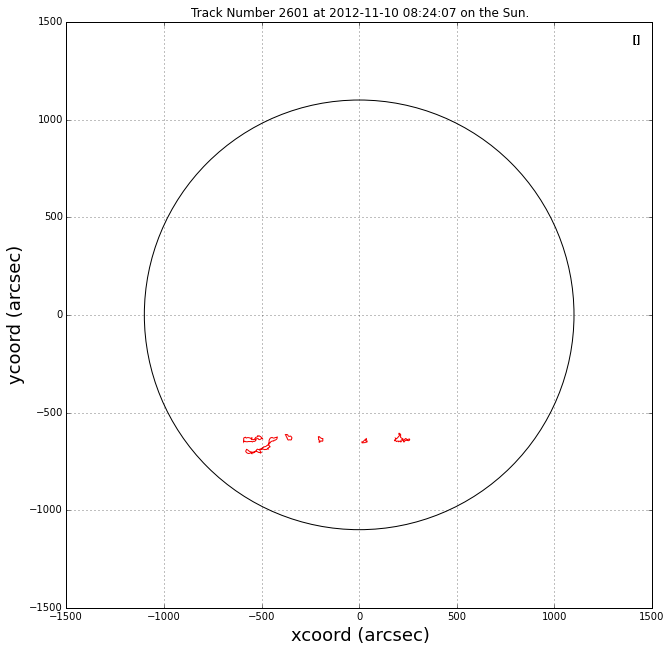

2012-11-06 17:39:21
2012-11-07 09:17:03
2012-11-07 18:10:00
2012-11-08 07:21:03
2012-11-09 07:30:35
2012-11-10 08:24:07


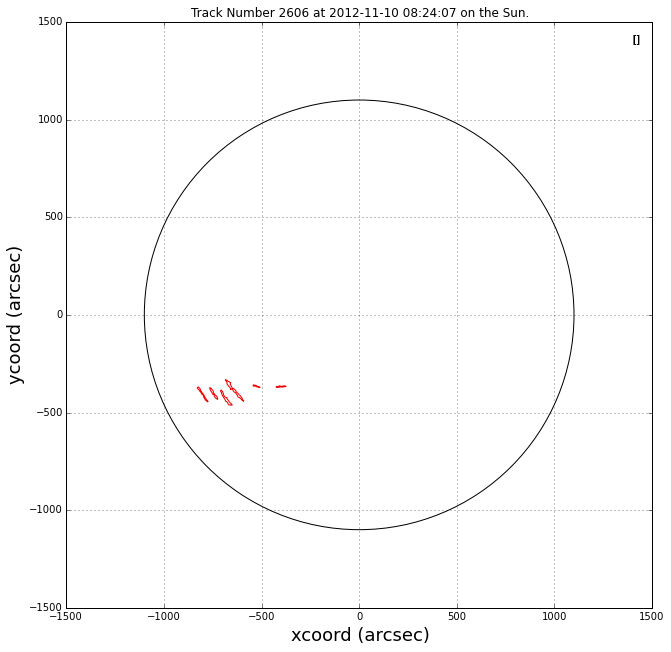

2012-11-13 17:35:37
2012-11-14 19:08:04
2012-11-16 09:05:28
2012-11-17 08:00:26
2012-11-18 09:38:49
2012-11-19 18:20:03
2012-11-20 18:39:17
2012-11-21 18:00:21
2012-11-23 07:58:05
2012-11-24 08:00:01


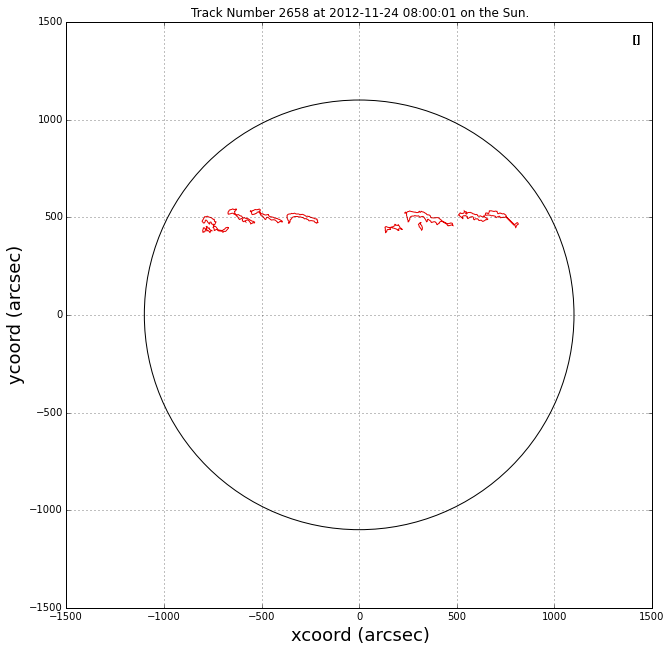

2012-11-13 17:35:37
2012-11-14 19:08:04
2012-11-16 09:05:28
2012-11-17 08:00:26
2012-11-18 09:38:49
2012-11-19 18:20:03
2012-11-20 18:39:17


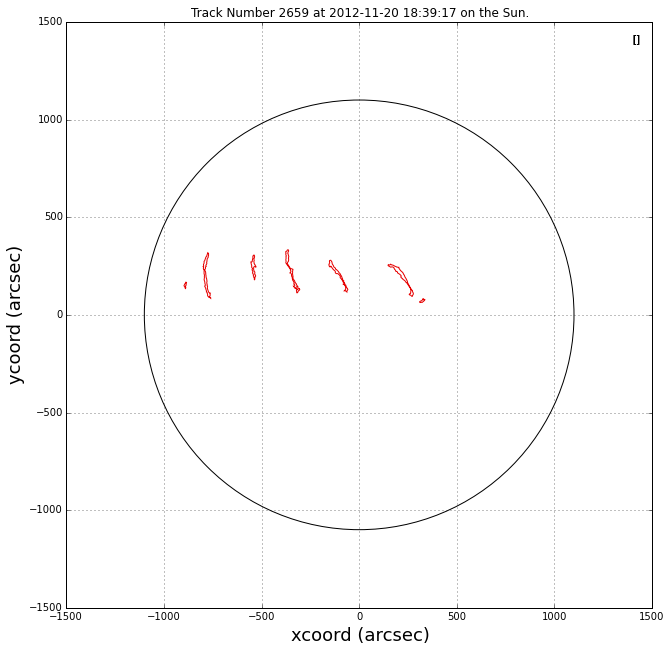

2012-11-18 09:38:49
2012-11-19 18:20:03
2012-11-20 18:39:17
2012-11-21 18:00:21
2012-11-23 07:58:05
2012-11-24 08:00:01
2012-11-25 08:45:27
2012-11-26 19:08:34


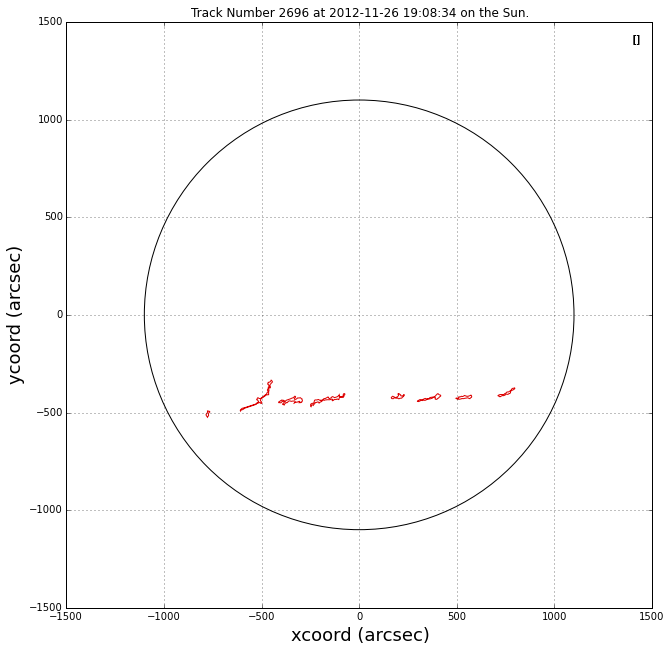

2012-11-20 18:39:17
2012-11-21 18:00:21
2012-11-23 07:58:05
2012-11-24 08:00:01
2012-11-25 08:45:27
2012-11-26 19:08:34


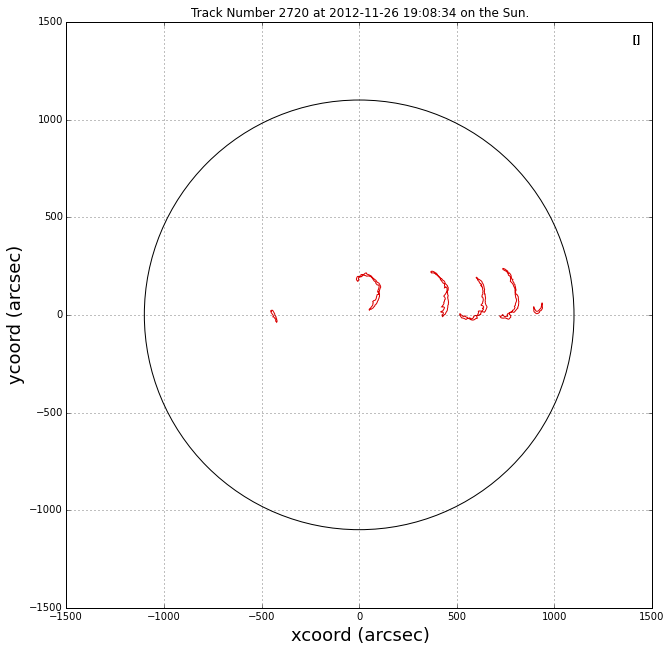

2012-12-03 10:08:41
2012-12-03 18:56:14
2012-12-04 18:57:58
2012-12-05 18:25:46
2012-12-06 18:37:41
2012-12-07 18:52:56
2012-12-09 11:29:24
2012-12-10 08:56:16


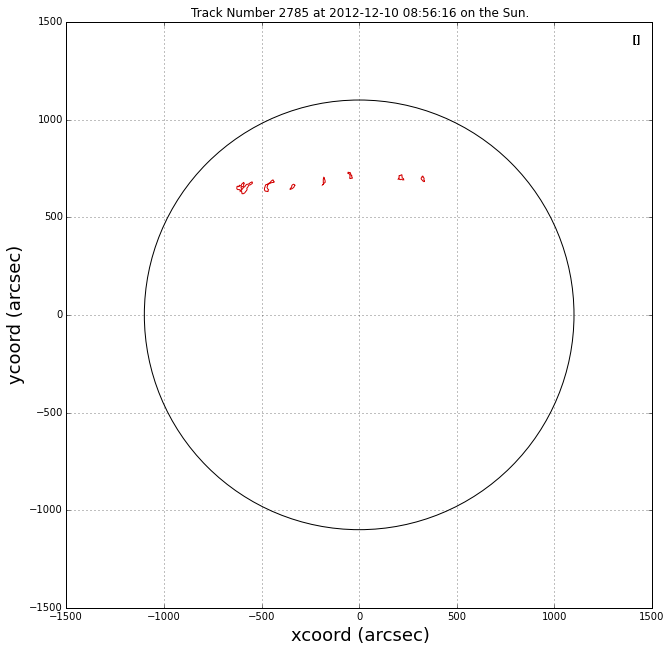

2012-12-03 10:08:41
2012-12-03 18:56:14
2012-12-04 18:57:58
2012-12-05 07:58:34
2012-12-05 18:25:46
2012-12-06 07:48:11
2012-12-07 07:58:02
2012-12-07 18:52:56


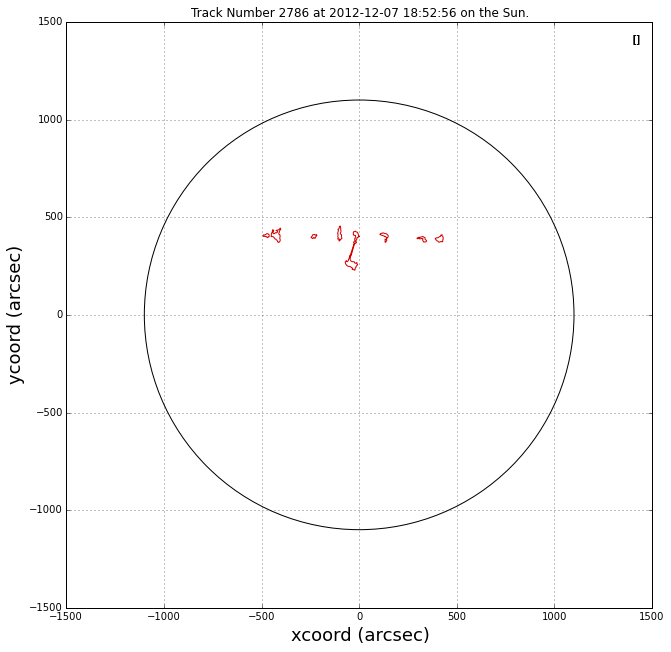

2012-12-03 10:08:41
2012-12-03 18:56:14
2012-12-04 18:57:58
2012-12-05 07:58:34
2012-12-06 07:48:11
2012-12-06 18:37:41
2012-12-07 07:58:02


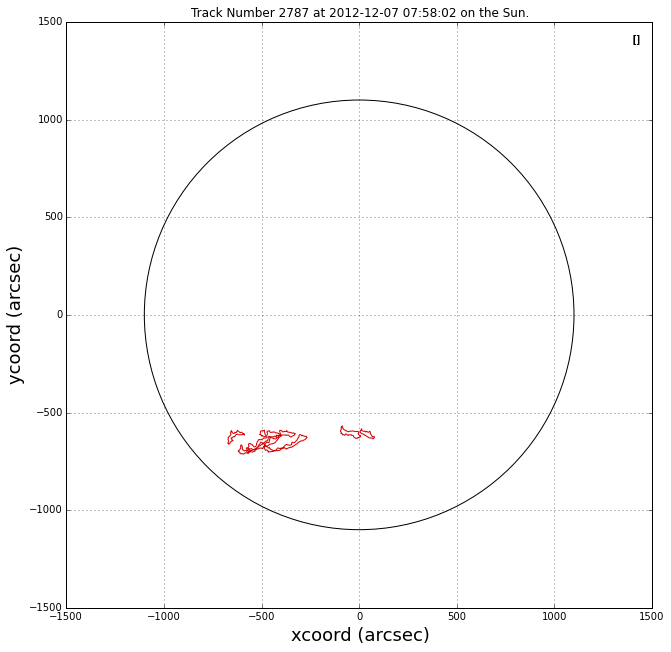

2012-12-03 10:08:41
2012-12-03 18:56:14
2012-12-04 18:57:58
2012-12-05 07:58:34
2012-12-06 07:48:11
2012-12-06 18:37:41
2012-12-07 07:58:02


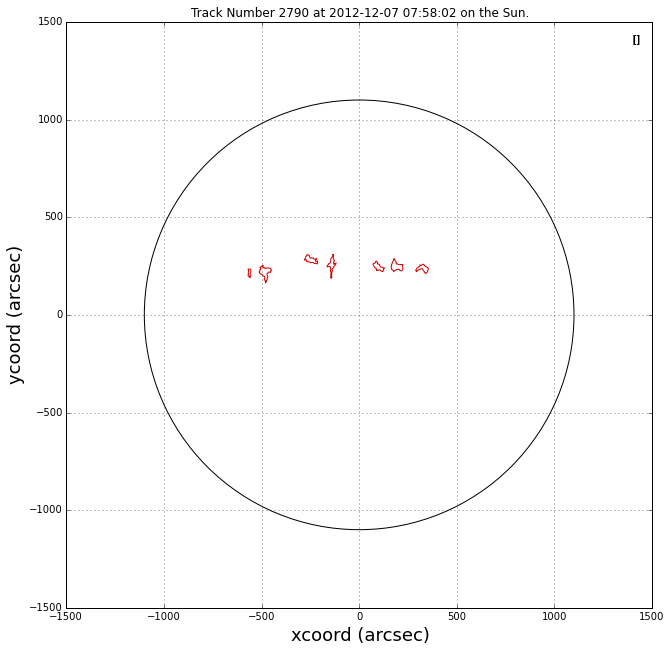

2012-12-03 10:08:41
2012-12-03 18:56:14
2012-12-04 18:57:58
2012-12-05 18:25:46
2012-12-06 18:37:41
2012-12-07 18:52:56


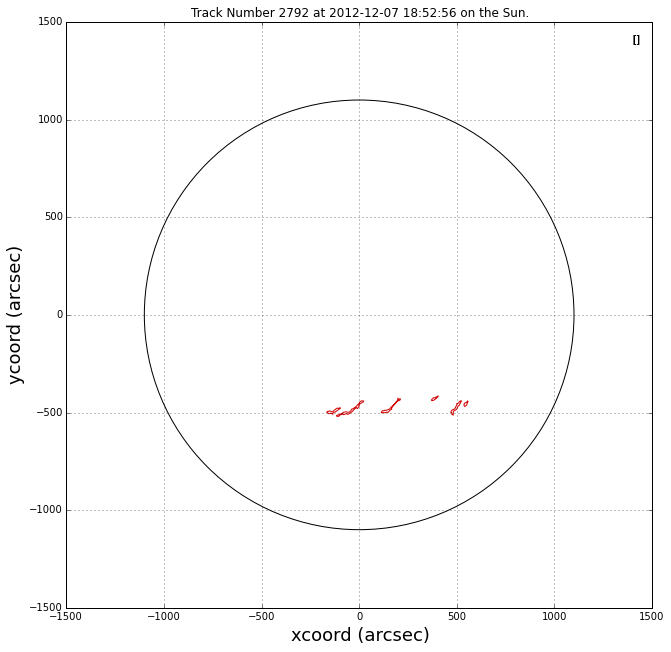

2012-12-03 18:56:14
2012-12-05 18:25:46
2012-12-06 18:37:41
2012-12-09 11:29:24
2012-12-10 08:56:16
2012-12-10 18:45:23


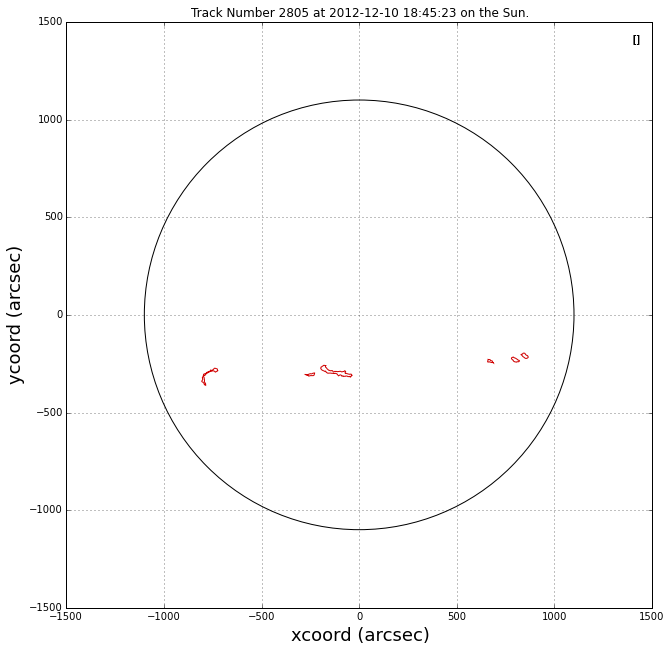

2012-12-05 07:58:34
2012-12-05 18:25:46
2012-12-06 07:48:11
2012-12-07 07:58:02
2012-12-07 18:52:56
2012-12-09 11:29:24
2012-12-10 08:56:16
2012-12-10 18:45:23
2012-12-11 09:50:06
2012-12-12 10:31:28


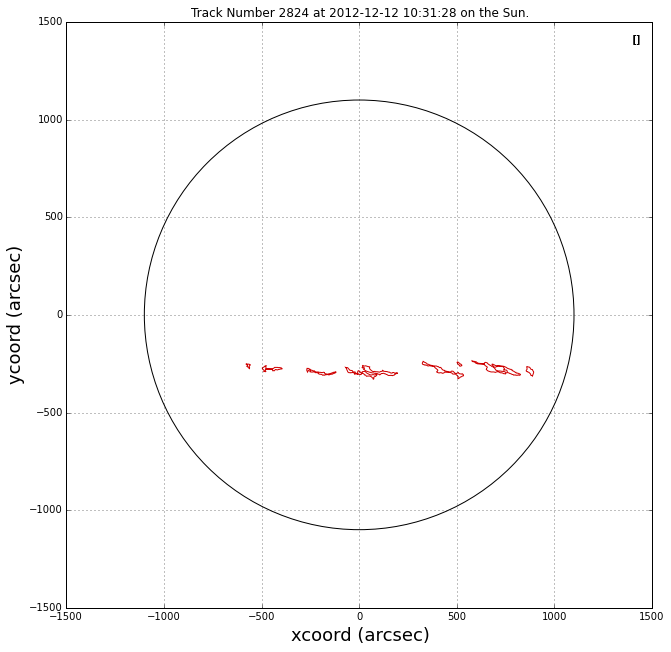

2012-12-05 07:58:34
2012-12-05 18:25:46
2012-12-06 07:48:11
2012-12-06 18:37:41
2012-12-07 07:58:02
2012-12-07 18:52:56
2012-12-09 11:29:24
2012-12-10 08:56:16
2012-12-10 18:45:23
2012-12-12 10:31:28


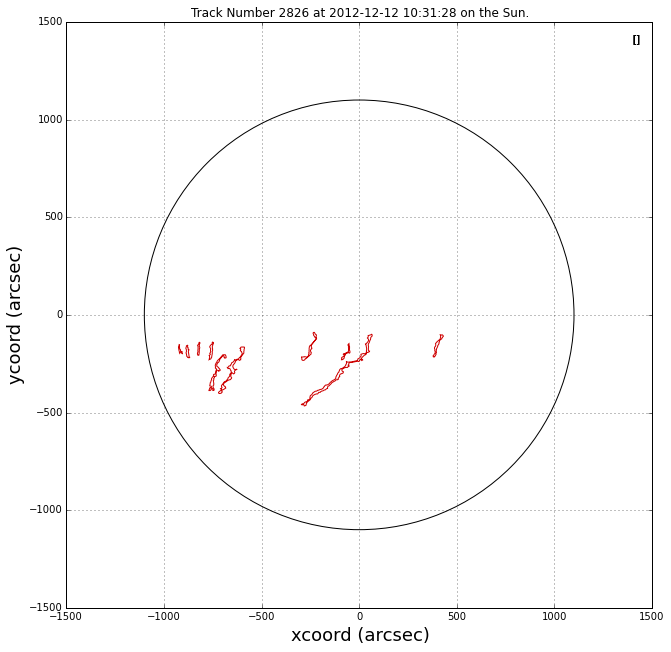

2012-12-05 18:25:46
2012-12-06 07:48:11
2012-12-06 18:37:41
2012-12-07 07:58:02
2012-12-07 18:52:56
2012-12-09 11:29:24
2012-12-10 08:56:16
2012-12-10 18:45:23
2012-12-11 09:50:06
2012-12-12 10:31:28
2012-12-13 08:50:18
2012-12-14 10:34:27


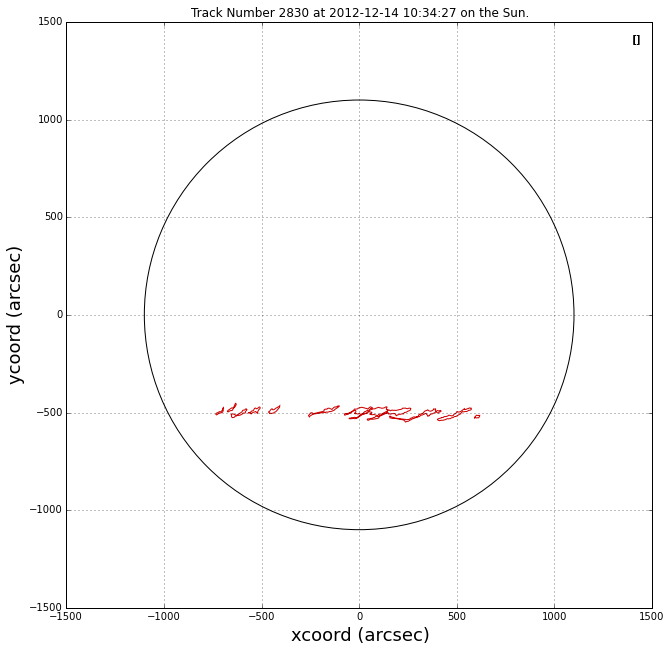

2012-12-05 18:25:46
2012-12-06 07:48:11
2012-12-06 18:37:41
2012-12-07 07:58:02
2012-12-07 18:52:56
2012-12-09 11:29:24
2012-12-10 08:56:16
2012-12-10 18:45:23
2012-12-11 09:50:06
2012-12-12 10:31:28
2012-12-13 08:50:18
2012-12-14 10:34:27


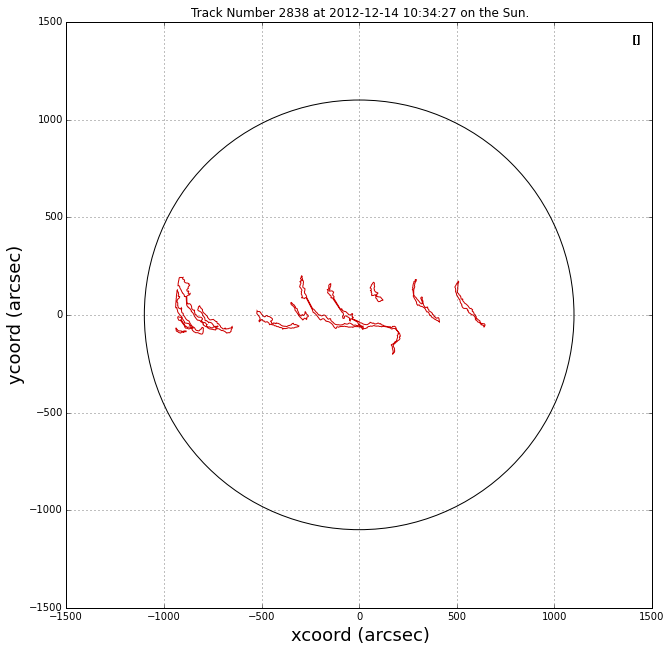

2012-12-06 07:48:11
2012-12-06 18:37:41
2012-12-07 07:58:02
2012-12-07 18:52:56
2012-12-09 11:29:24
2012-12-10 08:56:16


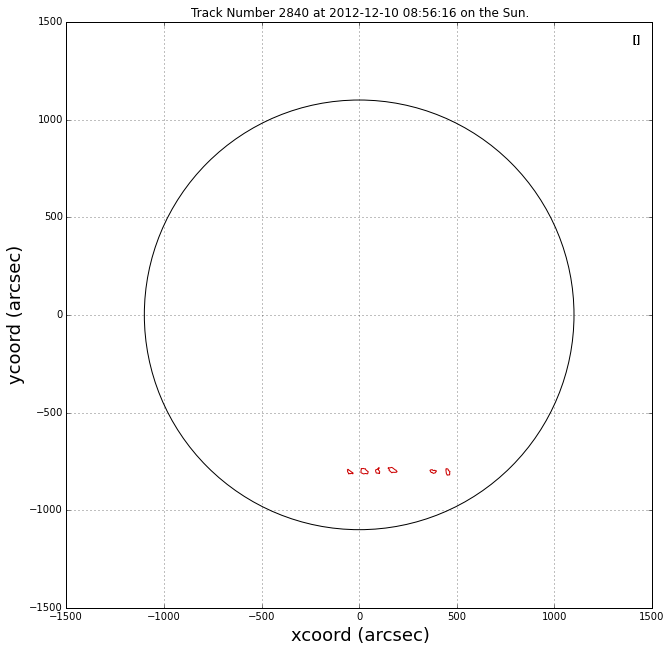

2012-12-06 07:48:11
2012-12-06 18:37:41
2012-12-07 07:58:02
2012-12-09 11:29:24
2012-12-10 08:56:16
2012-12-10 18:45:23
2012-12-11 09:50:06


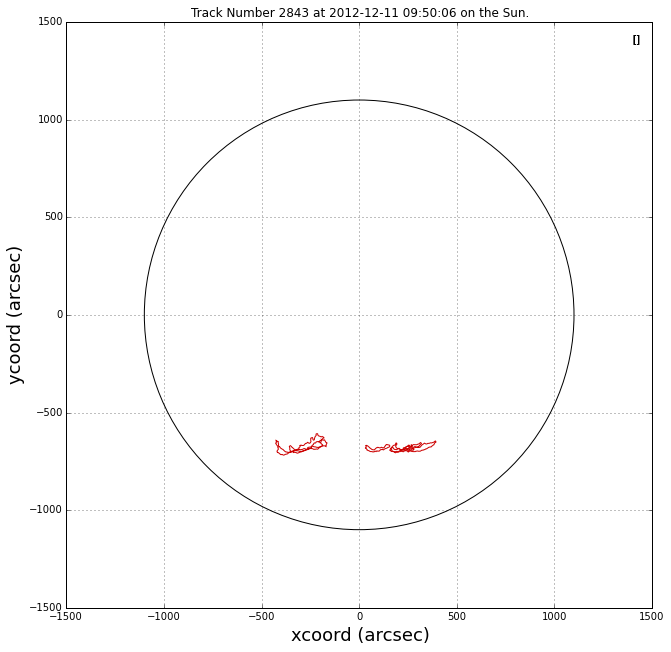

2012-12-09 11:29:24
2012-12-10 08:56:16
2012-12-11 09:50:06
2012-12-12 10:31:28
2012-12-13 08:50:18
2012-12-14 10:34:27


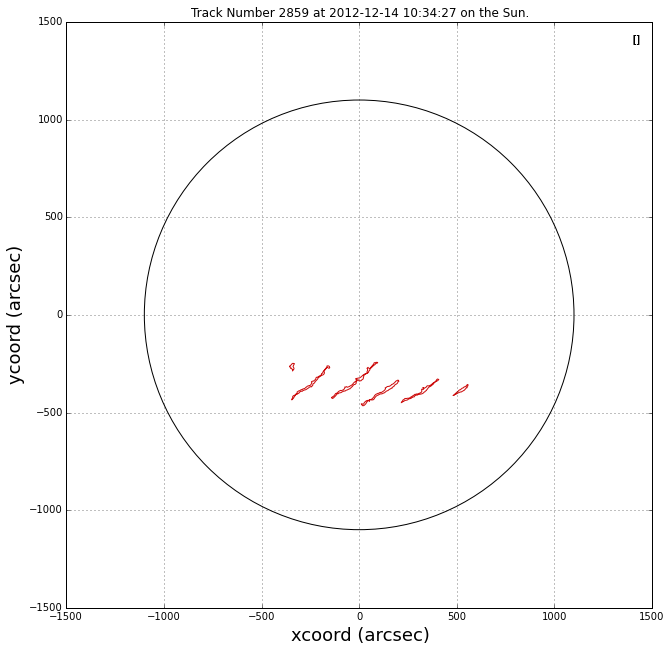

2012-12-09 11:29:24
2012-12-10 08:56:16
2012-12-11 09:50:06
2012-12-12 10:31:28
2012-12-13 08:50:18
2012-12-14 10:34:27


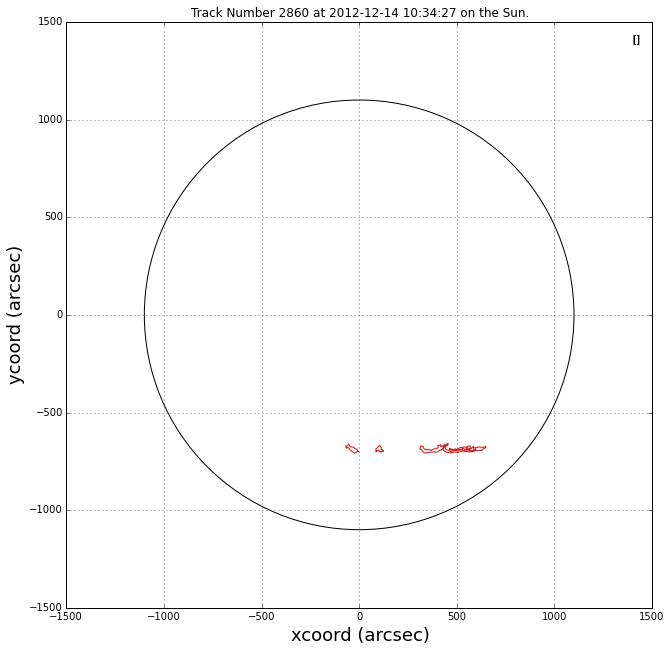

2012-12-12 10:31:28
2012-12-13 08:50:18
2012-12-16 10:01:40
2012-12-18 08:03:44
2012-12-19 08:34:56
2012-12-19 19:27:40
2012-12-20 08:28:22
2012-12-20 18:06:33
2012-12-21 18:29:31


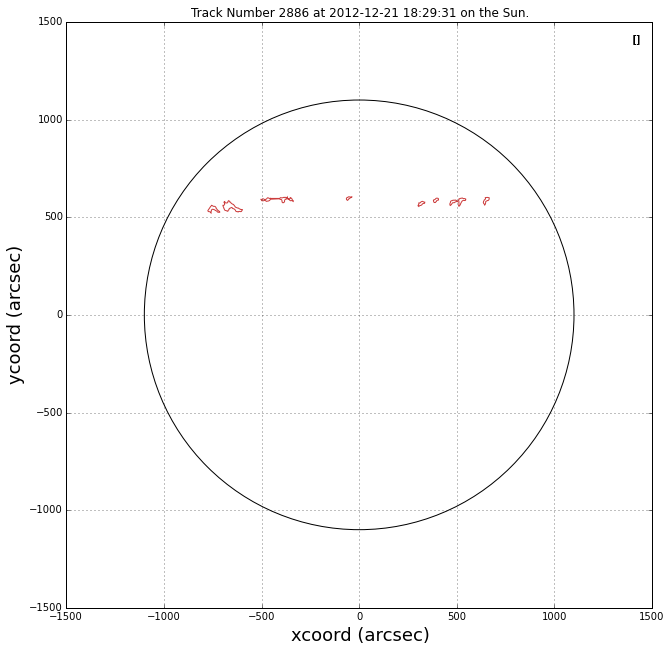

2012-12-14 10:34:27
2012-12-16 10:01:40
2012-12-17 19:28:35
2012-12-18 08:03:44
2012-12-19 08:34:56
2012-12-19 19:27:40
2012-12-20 08:28:22


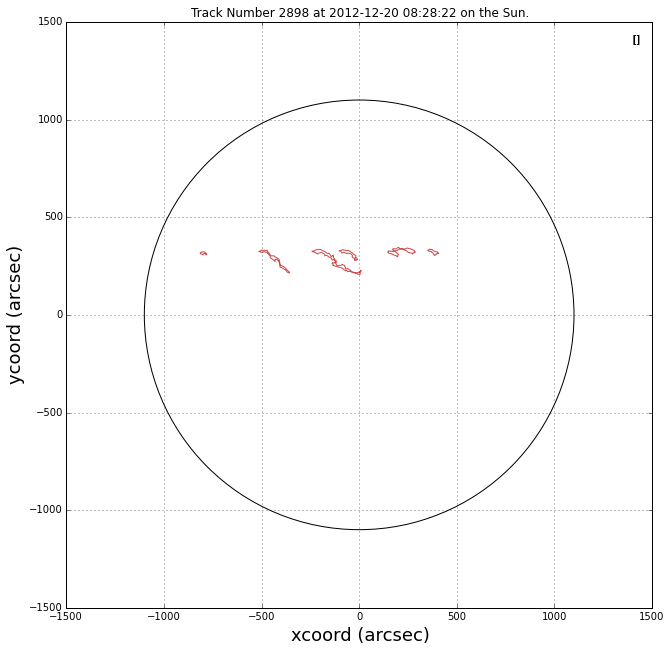

2012-12-16 10:01:40
2012-12-17 19:28:35
2012-12-19 19:27:40
2012-12-20 08:28:22
2012-12-20 18:06:33
2012-12-22 09:19:23
2012-12-23 11:10:35
2012-12-24 09:12:12
2012-12-25 10:47:50


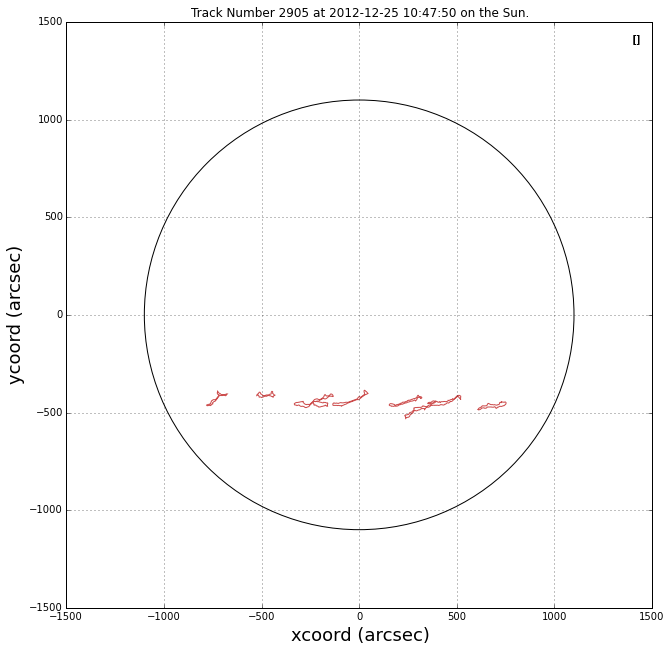

2012-12-17 19:28:35
2012-12-19 19:27:40
2012-12-20 08:28:22
2012-12-20 18:06:33
2012-12-22 09:19:23
2012-12-24 09:12:12
2012-12-25 10:47:50


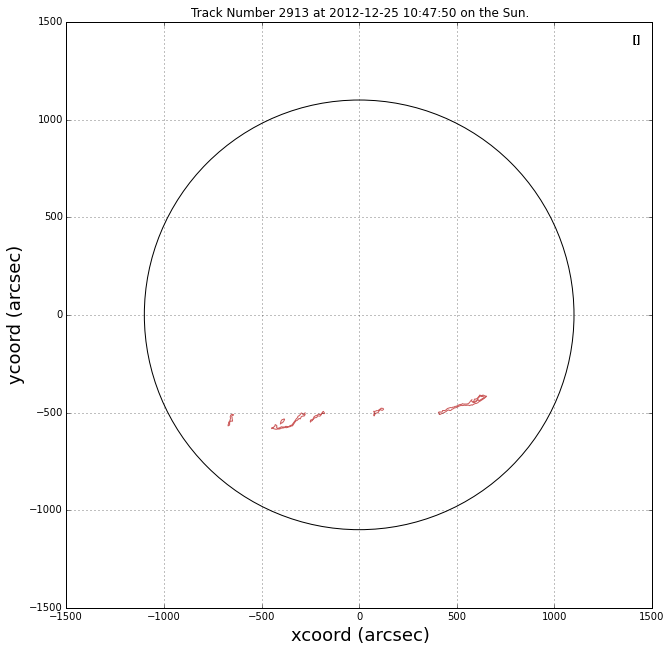

2012-12-17 19:28:35
2012-12-18 08:03:44
2012-12-19 08:34:56
2012-12-19 19:27:40
2012-12-20 08:28:22
2012-12-20 18:06:33


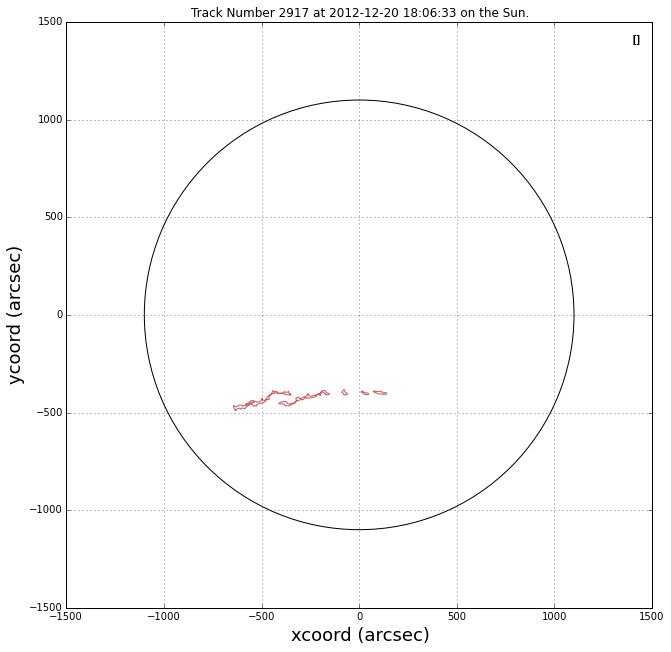

2012-12-19 08:34:56
2012-12-19 19:27:40
2012-12-20 08:28:22
2012-12-20 18:06:33
2012-12-21 18:29:31
2012-12-23 11:10:35


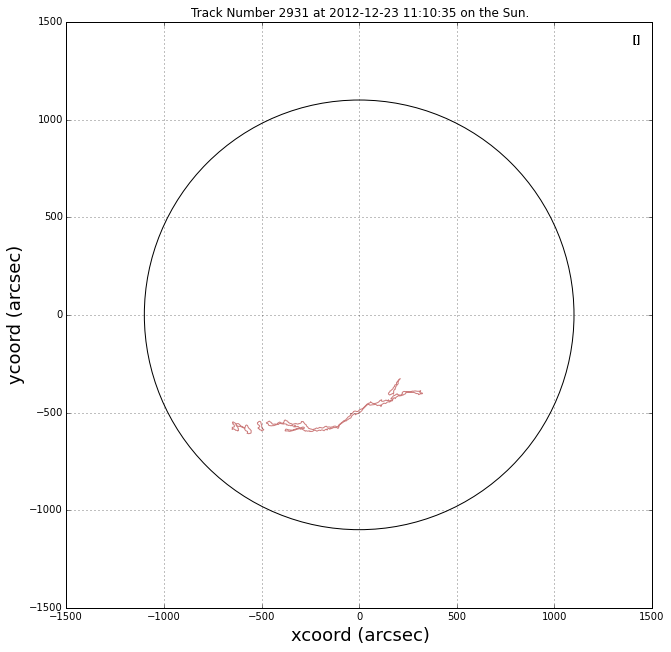

In [25]:
 ###new updated eruption list for each track 
tot=[]
unique=[]
erupind=[]
for tracks in non_erup:
    tot.append(unique)
    unique=[]
    for i in range(0, len(good_tracks)):
        if tracks == good_tracks['Track No.'][i]:
            unique.append(i)
            
for item in tot:
    colorscale2=[]
    norm = mpl.colors.Normalize(vmin=0, vmax=3000)
    cmap = plt.get_cmap('nipy_spectral')
    m = cm.ScalarMappable(norm=norm, cmap=cmap)
    for thing1 in non_erup: #plotting those filaments that have eruptions contained within them
        scaleR= m.to_rgba(thing1) 
        colorscale2.append(scaleR)
####plots eruptions/sun
    plt.grid(True)
    plt.ylabel('ycoord (arcsec)',fontsize=18)
    plt.xlabel('xcoord (arcsec)',fontsize=18)
    plt.axis([-1500, 1500, -1500, 1500])
    fig1 = plt.gcf()
    Sun=plt.Circle((0,0), radius=1100, color='black', fill=False)
    plt.gcf().gca().add_artist(Sun)
    fig1.set_size_inches(10.5,10.5)
    ax = fig1.add_subplot(111)
    ax.set_aspect('equal')
        ##############################
    for i in range(0, len(item)):
        j=item[i]
        trnum=  good_tracks['Track No.'][j]
        stime=  good_tracks['HEK_time'][j]
        print stime
        for thing1 in corresponding:
            if thing1[0] == trnum:
                erupind=[]
        verup=[indices[i] for i in erupind]   #getting the eruption index from a list of possible indices
        erupind=[]
        filtered4=[eruptions[k] for k in verup]
        longitude = [elem["hpc_x"]for elem in filtered4]
        latitude = [elem["hpc_y"] for elem in filtered4]
        erup_t = [elem["event_starttime"] for elem in filtered4]
        for thing2 in erup_t:
            tim = (parse_time(thing2))
        plt.text(1400,1400,str(erup_t))
        fig=plt.scatter(longitude,latitude, c = 'grey',s=50)
        scale2=m.to_rgba(good_tracks['Track No.'][j])
        plot_polygon=plt.Polygon(loads(good_tracks['HPC_BB_Poly'][j]).exterior,color=scale2,linewidth=1,fill=None)
        fig1.gca().add_artist(plot_polygon)
        plt.title('Track Number %(Trackno)d at %(starttime)s on the Sun.' % {"Trackno" : trnum, "starttime": stime})
    plt.show()